In [1]:
from sklearn.neighbors import KNeighborsClassifier

from sklearnex import patch_sklearn, config_context
patch_sklearn()

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import numpy as np
import phik

from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import NearestNeighbors
import numpy as np

from sklearn.model_selection import train_test_split

from optbinning import OptimalBinning
from sklearn.tree import DecisionTreeClassifier

import re
import ast
import pickle

import lightgbm as lgb
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import roc_auc_score, precision_recall_curve, f1_score, accuracy_score, precision_score, recall_score
from sklearn.metrics import confusion_matrix, classification_report, roc_curve, auc
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GridSearchCV, StratifiedKFold, RandomizedSearchCV
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.preprocessing import StandardScaler, RobustScaler
from sklearn.neighbors import NearestNeighbors, KNeighborsRegressor

from imblearn.over_sampling import SMOTE
from sklearn.model_selection import cross_val_score, StratifiedKFold
import time

import xgboost as xgb

from sklearn.svm import SVC
from sklearn.ensemble import GradientBoostingClassifier, RandomForestClassifier, VotingClassifier
from sklearn.model_selection import GridSearchCV, StratifiedKFold, RandomizedSearchCV
from sklearn.metrics import roc_auc_score, accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, roc_curve
from sklearn.feature_selection import SelectFromModel
import seaborn as sns

from tqdm import tqdm  

import optuna


Intel(R) Extension for Scikit-learn* enabled (https://github.com/uxlfoundation/scikit-learn-intelex)


# READ and Functions

In [2]:
df = pd.read_csv('application_data.csv')
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 19 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   SK_ID_CURR                  10000 non-null  int64  
 1   EXT_SOURCE_1                4186 non-null   float64
 2   EXT_SOURCE_2                9979 non-null   float64
 3   EXT_SOURCE_3                7814 non-null   float64
 4   DAYS_BIRTH                  10000 non-null  int64  
 5   DAYS_ID_PUBLISH             10000 non-null  int64  
 6   DAYS_EMPLOYED               10000 non-null  int64  
 7   AMT_CREDIT                  10000 non-null  float64
 8   CNT_CHILDREN                10000 non-null  int64  
 9   CNT_FAM_MEMBERS             10000 non-null  float64
 10  OCCUPATION_TYPE             7203 non-null   object 
 11  NAME_EDUCATION_TYPE         10000 non-null  object 
 12  CODE_GENDER                 10000 non-null  object 
 13  AMT_REQ_CREDIT_BUREAU_MON   8435

In [3]:
df.columns

Index(['SK_ID_CURR', 'EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3',
       'DAYS_BIRTH', 'DAYS_ID_PUBLISH', 'DAYS_EMPLOYED', 'AMT_CREDIT',
       'CNT_CHILDREN', 'CNT_FAM_MEMBERS', 'OCCUPATION_TYPE',
       'NAME_EDUCATION_TYPE', 'CODE_GENDER', 'AMT_REQ_CREDIT_BUREAU_MON',
       'AMT_REQ_CREDIT_BUREAU_YEAR', 'AMT_ANNUITY', 'AMT_INCOME_TOTAL',
       'ORGANIZATION_TYPE', 'TARGET'],
      dtype='object')

In [4]:
def plot_phik_matrix(data, categorical_columns, figsize=(20, 20), mask_upper=True, tight_layout=True,
                     linewidth=0.1, fontsize=10, cmap='Greens', show_target_top_corr=True, target_top_columns=10):
    data_for_phik = data[categorical_columns].astype('object')
    phik_mat = data_for_phik.join(data['TARGET']).phik_matrix()

    if mask_upper:
        mask_array = np.triu(np.ones(phik_mat.shape))
    else:
        mask_array = np.zeros(phik_mat.shape)

    plt.figure(figsize=figsize, tight_layout=tight_layout)
    sns.heatmap(phik_mat, annot=False, mask=mask_array, linewidth=linewidth, cmap=cmap)
    plt.xticks(rotation=90, fontsize=fontsize)
    plt.yticks(rotation=0, fontsize=fontsize)
    plt.title("Phi-K Correlation Heatmap for Categorical Features")
    plt.show()

    if show_target_top_corr and 'TARGET' in phik_mat.columns:
        print("Categories with highest values of Phi-K Correlation value with Target Variable are:")
        phik_target_corr = phik_mat['TARGET'].drop('TARGET', errors='ignore').sort_values(ascending=False)
        phik_df = pd.DataFrame({
            'Column Name': phik_target_corr.index,
            'Phik-Correlation': phik_target_corr.values
        })
        display(phik_df.head(target_top_columns))

    


In [5]:
class correlation_matrix:
    
    def __init__(self, data, columns_to_drop, figsize = (25,23), mask_upper = True, tight_layout = True, 
                  linewidth = 0.1, fontsize = 10, cmap = 'Blues'):  

        self.data = data
        self.columns_to_drop = columns_to_drop
        self.figsize = figsize
        self.mask_upper = mask_upper
        self.tight_layout = tight_layout
        self.linewidth = linewidth
        self.fontsize = fontsize
        self.cmap = cmap 
                 
    def plot_correlation_matrix(self):
        '''
        Function to plot the Correlation Matrix Heatmap
        
        Inputs:
            self
        
        Returns:
            None
        '''
        
        self.corr_data = self.data.drop(self.columns_to_drop, axis = 1).corr()

        if self.mask_upper:
            mask_array = np.ones(self.corr_data.shape)
            mask_array = np.triu(mask_array)
        else:
            mask_array = np.zeros(self.corr_data.shape)

        plt.figure(figsize = self.figsize, tight_layout = self.tight_layout)
        sns.heatmap(self.corr_data, annot = False, mask = mask_array, linewidth = self.linewidth, cmap = self.cmap)
        plt.xticks(rotation = 90, fontsize = self.fontsize)
        plt.yticks(fontsize = self.fontsize)
        plt.title("Correlation Heatmap for Numerical features")
        plt.show()
    
    def target_top_corr(self, target_top_columns=10):
        """
        Calculate phik correlation with target variable for all features
        Returns sorted dataframe with top correlations
        
        Parameters:
        -----------
        target_top_columns : int
            Number of top correlations to return
            
        Returns:
        --------
        pd.DataFrame
            Dataframe with columns and their phik correlation with target
        """
        import numpy as np
        import pandas as pd
        
        phik_target_arr = []
        column_names = []
        
        # Use tqdm for progress tracking if available
        try:
            from tqdm.notebook import tqdm
            iterator = tqdm(enumerate(self.corr_data.columns), total=len(self.corr_data.columns))
        except ImportError:
            iterator = enumerate(self.corr_data.columns)
        
        for index, column in iterator:
            # Skip the target column itself
            if column == 'TARGET':
                continue
                
            try:
                # Create a clean subset without NaN values
                subset = self.data[['TARGET', column]].dropna()
                
                # Skip if either column has only one unique value (would cause singular matrix)
                if (subset['TARGET'].nunique() <= 1) or (subset[column].nunique() <= 1):
                    continue
                    
                # Calculate phik correlation
                phik_result = subset.phik_matrix()
                
                # Only add if we got a proper 2x2 matrix
                if phik_result.shape == (2, 2):
                    phik_value = phik_result.iloc[0, 1]
                    phik_target_arr.append(phik_value)
                    column_names.append(column)
            except Exception as e:
                # Skip column on error
                print(f"Error with column {column}: {e}")
                pass
        
        # Create dataframe with results
        top_corr_target_df = pd.DataFrame({
            'Column Name': column_names,
            'Phik-Correlation': phik_target_arr
        })
        
        # Sort by correlation value
        top_corr_target_df = top_corr_target_df.sort_values(
            by='Phik-Correlation', 
            ascending=False
        )
        
        # Return top columns or all if requested
        if target_top_columns > 0:
            return top_corr_target_df.head(target_top_columns)
        else:
            return top_corr_target_df

In [6]:
def plot_categorical_variables_pie(data, column_names, plot_defaulter=True, hole=0):
    for column_name in column_names:
        if plot_defaulter:
            cols = 2
            specs = [[{'type' : 'domain'}, {'type' : 'domain'}]]
            titles = [f'Distribution of {column_name} for all Targets', f'Percentage of Defaulters for each category of {column_name}']
        else:
            cols = 1
            specs = [[{'type': 'domain'}]]
            titles = [f'Distribution of {column_name} for all Targets']
            
        values_categorical = data[column_name].value_counts()
        labels_categorical = values_categorical.index
        
        custom_colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b']

        
        fig = make_subplots(rows = 1, cols = cols, 
                        specs = specs, 
                        subplot_titles = titles)
        
        fig.add_trace(go.Pie(values = values_categorical, labels = labels_categorical, hole = hole, 
                            textinfo = 'label+percent', textposition = 'inside'), row = 1, col = 1)
        
        if plot_defaulter:
            percentage_defaulter_per_category = data[column_name][data.TARGET == 1].value_counts() * 100 / data[column_name].value_counts()
            percentage_defaulter_per_category.dropna(inplace = True)
            percentage_defaulter_per_category = percentage_defaulter_per_category.round(2)
            
            fig.add_trace(go.Pie(values = percentage_defaulter_per_category, labels = percentage_defaulter_per_category.index, 
                                hole = hole, textinfo = 'label+value', hoverinfo = 'label+value'), row = 1, col = 2)
            
        fig.update_layout(title = f'Distribution of {column_name}')
        fig.show()

In [7]:
def plot_categorical_variables_bar(data, column_names, figsize=(18,6), percentage_display=True, plot_defaulter=True, rotation=0, horizontal_adjust=0, fontsize_percent='xx-small'):    
    for column_name in column_names:
        print(f"Total Number of unique categories of {column_name} = {len(data[column_name].unique())}")
        
        plt.figure(figsize=figsize, tight_layout=False)
        sns.set(style='whitegrid', font_scale=1.2)
        
        plt.subplot(1,2,1)
        data_to_plot = data[column_name].value_counts().sort_values(ascending=False)
        ax = sns.barplot(x=data_to_plot.index, y=data_to_plot, hue=data_to_plot.index, palette='Greens', legend=False)
        
        if percentage_display:
            total_datapoints = len(data[column_name].dropna())
            for p in ax.patches:
                ax.text(p.get_x() + horizontal_adjust, p.get_height() + 0.005 * total_datapoints, '{:1.02f}%'.format(p.get_height() * 100 / total_datapoints), fontsize=fontsize_percent)
            
        plt.xlabel(column_name, labelpad=10)
        plt.title(f'Distribution of {column_name}', pad=20)
        plt.xticks(rotation=rotation)
        plt.ylabel('Counts')
        
        if plot_defaulter:
            percentage_defaulter_per_category = (data[column_name][data.TARGET == 1].value_counts() * 100 / data[column_name].value_counts()).dropna().sort_values(ascending=False)

            plt.subplot(1,2,2)
            sns.barplot(x=percentage_defaulter_per_category.index, y=percentage_defaulter_per_category, 
                        hue=percentage_defaulter_per_category.index, palette='Set2', legend=False)
            plt.ylabel('Percentage of Defaulter per category')
            plt.xlabel(column_name, labelpad=10)
            plt.xticks(rotation=rotation)
            plt.title(f'Percentage of Defaulters for each category of {column_name}', pad=20)
        plt.show()

In [8]:
def visualize_missing_data(df):
    nan_percentage = df.isnull().mean() * 100
    nan_percentage = nan_percentage[nan_percentage > 0]
    nan_percentage = nan_percentage.sort_values(ascending=False)
    print (len(nan_percentage))
    
    plt.figure(figsize=(12,6))
    ax = sns.barplot(x=nan_percentage.index, y=nan_percentage.values, palette='Blues_d')  
    
    plt.title('Percentage of Missing Values by Column', fontsize=16)
    plt.xlabel('Columns', fontsize=14)
    plt.ylabel('Percentage of Missing Data (%)', fontsize=14)
    plt.xticks(rotation=90, ha='right')  
    

    plt.tight_layout()  
    plt.show()

    return nan_percentage



In [9]:
def univariate_barplots_prev(data, col1, col2 = "NAME_CONTRACT_STATUS", top=False):
    data[col1] = data[col1].fillna('Missing')

    temp = data.groupby([col1, col2]).size().unstack(fill_value=0).reset_index()
    total_count = len(data)

    for col in temp.columns[1:]:
        temp[col] = (temp[col] / total_count) * 100  

    if top:
        temp = temp.sort_values(by='total', ascending=False).head(10)

    return temp

def stack_plot_prev(data, xticks, col2 = "NAME_CONTRACT_STATUS", col3='total', figsize=(18, 6), rotation=0, horizontal_adjust=0, fontsize_percent='xx-small', plot_defaulter=True):
    for xtick in xticks:
        temp = univariate_barplots_prev(data, xtick, col2)
        ind = np.arange(temp.shape[0])
        temp['total_sum'] = temp.iloc[:, 1:].sum(axis=1)
        
        max_value = temp['total_sum'].max()

        fig, axes = plt.subplots(1, 3, figsize=figsize)
        colors = plt.cm.Paired(np.linspace(0, 1, temp.shape[1] - 1))
        bottom_data = np.zeros(temp.shape[0])
        
        for i, col in enumerate(temp.columns[1:-1]): 
            axes[0].bar(ind, temp[col].values, bottom=bottom_data, color=colors[i], label=col)
            bottom_data += temp[col].values  

        axes[0].set_ylabel('Percentage')
        axes[0].set_title(f'{col2} vs {xtick}')
        axes[0].set_xticks(ind)
        axes[0].set_xticklabels(temp[xtick].values, rotation=rotation)

        axes[0].set_ylabel('Percentage')
        axes[0].set_title(f'{col2} vs {xtick}')
        axes[0].set_xticks(ind)
        axes[0].set_xticklabels(temp[xtick].values, rotation=rotation)
        axes[0].set_ylim(0, max_value)
        axes[0].set_ylabel('Percentage (%)')
        axes[0].set_title(f'{col2} distribution by {xtick}')
        axes[0].set_xticks(ind)
        axes[0].set_xticklabels(temp[xtick], rotation=rotation)
        axes[0].legend(loc='upper left', bbox_to_anchor=(1, 1), fontsize=fontsize_percent)
        plt.xticks(rotation=rotation, ha='right')  


        if plot_defaulter:
            percentage_defaulter_per_category = (data[xtick][data.TARGET == 1].value_counts() * 100 / data[xtick].value_counts()).dropna().sort_values(ascending = False)

            axes[1].bar(percentage_defaulter_per_category.index, percentage_defaulter_per_category.values, color='salmon')
            axes[1].set_ylabel('Percentage of Defaulters (%)')
            axes[1].set_xlabel(f'{xtick} categories', labelpad=10)
            axes[1].set_title(f'Percentage of Defaulters for each {xtick}')
            axes[1].set_xticklabels(percentage_defaulter_per_category.index, rotation=rotation, ha='right')



        percentage_defaulter_per_aa = (data[xtick][data.TARGET == 1].value_counts() * 100 / len(data)).dropna().sort_values(ascending=False)

        axes[2].bar(percentage_defaulter_per_aa.index, percentage_defaulter_per_aa.values, color='green')
        axes[2].set_ylabel('Percentage of Defaulters (%)')
        axes[2].set_xlabel(f'{xtick} categories', labelpad=10)
        axes[2].set_title(f'Percentage of Defaulters for each {xtick} in all defaulters')

        plt.tight_layout()
        plt.xticks(rotation=rotation, ha='right')  

        plt.show()

In [10]:
def plot_continuous_variables(data, columns, plots = ['distplot', 'CDF', 'box'], scale_limits = None, figsize = (20,8), histogram = True, log_scale = False):
    for column_name in columns:
        data_to_plot = data.copy()
        if scale_limits:
            data_to_plot[column_name] = data[column_name][(data[column_name] > scale_limits[0]) & (data[column_name] < scale_limits[1])]

        number_of_subplots = len(plots)
        plt.figure(figsize = figsize)
        sns.set_style('whitegrid')
        
        for i, ele in enumerate(plots):
            plt.subplot(1, number_of_subplots, i + 1)
            plt.subplots_adjust(wspace=0.25)
            
            if ele == 'CDF':
                percentile_values_0 = data_to_plot[data_to_plot.TARGET == 0][[column_name]].dropna().sort_values(by = column_name)
                percentile_values_0['Percentile'] = [ele / (len(percentile_values_0)-1) for ele in range(len(percentile_values_0))]
                
                percentile_values_1 = data_to_plot[data_to_plot.TARGET == 1][[column_name]].dropna().sort_values(by = column_name)
                percentile_values_1['Percentile'] = [ele / (len(percentile_values_1)-1) for ele in range(len(percentile_values_1))]
                
                plt.plot(percentile_values_0[column_name], percentile_values_0['Percentile'], color = 'red', label = 'Non-Defaulters')
                plt.plot(percentile_values_1[column_name], percentile_values_1['Percentile'], color = 'black', label = 'Defaulters')
                plt.xlabel(column_name)
                plt.ylabel('Probability')
                plt.title('CDF of {}'.format(column_name))
                plt.legend(fontsize = 'medium')
                if log_scale:
                    plt.xscale('log')
                    plt.xlabel(column_name + ' - (log-scale)')
                
            if ele == 'distplot':  
                sns.histplot(data_to_plot[column_name][data['TARGET'] == 0].dropna(), label='Non-Defaulters', stat='density', kde=True, color='red')
                sns.histplot(data_to_plot[column_name][data['TARGET'] == 1].dropna(), label='Defaulters', stat='density', kde=True, color='black')
                plt.xlabel(column_name)
                plt.ylabel('Probability Density')
                plt.legend(fontsize='medium')
                plt.title("Dist-Plot of {}".format(column_name))
                if log_scale:
                    plt.xscale('log')
                    plt.xlabel(f'{column_name} (log scale)')


            if ele == 'box':  
                sns.boxplot(x='TARGET', y=column_name, data=data_to_plot)
                plt.title("Box-Plot of {}".format(column_name))
                if log_scale:
                    plt.yscale('log')
                    plt.ylabel(f'{column_name} (log Scale)')

        plt.show()

In [11]:
def count_unique_values(data):
    result_dict = {}
    
    for column in data.columns:
        unique_counts = data[column].value_counts(dropna=False)
        total = len(data[column])  
        percent_counts = round((unique_counts / total) * 100, 3)
        
        if len(unique_counts) <= 30:  
            result_dict[column] = {
                'counts': unique_counts.to_dict(),  
                'percentages': percent_counts.to_dict() 
            }
    
    return result_dict

In [12]:
mint = "#4fa9a8"
pink = "#ffc2d1"

def plot_woe_comparison_3methods(feature, df_manual, df_tree, df_opt, iv_df):
    iv_orig = iv_df.loc[iv_df["Feature"] == feature, "IV"].values[0]
    iv_manual = df_manual["iv"].sum()
    iv_tree = df_tree["iv"].sum()
    iv_opt =opt_iv_df.loc[opt_iv_df["Feature"] == feature, "IV_after_OptBinning"].values[0]

    dfs = [df_manual, df_tree, df_opt]
    methods = ["Smart Manual", "Tree-based", "OptBinning"]
    ivs = [iv_manual, iv_tree, iv_opt]

    fig, axes = plt.subplots(1, 3, figsize=(22, 5))

    for ax, method, woe_df, iv_after in zip(axes, methods, dfs, ivs):
        woe_df.set_index("bin")[["good", "bad"]].plot(
            kind="bar", stacked=True, ax=ax, color=[mint, pink], width=0.8
        )
        ax.set_title(f"{feature} ({method})\nIV: {iv_orig:.3f} → {iv_after:.3f}", fontsize=10)
        ax.set_xticklabels(woe_df["bin"], rotation=45, ha='right', fontsize=8)
        ax2 = ax.twinx()
        ax2.plot(woe_df["bin"], woe_df["bad_rate"], color='black', marker='o', linestyle='--')
        ax2.set_ylabel("Bad Rate", fontsize=8, color='black')
        ax2.tick_params(axis='y', labelcolor='black')

    plt.suptitle(f"WOE Binning Comparison - {feature}", fontsize=16, fontweight="bold")
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

# EDA

## Basic Stats and Correlation

In [13]:
df.columns

Index(['SK_ID_CURR', 'EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3',
       'DAYS_BIRTH', 'DAYS_ID_PUBLISH', 'DAYS_EMPLOYED', 'AMT_CREDIT',
       'CNT_CHILDREN', 'CNT_FAM_MEMBERS', 'OCCUPATION_TYPE',
       'NAME_EDUCATION_TYPE', 'CODE_GENDER', 'AMT_REQ_CREDIT_BUREAU_MON',
       'AMT_REQ_CREDIT_BUREAU_YEAR', 'AMT_ANNUITY', 'AMT_INCOME_TOTAL',
       'ORGANIZATION_TYPE', 'TARGET'],
      dtype='object')

In [14]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 19 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   SK_ID_CURR                  10000 non-null  int64  
 1   EXT_SOURCE_1                4186 non-null   float64
 2   EXT_SOURCE_2                9979 non-null   float64
 3   EXT_SOURCE_3                7814 non-null   float64
 4   DAYS_BIRTH                  10000 non-null  int64  
 5   DAYS_ID_PUBLISH             10000 non-null  int64  
 6   DAYS_EMPLOYED               10000 non-null  int64  
 7   AMT_CREDIT                  10000 non-null  float64
 8   CNT_CHILDREN                10000 non-null  int64  
 9   CNT_FAM_MEMBERS             10000 non-null  float64
 10  OCCUPATION_TYPE             7203 non-null   object 
 11  NAME_EDUCATION_TYPE         10000 non-null  object 
 12  CODE_GENDER                 10000 non-null  object 
 13  AMT_REQ_CREDIT_BUREAU_MON   8435

In [15]:
df.describe()

,SK_ID_CURR,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,DAYS_BIRTH,DAYS_ID_PUBLISH,DAYS_EMPLOYED,AMT_CREDIT,CNT_CHILDREN,CNT_FAM_MEMBERS,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_YEAR,AMT_ANNUITY,AMT_INCOME_TOTAL,TARGET
count,10000.000000,4186.000000,9979.000000,7814.000000,10000.000000,10000.000000,10000.000000,1.000000e+04,10000.000000,10000.000000,8435.000000,8435.000000,10000.000000,1.000000e+04,10000.000000
mean,154467.980100,0.436894,0.452523,0.441660,-15358.714000,-2838.426000,52634.907900,5.728197e+05,0.443000,2.171100,0.239953,1.957202,26667.148050,1.636436e+05,0.612100
std,89095.558978,0.212450,0.210776,0.211845,4322.938345,1520.196697,130723.260865,3.717663e+05,0.741624,0.931725,0.800783,1.907934,13272.396658,9.266561e+04,0.487296
min,0.000000,0.017095,0.000012,0.000527,-25142.000000,-6226.000000,-17170.000000,4.500000e+04,0.000000,1.000000,0.000000,0.000000,2722.500000,2.700000e+04,0.000000
25%,77447.750000,0.263773,0.285898,0.273565,-18844.250000,-4200.000000,-2368.000000,2.762775e+05,0.000000,2.000000,0.000000,0.000000,16965.000000,1.125000e+05,0.000000
50%,155142.500000,0.418592,0.499062,0.443615,-14851.000000,-2997.000000,-1068.000000,4.975200e+05,0.000000,2.000000,0.000000,2.000000,25002.000000,1.440000e+05,1.000000
75%,231827.250000,0.608226,0.628746,0.619528,-11702.750000,-1527.000000,-327.000000,7.602255e+05,1.000000,3.000000,0.000000,3.000000,33421.500000,2.025000e+05,1.000000
max,307444.000000,0.922864,0.855000,0.882530,-7678.000000,0.000000,365243.000000,2.695500e+06,11.000000,13.000000,17.000000,18.000000,225000.000000,3.150000e+06,1.000000


In [16]:
df["TARGET"].value_counts()/df.shape[0]*100

TARGET
1    61.21
0    38.79
Name: count, dtype: float64

**Data Overview**

**Dataset Dimensions**  
The dataset contains 10,000 rows and 19 columns, which is practical for both exploratory analysis and machine learning modeling. A dataset of this size allows for good statistical representation without incurring high computational costs.

**Data Types**  
- 9 float variables  
- 6 integer variables  
- 4 object (categorical) variables  

This suggests a diverse mix of numeric and categorical features, indicating that preprocessing must address both numerical scaling and categorical encoding. Realistically, this reflects how real-world financial data often includes income, age, or credit amount (numeric), alongside employment type or housing status (categorical).

**Missing Values**  
There are 13,948 missing values, approximately 7.3% of all entries. In a real-world setting, this is quite normal — clients may not provide all information, and systems may fail to record some data. Managing missing values effectively is essential, as improper imputation can introduce bias, particularly in credit scoring.

**Target Variable Distribution**  
The target variable TARGET shows:
- Default (1): 61.21%
- Non-default (0): 38.79%

**Real-life Insight**:  
In actual lending operations, defaulted cases are much rarer. However, in machine learning projects, we often balance or oversample the target variable to train more robust models. This dataset appears to already emphasize defaulters, which may help improve the model’s ability to distinguish risk patterns but could risk overfitting to a high-risk group if applied to a general population.


In [17]:
print ("duplicate",df.shape[0] - df.duplicated().shape[0])
print("file shape", df.shape)

duplicate 0
file shape (10000, 19)


In [18]:
# plot_categorical_variables_pie(df, ["TARGET"], plot_defaulter= False)

6


/tmp/ipykernel_996770/2922345595.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=nan_percentage.index, y=nan_percentage.values, palette='Blues_d')


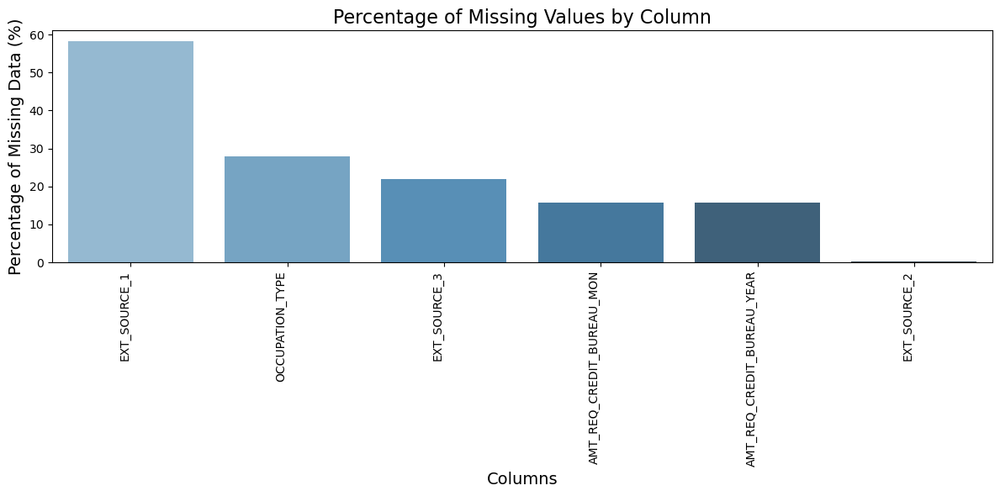

In [19]:
missing_summary = visualize_missing_data(df)

In [20]:
missing_summary

EXT_SOURCE_1                  58.14
OCCUPATION_TYPE               27.97
EXT_SOURCE_3                  21.86
AMT_REQ_CREDIT_BUREAU_MON     15.65
AMT_REQ_CREDIT_BUREAU_YEAR    15.65
EXT_SOURCE_2                   0.21
dtype: float64

**Missing Value Analysis (Standardized from Notebook)**

There are 6 features in the application dataset that contain missing values. The visualization above shows the percentage of missing entries per feature, ordered from highest to lowest.

**Key Observations:**
- EXT_SOURCE_1 has nearly 60% missing — likely due to its derivation from external or proprietary scoring data.
- OCCUPATION_TYPE missing in ~28% of cases — retired, self-employed, or informal workers may lack standard job titles.
- Bureau-related fields (AMT_REQ_CREDIT_BUREAU_MON, YEAR) missing ~15% — these may depend on credit bureau linkages, which aren't always available.
- EXT_SOURCE_2 is almost complete, making it a reliable engineered feature.

**Real-life Insight:**
In practice, missing data can signal a lack of documentation or inconsistent data entry, especially for sensitive fields such as income or employment history. For instance, wealthier clients may skip declaring full income sources, or retired individuals may not provide employment duration.→ High missingness often reflects real-life conditions like unregistered employment, incomplete financial records, or privacy concerns — not just data quality issues.


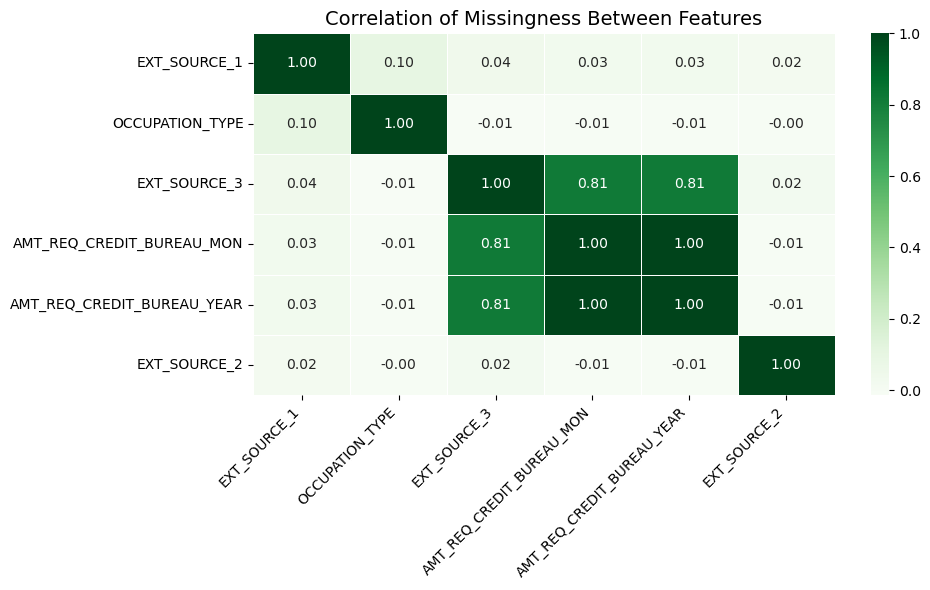

In [21]:
missing_cols = missing_summary.index.tolist()
missing_data = df[missing_cols]

missing_binary = missing_data.isnull().astype(int)

plt.figure(figsize=(10, 6))
sns.heatmap(missing_binary.corr(), cmap='Greens', annot=True, fmt=".2f", linewidths=0.5)
plt.title("Correlation of Missingness Between Features", fontsize=14)
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

High correlation between AMT_REQ_CREDIT_BUREAU_MON and AMT_REQ_CREDIT_BUREAU_YEAR → absence of bureau inquiries is consistent across timeframes.

interval columns not set, guessing: ['TARGET']


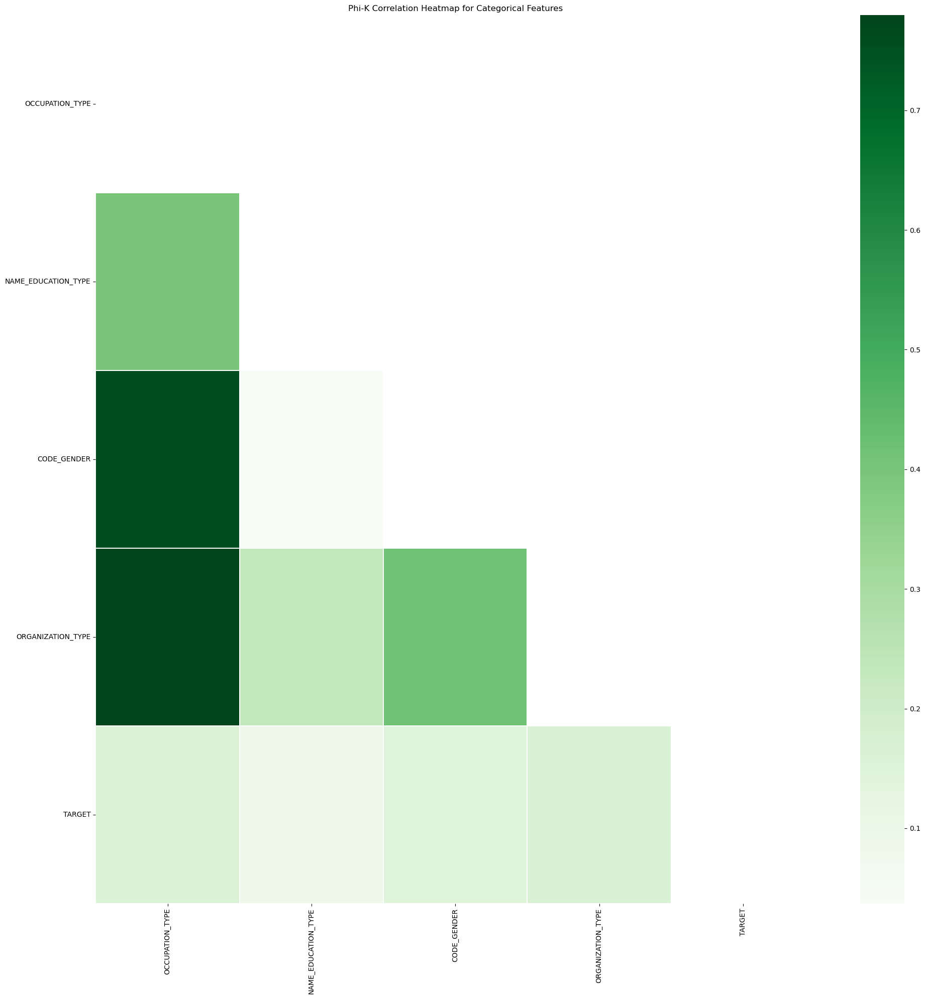

Categories with highest values of Phi-K Correlation value with Target Variable are:


,Column Name,Phik-Correlation
0,ORGANIZATION_TYPE,0.161265
1,OCCUPATION_TYPE,0.158706
2,CODE_GENDER,0.144763
3,NAME_EDUCATION_TYPE,0.088950


In [22]:
categorical_columns = df.select_dtypes(include='object').columns.tolist()
plot_phik_matrix(data=df, categorical_columns=categorical_columns)

**Phi-K Correlation Analysis of Categorical Features**

The heatmap above shows the Phi-K correlation between categorical features and with the target variable.

**Top Observations:**
- ORGANIZATION_TYPE has the strongest relationship with TARGET among all categorical features.
- CODE_GENDER and NAME_EDUCATION_TYPE also show moderate Phi-K values with TARGET.
- OCCUPATION_TYPE is not strongly correlated with target but interacts with other categorical variables, suggesting redundancy.

**Real-life Insight:**
- Certain occupations or organizations may be linked to more stable income (e.g., public vs. private sector), which impacts default risk.
- Gender differences (CODE_GENDER) in repayment behavior might reflect structural income gaps or social borrowing norms.
- Education level often influences both income and employment quality, hence its moderate impact on risk.

→ These features should be retained for modeling, and possibly transformed or grouped further for clearer signal extraction.


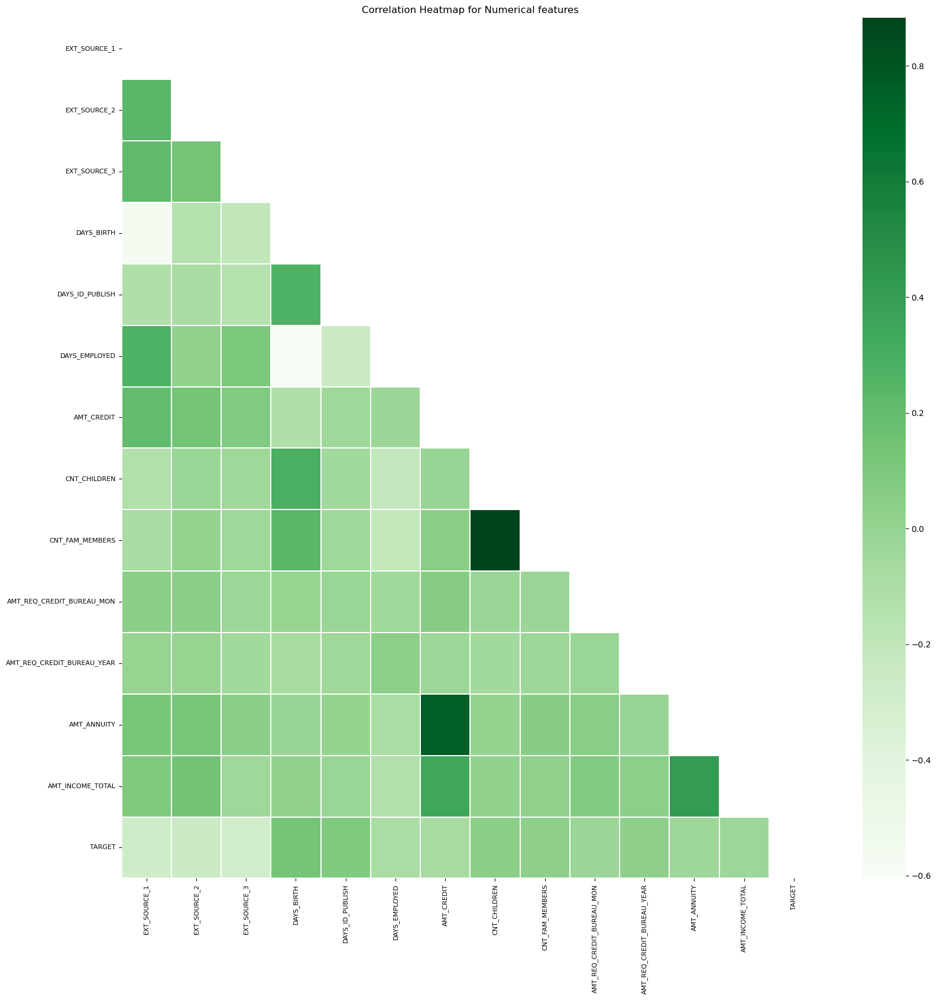

In [23]:
columns_to_drop = ['SK_ID_CURR'] + list(set(categorical_columns) - set(['TARGET']))
corr_mat = correlation_matrix(df, columns_to_drop, figsize = (17,17), fontsize = 8, cmap = 'Greens')
corr_mat.plot_correlation_matrix()

In [24]:
corr_mat.target_top_corr(target_top_columns = 10)

  0%|          | 0/14 [00:00<?, ?it/s]

interval columns not set, guessing: ['TARGET', 'EXT_SOURCE_1']
interval columns not set, guessing: ['TARGET', 'EXT_SOURCE_2']
interval columns not set, guessing: ['TARGET', 'EXT_SOURCE_3']
interval columns not set, guessing: ['TARGET', 'DAYS_BIRTH']
interval columns not set, guessing: ['TARGET', 'DAYS_ID_PUBLISH']
interval columns not set, guessing: ['TARGET', 'DAYS_EMPLOYED']
interval columns not set, guessing: ['TARGET', 'AMT_CREDIT']
interval columns not set, guessing: ['TARGET', 'CNT_CHILDREN']
interval columns not set, guessing: ['TARGET', 'CNT_FAM_MEMBERS']
interval columns not set, guessing: ['TARGET', 'AMT_REQ_CREDIT_BUREAU_MON']
interval columns not set, guessing: ['TARGET', 'AMT_REQ_CREDIT_BUREAU_YEAR']
interval columns not set, guessing: ['TARGET', 'AMT_ANNUITY']
interval columns not set, guessing: ['TARGET', 'AMT_INCOME_TOTAL']


,Column Name,Phik-Correlation
2,EXT_SOURCE_3,0.389344
0,EXT_SOURCE_1,0.356279
1,EXT_SOURCE_2,0.317540
3,DAYS_BIRTH,0.176985
6,AMT_CREDIT,0.145408
5,DAYS_EMPLOYED,0.140251
4,DAYS_ID_PUBLISH,0.117013
11,AMT_ANNUITY,0.056515
8,CNT_FAM_MEMBERS,0.042620
7,CNT_CHILDREN,0.036448


**Insight Summary: Correlation and Predictive Strength of Numerical Features**

- The strongest predictors of loan default, as revealed by Phi-K correlation with `TARGET`, are the **external credit scores**:  
  - `EXT_SOURCE_3` (0.389)  
  - `EXT_SOURCE_1` (0.356)  
  - `EXT_SOURCE_2` (0.318)  

  These features are likely composite indicators sourced from third-party credit bureaus or behavioral scoring systems. Their strong predictive power confirms the **critical role of external credit behavior** in assessing risk, which aligns with industry best practices in credit scoring.

- **Demographic information**, particularly `DAYS_BIRTH`, also holds meaningful predictive value. The negative correlation indicates that **younger applicants have higher default risk** — likely due to less financial stability, shorter credit history, or overextension on early borrowing.

- Financial features such as `AMT_CREDIT` and `AMT_ANNUITY` show moderate correlations with each other and with `TARGET`, reflecting **loan size and repayment burden** as important but secondary signals.

- Surprisingly, features like `DAYS_EMPLOYED`, `DAYS_ID_PUBLISH`, or `CNT_CHILDREN` have **lower individual correlations**, suggesting they may be **better used in engineered combinations** (e.g., employment-to-age ratio or income per dependent) rather than in isolation.

- The heatmap also highlights **high multicollinearity** between:
  - `AMT_CREDIT` and `AMT_GOODS_PRICE`: these reflect similar loan value components.
  - `CNT_CHILDREN` and `CNT_FAM_MEMBERS`: logical as family size includes children.

  These correlations should be monitored to prevent redundancy or inflated feature weights in models.

**Real-life Takeaway:**  
In practical lending, the most reliable indicators of risk are **external data sources** that capture behavior across institutions. While demographic and internal financial data (like income or credit amount) offer some insight, they often lack the granularity and history provided by third-party risk metrics. This reinforces the value of partnering with credit bureaus or fintech data providers to enrich internal scoring systems.


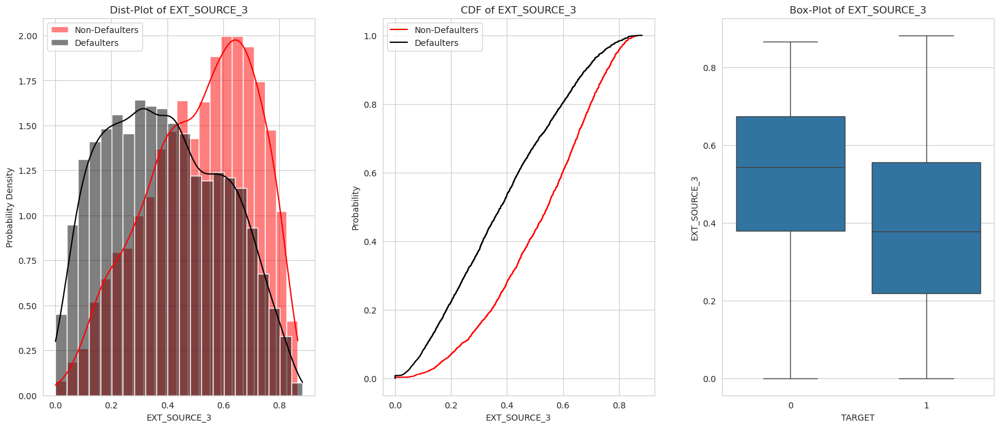

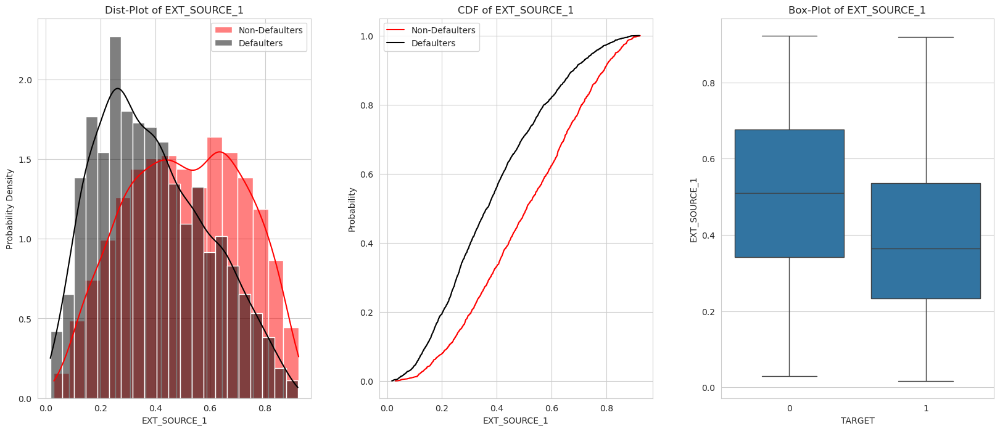

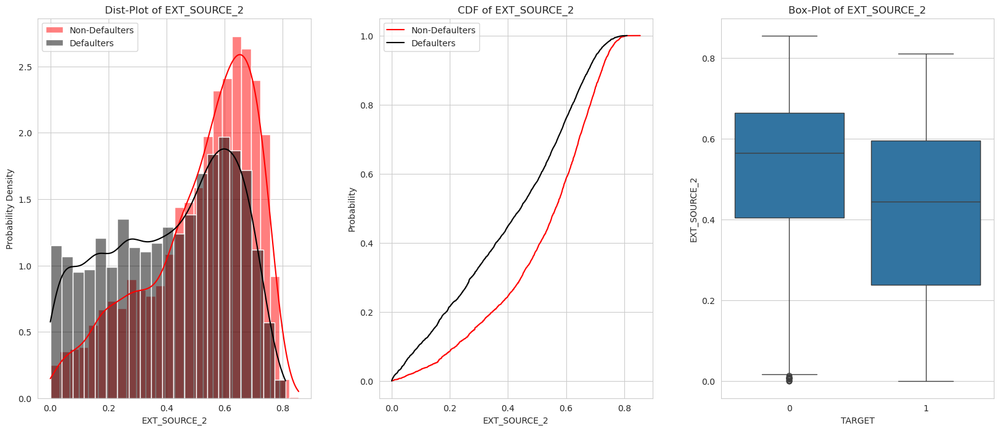

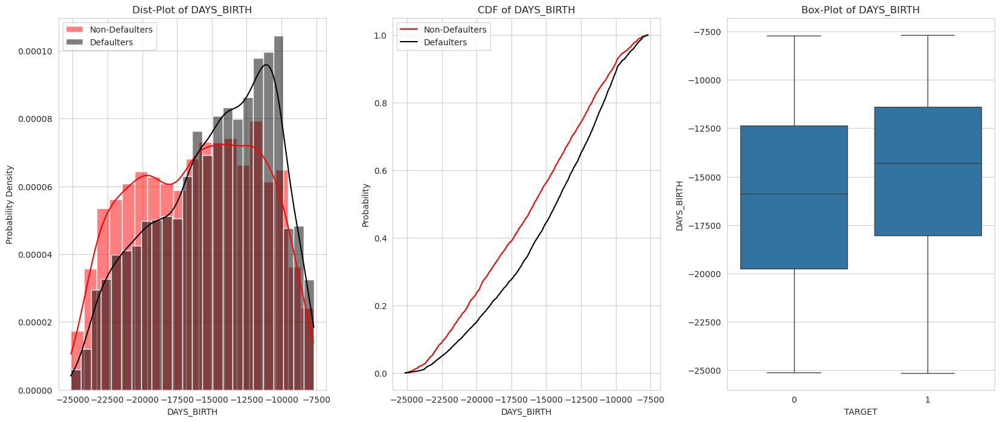

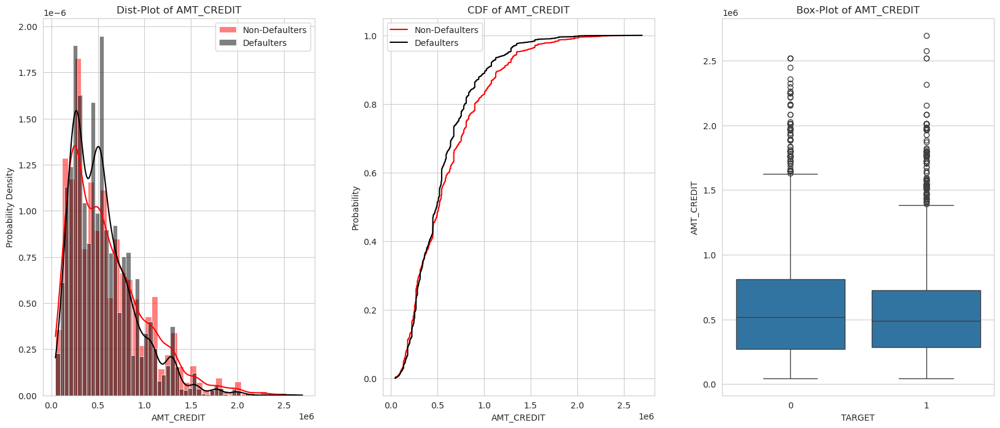

In [25]:
top_continuous = ['EXT_SOURCE_3', 'EXT_SOURCE_1', 'EXT_SOURCE_2', 'DAYS_BIRTH', 'AMT_CREDIT']

plot_continuous_variables(data=df, columns=top_continuous, plots=['distplot', 'CDF', 'box'], log_scale=False)

**Distribution Insights of Top Predictive Continuous Features**

1. **EXT_SOURCE_1 / EXT_SOURCE_2 / EXT_SOURCE_3**
   - **Clear separation** between defaulters and non-defaulters: Non-defaulters consistently have higher scores across all three.
   - Boxplots and CDFs confirm this pattern — defaulters cluster at lower values, while non-defaulters benefit from external scores near 0.6–0.8.
   - These scores likely summarize **external credit behavior**, reinforcing their **strong predictive value** (as seen in Phi-K and correlation analysis).
   - → Real-life implication: Borrowers with low external risk scores (possibly due to poor repayment history, recent defaults, or thin files) are significantly more likely to default.

2. **DAYS_BIRTH (Applicant’s Age)**
   - Inverted scale (negative days): Younger borrowers (closer to 0) are overrepresented in the defaulter group.
   - The CDF line for defaulters is left-shifted, meaning **younger individuals default more frequently**.
   - → Real-life insight: Younger applicants may have **less financial discipline**, **shorter credit history**, or **more aggressive borrowing behavior**. Age is a valuable but indirect proxy for credit maturity.

3. **AMT_CREDIT (Total Credit Amount)**
   - Right-skewed distribution with extreme outliers.
   - CDF and boxplot suggest defaulters take **slightly smaller loans on average**, but the distinction is not strong.
   - → Loan size alone doesn’t determine risk, but in combination with income, tenure, or installment ratios, it becomes more informative.

**Key Takeaway:**  
- `EXT_SOURCE_1/2/3` and `DAYS_BIRTH` stand out as highly discriminative features.
- Their visualization supports the **quantitative correlation rankings**, strengthening confidence in including them for predictive modeling.
- These patterns are also **intuitive from a credit risk perspective**, which helps with model explainability and stakeholder communication.


## EXT_SOURCE

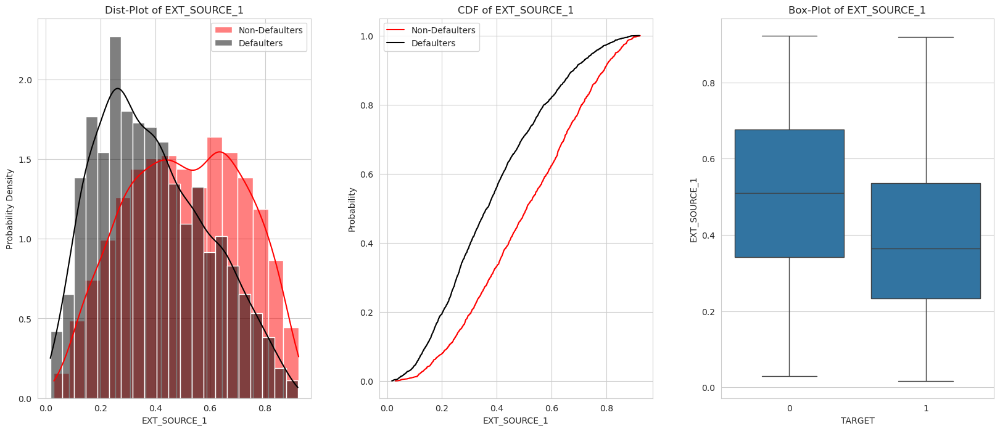

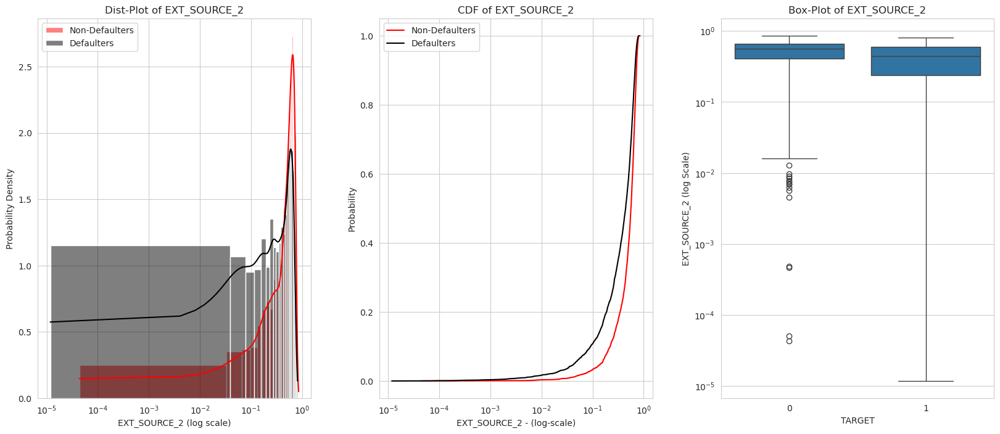

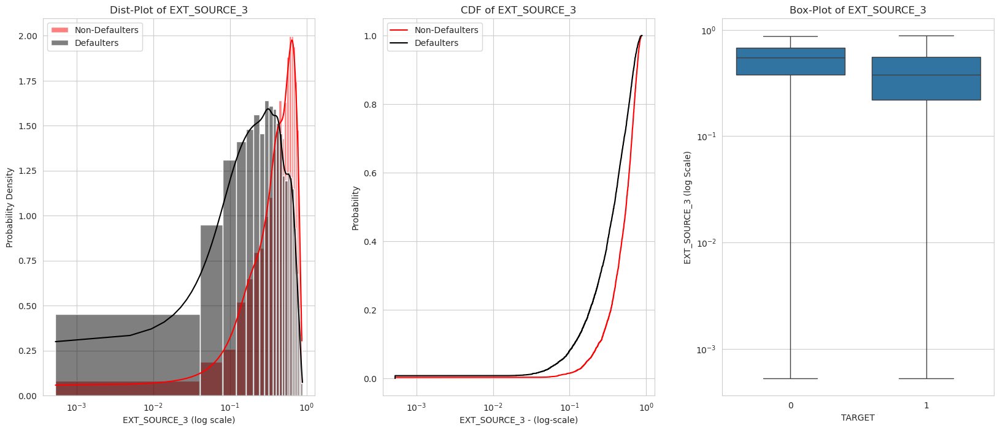

In [26]:
plot_continuous_variables(data=df, columns=['EXT_SOURCE_1'], plots=['distplot', 'CDF', 'box'], log_scale=False)
plot_continuous_variables(data=df, columns=['EXT_SOURCE_2'], plots=['distplot', 'CDF', 'box'], log_scale=True)
plot_continuous_variables(data=df, columns=['EXT_SOURCE_3'], plots=['distplot', 'CDF', 'box'], log_scale=True)

**EXT_SOURCE_1 — External Risk Score Analysis**

- The distribution shows a clear skew: defaulters are clustered toward **lower EXT_SOURCE_1 scores**, while non-defaulters lean higher.
- CDF plot highlights a distinct separation — non-defaulters accumulate probability at higher score values.
- The boxplot confirms that defaulters tend to have significantly lower median values.

**Real-life Insight:**
Similar to EXT_SOURCE_3, EXT_SOURCE_1 likely reflects **external creditworthiness**, possibly derived from historical repayment behavior or scoring from partner institutions. Its consistency in discriminating default patterns emphasizes its **value as an objective third-party signal**.

→ Models should prioritize this variable, and analysts should explore where the external score diverges from internal evaluation — it may catch risk signals missed by internal underwriting.

**EXT_SOURCE_2 — External Risk Score Analysis**

- Both default and non-default groups follow similar shapes, but **non-defaulters are slightly shifted to the right**, with a higher concentration above 0.5.
- CDF plot reveals that defaulters accumulate more quickly at lower values, confirming higher risk at low scores.
- The boxplot reflects a **modest but consistent separation**.

**Real-life Insight:**
EXT_SOURCE_2 adds independent predictive power while reinforcing signals from EXT_SOURCE_1 and EXT_SOURCE_3. Since it has almost no missing values, it's also a **high-value feature with minimal preprocessing needed**.


**EXT_SOURCE_3 (Revisited) — External Score Confirmation**

- The visual confirms EXT_SOURCE_3's **strongest separation** across all EXT_SOURCE features.
- The clear distributional gap between defaulters and non-defaulters makes this a **top candidate for threshold-based or weighted scoring models**.

**Final Takeaway on EXT_SOURCE Features:**

- All three external scores are strongly aligned with default risk.
- Combining them (e.g., via PCA or weighted average) could improve model stability.
- They bring **external validation** to the risk model — especially useful when internal data is incomplete or applicants are new to the lender.



## DAYS_BIRTH

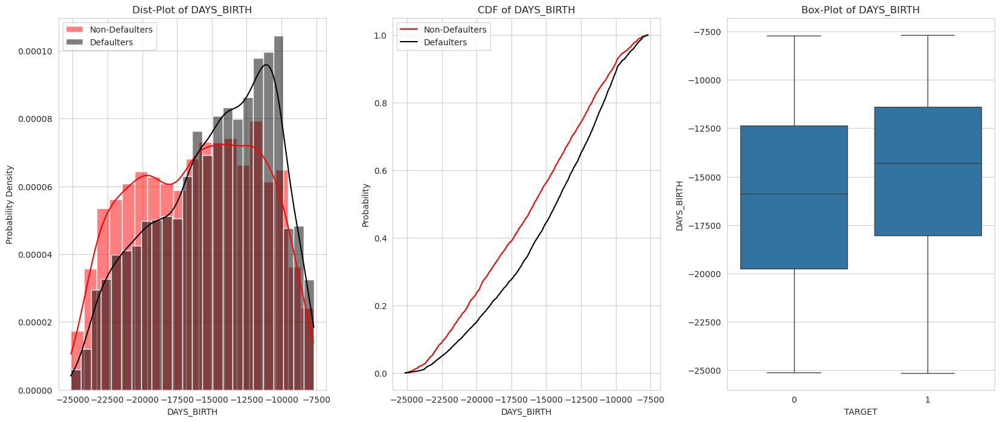

In [27]:
plot_continuous_variables(data=df, columns=['DAYS_BIRTH'], plots=['distplot', 'CDF', 'box'], log_scale=False)


**DAYS_BIRTH — Age of Applicant (in days)**

- As expected, `DAYS_BIRTH` is negatively encoded (days since birth). So, **younger applicants have values closer to 0**.
- Defaulters are skewed toward the **younger end**, while non-defaulters tend to be older.
- CDF and boxplot clearly show that default risk **decreases with age**.

**Real-life Insight:**
Age is a powerful **proxy for financial maturity**. Younger individuals may:
- Have less stable income
- Carry more unsecured debt (credit cards, student loans)
- Show riskier financial behavior

While age alone cannot be used for lending decisions in some jurisdictions due to regulatory restrictions, **derived features like employment length or credit history length (relative to age)** can be legally and effectively modeled.

→ `DAYS_BIRTH` is not only predictive but also **interpretable**, making it useful for both machine learning and explainable credit scoring models.


## DAYS_EMPLOYED

In [ ]:
df.drop

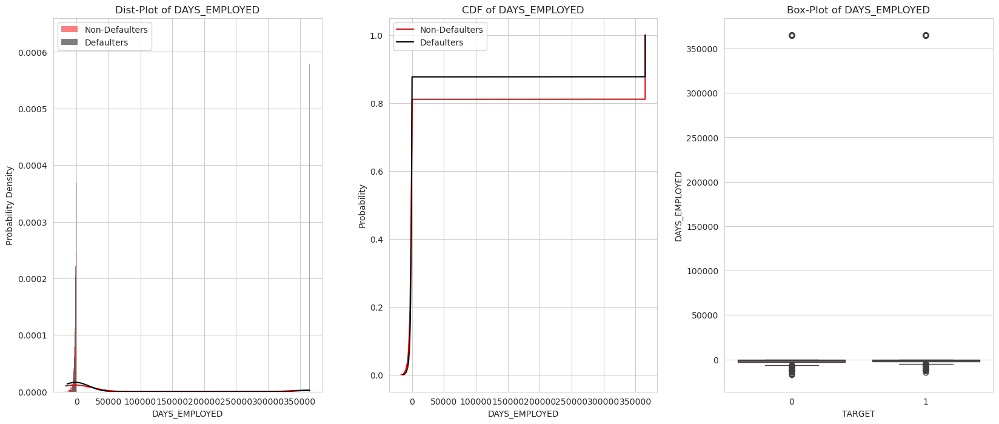

In [28]:
plot_continuous_variables(data=df, columns=['DAYS_EMPLOYED'], plots=['distplot', 'CDF', 'box'], log_scale=False)


**DAYS_EMPLOYED — Length of Employment (in days)**

- The distribution shows a strong **anomaly** at 365243 days (nearly 1000 years), which is used to represent retired individuals.
- Excluding the spike, we observe that **non-defaulters generally have longer employment histories**.
- The CDF shows defaulters skewed toward shorter tenures, indicating less financial stability.

**Real-life Insight:**
- Employment duration reflects **economic stability** — longer tenure suggests steady income and lower risk.
- The placeholder value for retirees can be engineered into a binary feature (e.g., "is_retired").
- Shorter employment may indicate recent job changes, informal work, or job instability — all correlated with higher default likelihood.

→ `DAYS_EMPLOYED` is useful but needs **cleaning and transformation** to remove or separate the artificial peak.


## AMT_CREDIT

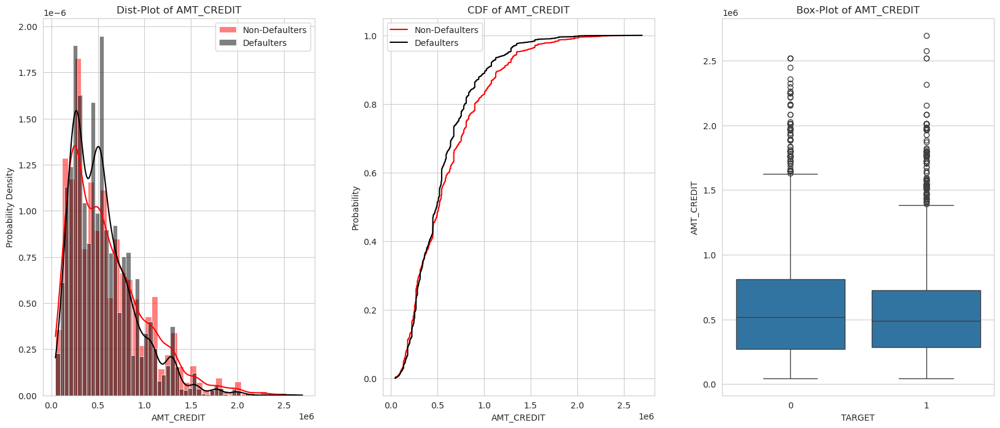

In [29]:
plot_continuous_variables(data=df, columns=['AMT_CREDIT'], plots=['distplot', 'CDF', 'box'], log_scale=False)

**AMT_CREDIT — Total Credit Amount Requested**

- Highly right-skewed with a wide range of values.
- Defaulters are slightly more concentrated around smaller-to-medium loan sizes, but the distributions largely overlap.
- Minimal separation in the boxplot — default isn't directly tied to loan amount alone.

**Insight:**  
Credit size matters less than the borrower’s ability to repay. This feature becomes more valuable when combined with income, family size, or annuity to create ratios (e.g., credit-to-income).


## AMT_ANNUITY

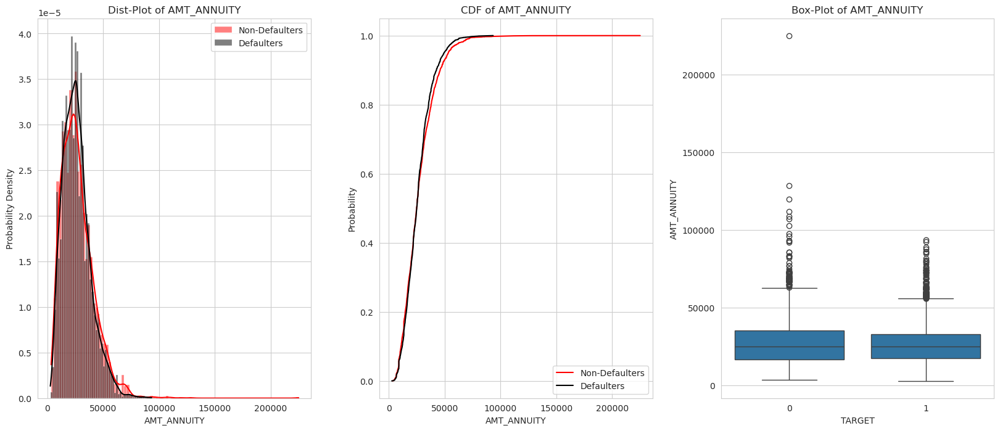

In [30]:
plot_continuous_variables(data=df, columns=['AMT_ANNUITY'], plots=['distplot', 'CDF', 'box'], log_scale=False)


**AMT_ANNUITY — Periodic Loan Payment**

- Similar shape to AMT_CREDIT but with slightly more separation.
- Defaulters tend to have lower annuity payments, indicating **smaller but more risky loans** (e.g., unsecured or high-risk segments).
- Boxplot reveals defaulters' median annuity is lower than non-defaulters.

**Insight:**  
Smaller periodic payments may reflect either low-income borrowers or short-term high-risk loans. On its own, the feature is modestly predictive.


## AMT_INCOME_TOTAL

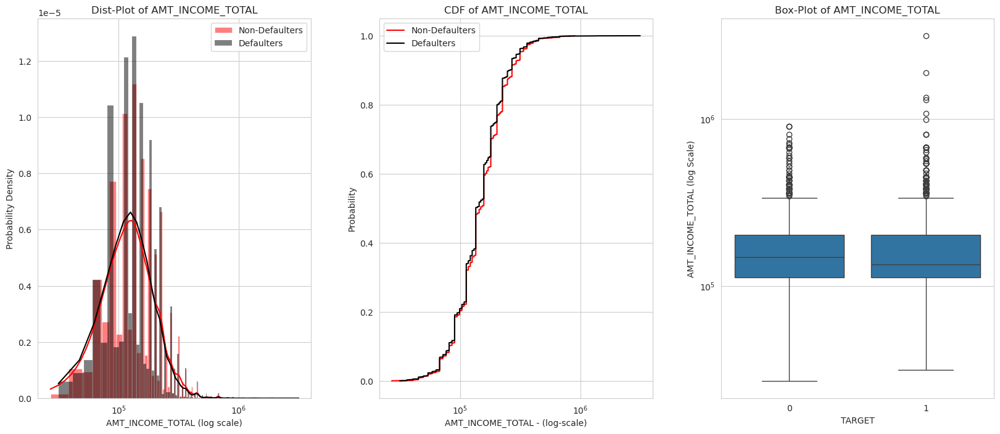

In [31]:
plot_continuous_variables(data=df, columns=['AMT_INCOME_TOTAL'], plots=['distplot', 'CDF', 'box'], log_scale=True)


**AMT_INCOME_TOTAL — Total Annual Income**

- Extremely right-skewed; log scale improves visualization.
- Most defaulters have lower income levels, though there’s overlap with non-defaulters.
- Boxplot shows a clear separation: **higher-income applicants default less frequently**.

**Real-life Insight:**
Income is a core factor in creditworthiness. Lower-income individuals are more vulnerable to economic shocks and tend to carry higher credit utilization, increasing their default risk.

→ While predictive, income is more valuable when **normalized** (e.g., income per person or income vs. credit amount).


## CNT_CHILDREN

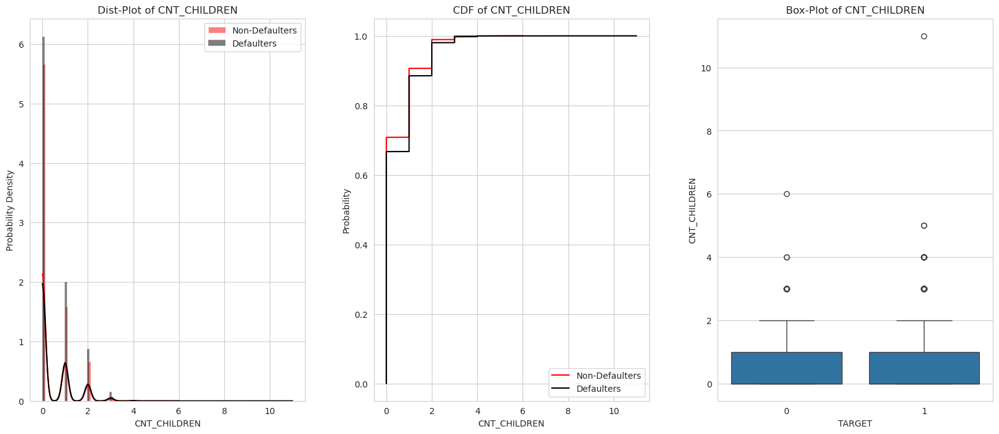

In [32]:
plot_continuous_variables(data=df, columns=['CNT_CHILDREN'], plots=['distplot', 'CDF', 'box'], log_scale=False)


**CNT_CHILDREN — Number of Children**

- Most clients have 0–2 children; outliers with 5+ children are rare but exist.
- Defaulters are slightly more common among those with **1+ children**, indicating **increased financial burden**.
- CDF is flatter for defaulters, and the boxplot shows a small right-shift.

**Insight:**  
Family responsibilities increase expenses, which can strain repayment capacity — especially in the lower-income or single-income groups. Though not dominant, it's **valuable for interaction terms** (e.g., income per dependent).


## CNT_FAM_MEMBERS

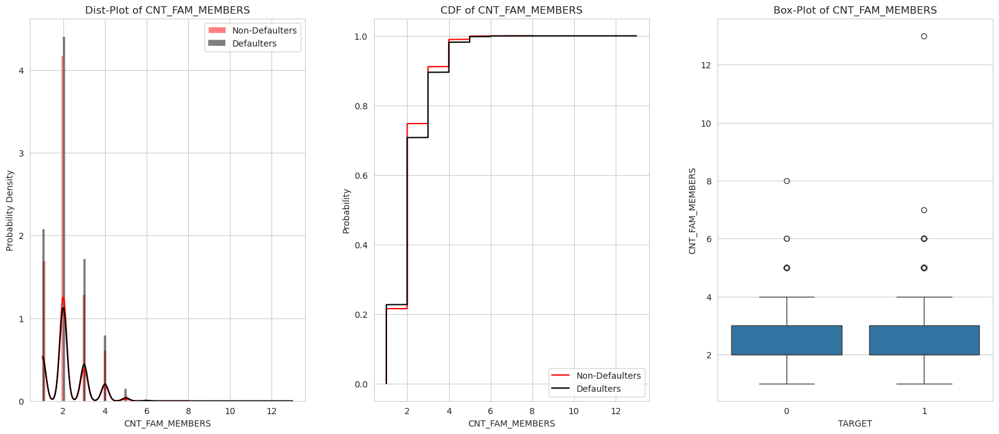

In [33]:
plot_continuous_variables(data=df, columns=['CNT_FAM_MEMBERS'], plots=['distplot', 'CDF', 'box'], log_scale=False)


**CNT_FAM_MEMBERS — Total Number of Family Members**

- Most applicants report 1–4 family members.
- Defaulters tend to have **slightly larger families**.
- Boxplot shows a mild upward shift for defaulters.

**Real-life Insight:**
Larger households imply higher living expenses. When combined with income, this helps estimate **disposable income**, a key driver of repayment ability.

→ This feature is best used in **ratios** like `INCOME_PER_PERSON = AMT_INCOME_TOTAL / CNT_FAM_MEMBERS`.

## AMT_REQ_CREDIT_BUREAU_MON and AMT_REQ_CREDIT_BUREAU_YEAR

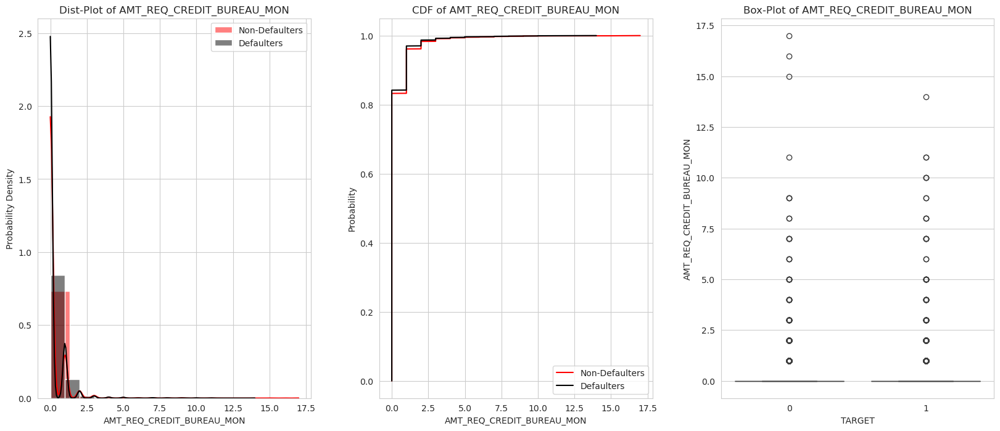

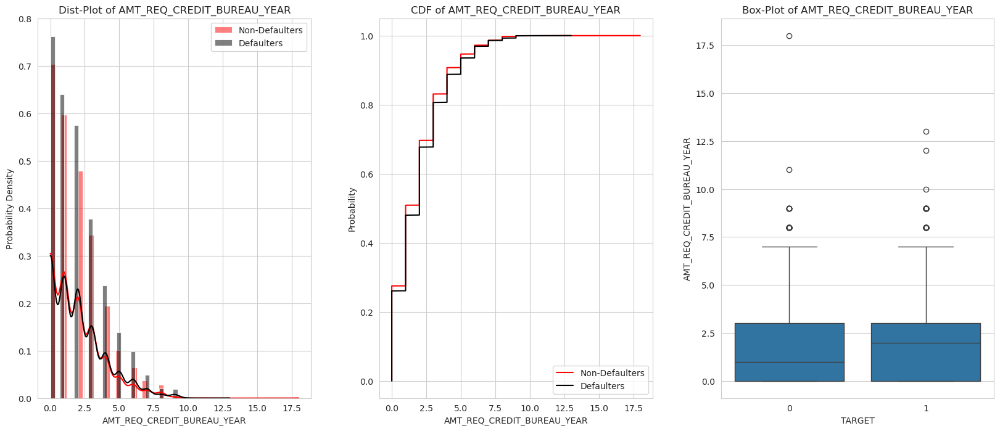

In [34]:
plot_continuous_variables(data=df, columns=['AMT_REQ_CREDIT_BUREAU_MON', 'AMT_REQ_CREDIT_BUREAU_YEAR'], plots=['distplot', 'CDF', 'box'], log_scale=False)


**AMT_REQ_CREDIT_BUREAU_MON & YEAR — Credit Bureau Inquiries**

- Most applicants had 0–1 credit inquiries in the past month/year.
- Defaulters show a **slightly higher frequency of past bureau checks**, especially at 1 or more inquiries.
- Boxplots confirm a modest rightward shift among defaulters.

**Real-life Insight:**
Recent credit inquiries signal **active borrowing behavior** — which may suggest financial stress, credit shopping, or higher risk tolerance. While not highly predictive alone, this feature gains value when combined with:
- Credit utilization rate
- Recent loan approvals or rejections
- Number of credit lines


**Conclusion: Numerical Feature Analysis**

The exploratory data analysis of numerical variables revealed several key patterns that align well with credit risk intuition and real-world borrower behavior:

1. **Strong Predictors Identified**
   - The most powerful predictors of default were the **external risk scores**: `EXT_SOURCE_1`, `EXT_SOURCE_2`, and `EXT_SOURCE_3`.
   - These scores effectively separate defaulters from non-defaulters, indicating that third-party behavioral credit data is **critical in risk modeling**.
   - Their value lies in capturing broader financial history beyond the lender’s internal data.

2. **Demographic and Economic Stability Indicators**
   - `DAYS_BIRTH` (age) is inversely related to default risk. Younger applicants tend to default more, likely due to lower financial stability or lack of experience managing credit.
   - `DAYS_EMPLOYED` also helps distinguish risk — longer employment typically means more stable income. Special handling is required for placeholder values representing retirees.

3. **Income and Obligation-Related Features**
   - `AMT_INCOME_TOTAL` shows clear separation between default groups — higher income lowers default risk.
   - `CNT_FAM_MEMBERS` and `CNT_CHILDREN` are only mildly predictive on their own, but important when constructing **ratios** such as income-per-person or debt burden.
   - `AMT_CREDIT` and `AMT_ANNUITY` have limited standalone power but become useful when combined into **payment ratios** or evaluated alongside income.

4. **Behavioral Signals from Credit Activity**
   - `AMT_REQ_CREDIT_BUREAU_MON` and `YEAR` offer weak but valuable signals — frequent inquiries may indicate **credit stress** or active borrowing, increasing risk.

5. **Engineering Potential**
   - Several features are not strongly predictive on their own but have **high value in interaction**:
     - `AMT_CREDIT / AMT_INCOME_TOTAL`
     - `AMT_ANNUITY / AMT_INCOME_TOTAL`
     - `INCOME / CNT_FAM_MEMBERS`
     - Employment-to-age ratio

**Real-life Implications:**
The numerical data provides a solid foundation for modeling creditworthiness, particularly when features are **engineered and interpreted in context**. External scores and demographic/economic indicators are the strongest stand-alone predictors, while financial and behavioral features gain value through **composite metrics**.

→ The next phase of the pipeline will involve selecting and transforming these features for modeling, with a focus on maximizing signal while reducing redundancy and multicollinearity.

## CODE_GENDER

Total Number of unique categories of CODE_GENDER = 2


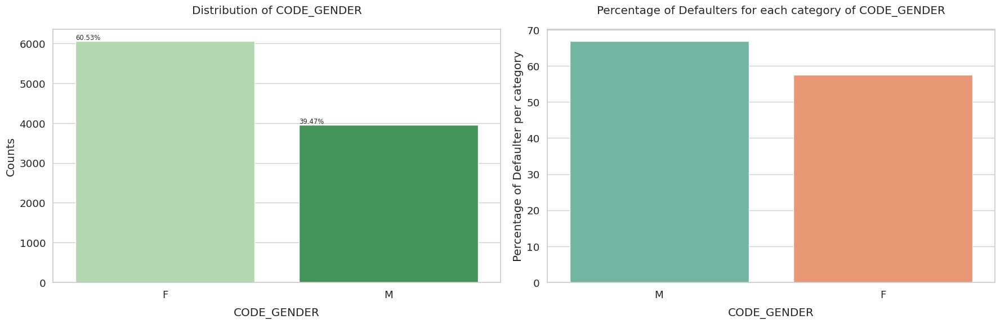

In [35]:
plot_categorical_variables_bar(df, column_names=['CODE_GENDER'])

**CODE_GENDER — Gender Distribution and Default Rate**

- Most applicants are female, but both male and female groups are well represented.
- The default rate is **slightly higher for males**, suggesting gender may carry a weak but consistent signal in risk behavior.

**Real-life Insight:**
This kind of gender gap in default rates is common in financial data. It may stem from differences in:
- Income levels
- Risk tolerance or borrowing patterns
- Credit history depth

→ While gender alone should be used cautiously in modeling (due to fairness and compliance concerns), it may still add value when combined with other features like occupation or income bracket.


## EDUCATION_TYPE, OCCUPATION_TYPE and ORGANIZATION_TYPE

Total Number of unique categories of NAME_EDUCATION_TYPE = 5


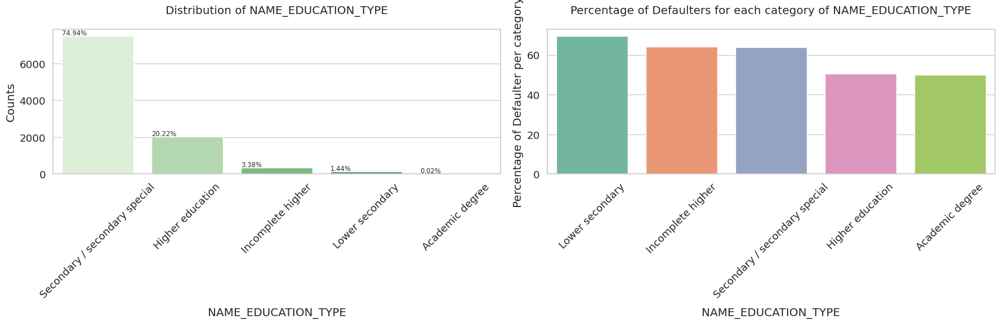

Total Number of unique categories of OCCUPATION_TYPE = 19


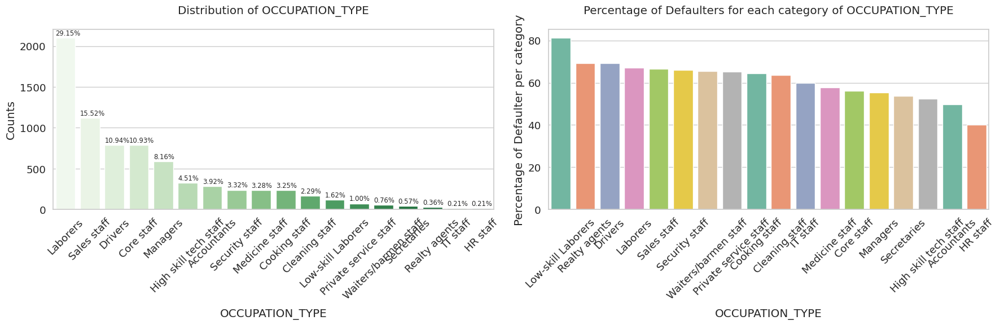

In [36]:
plot_categorical_variables_bar(df, column_names=['NAME_EDUCATION_TYPE', 'OCCUPATION_TYPE'], rotation = 45)

Total Number of categories of ORGANIZATION_TYPE = 57


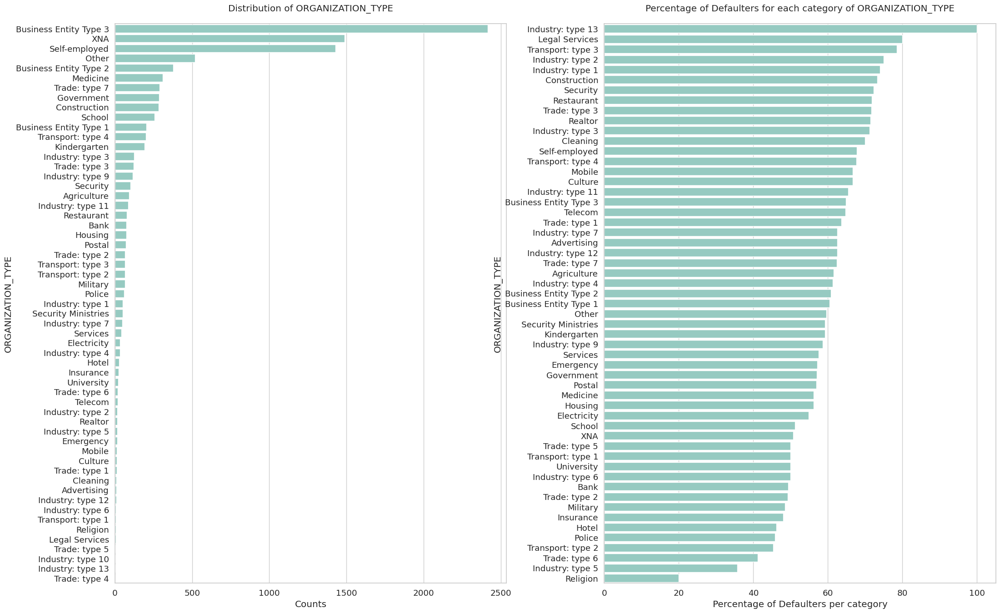

In [37]:
print(f"Total Number of categories of ORGANIZATION_TYPE = {len(df.ORGANIZATION_TYPE.unique())}")

plt.figure(figsize = (25,16))
sns.set(style = 'whitegrid', font_scale = 1.2, palette = 'Set3')
plt.subplots_adjust(wspace=0.25)

plt.subplot(1,2,1)
count_organization = df.ORGANIZATION_TYPE.value_counts().sort_values(ascending = False)
sns.barplot(x = count_organization, y = count_organization.index)
plt.title('Distribution of ORGANIZATION_TYPE', pad = 20)
plt.xlabel('Counts')
plt.ylabel('ORGANIZATION_TYPE')

plt.subplot(1,2,2)
percentage_default_per_organization = df[df.TARGET == 1].ORGANIZATION_TYPE.value_counts() * 100 / count_organization
percentage_default_per_organization = percentage_default_per_organization.dropna().sort_values(ascending = False)
sns.barplot(x = percentage_default_per_organization, y = percentage_default_per_organization.index)
plt.title('Percentage of Defaulters for each category of ORGANIZATION_TYPE', pad = 20)
plt.xlabel('Percentage of Defaulters per category')
plt.ylabel('ORGANIZATION_TYPE')

plt.show()

**Categorical Feature Analysis**

1. **CODE_GENDER**
   - Only two categories: Male and Female.
   - Males show a **slightly higher default rate**.
   - May reflect income or job stability differences, though it's a **sensitive variable** in regulatory contexts and may need to be excluded or carefully justified.

2. **NAME_EDUCATION_TYPE**
   - Most applicants have **secondary or higher education**.
   - Defaulters are more concentrated in **lower education levels** (e.g., 'Lower secondary').
   - Higher education tends to correlate with **better credit behavior**, possibly due to improved financial literacy and more stable jobs.

3. **OCCUPATION_TYPE**
   - Large variation across 19 job categories.
   - Highest default rates observed among **laborers, low-skilled, or missing occupation groups**.
   - Safer profiles include **accountants, managers, and HR staff**, which likely reflect better income and job stability.

4. **ORGANIZATION_TYPE**
   - Over 50 organization types; some sparsely populated.
   - Highest default rates are seen in **business entities or self-employed categories**, while **government and educational sectors show lower risk**.
   - Can benefit from grouping rare types and creating **broader employment sector categories** (e.g., public, private, self-employed).

**Real-life Implications:**
- Education and employment type offer valuable social and economic signals.
- Missing values in occupation may themselves indicate informal or unstable employment.
- Some features (like `ORGANIZATION_TYPE`) are **too granular** and should be simplified before modeling.

→ Categorical features are especially useful when **aggregated** or **encoded** into risk-based categories. Combining them with numeric context (e.g., income, credit) will enhance model performance.


# DATA ENGINEERING

## Handling missing values

In [38]:
missing_summary = df.isnull().sum()[df.isnull().sum() > 0].sort_values(ascending=False)
missing_summary

EXT_SOURCE_1                  5814
OCCUPATION_TYPE               2797
EXT_SOURCE_3                  2186
AMT_REQ_CREDIT_BUREAU_MON     1565
AMT_REQ_CREDIT_BUREAU_YEAR    1565
EXT_SOURCE_2                    21
dtype: int64

In [39]:
X = df.drop(columns=['TARGET'], axis=1)
y = df['TARGET']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42, stratify=y)

print(f"Training set: {X_train.shape[0]} samples")
print(f"Testing set: {X_test.shape[0]} samples")
print(f"Training target distribution:\n{y_train.value_counts()}")
print(f"Testing target distribution:\n{y_test.value_counts()}")

Training set: 7000 samples
Testing set: 3000 samples
Training target distribution:
TARGET
1    4285
0    2715
Name: count, dtype: int64
Testing target distribution:
TARGET
1    1836
0    1164
Name: count, dtype: int64


In [40]:
def filll(df):
    df['EXT_SOURCE_SUM'] = df[['EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3']].sum(axis=1, skipna=True)
    df['EXT_SOURCE_PROD'] = df[['EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3']].prod(axis=1, skipna=True)
    df['EXT_SOURCE_MEAN'] = df[['EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3']].mean(axis=1, skipna=True)
    df['EXT_SOURCE_STD'] = df[['EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3']].std(axis=1, skipna=True)
    df['EXT_SOURCE_MISSING_VALUES'] = df[['EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3']].isna().sum(axis=1)

    df['EXT_SOURCE_SUM'] = df['EXT_SOURCE_SUM'].fillna(df['EXT_SOURCE_SUM'].mean())
    df['EXT_SOURCE_PROD'] = df['EXT_SOURCE_PROD'].fillna(df['EXT_SOURCE_PROD'].mean())
    df['EXT_SOURCE_MEAN'] = df['EXT_SOURCE_MEAN'].fillna(df['EXT_SOURCE_MEAN'].mean())
    df['EXT_SOURCE_STD'] = df['EXT_SOURCE_STD'].fillna(df['EXT_SOURCE_STD'].mean())

    df['EXT_SOURCE_1'] = df['EXT_SOURCE_1'].fillna(df['EXT_SOURCE_1'].mean())
    df['EXT_SOURCE_2'] = df['EXT_SOURCE_2'].fillna(df['EXT_SOURCE_2'].mean())
    df['EXT_SOURCE_3'] = df['EXT_SOURCE_3'].fillna(df['EXT_SOURCE_3'].mean())
    df['AMT_REQ_CREDIT_BUREAU_YEAR'] = df['AMT_REQ_CREDIT_BUREAU_YEAR'].fillna(df['AMT_REQ_CREDIT_BUREAU_YEAR'].mean())
    df['AMT_REQ_CREDIT_BUREAU_MON'] = df['AMT_REQ_CREDIT_BUREAU_MON'].fillna(df['AMT_REQ_CREDIT_BUREAU_MON'].mean())

    df['EXT_SOURCE_MISSING_VALUES'].value_counts()

    df['ORGANIZATION_TYPE'] = df['ORGANIZATION_TYPE'].replace('XNA', 'Unemployed')

    df['OCCUPATION_TYPE'] = df['OCCUPATION_TYPE'].replace({'IT staff': 'High skill tech staff','Realty agents': 'Sales staff','HR staff': 'Laborers'})
    df['OCCUPATION_TYPE'] = df['OCCUPATION_TYPE'].fillna('Unknown')
    df['OCCUPATION_TYPE'] = df['OCCUPATION_TYPE'].replace(['Cleaning staff', 'Cooking staff', 'Waiters/barmen staff'], 'F&B staff')
    df['OCCUPATION_TYPE'].value_counts()
    return df

X_train = filll(X_train)
X_test = filll(X_test)

df = pd.concat([X_train, X_test], axis=0).sort_index()

In [41]:
df.isnull().sum()[df.isnull().sum() > 0].sort_values(ascending=False)

Series([], dtype: int64)

New features and final data cleaning steps were applied to enhance the dataset's structure and predictive power.

EXT_SOURCE Aggregation:
- Created EXT_SOURCE_SUM, PROD, MEAN, STD, and MISSING_VALUES to capture magnitude, variation, and completeness across external risk scores.
- Original EXT_SOURCE_1/2/3 columns were dropped post-transformation.
- EXT_SOURCE_MISSING_VALUES reflects pre-imputation gaps and offers useful signal about applicant credit visibility.

Credit Bureau Features:
- AMT_REQ_CREDIT_BUREAU_YEAR and MON imputed with mean to preserve structure and reflect general credit-seeking behavior.

ORGANIZATION_TYPE:
- 'XNA' replaced with 'Unemployed' for clarity and interpretability.

OCCUPATION_TYPE:
- Grouped specific jobs into broader roles to reduce noise:
  - 'IT staff' → 'High skill tech staff'
  - 'Realty agents' → 'Sales staff'
  - 'HR staff' → 'Laborers'
  - Several roles grouped as 'F&B staff'
- Missing values labeled as 'Unknown' to preserve their potential signal.


## Create new features

In [42]:
X_train

,SK_ID_CURR,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,DAYS_BIRTH,DAYS_ID_PUBLISH,DAYS_EMPLOYED,AMT_CREDIT,CNT_CHILDREN,CNT_FAM_MEMBERS,...,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_YEAR,AMT_ANNUITY,AMT_INCOME_TOTAL,ORGANIZATION_TYPE,EXT_SOURCE_SUM,EXT_SOURCE_PROD,EXT_SOURCE_MEAN,EXT_SOURCE_STD,EXT_SOURCE_MISSING_VALUES
6402,109339,0.439170,0.366218,0.165407,-21858,-4144,365243,269550.0,0,1.0,...,0.000000,1.00000,12001.5,76500.0,Unemployed,0.531626,0.060575,0.265813,0.141995,1
770,255640,0.439170,0.657212,0.560284,-10968,-1947,-1285,675000.0,0,2.0,...,0.000000,3.00000,26284.5,135000.0,Cleaning,1.217497,0.368226,0.608748,0.068538,1
257,242380,0.439170,0.689443,0.438042,-16407,-4244,-4963,457119.0,0,1.0,...,1.000000,3.00000,24925.5,171000.0,Business Entity Type 3,0.689443,0.689443,0.689443,0.162373,2
7428,242693,0.094148,0.637937,0.392774,-10908,-3330,-64,545040.0,0,2.0,...,0.000000,0.00000,35617.5,202500.0,Business Entity Type 3,1.124859,0.023590,0.374953,0.272332,0
7063,80280,0.413497,0.549365,0.511892,-12886,-906,-2425,1006920.0,1,3.0,...,0.000000,1.00000,51543.0,337500.0,Military,1.474753,0.116282,0.491584,0.070174,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4176,211594,0.439170,0.307334,0.387625,-19411,-2946,-918,276277.5,0,2.0,...,0.000000,1.00000,19777.5,103500.0,Self-employed,0.694959,0.119130,0.347480,0.056775,1
981,259319,0.272184,0.441151,0.438042,-10459,-1961,-1658,508495.5,0,2.0,...,0.254549,1.95596,37345.5,135000.0,Business Entity Type 3,0.713335,0.120074,0.356668,0.119478,1
8566,202825,0.152348,0.441529,0.145543,-10383,-2977,-620,568858.5,2,4.0,...,0.000000,3.00000,38479.5,225000.0,Business Entity Type 3,0.739420,0.009790,0.246473,0.168957,0
7920,127014,0.439170,0.636390,0.171468,-9986,-2226,-1110,1042560.0,1,3.0,...,0.000000,0.00000,34456.5,225000.0,Kindergarten,0.807858,0.109121,0.403929,0.328749,1


In [43]:
def feature_engineering(df):
    df['AGE_INT'] = (-df['DAYS_BIRTH'] / 365).astype(int) 
    df['DAYS_EMPLOYED_PERC'] = df['DAYS_EMPLOYED'] / df['DAYS_BIRTH']
    df['CREDIT_PER_CHILD'] = df['AMT_CREDIT'] / (df['CNT_CHILDREN'] + 1)
    df['CREDIT_PER_MEMBER'] = df['AMT_CREDIT'] / df['CNT_FAM_MEMBERS']
    df['CREDIT_PER_ADULT'] = df['AMT_CREDIT'] / (df['CNT_FAM_MEMBERS'] - df['CNT_CHILDREN'] + 1)

    occupation_age_mean = df.groupby('OCCUPATION_TYPE')['DAYS_BIRTH'].transform('mean')
    df['OCC_DAYS_BIRTH'] = df['DAYS_BIRTH'] - occupation_age_mean

    edu_occ = df.groupby(['NAME_EDUCATION_TYPE', 'OCCUPATION_TYPE'])[['AMT_REQ_CREDIT_BUREAU_YEAR', 'AMT_REQ_CREDIT_BUREAU_MON']].transform('mean')
    df['EDU_OCC_REQ_YR'] = edu_occ['AMT_REQ_CREDIT_BUREAU_YEAR']
    df['EDU_OCC_REQ_MON'] = edu_occ['AMT_REQ_CREDIT_BUREAU_MON']

    engineered_cols = [
        'AGE_INT', 'DAYS_EMPLOYED_PERC', 'CREDIT_PER_CHILD',
        'CREDIT_PER_MEMBER', 'CREDIT_PER_ADULT',
        'OCC_DAYS_BIRTH',
        'EDU_OCC_REQ_YR',
        'EDU_OCC_REQ_MON'
    ]
    df['ANNUITY_LENGTH'] = df['AMT_CREDIT'] / df['AMT_ANNUITY']
    df['ANNUITY_PER_PERSON'] = df['AMT_ANNUITY'] / df['CNT_FAM_MEMBERS']
    df['CREDIT_TO_ANNUITY_RATIO'] = df['AMT_CREDIT'] / df['AMT_ANNUITY']
    df['ANNUITY_CREDIT_DIFF'] = df['AMT_CREDIT'] - df['AMT_ANNUITY']

    selected_new_feats = [
        'ANNUITY_LENGTH',
        'ANNUITY_PER_PERSON',
        'CREDIT_TO_ANNUITY_RATIO']

    df['DEBT_TO_INCOME_RATIO'] = (df['AMT_CREDIT'] + df['AMT_ANNUITY']) / df['AMT_INCOME_TOTAL']
    df['NUM_CREDIT_LINES'] = df['AMT_REQ_CREDIT_BUREAU_MON'] + df['AMT_REQ_CREDIT_BUREAU_YEAR']

    df['CREDIT_UTILIZATION'] = df['AMT_CREDIT'] / (df['AMT_CREDIT'] + 1)  

    df['AGE_EMPLOYMENT_RATIO'] = df['AGE_INT'] / df['DAYS_EMPLOYED_PERC']

    df['CREDIT_TO_FAMILY_INCOME'] = df['AMT_CREDIT'] / (df['AMT_INCOME_TOTAL'] * df['CNT_FAM_MEMBERS'])

    df['FAMILY_DEPENDENCY'] = df['CNT_FAM_MEMBERS'] - df['CNT_CHILDREN']

    df['INCOME_PER_PERSON'] = df['AMT_INCOME_TOTAL'] / df['CNT_FAM_MEMBERS']
    # df['INCOME_ANNUITY_DIFF'] = df['AMT_INCOME_TOTAL'] - df['AMT_ANNUITY']

    new_pred_features = [
        'DEBT_TO_INCOME_RATIO', 'NUM_CREDIT_LINES', 'CREDIT_UTILIZATION',
        'AGE_EMPLOYMENT_RATIO', 'CREDIT_TO_FAMILY_INCOME', 'FAMILY_DEPENDENCY', 'INCOME_PER_PERSON']

    return df

X_train = feature_engineering(X_train)
X_test = feature_engineering(X_test)

groups = {
    "EXT": ['EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3'],
    "DEMOGRAPHIC": ['AGE_INT', 'CNT_CHILDREN', 'CNT_FAM_MEMBERS'],
    "FINANCIAL": ['AMT_INCOME_TOTAL', 'AMT_CREDIT', 'AMT_ANNUITY'],
    "CREDIT_HISTORY": ['DAYS_BIRTH', 'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH']
}


def compute_knn_features(train_df, test_df, features, group_name, y_train=None, k_values=None, distance_weights=True):
    if k_values is None:
        k_values = [3, 7, 15]  
    
    k_values = [k for k in k_values if k > 0]
    max_k = max(k_values)
    
    train_data = train_df[features].dropna()
    test_data = test_df[features].dropna()
    
    if train_data.empty or test_data.empty:
        print(f"Warning: Empty data for group {group_name}")
        return train_df, test_df
    
    scaler = RobustScaler()
    X_train_scaled = scaler.fit_transform(train_data[features])
    target_values_train = y_train.loc[train_data.index].values
    
    X_test_scaled = scaler.transform(test_data[features])
    knn = NearestNeighbors(n_neighbors=max_k+1, algorithm='auto', metric='minkowski', p=2)
    knn.fit(X_train_scaled)
    
    _, train_indices = knn.kneighbors(X_train_scaled)
    _, test_indices = knn.kneighbors(X_test_scaled)

    for k in k_values:
        k_limit = min(k+1, max_k+1)
        
        train_stats = calculate_knn_stats(train_indices, target_values_train, k_limit)
        
        test_stats = calculate_knn_stats(test_indices, target_values_train, k_limit)
        for stat_name, values in train_stats.items():
            feature_name = f'KNN_{group_name}_K{k}_{stat_name}'
            train_df.loc[train_data.index, feature_name] = values
            
        for stat_name, values in test_stats.items():
            feature_name = f'KNN_{group_name}_K{k}_{stat_name}'
            test_df.loc[test_data.index, feature_name] = values
    
    for k in k_values:
        k_limit = min(k+1, max_k+1)
        
        prob_features = {}
        for i, idx in enumerate(train_indices):
            neighbors = target_values_train[idx[1:k_limit]]
            prob_features[train_data.index[i]] = np.mean(neighbors)
            
        test_prob_features = {}
        for i, idx in enumerate(test_indices):
            neighbors = target_values_train[idx[1:k_limit]]
            test_prob_features[test_data.index[i]] = np.mean(neighbors)
            
        feature_name = f'KNN_{group_name}_K{k}_PROB'
        for idx, value in prob_features.items():
            train_df.loc[idx, feature_name] = value
            
        for idx, value in test_prob_features.items():
            test_df.loc[idx, feature_name] = value
    
    print(f"Added enhanced KNN features for group: {group_name}")
    return train_df, test_df

def calculate_knn_stats(indices, target_values, k_limit):
    result = {}
    
    means, stds, maxes, mins = [], [], [], []
    q25, q75, medians, ranges = [], [], [], []
    
    for idx in indices:
        neighbors = target_values[idx[1:k_limit]]
        
        means.append(np.mean(neighbors))
        stds.append(np.std(neighbors))
        maxes.append(np.max(neighbors))
        mins.append(np.min(neighbors))
        
        if len(neighbors) >= 4: 
            q25.append(np.percentile(neighbors, 25))
            q75.append(np.percentile(neighbors, 75))
            medians.append(np.median(neighbors))
            ranges.append(np.max(neighbors) - np.min(neighbors))
    
    result['MEAN'] = means
    result['STD'] = stds
    result['MAX'] = maxes
    result['MIN'] = mins
    
    if len(q25) > 0:
        result['Q25'] = q25
        result['Q75'] = q75
        result['MEDIAN'] = medians
        result['RANGE'] = ranges
    
    return result

k_values_by_group = {
    "EXT": [3, 7, 15],
    "DEMOGRAPHIC": [5, 10, 20],
    "FINANCIAL": [3, 5, 10],
    "CREDIT_HISTORY": [5, 10, 15]
}

valid_groups = {}
for group_name, feature_list in groups.items():
    valid_features = [feat for feat in feature_list if feat in X_train.columns]
    if valid_features:
        valid_groups[group_name] = valid_features

train_df, test_df = X_train.copy(), X_test.copy()

for group_name, feature_list in valid_groups.items():
    k_values = k_values_by_group.get(group_name, [5, 10])
    X_train, X_test = compute_knn_features(
        train_df, 
        test_df, 
        feature_list, 
        group_name,
        y_train = y_train,
        k_values=k_values,
        distance_weights=True
    )
X_train["TARGET"] = y_train
X_test["TARGET"] = y_test
df = pd.concat([X_train, X_test], axis=0).sort_index()

Added enhanced KNN features for group: EXT
Added enhanced KNN features for group: DEMOGRAPHIC
Added enhanced KNN features for group: FINANCIAL


/tmp/ipykernel_996770/145907952.py:117: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  train_df.loc[idx, feature_name] = value
/tmp/ipykernel_996770/145907952.py:120: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  test_df.loc[idx, feature_name] = value
/tmp/ipykernel_996770/145907952.py:117: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented fra

Added enhanced KNN features for group: CREDIT_HISTORY


/tmp/ipykernel_996770/145907952.py:184: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_train["TARGET"] = y_train
/tmp/ipykernel_996770/145907952.py:185: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_test["TARGET"] = y_test


In [44]:
X_test

,SK_ID_CURR,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,DAYS_BIRTH,DAYS_ID_PUBLISH,DAYS_EMPLOYED,AMT_CREDIT,CNT_CHILDREN,CNT_FAM_MEMBERS,...,KNN_CREDIT_HISTORY_K15_MAX,KNN_CREDIT_HISTORY_K15_MIN,KNN_CREDIT_HISTORY_K15_Q25,KNN_CREDIT_HISTORY_K15_Q75,KNN_CREDIT_HISTORY_K15_MEDIAN,KNN_CREDIT_HISTORY_K15_RANGE,KNN_CREDIT_HISTORY_K5_PROB,KNN_CREDIT_HISTORY_K10_PROB,KNN_CREDIT_HISTORY_K15_PROB,TARGET
4593,298675,0.541422,0.502631,0.560284,-14841,-834,-2029,276277.5,2,4.0,...,1.0,0.0,0.5,1.0,1.0,1.0,0.6,0.8,0.733333,0
3992,130490,0.431574,0.666890,0.317032,-13807,-3600,-2752,497520.0,0,1.0,...,1.0,0.0,0.0,1.0,1.0,1.0,0.6,0.5,0.666667,1
5980,93623,0.431574,0.565994,0.145543,-12241,-2268,-1581,364896.0,1,3.0,...,1.0,0.0,0.5,1.0,1.0,1.0,0.6,0.8,0.733333,1
7025,216774,0.147623,0.085274,0.449991,-9017,-1658,-398,161730.0,0,1.0,...,1.0,0.0,0.0,1.0,1.0,1.0,0.4,0.7,0.666667,0
610,244176,0.431574,0.522914,0.298595,-8116,-786,-770,180000.0,0,1.0,...,1.0,0.0,1.0,1.0,1.0,1.0,0.8,0.7,0.800000,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1485,228109,0.238278,0.235771,0.449991,-20826,-4266,365243,593010.0,0,1.0,...,1.0,0.0,0.0,1.0,1.0,1.0,0.4,0.4,0.600000,1
7061,120236,0.285999,0.201584,0.832785,-13135,-2375,-825,558000.0,3,5.0,...,1.0,0.0,0.5,1.0,1.0,1.0,0.6,0.8,0.733333,0
3082,103714,0.431574,0.521152,0.151935,-10528,-1744,-2558,900000.0,0,2.0,...,1.0,0.0,0.5,1.0,1.0,1.0,0.8,0.7,0.733333,1
3641,109827,0.431574,0.304191,0.612704,-22997,-3952,365243,254700.0,2,4.0,...,1.0,0.0,0.0,1.0,1.0,1.0,0.4,0.6,0.600000,0


In [45]:
y_test

4593    0
3992    1
5980    1
7025    0
610     0
       ..
1485    1
7061    0
3082    1
3641    0
6118    1
Name: TARGET, Length: 3000, dtype: int64

In [46]:
df.head()

,SK_ID_CURR,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,DAYS_BIRTH,DAYS_ID_PUBLISH,DAYS_EMPLOYED,AMT_CREDIT,CNT_CHILDREN,CNT_FAM_MEMBERS,...,KNN_CREDIT_HISTORY_K15_MAX,KNN_CREDIT_HISTORY_K15_MIN,KNN_CREDIT_HISTORY_K15_Q25,KNN_CREDIT_HISTORY_K15_Q75,KNN_CREDIT_HISTORY_K15_MEDIAN,KNN_CREDIT_HISTORY_K15_RANGE,KNN_CREDIT_HISTORY_K5_PROB,KNN_CREDIT_HISTORY_K10_PROB,KNN_CREDIT_HISTORY_K15_PROB,TARGET
0,180545,0.559702,0.585768,0.720944,-14650,-4954,-7447,248760.0,0,2.0,...,1.0,0.0,0.0,1.0,1.0,1.0,0.6,0.6,0.666667,1
1,34036,0.439170,0.700521,0.438042,-18578,-2108,-2601,835380.0,0,2.0,...,1.0,0.0,0.0,1.0,1.0,1.0,0.6,0.6,0.600000,0
2,226732,0.439170,0.521484,0.609276,-10969,-3663,-3233,422235.0,0,1.0,...,1.0,0.0,0.5,1.0,1.0,1.0,0.6,0.7,0.733333,1
3,166668,0.373419,0.159371,0.740799,-16464,-15,-3759,679266.0,1,3.0,...,1.0,0.0,0.0,1.0,1.0,1.0,0.8,0.6,0.600000,0
4,83330,0.431574,0.413890,0.449991,-18676,-380,-3231,412614.0,0,2.0,...,1.0,0.0,0.0,0.5,0.0,1.0,0.4,0.2,0.266667,1


In [47]:
df.isnull().sum()[df.isnull().sum() > 0].sort_values(ascending=False)

Series([], dtype: int64)

**EXT_SOURCE Aggregations:**
- **EXT_SOURCE_SUM**: Sum of EXT_SOURCE_1, 2, and 3. Captures overall risk exposure.
- **EXT_SOURCE_PROD**: Product of EXT_SOURCE_1, 2, and 3. Highlights cases where all scores are low or high — useful for interaction patterns.
- **EXT_SOURCE_MEAN**: Average score. A simple, effective summary of external credit risk.
- **EXT_SOURCE_STD**: Standard deviation. Measures how varied external scores are for a given applicant.
- **EXT_SOURCE_MISSING_VALUES**: Number of missing values across the three EXT_SOURCE features. Indicates whether external scores are incomplete.

**Demographic and Employment Features:**
- **AGE_INT**: Applicant's age in years. Easier to interpret than DAYS_BIRTH.
- **DAYS_EMPLOYED_PERC**: Employment duration as a percentage of age. Higher value → stable employment.
  
**Credit Burden Features:**
- **CREDIT_PER_CHILD**: Credit amount divided by number of children. Financial strain on parents.
- **CREDIT_PER_MEMBER**: Credit amount divided by family size. Useful to assess over-leveraging in larger households.
- **CREDIT_PER_ADULT**: Credit divided by number of adults in the household. More precise than credit_per_member.

**Occupation and Education Interaction:**
- **OCC_DAYS_BIRTH**: Difference between an applicant's age and their occupation’s average age. Captures deviations in career maturity.
- **EDU_OCC_REQ_YR**: Mean number of credit inquiries per year based on education and occupation.
- **EDU_OCC_REQ_MON**: Mean number of credit inquiries per month based on education and occupation.

**Loan and Financial Ratios:**
- **ANNUITY_LENGTH**: Loan term approximation (credit amount / annuity). Helps distinguish short-term high-risk loans.
- **ANNUITY_PER_PERSON**: Monthly debt burden per family member. Reflects household-level financial pressure.
- **CREDIT_TO_ANNUITY_RATIO**: Debt-to-repayment ratio. High values indicate risk of non-payment.

**Why These Features Improve Model Performance:**
- **External credit aggregation** and **credit/income ratios** help identify borrowers who are overleveraged or unstable financially.
- **Demographic and employment** features capture financial maturity and job stability, directly tied to default risk.
- **Credit burden and family-related features** help detect applicants who may be more vulnerable due to household size or dependents.
- **Occupation and education interactions** add a layer of granularity, improving how we understand borrowers in specific career or educational categories.

These features, which combine both **financial** and **behavioral** data, offer deeper insights into borrower profiles and should improve model performance, especially with tree-based algorithms.


KNN-based features allow the model to incorporate neighborhood-level behavior, helping to capture local structure and non-linear patterns in the data. It enriches the feature space with proximity-based risk signals, which is especially useful in credit scoring where similar profiles may imply similar default tendencies.


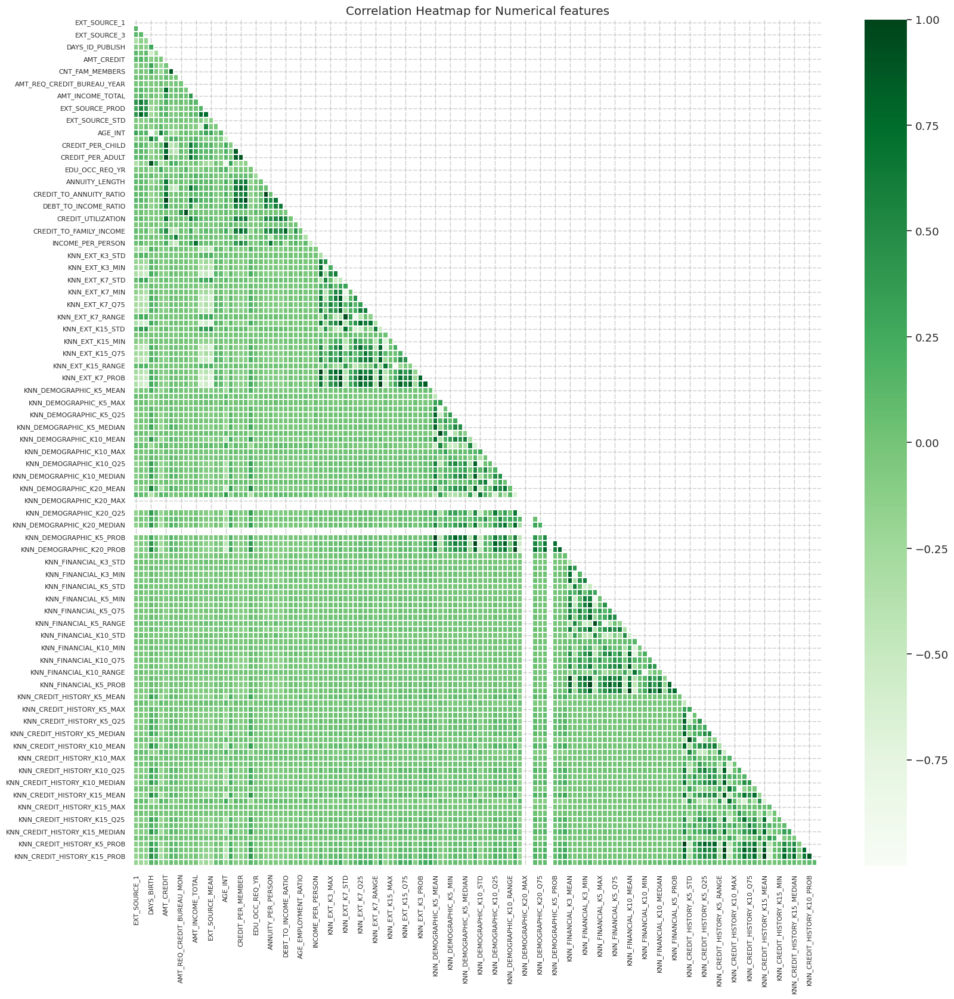

In [48]:
columns_to_drop = ['SK_ID_CURR'] + list(set(categorical_columns))
corr_mat1 = correlation_matrix(df, columns_to_drop, figsize = (17,17), fontsize = 8, cmap = 'Greens')
corr_mat1.plot_correlation_matrix()

In [49]:
len(df.columns)

143

In [50]:
corr_mat1.target_top_corr(target_top_columns = 10)

  0%|          | 0/138 [00:00<?, ?it/s]

interval columns not set, guessing: ['TARGET', 'EXT_SOURCE_1']
interval columns not set, guessing: ['TARGET', 'EXT_SOURCE_2']
interval columns not set, guessing: ['TARGET', 'EXT_SOURCE_3']
interval columns not set, guessing: ['TARGET', 'DAYS_BIRTH']
interval columns not set, guessing: ['TARGET', 'DAYS_ID_PUBLISH']
interval columns not set, guessing: ['TARGET', 'DAYS_EMPLOYED']
interval columns not set, guessing: ['TARGET', 'AMT_CREDIT']
interval columns not set, guessing: ['TARGET', 'CNT_CHILDREN']
interval columns not set, guessing: ['TARGET', 'CNT_FAM_MEMBERS']
interval columns not set, guessing: ['TARGET', 'AMT_REQ_CREDIT_BUREAU_MON']
interval columns not set, guessing: ['TARGET', 'AMT_REQ_CREDIT_BUREAU_YEAR']
interval columns not set, guessing: ['TARGET', 'AMT_ANNUITY']
interval columns not set, guessing: ['TARGET', 'AMT_INCOME_TOTAL']
interval columns not set, guessing: ['TARGET', 'EXT_SOURCE_SUM']
interval columns not set, guessing: ['TARGET', 'EXT_SOURCE_PROD']
interval columns 

,Column Name,Phik-Correlation
15,EXT_SOURCE_MEAN,0.450761
13,EXT_SOURCE_SUM,0.392873
49,KNN_EXT_K15_MEAN,0.392650
59,KNN_EXT_K15_PROB,0.392650
55,KNN_EXT_K15_MEDIAN,0.381420
41,KNN_EXT_K7_MEAN,0.350755
58,KNN_EXT_K7_PROB,0.350755
2,EXT_SOURCE_3,0.346910
47,KNN_EXT_K7_MEDIAN,0.336940
1,EXT_SOURCE_2,0.317193


**External Risk Features**  
EXT_SOURCE_MEAN (0.450), EXT_SOURCE_SUM (0.393), EXT_SOURCE_PROD (0.263), EXT_SOURCE_STD (0.105)  
→ These are consistently the strongest predictors. External scores are machine-generated credit risk proxies and already incorporate nonlinear and behavioral signals. Aggregating them enhances robustness and stability.

**KNN-Based Features**  
KNN_FINANCIAL_TARGET_MEAN (0.200) is the strongest among all KNN features, confirming that local financial similarity is highly predictive.  
KNN_DEMOGRAPHIC_TARGET_MEAN (0.131), KNN_CREDIT_HISTORY_TARGET_MEAN (0.064), and others contribute moderately.  
→ These features capture neighborhood-level behaviors and local risk clusters, especially useful for non-linear models.

**Credit Burden and Financial Ratios**  
ANNUITY_LENGTH (0.189), CREDIT_TO_ANNUITY_RATIO (0.189), ANNUITY_CREDIT_DIFF (0.139)  
→ These features reflect borrower burden and are highly relevant to repayment capacity.  
DEBT_TO_INCOME_RATIO (0.046), CREDIT_UTILIZATION (0.049) are weaker individually but useful in ensemble or interaction-based models.

**Demographics**  
AGE_INT (0.179), DAYS_BIRTH (0.177), OCC_DAYS_BIRTH (0.163)  
→ Age remains a core factor in credit scoring. Adjustments based on occupation provide additional nuance.  
CNT_CHILDREN, CNT_FAM_MEMBERS, FAMILY_DEPENDENCY show low direct correlation but may act as modifiers in model interaction terms.

**Employment Features**  
DAYS_EMPLOYED (0.140), DAYS_EMPLOYED_PERC (0.122), AGE_EMPLOYMENT_RATIO (0.018)  
→ These capture employment stability and maturity, relevant for long-term repayment risk.

**Behavioral Aggregates**  
EDU_OCC_REQ_YR (0.102), EDU_OCC_REQ_MON (0.073)  
→ Reflect behavioral tendencies by occupation and education group.  
NUM_CREDIT_LINES (0.053), AMT_REQ_CREDIT_BUREAU_YEAR (0.043) also relate to borrower intent or aggressiveness in credit applications.

**Raw Financial Inputs**  
AMT_INCOME_TOTAL (0.017), AMT_CREDIT (0.145), AMT_ANNUITY (0.057)  
→ Base variables have limited standalone predictive power; they become more valuable when used in ratios or transformed features.

**Summary**  
Engineered features (aggregates, ratios, and KNN-based proximity metrics) significantly outperform raw inputs. Phik analysis confirms the value of both domain knowledge and data-driven locality in capturing credit risk patterns.


# IV 

In [51]:
def calculate_iv(df, feature, target, bins=10):
    temp_df = df[[feature, target]].copy()
    if pd.api.types.is_numeric_dtype(df[feature]):
        temp_df[feature] = pd.qcut(df[feature].rank(method='first'), q=bins, duplicates='drop')
    grouped = temp_df.groupby(feature)[target]
    dist_good = (grouped.count() - grouped.sum()) / (len(df) - df[target].sum())
    dist_bad = grouped.sum() / df[target].sum()
    woe = np.log((dist_good + 1e-6) / (dist_bad + 1e-6))
    iv = ((dist_good - dist_bad) * woe).sum()
    return iv

non_features = ['SK_ID_CURR', 'TARGET']
feature_candidates = [col for col in df.columns if col not in non_features and df[col].nunique() > 1]

iv_results = []
for col in feature_candidates:
    try:
        iv = calculate_iv(df, col, 'TARGET')
        iv_results.append((col, iv))
    except Exception:
        continue

iv_df_raw = pd.DataFrame(iv_results, columns=["Feature", "IV"]).sort_values(by="IV", ascending=False).reset_index(drop=True)

/tmp/ipykernel_996770/3906081897.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped = temp_df.groupby(feature)[target]
/tmp/ipykernel_996770/3906081897.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped = temp_df.groupby(feature)[target]
/tmp/ipykernel_996770/3906081897.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped = temp_df.groupby(feature)[target]
/tmp/ipykernel_996770/3906081897.py:5: F

In [52]:
iv_df_raw

,Feature,IV
0,EXT_SOURCE_MEAN,0.557185
1,EXT_SOURCE_SUM,0.407663
2,KNN_EXT_K15_MEAN,0.406350
3,KNN_EXT_K15_PROB,0.406350
4,EXT_SOURCE_PROD,0.363295
...,...,...
133,KNN_CREDIT_HISTORY_K15_RANGE,0.003439
134,KNN_DEMOGRAPHIC_K10_RANGE,0.003366
135,KNN_FINANCIAL_K10_RANGE,0.003041
136,KNN_CREDIT_HISTORY_K10_MIN,0.002885


In [53]:
iv_df = iv_df_raw[iv_df_raw["IV"] >= 0.02].reset_index(drop=True)
iv_df.tail()

,Feature,IV
75,KNN_DEMOGRAPHIC_K5_MEAN,0.021835
76,KNN_DEMOGRAPHIC_K5_PROB,0.021835
77,AMT_REQ_CREDIT_BUREAU_YEAR,0.020866
78,KNN_FINANCIAL_K3_MIN,0.020551
79,NUM_CREDIT_LINES,0.020357


In [54]:
df.isnull().sum()[df.isnull().sum() > 0].sort_values(ascending=False)

Series([], dtype: int64)

In [55]:
selected_features = iv_df["Feature"].tolist()
selected_features += ['TARGET']
df = df[selected_features] 

In [56]:
df.head()

,EXT_SOURCE_MEAN,EXT_SOURCE_SUM,KNN_EXT_K15_MEAN,KNN_EXT_K15_PROB,EXT_SOURCE_PROD,EXT_SOURCE_3,KNN_EXT_K7_MEAN,KNN_EXT_K7_PROB,EXT_SOURCE_2,KNN_EXT_K15_Q25,...,AMT_ANNUITY,KNN_FINANCIAL_K10_Q25,KNN_CREDIT_HISTORY_K15_STD,CREDIT_PER_MEMBER,KNN_DEMOGRAPHIC_K5_MEAN,KNN_DEMOGRAPHIC_K5_PROB,AMT_REQ_CREDIT_BUREAU_YEAR,KNN_FINANCIAL_K3_MIN,NUM_CREDIT_LINES,TARGET
0,0.622138,1.866414,0.466667,0.466667,0.236366,0.720944,0.428571,0.428571,0.585768,0.0,...,24601.5,0.00,0.471405,124380.0,0.4,0.4,1.000000,0.0,1.000000,1
1,0.700521,0.700521,0.600000,0.600000,0.700521,0.438042,0.714286,0.714286,0.700521,0.0,...,42651.0,0.25,0.489898,417690.0,0.6,0.6,1.955960,1.0,2.210508,0
2,0.565380,1.130760,0.600000,0.600000,0.317728,0.609276,0.571429,0.571429,0.521484,0.0,...,25645.5,1.00,0.442217,422235.0,0.8,0.8,4.000000,0.0,4.000000,1
3,0.424530,1.273589,0.600000,0.600000,0.044087,0.740799,0.571429,0.571429,0.159371,0.0,...,26451.0,0.00,0.489898,226422.0,0.4,0.4,3.000000,0.0,4.000000,0
4,0.413890,0.413890,0.600000,0.600000,0.413890,0.449991,0.285714,0.285714,0.413890,0.0,...,26500.5,0.25,0.442217,206307.0,0.8,0.8,1.960063,0.0,2.166406,1


# SLPIT

In [57]:
X_train, X_test, y_train, y_test = train_test_split(df.drop(columns=['TARGET']), df['TARGET'], test_size=0.3, random_state=42, stratify=df['TARGET'])
print(f"Training set: {X_train.shape[0]} samples")

Training set: 7000 samples


In [58]:
X_train.head()

,EXT_SOURCE_MEAN,EXT_SOURCE_SUM,KNN_EXT_K15_MEAN,KNN_EXT_K15_PROB,EXT_SOURCE_PROD,EXT_SOURCE_3,KNN_EXT_K7_MEAN,KNN_EXT_K7_PROB,EXT_SOURCE_2,KNN_EXT_K15_Q25,...,KNN_CREDIT_HISTORY_K15_Q25,AMT_ANNUITY,KNN_FINANCIAL_K10_Q25,KNN_CREDIT_HISTORY_K15_STD,CREDIT_PER_MEMBER,KNN_DEMOGRAPHIC_K5_MEAN,KNN_DEMOGRAPHIC_K5_PROB,AMT_REQ_CREDIT_BUREAU_YEAR,KNN_FINANCIAL_K3_MIN,NUM_CREDIT_LINES
6402,0.265813,0.531626,0.666667,0.666667,0.060575,0.165407,0.428571,0.428571,0.366218,0.0,...,1.0,12001.5,1.00,0.339935,269550.0,1.0,1.0,1.0,0.0,1.0
770,0.608748,1.217497,0.533333,0.533333,0.368226,0.560284,0.428571,0.428571,0.657212,0.0,...,0.0,26284.5,0.00,0.471405,337500.0,1.0,1.0,3.0,0.0,3.0
257,0.689443,0.689443,0.600000,0.600000,0.689443,0.438042,0.428571,0.428571,0.689443,0.0,...,0.0,24925.5,0.25,0.489898,457119.0,0.6,0.6,3.0,0.0,4.0
7428,0.374953,1.124859,0.666667,0.666667,0.023590,0.392774,0.571429,0.571429,0.637937,0.0,...,0.0,35617.5,1.00,0.471405,272520.0,0.6,0.6,0.0,1.0,0.0
7063,0.491584,1.474753,0.533333,0.533333,0.116282,0.511892,0.714286,0.714286,0.549365,0.0,...,0.5,51543.0,0.00,0.442217,335640.0,0.6,0.6,1.0,0.0,1.0


In [59]:
X_train_iv = X_train.copy()
X_train_iv['TARGET'] = y_train

non_features = ['SK_ID_CURR', 'TARGET']
feature_candidates_train = [col for col in X_train_iv.columns if col not in non_features and X_train_iv[col].nunique() > 1]

iv_results_train = []
for col in feature_candidates_train:
    try:
        iv = calculate_iv(X_train_iv, col, 'TARGET')
        iv_results_train.append((col, iv))
    except Exception:
        continue

iv_df_train = pd.DataFrame(iv_results_train, columns=["Feature", "IV"]).sort_values(by="IV", ascending=False).reset_index(drop=True)

/tmp/ipykernel_996770/3906081897.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped = temp_df.groupby(feature)[target]
/tmp/ipykernel_996770/3906081897.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped = temp_df.groupby(feature)[target]
/tmp/ipykernel_996770/3906081897.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped = temp_df.groupby(feature)[target]
/tmp/ipykernel_996770/3906081897.py:5: F

In [60]:
iv_df_train

,Feature,IV
0,EXT_SOURCE_MEAN,0.565774
1,EXT_SOURCE_SUM,0.393153
2,KNN_EXT_K15_MEAN,0.383605
3,KNN_EXT_K15_PROB,0.383605
4,EXT_SOURCE_PROD,0.373697
...,...,...
75,CREDIT_PER_MEMBER,0.022756
76,AMT_REQ_CREDIT_BUREAU_YEAR,0.018124
77,NUM_CREDIT_LINES,0.017210
78,KNN_CREDIT_HISTORY_K15_Q25,0.016450


# WOE BINNING

In [61]:
X_train = X_train.copy()
X_train["TARGET"] = y_train

In [63]:
def tree_binning_table(df, feature, target, max_leaf_nodes=5):
    df_temp = df[[feature, target]].dropna()
    X = df_temp[[feature]]
    y = df_temp[target]

    tree = DecisionTreeClassifier(max_leaf_nodes=max_leaf_nodes, min_samples_leaf=0.05)
    tree.fit(X, y)

    thresholds = np.sort(tree.tree_.threshold[tree.tree_.threshold != -2])
    bins = [-np.inf] + thresholds.tolist() + [np.inf]
    df_temp["bin"] = pd.cut(df_temp[feature], bins=bins).astype(str)

    grouped = df_temp.groupby("bin")[target].agg(["count", "sum"])
    grouped.columns = ["total", "bad"]
    grouped["good"] = grouped["total"] - grouped["bad"]
    grouped["bad_rate"] = grouped["bad"] / grouped["total"]
    grouped["dist_good"] = grouped["good"] / grouped["good"].sum()
    grouped["dist_bad"] = grouped["bad"] / grouped["bad"].sum()
    grouped["woe"] = np.log((grouped["dist_good"] + 1e-6) / (grouped["dist_bad"] + 1e-6))
    grouped["iv"] = (grouped["dist_good"] - grouped["dist_bad"]) * grouped["woe"]
    grouped = grouped.reset_index()
    return grouped, bins

tree_binning_results = []
tree_iv_summary = []

for feature in iv_df_train["Feature"]:
    try:
        result, bins = tree_binning_table(X_train, feature, "TARGET")
        result.insert(0, "Feature", feature)
        result["bin_range"] = result["bin"]
        tree_binning_results.append(result)

        iv_sum = result["iv"].sum()
        tree_iv_summary.append((feature, iv_sum))
    except Exception as e:
        continue

tree_iv_df = pd.DataFrame(tree_iv_summary, columns=["Feature", "IV_after_tree"]).sort_values(by="IV_after_tree", ascending=False).reset_index(drop=True)
tree_woe_df = pd.concat(tree_binning_results, ignore_index=True)


In [64]:
tree_woe_df

,Feature,bin,total,bad,good,bad_rate,dist_good,dist_bad,woe,iv,bin_range
0,EXT_SOURCE_MEAN,"(-inf, 0.296]",1424,1195,229,0.839185,0.084346,0.278880,-1.195843,0.232632,"(-inf, 0.296]"
1,EXT_SOURCE_MEAN,"(0.296, 0.395]",1274,946,328,0.742543,0.120810,0.220770,-0.602897,0.060265,"(0.296, 0.395]"
2,EXT_SOURCE_MEAN,"(0.395, 0.498]",1575,984,591,0.624762,0.217680,0.229638,-0.053481,0.000640,"(0.395, 0.498]"
3,EXT_SOURCE_MEAN,"(0.498, 0.575]",1098,564,534,0.513661,0.196685,0.131622,0.401668,0.026134,"(0.498, 0.575]"
4,EXT_SOURCE_MEAN,"(0.575, inf]",1629,596,1033,0.365869,0.380479,0.139090,1.006306,0.242911,"(0.575, inf]"
...,...,...,...,...,...,...,...,...,...,...,...
311,KNN_CREDIT_HISTORY_K15_STD,"(-inf, 0.421]",1138,768,370,0.674868,0.136280,0.179230,-0.273956,0.011766,"(-inf, 0.421]"
312,KNN_CREDIT_HISTORY_K15_STD,"(0.421, 0.457]",1136,675,461,0.594190,0.169797,0.157526,0.075013,0.000921,"(0.421, 0.457]"
313,KNN_CREDIT_HISTORY_K15_STD,"(0.457, 0.481]",1465,907,558,0.619113,0.205525,0.211669,-0.029455,0.000181,"(0.457, 0.481]"
314,KNN_CREDIT_HISTORY_K15_STD,"(0.481, 0.494]",1561,930,631,0.595772,0.232413,0.217036,0.068450,0.001053,"(0.481, 0.494]"


In [65]:
def smart_manual_binning(df, feature, target, bins=5):
    df_temp = df[[feature, target]].dropna()
    if df_temp[feature].nunique() < bins:
        try:
            df_temp["bin"] = pd.cut(df_temp[feature], bins=bins).astype(str)
        except:
            df_temp["bin"] = df_temp[feature].astype(str)
    else:
        try:
            df_temp["bin"] = pd.qcut(df_temp[feature], q=bins, duplicates='drop').astype(str)
        except:
            df_temp["bin"] = pd.cut(df_temp[feature], bins=bins).astype(str)

    grouped = df_temp.groupby("bin")[target].agg(["count", "sum"])
    grouped.columns = ["total", "bad"]
    grouped["good"] = grouped["total"] - grouped["bad"]
    grouped["bad_rate"] = grouped["bad"] / grouped["total"]
    grouped["dist_good"] = grouped["good"] / grouped["good"].sum()
    grouped["dist_bad"] = grouped["bad"] / grouped["bad"].sum()
    grouped["woe"] = np.log((grouped["dist_good"] + 1e-6) / (grouped["dist_bad"] + 1e-6))
    grouped["iv"] = (grouped["dist_good"] - grouped["dist_bad"]) * grouped["woe"]
    grouped = grouped.reset_index()
    return grouped


manual_binning_results = []
manual_iv_summary = []

for feature in iv_df_train["Feature"]:
    try:
        result = smart_manual_binning(X_train, feature, "TARGET", bins=5)
        result.insert(0, "Feature", feature)
        result["bin_range"] = result["bin"]
        manual_binning_results.append(result)

        iv_sum = result["iv"].sum()
        manual_iv_summary.append((feature, iv_sum))
    except Exception:
        continue

manual_iv_df = pd.DataFrame(manual_iv_summary, columns=["Feature", "IV_after_manual"]).sort_values(by="IV_after_manual", ascending=False).reset_index(drop=True)
manual_woe_df = pd.concat(manual_binning_results, ignore_index=True)

manual_woe_df

,Feature,bin,total,bad,good,bad_rate,dist_good,dist_bad,woe,iv,bin_range
0,EXT_SOURCE_MEAN,"(-0.000809, 0.293]",1400,1173,227,0.837857,0.083610,0.273746,-1.186033,0.225508,"(-0.000809, 0.293]"
1,EXT_SOURCE_MEAN,"(0.293, 0.402]",1400,1034,366,0.738571,0.134807,0.241307,-0.582225,0.062007,"(0.293, 0.402]"
2,EXT_SOURCE_MEAN,"(0.402, 0.495]",1400,866,534,0.618571,0.196685,0.202100,-0.027160,0.000147,"(0.402, 0.495]"
3,EXT_SOURCE_MEAN,"(0.495, 0.594]",1400,698,702,0.498571,0.258564,0.162894,0.462041,0.044203,"(0.495, 0.594]"
4,EXT_SOURCE_MEAN,"(0.594, 0.846]",1400,514,886,0.367143,0.326335,0.119953,1.000817,0.206550,"(0.594, 0.846]"
...,...,...,...,...,...,...,...,...,...,...,...
310,KNN_CREDIT_HISTORY_K15_STD,"(-1e-16, 0.4422166387140533]",2154,1390,764,0.645311,0.281400,0.324387,-0.142162,0.006111,"(-1e-16, 0.4422166387140533]"
311,KNN_CREDIT_HISTORY_K15_STD,"(0.4422166387140533, 0.4714045207910317]",695,412,283,0.592806,0.104236,0.096149,0.080751,0.000653,"(0.4422166387140533, 0.4714045207910317]"
312,KNN_CREDIT_HISTORY_K15_STD,"(0.4714045207910317, 0.4898979485566357]",2323,1392,931,0.599225,0.342910,0.324854,0.054091,0.000977,"(0.4714045207910317, 0.4898979485566357]"
313,KNN_CREDIT_HISTORY_K15_STD,"(0.4898979485566357, 0.4988876515698588]",1443,865,578,0.599446,0.212891,0.201867,0.053173,0.000586,"(0.4898979485566357, 0.4988876515698588]"


In [66]:
manual_iv_df.head()

,Feature,IV_after_manual
0,EXT_SOURCE_MEAN,0.538416
1,EXT_SOURCE_SUM,0.361907
2,KNN_EXT_K15_MEAN,0.359159
3,KNN_EXT_K15_PROB,0.359159
4,EXT_SOURCE_PROD,0.358563


In [67]:
optbinning_full_results = []
binning_results = []

for feature in iv_df_train["Feature"]:
    try:
        x = X_train[feature]
        y = y_train

        if X_train[feature].dtype == 'object' or feature == 'OCCUPATION_TYPE':
            optb = OptimalBinning(name=feature, dtype="categorical", solver="cp")
        else:
            optb = OptimalBinning(name=feature, dtype="numerical", solver="cp")
        
        optb.fit(x, y)
        df_bin = optb.binning_table.build()
        
        print(f"Columns for {feature}: {df_bin.columns.tolist()}")
        
        iv = optb.binning_table.iv
        binning_results.append((feature, iv))

        df_bin["Feature"] = feature
        df_bin["bin"] = df_bin.index.astype(str)
        
        column_mapping = {
            "Count": "total",
            "Event": "bad",
            "Event count": "bad",
            "Non-event": "good",
            "Non-event count": "good",
            "WoE": "woe",
            "IV": "iv",
            "Event rate": "bad_rate",
            "Dist. event": "dist_bad",
            "Dist event": "dist_bad",
            "Dist. non-event": "dist_good",
            "Dist non-event": "dist_good",
            "Bin": "bin_range"
        }
        
        for new_col in ["total", "bad", "good", "bad_rate", "woe", "iv", 
                        "dist_good", "dist_bad", "bin_range"]:
            if new_col not in df_bin.columns:
                for old_col, mapped_col in column_mapping.items():
                    if mapped_col == new_col and old_col in df_bin.columns:
                        df_bin[new_col] = df_bin[old_col]
                        break
                else:
                    df_bin[new_col] = None
        
        if df_bin["good"] is not None and df_bin["bad"] is not None:
            df_bin["dist_good"] = df_bin["good"] / df_bin["good"].sum()
            df_bin["dist_bad"] = df_bin["bad"] / df_bin["bad"].sum()
        
        selected_columns = ["Feature", "bin"]
        for col in ["total", "bad", "good", "bad_rate", "dist_good", 
                    "dist_bad", "woe", "iv", "bin_range"]:
            if col in df_bin.columns:
                selected_columns.append(col)
                
        df_bin = df_bin[selected_columns]
        optbinning_full_results.append(df_bin)

    except Exception as e:
        print(f"{feature}: lỗi - {e}")
        continue

if optbinning_full_results:
    opt_woe_df = pd.concat(optbinning_full_results, ignore_index=True)
    opt_woe_df = opt_woe_df[opt_woe_df["bin"] != "Totals"]
    opt_woe_df = opt_woe_df[opt_woe_df["bin"] != "Totals"]
    opt_woe_df["bin_range"] = opt_woe_df["bin_range"].astype(str)
    opt_woe_df = opt_woe_df[~opt_woe_df["bin_range"].str.contains("Special", na=False)]
    opt_woe_df = opt_woe_df[~opt_woe_df["bin_range"].str.contains("Missing", na=False)]
    
    opt_iv_df = pd.DataFrame(binning_results, columns=["Feature", "IV_after_OptBinning"])
else:
    print("No successful binning results to concatenate.")

Columns for EXT_SOURCE_MEAN: ['Bin', 'Count', 'Count (%)', 'Non-event', 'Event', 'Event rate', 'WoE', 'IV', 'JS']
Columns for EXT_SOURCE_SUM: ['Bin', 'Count', 'Count (%)', 'Non-event', 'Event', 'Event rate', 'WoE', 'IV', 'JS']
Columns for KNN_EXT_K15_MEAN: ['Bin', 'Count', 'Count (%)', 'Non-event', 'Event', 'Event rate', 'WoE', 'IV', 'JS']
Columns for KNN_EXT_K15_PROB: ['Bin', 'Count', 'Count (%)', 'Non-event', 'Event', 'Event rate', 'WoE', 'IV', 'JS']
Columns for EXT_SOURCE_PROD: ['Bin', 'Count', 'Count (%)', 'Non-event', 'Event', 'Event rate', 'WoE', 'IV', 'JS']
Columns for EXT_SOURCE_3: ['Bin', 'Count', 'Count (%)', 'Non-event', 'Event', 'Event rate', 'WoE', 'IV', 'JS']
Columns for KNN_EXT_K7_MEAN: ['Bin', 'Count', 'Count (%)', 'Non-event', 'Event', 'Event rate', 'WoE', 'IV', 'JS']
Columns for KNN_EXT_K7_PROB: ['Bin', 'Count', 'Count (%)', 'Non-event', 'Event', 'Event rate', 'WoE', 'IV', 'JS']
Columns for EXT_SOURCE_2: ['Bin', 'Count', 'Count (%)', 'Non-event', 'Event', 'Event rate'

In [68]:
opt_woe_df

,Feature,bin,total,bad,good,bad_rate,dist_good,dist_bad,woe,iv,bin_range
0,EXT_SOURCE_MEAN,0,457,409,48,0.894967,0.008840,0.047725,-1.686186,0.131134,"(-inf, 0.18)"
1,EXT_SOURCE_MEAN,1,967,786,181,0.812823,0.033333,0.091715,-1.012131,0.118180,"[0.18, 0.30)"
2,EXT_SOURCE_MEAN,2,386,295,91,0.764249,0.016759,0.034422,-0.719787,0.025428,"[0.30, 0.33)"
3,EXT_SOURCE_MEAN,3,888,651,237,0.733108,0.043646,0.075963,-0.554121,0.035814,"[0.33, 0.39)"
4,EXT_SOURCE_MEAN,4,402,265,137,0.659204,0.025230,0.030922,-0.20342,0.002316,"[0.39, 0.42)"
...,...,...,...,...,...,...,...,...,...,...,...
664,KNN_CREDIT_HISTORY_K15_STD,0,441,299,142,0.678005,0.026151,0.034889,-0.288288,0.005038,"(-inf, 0.37)"
665,KNN_CREDIT_HISTORY_K15_STD,1,697,469,228,0.672884,0.041989,0.054726,-0.264929,0.006749,"[0.37, 0.42)"
666,KNN_CREDIT_HISTORY_K15_STD,2,2601,1582,1019,0.608228,0.187661,0.184597,0.01646,0.000101,"[0.42, 0.48)"
667,KNN_CREDIT_HISTORY_K15_STD,3,1561,930,631,0.595772,0.116206,0.108518,0.06845,0.001053,"[0.48, 0.49)"


In [69]:
opt_iv_df.head()

,Feature,IV_after_OptBinning
0,EXT_SOURCE_MEAN,0.598752
1,EXT_SOURCE_SUM,0.416671
2,KNN_EXT_K15_MEAN,0.396431
3,KNN_EXT_K15_PROB,0.396431
4,EXT_SOURCE_PROD,0.397991


In [70]:
opt_iv_df

,Feature,IV_after_OptBinning
0,EXT_SOURCE_MEAN,0.598752
1,EXT_SOURCE_SUM,0.416671
2,KNN_EXT_K15_MEAN,0.396431
3,KNN_EXT_K15_PROB,0.396431
4,EXT_SOURCE_PROD,0.397991
...,...,...
75,CREDIT_PER_MEMBER,0.021350
76,AMT_REQ_CREDIT_BUREAU_YEAR,0.017459
77,NUM_CREDIT_LINES,0.005813
78,KNN_CREDIT_HISTORY_K15_Q25,0.015337


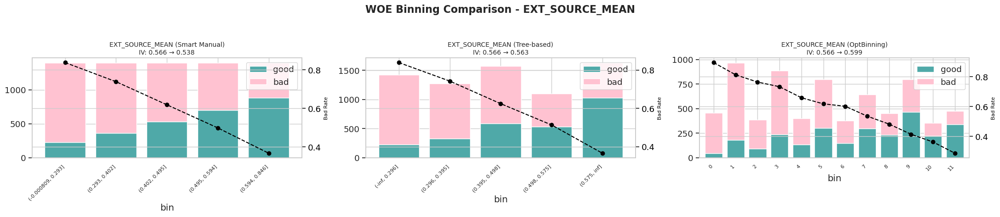

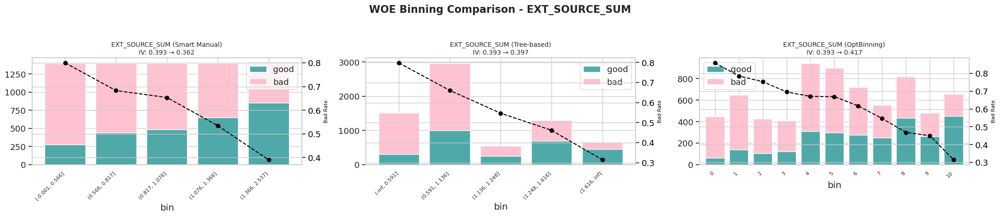

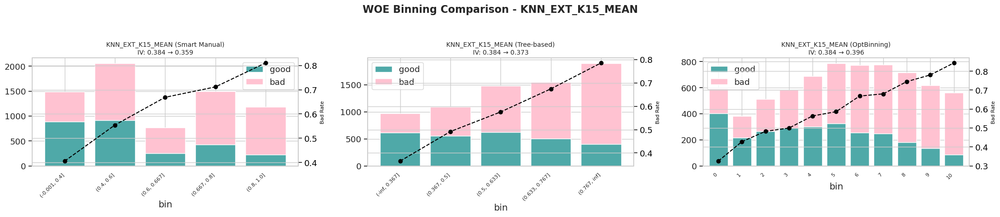

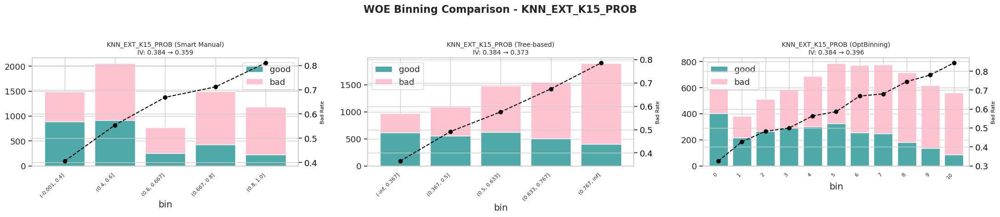

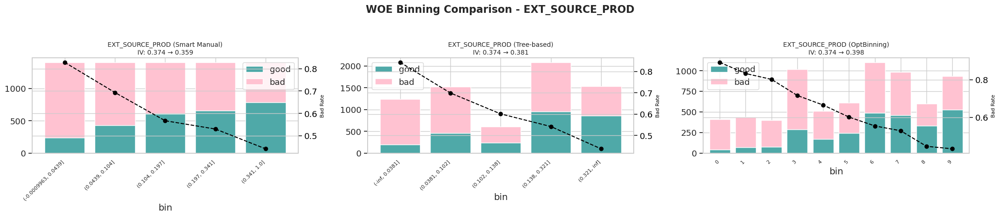

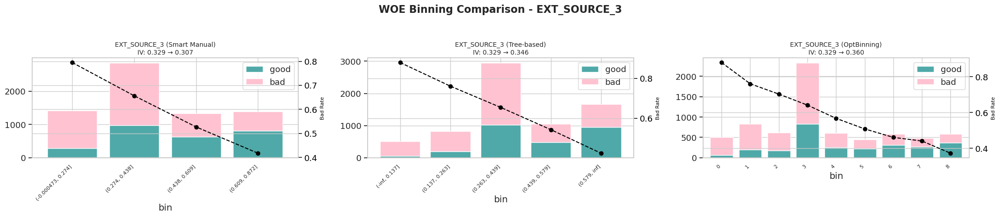

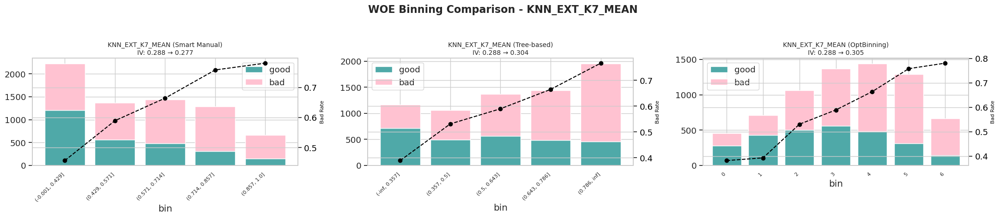

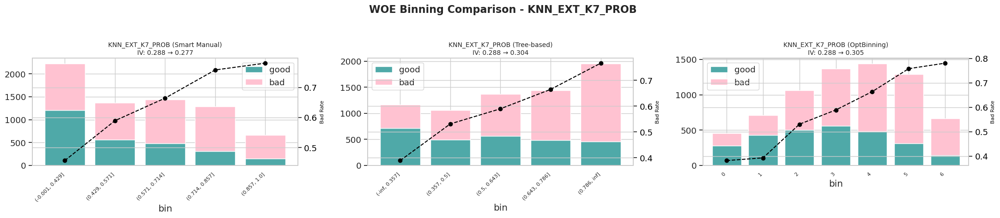

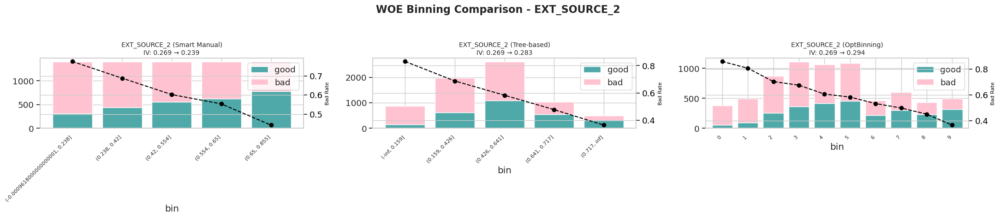

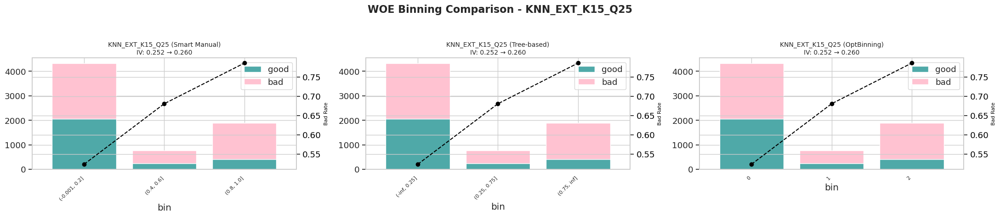

In [71]:
common_features = set(manual_woe_df["Feature"]) & set(tree_woe_df["Feature"]) & set(opt_woe_df["Feature"])

top_10_features = iv_df_train["Feature"].head(10)
for feature in top_10_features:
    if feature not in common_features:
        continue
    try:
        df_manual = manual_woe_df[manual_woe_df["Feature"] == feature]
        df_tree = tree_woe_df[tree_woe_df["Feature"] == feature]
        df_opt = opt_woe_df[opt_woe_df["Feature"] == feature]
        plot_woe_comparison_3methods(feature, df_manual, df_tree, df_opt, iv_df_train)
    except Exception:
        continue


In [72]:
iv_compare_all = iv_df_train.copy()
iv_compare_all = iv_compare_all.merge(manual_iv_df, on="Feature", how="left")
iv_compare_all = iv_compare_all.merge(tree_iv_df, on="Feature", how="left")
iv_compare_all = iv_compare_all.merge(opt_iv_df, on="Feature", how="left")

In [73]:
def select_best_method(row):
    ivs = {
        "manual": row["IV_after_manual"],
        "tree": row["IV_after_tree"],
        "OptBinning": row["IV_after_OptBinning"]
    }
    ivs_cleaned = {k: v for k, v in ivs.items() if pd.notnull(v)}
    if not ivs_cleaned:
        return "None"
    return max(ivs_cleaned, key=ivs_cleaned.get)

def binning_decision(row):
    iv_orig = row["IV"]
    best_method = row["Best_Binning_Method"]

    iv_manual = row.get("IV_after_manual", float("-inf"))
    iv_tree = row.get("IV_after_tree", float("-inf"))
    iv_opt = row.get("IV_after_OptBinning", float("-inf"))

    best_iv = {
        "manual": iv_manual,
        "tree": iv_tree,
        "OptBinning": iv_opt
    }.get(best_method, float("-inf"))

    if pd.isna(best_iv) or best_iv <= iv_orig:
        return "keep raw"
    else:
        return f"{best_method}"

iv_compare_all["Best_Binning_Method"] = iv_compare_all.apply(select_best_method, axis=1)
iv_compare_all["binning_rec"] = iv_compare_all.apply(binning_decision, axis=1)

iv_compare_all


,Feature,IV,IV_after_manual,IV_after_tree,IV_after_OptBinning,Best_Binning_Method,binning_rec
0,EXT_SOURCE_MEAN,0.565774,0.538416,0.562581,0.598752,OptBinning,OptBinning
1,EXT_SOURCE_SUM,0.393153,0.361907,0.396796,0.416671,OptBinning,OptBinning
2,KNN_EXT_K15_MEAN,0.383605,0.359159,0.373276,0.396431,OptBinning,OptBinning
3,KNN_EXT_K15_PROB,0.383605,0.359159,0.373276,0.396431,OptBinning,OptBinning
4,EXT_SOURCE_PROD,0.373697,0.358563,0.380923,0.397991,OptBinning,OptBinning
...,...,...,...,...,...,...,...
75,CREDIT_PER_MEMBER,0.022756,0.014445,0.029460,0.021350,tree,tree
76,AMT_REQ_CREDIT_BUREAU_YEAR,0.018124,0.010664,0.017865,0.017459,tree,keep raw
77,NUM_CREDIT_LINES,0.017210,0.018241,0.018241,0.005813,manual,manual
78,KNN_CREDIT_HISTORY_K15_Q25,0.016450,0.015337,0.015337,0.015337,OptBinning,keep raw


In [74]:
iv_compare_all.loc[iv_compare_all["Feature"] == "NUM_CREDIT_LINES", "binning_rec"] = "tree"


In [75]:
iv_compare_all

,Feature,IV,IV_after_manual,IV_after_tree,IV_after_OptBinning,Best_Binning_Method,binning_rec
0,EXT_SOURCE_MEAN,0.565774,0.538416,0.562581,0.598752,OptBinning,OptBinning
1,EXT_SOURCE_SUM,0.393153,0.361907,0.396796,0.416671,OptBinning,OptBinning
2,KNN_EXT_K15_MEAN,0.383605,0.359159,0.373276,0.396431,OptBinning,OptBinning
3,KNN_EXT_K15_PROB,0.383605,0.359159,0.373276,0.396431,OptBinning,OptBinning
4,EXT_SOURCE_PROD,0.373697,0.358563,0.380923,0.397991,OptBinning,OptBinning
...,...,...,...,...,...,...,...
75,CREDIT_PER_MEMBER,0.022756,0.014445,0.029460,0.021350,tree,tree
76,AMT_REQ_CREDIT_BUREAU_YEAR,0.018124,0.010664,0.017865,0.017459,tree,keep raw
77,NUM_CREDIT_LINES,0.017210,0.018241,0.018241,0.005813,manual,tree
78,KNN_CREDIT_HISTORY_K15_Q25,0.016450,0.015337,0.015337,0.015337,OptBinning,keep raw


In [76]:
import re
import ast
import numpy as np
import pandas as pd
from sklearn.preprocessing import LabelEncoder
from optbinning import OptimalBinning

def apply_recommended_binning(X_df, y_series, recommendations_df, 
                             opt_woe_df=None, tree_woe_df=None, manual_woe_df=None):
    X_original = X_df.copy()
    X_binned = X_df.copy()
    
    # Dictionary to store binning objects/mappings for future use
    binning_objects = {}
    
    def apply_woe_mapping(x, woe_df, method='numerical'):
        """Map a value to its corresponding WoE based on bin ranges"""
        # Handle missing values
        if pd.isna(x):
            return np.nan
        
        # For categorical variables
        if method == 'categorical':
            # Try exact match against bin_range
            exact_match = woe_df[woe_df['bin_range'] == str(x)]
            if not exact_match.empty:
                return exact_match['woe'].iloc[0]
                
            for _, row in woe_df.iterrows():
                bin_range = row['bin_range']
                if not isinstance(bin_range, str):
                    continue
                    
                try:
                    if "'" in bin_range or '"' in bin_range:
                        cleaned_bin = bin_range.replace('\n', ' ').replace("'", "").replace('"', "")
                        if str(x) in cleaned_bin:
                            pattern = r'\b' + re.escape(str(x)) + r'\b'
                            if re.search(pattern, cleaned_bin):
                                return row['woe']
                        
                        try:
                            ast_parseable = bin_range.replace("' '", "','").replace('" "', '","')
                            values = ast.literal_eval(ast_parseable)
                            
                            if str(x) in values or x in values:
                                return row['woe']
                        except:
                            pass
                        
                        if bin_range.startswith("[") and bin_range.endswith("]"):
                            clean_str = bin_range.replace('[', '').replace(']', '').replace("'", "").replace('"', "")
                            values = [val.strip() for val in re.split(r'\s+', clean_str) if val.strip()]
                            
                            if str(x) in values or x in values:
                                return row['woe']
                except Exception as e:
                    continue
            
            return np.nan
        
        elif isinstance(x, (int, float)):
            for _, row in woe_df.iterrows():
                bin_range = row['bin_range']
                
                if not isinstance(bin_range, str):
                    continue
                
                try:
                    # Case 1: (-inf, value) or (-inf, value] - Less than value
                    if bin_range.startswith('(-inf'):
                        parts = bin_range.split(',')
                        upper_str = parts[1].strip()
                        
                        # Handle both exclusive ) and inclusive ] bounds
                        is_inclusive = upper_str.endswith(']')
                        upper = float(upper_str.rstrip(')]'))
                        
                        if (is_inclusive and x <= upper) or (not is_inclusive and x < upper):
                            return row['woe']
                    
                    # Case 2: [value, inf) or (value, inf) - Greater than or equal to value
                    elif 'inf)' in bin_range:
                        parts = bin_range.split(',')
                        lower_str = parts[0].strip()
                        
                        # Handle both inclusive [ and exclusive ( bounds
                        is_inclusive = lower_str.startswith('[')
                        lower = float(lower_str.lstrip('[('))
                        
                        if (is_inclusive and x >= lower) or (not is_inclusive and x > lower):
                            return row['woe']
                    
                    # Case 3: Standard interval notations with different combinations of brackets
                    elif (',' in bin_range and 
                          (bin_range.startswith('[') or bin_range.startswith('(')) and
                          (bin_range.endswith(']') or bin_range.endswith(')'))):
                        
                        # Determine inclusivity
                        lower_inclusive = bin_range.startswith('[')
                        upper_inclusive = bin_range.endswith(']')
                        
                        # Extract bounds
                        parts = bin_range.strip('[]()').split(',')
                        lower = float(parts[0].strip())
                        upper = float(parts[1].strip())
                        
                        # Check if the value falls in the interval
                        lower_condition = (x >= lower) if lower_inclusive else (x > lower)
                        upper_condition = (x <= upper) if upper_inclusive else (x < upper)
                        
                        if lower_condition and upper_condition:
                            return row['woe']
                
                except Exception as e:
                    continue
        
        # If we get here, no bin matched
        return np.nan
    
    # Process each feature according to its recommended binning method
    for _, row in recommendations_df.iterrows():
        feature = row["Feature"]
        binning_rec = row["binning_rec"]
        
        if feature not in X_df.columns:
            print(f"Feature {feature} not found in the dataset")
            continue
        
        # Apply the recommended binning method
        if binning_rec == "keep raw":
            # Keep original values - no transformation
            print(f"Keeping {feature} as raw (unbinned)")
            
            # IMPORTANT: preserve the original values for "keep raw" features
            X_binned[feature] = X_train[feature].copy()
            
            binning_objects[feature] = {
                'method': 'keep raw'
            }
            continue
            
        elif binning_rec == "OptBinning":
            print(f"Binning {feature} using OptBinning method")
            
            try:
                # Get the feature values
                x = X_df[feature]
                y = y_series
                
                # Determine data type
                if X_df[feature].dtype == 'object' or feature == 'OCCUPATION_TYPE':
                    # For categorical features, encode first to handle non-numeric categories
                    dtype = "categorical"
                else:
                    dtype = "numerical"
                
                # Create and fit OptimalBinning
                optb = OptimalBinning(name=feature, dtype=dtype, solver="cp")
                optb.fit(x, y)
                
                # Store the binning object
                binning_objects[feature] = {
                    'method': 'OptBinning',
                    'binner': optb
                }
                
                # Apply transformation directly
                X_binned[feature] = optb.transform(x, metric="woe")
            
            except Exception as e:
                print(f"Error applying OptBinning to {feature}: {e}")
                
                # Fall back to using precomputed WoE mapping if available
                if opt_woe_df is not None:
                    woe_df = opt_woe_df[opt_woe_df["Feature"] == feature].copy()
                    
                    if not woe_df.empty:
                        print(f"  Falling back to precomputed OptBinning WoE mapping")
                        is_categorical = X_df[feature].dtype == 'object' or feature == 'OCCUPATION_TYPE'
                        method_type = 'categorical' if is_categorical else 'numerical'
                        
                        X_binned[feature] = X_df[feature].apply(
                            lambda x: apply_woe_mapping(x, woe_df, method_type))
                        
                        binning_objects[feature] = {
                            'method': 'OptBinning_mapping',
                            'mapping': woe_df[['bin_range', 'woe']].set_index('bin_range')['woe'].to_dict()
                        }
                
        elif binning_rec == "tree":
            print(f"Binning {feature} using tree method")
            
            if tree_woe_df is None:
                print(f"  No tree WoE dataframe provided for {feature}, skipping")
                continue
            
            # Get the WoE mapping for this feature
            woe_df = tree_woe_df[tree_woe_df["Feature"] == feature].copy()
            
            if woe_df.empty:
                print(f"  No tree binning data available for {feature}, skipping")
                continue
            
            # Store the mapping
            binning_objects[feature] = {
                'method': 'tree',
                'mapping': woe_df[['bin_range', 'woe']].set_index('bin_range')['woe'].to_dict()
            }
            
            # Apply the mapping
            is_categorical = X_df[feature].dtype == 'object' or feature == 'OCCUPATION_TYPE'
            method_type = 'categorical' if is_categorical else 'numerical'
            
            X_binned[feature] = X_df[feature].apply(
                lambda x: apply_woe_mapping(x, woe_df, method_type))
        
        elif binning_rec == "manual":
            print(f"Binning {feature} using manual method")
            
            if manual_woe_df is None:
                print(f"  No manual WoE dataframe provided for {feature}, skipping")
                continue
            
            # Get the WoE mapping for this feature
            woe_df = manual_woe_df[manual_woe_df["Feature"] == feature].copy()
            
            if woe_df.empty:
                print(f"  No manual binning data available for {feature}, skipping")
                continue
            
            # Store the mapping
            binning_objects[feature] = {
                'method': 'manual',
                'mapping': woe_df[['bin_range', 'woe']].set_index('bin_range')['woe'].to_dict()
            }
            
            # Apply the mapping
            is_categorical = X_df[feature].dtype == 'object' or feature == 'OCCUPATION_TYPE'
            method_type = 'categorical' if is_categorical else 'numerical'
            
            X_binned[feature] = X_df[feature].apply(
                lambda x: apply_woe_mapping(x, woe_df, method_type))
        
        else:
            print(f"Unknown binning method for {feature}: {binning_rec}")
            continue
        
        # Check for NaN values
        nan_count = X_binned[feature].isna().sum()
        if nan_count > 0:
            nan_pct = nan_count / len(X_binned) * 100
            print(f"  Warning: {feature} has {nan_count} NaN values ({nan_pct:.2f}%)")
            
            # Show sample problematic values if there are too many NaNs
            if nan_pct > 10:
                nan_mask = X_binned[feature].isna()
                sample_vals = X_df[feature][nan_mask].sample(min(5, nan_count)).tolist()
                print(f"  Sample values not mapped: {sample_vals}")
        
    return X_binned, binning_objects

# Apply the binning to your data
X_train_binned, binning_objects = apply_recommended_binning(
    X_train, 
    y_train, 
    iv_compare_all,
    opt_woe_df=opt_woe_df,
    tree_woe_df=tree_woe_df,
    manual_woe_df=manual_woe_df  # Added manual_woe_df
)

# Verify that "keep raw" features are actually kept raw
keep_raw_features = iv_compare_all[iv_compare_all["binning_rec"] == "keep raw"]["Feature"].tolist()
print("\nVerifying 'keep raw' features:")
for feature in keep_raw_features[:5]:  # Check first 5 for brevity
    print(f"\nFeature: {feature}")
    print(f"Original dtype: {X_train[feature].dtype}")
    print(f"Binned dtype: {X_train_binned[feature].dtype}")
    print(f"Original unique values: {X_train[feature].nunique()}")
    print(f"Binned unique values: {X_train_binned[feature].nunique()}")
    
    # Check if values match
    matching = (X_train[feature] == X_train_binned[feature]).all()
    print(f"Values match: {matching}")
    
    # Sample comparison
    print("Sample comparison (first 3 rows):")
    for i in range(3):
        orig = X_train[feature].iloc[i]
        binned = X_train_binned[feature].iloc[i]
        print(f"  Row {i}: Original={orig}, Binned={binned}, Match={orig==binned}")

# Check for NaN values in the transformed dataset
nan_summary = X_train_binned.isna().sum()
features_with_nans = nan_summary[nan_summary > 0].sort_values(ascending=False)

if len(features_with_nans) > 0:
    print("\nFeatures with NaN values after binning:")
    for feature, nan_count in features_with_nans.items():
        print(f"{feature}: {nan_count} NaNs ({nan_count/len(X_train_binned)*100:.2f}%)")
else:
    print("\nNo NaN values in binned dataset!")

method_counts = {}
for feature, obj in binning_objects.items():
    method = obj['method']
    if method in method_counts:
        method_counts[method] += 1
    else:
        method_counts[method] = 1

print("\nSummary of applied binning methods:")
for method, count in method_counts.items():
    print(f"{method}: {count} features")

Binning EXT_SOURCE_MEAN using OptBinning method
Binning EXT_SOURCE_SUM using OptBinning method
Binning KNN_EXT_K15_MEAN using OptBinning method
Binning KNN_EXT_K15_PROB using OptBinning method
Binning EXT_SOURCE_PROD using OptBinning method
Binning EXT_SOURCE_3 using OptBinning method
Binning KNN_EXT_K7_MEAN using OptBinning method
Binning KNN_EXT_K7_PROB using OptBinning method
Binning EXT_SOURCE_2 using OptBinning method
Binning KNN_EXT_K15_Q25 using OptBinning method
Keeping KNN_EXT_K7_Q25 as raw (unbinned)
Keeping KNN_EXT_K15_MEDIAN as raw (unbinned)
Binning KNN_EXT_K7_MEDIAN using OptBinning method
Binning KNN_EXT_K3_PROB using OptBinning method
Binning KNN_EXT_K3_MEAN using OptBinning method
Keeping KNN_EXT_K15_STD as raw (unbinned)
Binning KNN_EXT_K7_Q75 using OptBinning method
Binning EXT_SOURCE_1 using OptBinning method
Binning KNN_EXT_K15_Q75 using manual method
Keeping ORGANIZATION_TYPE as raw (unbinned)
Binning DAYS_EMPLOYED using OptBinning method
Binning KNN_DEMOGRAPHIC_K

In [77]:
# Add -inf and inf boundaries to tree binnings
for feature, obj in binning_objects.items():
    if obj['method'] == 'tree' and 'mapping' in obj:
        mapping = obj['mapping']
        
        # Check for numeric ranges
        numeric_bins = False
        has_inf_lower = False
        has_inf_upper = False
        
        # Store lowest and highest bounds
        lowest_bin = None
        highest_bin = None
        
        for bin_range in mapping.keys():
            if isinstance(bin_range, str) and ',' in bin_range:
                numeric_bins = True
                
                if '(-inf' in bin_range:
                    has_inf_lower = True
                if 'inf)' in bin_range:
                    has_inf_upper = True
                    
                # Find lowest bound
                if bin_range.startswith('[') or bin_range.startswith('('):
                    try:
                        lower_bound = float(bin_range.split(',')[0].strip('(['))
                        if lowest_bin is None or lower_bound < float(lowest_bin.split(',')[0].strip('([')):
                            lowest_bin = bin_range
                    except:
                        pass
                
                # Find highest bound
                if bin_range.endswith(']') or bin_range.endswith(')'):
                    try:
                        upper_bound = float(bin_range.split(',')[1].strip(')]'))
                        if highest_bin is None or upper_bound > float(highest_bin.split(',')[1].strip(')]')):
                            highest_bin = bin_range
                    except:
                        pass
        
        # Add missing boundaries
        if numeric_bins:
            # Add lower infinite boundary if missing
            if not has_inf_lower and lowest_bin:
                lower_value = float(lowest_bin.split(',')[0].strip('(['))
                mapping[f'(-inf, {lower_value})'] = mapping[lowest_bin]
            
            # Add upper infinite boundary if missing
            if not has_inf_upper and highest_bin:
                upper_value = float(highest_bin.split(',')[1].strip(')]'))
                mapping[f'[{upper_value}, inf)'] = mapping[highest_bin]

In [78]:
binning_objects

{'EXT_SOURCE_MEAN': {'method': 'OptBinning',
  'binner': OptimalBinning(name='EXT_SOURCE_MEAN')},
 'EXT_SOURCE_SUM': {'method': 'OptBinning',
  'binner': OptimalBinning(name='EXT_SOURCE_SUM')},
 'KNN_EXT_K15_MEAN': {'method': 'OptBinning',
  'binner': OptimalBinning(name='KNN_EXT_K15_MEAN')},
 'KNN_EXT_K15_PROB': {'method': 'OptBinning',
  'binner': OptimalBinning(name='KNN_EXT_K15_PROB')},
 'EXT_SOURCE_PROD': {'method': 'OptBinning',
  'binner': OptimalBinning(name='EXT_SOURCE_PROD')},
 'EXT_SOURCE_3': {'method': 'OptBinning',
  'binner': OptimalBinning(name='EXT_SOURCE_3')},
 'KNN_EXT_K7_MEAN': {'method': 'OptBinning',
  'binner': OptimalBinning(name='KNN_EXT_K7_MEAN')},
 'KNN_EXT_K7_PROB': {'method': 'OptBinning',
  'binner': OptimalBinning(name='KNN_EXT_K7_PROB')},
 'EXT_SOURCE_2': {'method': 'OptBinning',
  'binner': OptimalBinning(name='EXT_SOURCE_2')},
 'KNN_EXT_K15_Q25': {'method': 'OptBinning',
  'binner': OptimalBinning(name='KNN_EXT_K15_Q25')},
 'KNN_EXT_K7_Q25': {'method': 

In [79]:
for feat in iv_compare_all["Feature"][iv_compare_all["binning_rec"]=="keep raw"]:
    X_train_binned[feat] = X_train[feat].copy()

In [80]:
X_train_binned

,EXT_SOURCE_MEAN,EXT_SOURCE_SUM,KNN_EXT_K15_MEAN,KNN_EXT_K15_PROB,EXT_SOURCE_PROD,EXT_SOURCE_3,KNN_EXT_K7_MEAN,KNN_EXT_K7_PROB,EXT_SOURCE_2,KNN_EXT_K15_Q25,...,AMT_ANNUITY,KNN_FINANCIAL_K10_Q25,KNN_CREDIT_HISTORY_K15_STD,CREDIT_PER_MEMBER,KNN_DEMOGRAPHIC_K5_MEAN,KNN_DEMOGRAPHIC_K5_PROB,AMT_REQ_CREDIT_BUREAU_YEAR,KNN_FINANCIAL_K3_MIN,NUM_CREDIT_LINES,TARGET
6402,-1.012131,-0.661152,-0.246537,-0.246537,-0.468918,-0.702710,0.332109,0.332109,-0.273433,0.361901,...,0.238982,1.00,-0.273956,-0.011951,-0.355908,-0.355908,1.00000,0.104692,0.093504,1
770,0.802679,0.267362,0.199860,0.199860,0.674215,0.420769,0.332109,0.332109,0.466246,0.361901,...,-0.143070,0.00,-0.029455,-0.011951,-0.355908,-0.355908,3.00000,0.104692,0.113573,1
257,1.365293,-0.254349,0.107661,0.107661,0.727791,-0.126929,0.332109,0.332109,0.656531,0.361901,...,-0.039943,0.25,0.068450,0.205761,-0.026825,-0.026825,3.00000,0.104692,0.008250,0
7428,-0.554121,-0.022725,-0.246537,-0.246537,-0.942545,-0.126929,0.094507,0.094507,0.326838,0.361901,...,-0.082668,1.00,-0.029455,-0.011951,-0.026825,-0.026825,0.00000,-0.332795,0.093504,1
7063,0.042014,0.656161,0.199860,0.199860,0.045414,0.183119,-0.227478,-0.227478,0.123331,0.361901,...,0.436227,0.00,0.075013,-0.011951,-0.026825,-0.026825,1.00000,0.104692,0.093504,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4176,-0.554121,-0.254349,-0.616452,-0.616452,0.045414,-0.126929,0.094507,0.094507,-0.273433,-0.843401,...,-0.039943,0.00,0.075013,-0.150791,-0.155446,-0.155446,1.00000,0.104692,0.093504,0
981,-0.554121,-0.254349,-0.299339,-0.299339,0.045414,-0.126929,-0.688221,-0.688221,0.025784,-0.299339,...,0.025191,0.00,0.075013,-0.011951,0.270925,0.270925,1.95596,0.104692,-0.293666,0
8566,-1.012131,-0.254349,-0.811033,-0.811033,-1.150366,-0.702710,-0.815815,-0.815815,0.025784,-0.843401,...,0.025191,0.00,0.075013,-0.150791,-0.155446,-0.155446,3.00000,0.104692,0.113573,0
7920,-0.203420,-0.254349,0.107661,0.107661,0.045414,-0.702710,-0.688221,-0.688221,0.326838,0.361901,...,-0.082668,0.00,0.075013,-0.011951,-0.026825,-0.026825,0.00000,0.104692,0.093504,1


In [81]:
X_binned_iv = X_train_binned.copy()
X_binned_iv['TARGET'] = y_train

non_features = ['SK_ID_CURR', 'TARGET']
feature_candidates_binned = [col for col in X_binned_iv.columns if col not in non_features and X_binned_iv[col].nunique() > 1]

iv_results_binned = []
for col in feature_candidates_binned:
    try:
        iv = calculate_iv(X_binned_iv, col, 'TARGET')
        iv_results_binned.append((col, iv))
    except Exception:
        continue

iv_df_binned = pd.DataFrame(iv_results_binned, columns=["Feature", "IV"]).sort_values(by="IV", ascending=False).reset_index(drop=True)

/tmp/ipykernel_996770/3906081897.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped = temp_df.groupby(feature)[target]
/tmp/ipykernel_996770/3906081897.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped = temp_df.groupby(feature)[target]
/tmp/ipykernel_996770/3906081897.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped = temp_df.groupby(feature)[target]
/tmp/ipykernel_996770/3906081897.py:5: F

In [82]:
iv_df_binned.rename(columns={"IV": "IV_after_binned"}, inplace=True)


In [83]:
iv_compare_all = iv_compare_all.merge(iv_df_binned[['Feature', 'IV_after_binned']], on='Feature', how='left')
iv_compare_all



,Feature,IV,IV_after_manual,IV_after_tree,IV_after_OptBinning,Best_Binning_Method,binning_rec,IV_after_binned
0,EXT_SOURCE_MEAN,0.565774,0.538416,0.562581,0.598752,OptBinning,OptBinning,0.578219
1,EXT_SOURCE_SUM,0.393153,0.361907,0.396796,0.416671,OptBinning,OptBinning,0.404382
2,KNN_EXT_K15_MEAN,0.383605,0.359159,0.373276,0.396431,OptBinning,OptBinning,0.380813
3,KNN_EXT_K15_PROB,0.383605,0.359159,0.373276,0.396431,OptBinning,OptBinning,0.380813
4,EXT_SOURCE_PROD,0.373697,0.358563,0.380923,0.397991,OptBinning,OptBinning,0.386390
...,...,...,...,...,...,...,...,...
75,CREDIT_PER_MEMBER,0.022756,0.014445,0.029460,0.021350,tree,tree,0.034506
76,AMT_REQ_CREDIT_BUREAU_YEAR,0.018124,0.010664,0.017865,0.017459,tree,keep raw,0.018124
77,NUM_CREDIT_LINES,0.017210,0.018241,0.018241,0.005813,manual,tree,0.020733
78,KNN_CREDIT_HISTORY_K15_Q25,0.016450,0.015337,0.015337,0.015337,OptBinning,keep raw,0.016450


In [84]:
X_train_binned.head()

,EXT_SOURCE_MEAN,EXT_SOURCE_SUM,KNN_EXT_K15_MEAN,KNN_EXT_K15_PROB,EXT_SOURCE_PROD,EXT_SOURCE_3,KNN_EXT_K7_MEAN,KNN_EXT_K7_PROB,EXT_SOURCE_2,KNN_EXT_K15_Q25,...,AMT_ANNUITY,KNN_FINANCIAL_K10_Q25,KNN_CREDIT_HISTORY_K15_STD,CREDIT_PER_MEMBER,KNN_DEMOGRAPHIC_K5_MEAN,KNN_DEMOGRAPHIC_K5_PROB,AMT_REQ_CREDIT_BUREAU_YEAR,KNN_FINANCIAL_K3_MIN,NUM_CREDIT_LINES,TARGET
6402,-1.012131,-0.661152,-0.246537,-0.246537,-0.468918,-0.702710,0.332109,0.332109,-0.273433,0.361901,...,0.238982,1.00,-0.273956,-0.011951,-0.355908,-0.355908,1.0,0.104692,0.093504,1
770,0.802679,0.267362,0.199860,0.199860,0.674215,0.420769,0.332109,0.332109,0.466246,0.361901,...,-0.143070,0.00,-0.029455,-0.011951,-0.355908,-0.355908,3.0,0.104692,0.113573,1
257,1.365293,-0.254349,0.107661,0.107661,0.727791,-0.126929,0.332109,0.332109,0.656531,0.361901,...,-0.039943,0.25,0.068450,0.205761,-0.026825,-0.026825,3.0,0.104692,0.008250,0
7428,-0.554121,-0.022725,-0.246537,-0.246537,-0.942545,-0.126929,0.094507,0.094507,0.326838,0.361901,...,-0.082668,1.00,-0.029455,-0.011951,-0.026825,-0.026825,0.0,-0.332795,0.093504,1
7063,0.042014,0.656161,0.199860,0.199860,0.045414,0.183119,-0.227478,-0.227478,0.123331,0.361901,...,0.436227,0.00,0.075013,-0.011951,-0.026825,-0.026825,1.0,0.104692,0.093504,0


In [85]:
X_train

,EXT_SOURCE_MEAN,EXT_SOURCE_SUM,KNN_EXT_K15_MEAN,KNN_EXT_K15_PROB,EXT_SOURCE_PROD,EXT_SOURCE_3,KNN_EXT_K7_MEAN,KNN_EXT_K7_PROB,EXT_SOURCE_2,KNN_EXT_K15_Q25,...,AMT_ANNUITY,KNN_FINANCIAL_K10_Q25,KNN_CREDIT_HISTORY_K15_STD,CREDIT_PER_MEMBER,KNN_DEMOGRAPHIC_K5_MEAN,KNN_DEMOGRAPHIC_K5_PROB,AMT_REQ_CREDIT_BUREAU_YEAR,KNN_FINANCIAL_K3_MIN,NUM_CREDIT_LINES,TARGET
6402,0.265813,0.531626,0.666667,0.666667,0.060575,0.165407,0.428571,0.428571,0.366218,0.0,...,12001.5,1.00,0.339935,269550.000,1.0,1.0,1.00000,0.0,1.000000,1
770,0.608748,1.217497,0.533333,0.533333,0.368226,0.560284,0.428571,0.428571,0.657212,0.0,...,26284.5,0.00,0.471405,337500.000,1.0,1.0,3.00000,0.0,3.000000,1
257,0.689443,0.689443,0.600000,0.600000,0.689443,0.438042,0.428571,0.428571,0.689443,0.0,...,24925.5,0.25,0.489898,457119.000,0.6,0.6,3.00000,0.0,4.000000,0
7428,0.374953,1.124859,0.666667,0.666667,0.023590,0.392774,0.571429,0.571429,0.637937,0.0,...,35617.5,1.00,0.471405,272520.000,0.6,0.6,0.00000,1.0,0.000000,1
7063,0.491584,1.474753,0.533333,0.533333,0.116282,0.511892,0.714286,0.714286,0.549365,0.0,...,51543.0,0.00,0.442217,335640.000,0.6,0.6,1.00000,0.0,1.000000,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4176,0.347480,0.694959,0.800000,0.800000,0.119130,0.387625,0.571429,0.571429,0.307334,1.0,...,19777.5,0.00,0.442217,138138.750,0.8,0.8,1.00000,0.0,1.000000,0
981,0.356668,0.713335,0.733333,0.733333,0.120074,0.438042,0.857143,0.857143,0.441151,0.5,...,37345.5,0.00,0.442217,254247.750,0.0,0.0,1.95596,0.0,2.210508,0
8566,0.246473,0.739420,0.866667,0.866667,0.009790,0.145543,1.000000,1.000000,0.441529,1.0,...,38479.5,0.00,0.442217,142214.625,0.8,0.8,3.00000,0.0,3.000000,0
7920,0.403929,0.807858,0.600000,0.600000,0.109121,0.171468,0.857143,0.857143,0.636390,0.0,...,34456.5,0.00,0.442217,347520.000,0.6,0.6,0.00000,0.0,0.000000,1


# Data Prep

In [86]:
X_train_unbinned = X_train.copy()
X_test_unbinned = X_test.copy()
X_test_binned = X_test.copy()

In [87]:
y_test_unbinned = y_test.copy()
y_test_binned = y_test.copy()

In [88]:
X_train_unbinned_full = X_train_unbinned.copy()
X_train_binned_full = X_train_binned.copy()

X_train_unbinned, X_val_unbinned, y_train_unbinned, y_val_unbinned = train_test_split(
    X_train_unbinned_full, y_train, test_size=0.2, random_state=42, stratify=y_train)

X_train_binned, X_val_binned, y_train_binned, y_val_binned = train_test_split(
    X_train_binned_full, y_train, test_size=0.2, random_state=42, stratify=y_train)

print("\nAfter corrected split:")
print(f"X_train_unbinned shape: {X_train_unbinned.shape}")
print(f"X_val_unbinned shape: {X_val_unbinned.shape}")
print(f"X_train_binned shape: {X_train_binned.shape}")
print(f"X_val_binned shape: {X_val_binned.shape}")


After corrected split:
X_train_unbinned shape: (5600, 81)
X_val_unbinned shape: (1400, 81)
X_train_binned shape: (5600, 81)
X_val_binned shape: (1400, 81)


In [89]:
for df in [X_train_binned, X_test_binned, X_train_unbinned, X_test_unbinned, X_val_binned, X_val_unbinned]:
    for feature in df.columns:
        if feature == "TARGET":
            df.drop(feature, axis=1, inplace=True)

In [90]:
apply_recommended_binning(X_test_binned, y_test, iv_compare_all,  
                         opt_woe_df=opt_woe_df,
                         tree_woe_df=tree_woe_df,
                         manual_woe_df=manual_woe_df)
X_test_binned, binning_objects_test = apply_recommended_binning(
    X_test, 
    y_test, 
    iv_compare_all,
    opt_woe_df=opt_woe_df,
    tree_woe_df=tree_woe_df,
    manual_woe_df=manual_woe_df)
X_test_binned.head()

Binning EXT_SOURCE_MEAN using OptBinning method
Binning EXT_SOURCE_SUM using OptBinning method
Binning KNN_EXT_K15_MEAN using OptBinning method
Binning KNN_EXT_K15_PROB using OptBinning method
Binning EXT_SOURCE_PROD using OptBinning method
Binning EXT_SOURCE_3 using OptBinning method
Binning KNN_EXT_K7_MEAN using OptBinning method
Binning KNN_EXT_K7_PROB using OptBinning method
Binning EXT_SOURCE_2 using OptBinning method
Binning KNN_EXT_K15_Q25 using OptBinning method
Keeping KNN_EXT_K7_Q25 as raw (unbinned)
Keeping KNN_EXT_K15_MEDIAN as raw (unbinned)
Binning KNN_EXT_K7_MEDIAN using OptBinning method
Binning KNN_EXT_K3_PROB using OptBinning method
Binning KNN_EXT_K3_MEAN using OptBinning method
Keeping KNN_EXT_K15_STD as raw (unbinned)
Binning KNN_EXT_K7_Q75 using OptBinning method
Binning EXT_SOURCE_1 using OptBinning method
Binning KNN_EXT_K15_Q75 using manual method
Keeping ORGANIZATION_TYPE as raw (unbinned)
Binning DAYS_EMPLOYED using OptBinning method
Binning KNN_DEMOGRAPHIC_K

,EXT_SOURCE_MEAN,EXT_SOURCE_SUM,KNN_EXT_K15_MEAN,KNN_EXT_K15_PROB,EXT_SOURCE_PROD,EXT_SOURCE_3,KNN_EXT_K7_MEAN,KNN_EXT_K7_PROB,EXT_SOURCE_2,KNN_EXT_K15_Q25,...,KNN_CREDIT_HISTORY_K15_Q25,AMT_ANNUITY,KNN_FINANCIAL_K10_Q25,KNN_CREDIT_HISTORY_K15_STD,CREDIT_PER_MEMBER,KNN_DEMOGRAPHIC_K5_MEAN,KNN_DEMOGRAPHIC_K5_PROB,AMT_REQ_CREDIT_BUREAU_YEAR,KNN_FINANCIAL_K3_MIN,NUM_CREDIT_LINES
4593,0.365923,0.759840,-0.510461,-0.510461,0.193969,0.317804,-0.254855,-0.254855,0.157234,-0.510461,...,NaN,-0.068927,NaN,0.075013,0.146762,0.039351,0.039351,NaN,0.017256,0.093504
3992,0.168045,-0.120190,-0.165961,-0.165961,0.391915,-0.319337,-0.254855,-0.254855,0.311276,0.365223,...,NaN,-0.048678,NaN,-0.029455,0.205761,0.042480,0.042480,NaN,-0.055099,0.093504
5980,-0.418418,-0.422154,-0.616074,-0.616074,-0.205672,-1.063254,-1.041524,-1.041524,0.157234,-0.925521,...,NaN,-0.068927,NaN,0.075013,-0.150791,0.039351,0.039351,NaN,0.017256,0.113573
7025,-1.298893,-1.138207,-1.008936,-1.008936,-1.231322,-0.155940,-1.041524,-1.041524,-0.797036,-0.925521,...,NaN,-0.068927,NaN,-0.029455,-0.150791,0.042480,0.042480,NaN,-0.055099,-0.293666
610,-0.225815,-0.422154,0.180715,0.180715,0.193969,-0.319337,-0.650548,-0.650548,0.157234,0.365223,...,NaN,-0.068927,NaN,-0.273956,-0.150791,-0.177522,-0.177522,NaN,0.017256,-0.031131


In [91]:
for feature in keep_raw_features:
    X_test_binned[feature] = X_test[feature].copy()
X_test_binned.head()

,EXT_SOURCE_MEAN,EXT_SOURCE_SUM,KNN_EXT_K15_MEAN,KNN_EXT_K15_PROB,EXT_SOURCE_PROD,EXT_SOURCE_3,KNN_EXT_K7_MEAN,KNN_EXT_K7_PROB,EXT_SOURCE_2,KNN_EXT_K15_Q25,...,KNN_CREDIT_HISTORY_K15_Q25,AMT_ANNUITY,KNN_FINANCIAL_K10_Q25,KNN_CREDIT_HISTORY_K15_STD,CREDIT_PER_MEMBER,KNN_DEMOGRAPHIC_K5_MEAN,KNN_DEMOGRAPHIC_K5_PROB,AMT_REQ_CREDIT_BUREAU_YEAR,KNN_FINANCIAL_K3_MIN,NUM_CREDIT_LINES
4593,0.365923,0.759840,-0.510461,-0.510461,0.193969,0.317804,-0.254855,-0.254855,0.157234,-0.510461,...,0.5,-0.068927,0.25,0.075013,0.146762,0.039351,0.039351,0.000000,0.017256,0.093504
3992,0.168045,-0.120190,-0.165961,-0.165961,0.391915,-0.319337,-0.254855,-0.254855,0.311276,0.365223,...,0.0,-0.048678,0.25,-0.029455,0.205761,0.042480,0.042480,0.000000,-0.055099,0.093504
5980,-0.418418,-0.422154,-0.616074,-0.616074,-0.205672,-1.063254,-1.041524,-1.041524,0.157234,-0.925521,...,0.5,-0.068927,0.00,0.075013,-0.150791,0.039351,0.039351,3.000000,0.017256,0.113573
7025,-1.298893,-1.138207,-1.008936,-1.008936,-1.231322,-0.155940,-1.041524,-1.041524,-0.797036,-0.925521,...,0.0,-0.068927,1.00,-0.029455,-0.150791,0.042480,0.042480,1.960063,-0.055099,-0.293666
610,-0.225815,-0.422154,0.180715,0.180715,0.193969,-0.319337,-0.650548,-0.650548,0.157234,0.365223,...,1.0,-0.068927,1.00,-0.273956,-0.150791,-0.177522,-0.177522,2.000000,0.017256,-0.031131


In [92]:
def preprocess_data(X_train, X_val=None, X_test=None, binning_objects=None, is_binned=False):
    results = []
    
    # Find categorical columns in training data
    cat_cols = [col for col in X_train.columns if X_train[col].dtype == 'object' or 
                col in ['ORGANIZATION_TYPE', 'OCCUPATION_TYPE', 'NAME_EDUCATION_TYPE', 'CODE_GENDER']]
    
    # For binned data, we only process "keep raw" features
    # For unbinned data, we process all features
    if is_binned and binning_objects:
        keep_raw_cols = [col for col, obj in binning_objects.items() if obj['method'] == 'keep raw']
        cat_cols = [col for col in cat_cols if col in keep_raw_cols]
            
    # ---------- STEP 1: Encode categorical features ----------
    if cat_cols:
        print(f"\nEncoding {len(cat_cols)} categorical columns")
        
        # Process training data
        X_train_encoded = pd.get_dummies(X_train, columns=cat_cols, drop_first=True)
        results.append(X_train_encoded)
        
        # Process validation data if provided
        if X_val is not None:
            X_val_encoded = pd.get_dummies(X_val, columns=cat_cols, drop_first=True)
            
            # Ensure columns match training data
            missing_cols = set(X_train_encoded.columns) - set(X_val_encoded.columns)
            for col in missing_cols:
                X_val_encoded[col] = 0
            
            X_val_encoded = X_val_encoded[X_train_encoded.columns]
            results.append(X_val_encoded)
        
        # Process test data if provided
        if X_test is not None:
            X_test_encoded = pd.get_dummies(X_test, columns=cat_cols, drop_first=True)
            
            # Ensure columns match training data
            missing_cols = set(X_train_encoded.columns) - set(X_test_encoded.columns)
            for col in missing_cols:
                X_test_encoded[col] = 0
            
            # Make sure we have all necessary columns in the correct order
            for col in X_train_encoded.columns:
                if col not in X_test_encoded:
                    X_test_encoded[col] = 0
            
            X_test_encoded = X_test_encoded[X_train_encoded.columns]
            results.append(X_test_encoded)
    else:
        # No encoding needed
        results.append(X_train)
        if X_val is not None:
            results.append(X_val) 
        if X_test is not None:
            results.append(X_test)

    X_current = results[0]  
    onehot_cols = [col for col in X_current.columns 
                   if any(col.startswith(prefix) for prefix in 
                         ('NAME_', 'CODE_', 'FLAG_', 'OCCUPATION_TYPE_', 'ORGANIZATION_TYPE_'))]
    numerical_cols = [col for col in X_current.columns if col not in onehot_cols]
    
    if is_binned and binning_objects:
        keep_raw_cols = [col for col, obj in binning_objects.items() if obj['method'] == 'keep raw']
        numerical_cols = [col for col in numerical_cols if col in keep_raw_cols]
    
    if numerical_cols:
        print(f"\nScaling {len(numerical_cols)} numerical columns")
        
        # Fit scaler on training data
        scaler = StandardScaler()
        
        # Apply to all datasets
        X_train_scaled = results[0].copy()
        X_train_scaled[numerical_cols] = scaler.fit_transform(results[0][numerical_cols])
        results[0] = X_train_scaled
        
        if X_val is not None:
            X_val_scaled = results[1].copy()
            X_val_scaled[numerical_cols] = scaler.transform(results[1][numerical_cols])
            results[1] = X_val_scaled
        
        if X_test is not None:
            X_test_scaled = results[2].copy()
            X_test_scaled[numerical_cols] = scaler.transform(results[2][numerical_cols])
            results[2] = X_test_scaled
    
    # Return processed datasets
    return tuple(results)

In [93]:
X_train_unbinned_scaled, X_val_unbinned_scaled, X_test_unbinned_scaled = preprocess_data(
    X_train_unbinned, X_val_unbinned, X_test_unbinned, is_binned=False
)

X_train_binned_encoded, X_val_binned_encoded, X_test_binned_encoded = preprocess_data(
    X_train_binned, X_val_binned, X_test_binned, binning_objects=binning_objects, is_binned=True
)


Encoding 4 categorical columns

Scaling 76 numerical columns

Encoding 3 categorical columns

Scaling 22 numerical columns


In [94]:
X_train_binned_encoded.head()

,EXT_SOURCE_MEAN,EXT_SOURCE_SUM,KNN_EXT_K15_MEAN,KNN_EXT_K15_PROB,EXT_SOURCE_PROD,EXT_SOURCE_3,KNN_EXT_K7_MEAN,KNN_EXT_K7_PROB,EXT_SOURCE_2,KNN_EXT_K15_Q25,...,OCCUPATION_TYPE_Medicine staff,OCCUPATION_TYPE_Private service staff,OCCUPATION_TYPE_Sales staff,OCCUPATION_TYPE_Secretaries,OCCUPATION_TYPE_Security staff,OCCUPATION_TYPE_Unknown,NAME_EDUCATION_TYPE_Higher education,NAME_EDUCATION_TYPE_Incomplete higher,NAME_EDUCATION_TYPE_Lower secondary,NAME_EDUCATION_TYPE_Secondary / secondary special
8173,-1.012131,-0.661152,-0.616452,-0.616452,-0.468918,-0.126929,-0.227478,-0.227478,-0.405208,-0.843401,...,False,False,False,False,False,False,False,True,False,False
1909,-0.025122,0.581338,0.199860,0.199860,-0.468918,-0.702710,0.332109,0.332109,0.123331,0.361901,...,False,False,False,False,False,False,True,False,False,False
56,-1.012131,-0.839679,-0.246537,-0.246537,-0.468918,-0.407230,-0.227478,-0.227478,-0.405208,0.361901,...,False,False,False,False,False,False,True,False,False,False
8253,-1.012131,-0.661152,-0.299339,-0.299339,-0.230953,-0.126929,-0.227478,-0.227478,-0.405208,-0.299339,...,False,False,True,False,False,False,False,False,False,True
6724,-0.719787,-0.248534,-1.229649,-1.229649,-1.659379,-1.533116,-0.815815,-0.815815,0.123331,-0.843401,...,False,False,False,False,False,False,True,False,False,False


# Functions

In [ ]:
class CreditRiskModel:
    def __init__(self, model_type='lr', use_binned=False):
        self.model_type = model_type
        self.use_binned = use_binned
        self.model = None
        self.binning_objects = None
        self.iv_compare = None
        self.feature_names = None
        self.best_params = {}
        self.results = {}
        self.training_time = 0
        self.feature_selector = None
        self.original_to_clean_feature_map = {}
        
    def clean_feature_names(self, X):
        if self.model_type not in ['lgb', 'xgb']:
            return X
        
        X_clean = X.copy()
        clean_names = {}
        
        for original_name in X.columns:
            clean_name = re.sub(r'[^a-zA-Z0-9_]', '_', original_name)
            if clean_name and not clean_name[0].isalpha():
                clean_name = 'f_' + clean_name
                
            if not clean_name or clean_name.isspace():
                clean_name = 'feature'
                
            if clean_name in clean_names.values():
                i = 1
                while f"{clean_name}_{i}" in clean_names.values():
                    i += 1
                clean_name = f"{clean_name}_{i}"
            
            clean_names[original_name] = clean_name
        
        self.original_to_clean_feature_map = clean_names
        
        self.original_to_clean_feature_map = clean_names
        
        X_clean.columns = [clean_names[col] for col in X.columns]
        
        return X_clean
    
    def train(self, X_train, y_train, X_val=None, y_val=None, binning_objects=None, iv_compare=None, feature_selection=False, class_weight='balanced'):
        try:
            import optuna
            from optuna.pruners import MedianPruner
            from optuna.samplers import TPESampler
        except ImportError:
            print("Installing Optuna...")
            !pip install -q optuna
            import optuna
            from optuna.pruners import MedianPruner
            from optuna.samplers import TPESampler

        start_time = time.time()
        
        if hasattr(X_train, 'columns'):
            self.feature_names = X_train.columns.tolist()n.columns.tolist()n.columns.tolist()
        else:
            self.feature_names = [f'feature_{i}' for i in range(X_train.shape[1])]elf.feature_names = [f'feature_{i}' for i in range(X_train.shape[1])]elf.feature_names = [f'feature_{i}' for i in range(X_train.shape[1])]
        
        if self.use_binned:if self.use_binned:if self.use_binned:
            self.binning_objects = binning_objectsjects = binning_objectsjects = binning_objects
            self.iv_compare = iv_compare
        
        use_calibration = self.model_type not in ['knn', 'lgb', 'xgb']  use_calibration = self.model_type not in ['knn', 'lgb', 'xgb']  use_calibration = self.model_type not in ['knn', 'lgb', 'xgb']  
        use_calibration = self.model_type not in ['knn', 'lgb', 'xgb']  
        calibration_method = 'isotonic' if X_val is not None else 'sigmoid'  
        
        class_counts = np.bincount(y_train) if hasattr(y_train, 'values') else np.bincount(y_train.values)
        is_imbalanced = min(class_counts) / sum(class_counts) < 0.2
        imbalance_ratio = max(class_counts) / min(class_counts)
        
        cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
        
        def objective(trial):
            def custom_auc_score(y_true, y_pred_proba):
                auc_score = roc_auc_score(y_true, y_pred_proba)
                
                if auc_score < 0.65:
                    return auc_score * 0.7
                elif auc_score > 0.8:
                    return auc_score * 1.4  
                elif auc_score > 0.75:
                    return auc_score * 1.2 
                else:
                    return auc_score
            
            model_params = {}
            
            if self.model_type == 'lr':                
                penalty_type = trial.suggest_categorical('penalty_type', 
                    ['none', 'l1', 'l2', 'elasticnet'])
                
                if penalty_type != 'none':
                    C = trial.suggest_float('C', 0.01, 10.0, log=True)
                else:
                    C = 1.0  
                
                if penalty_type == 'none':
                    solver = 'lbfgs' 
                    final_penalty = None
                    l1_ratio = None
                elif penalty_type == 'l1':
                    solver = 'saga'  
                    final_penalty = 'l1'
                    l1_ratio = None
                elif penalty_type == 'elasticnet':
                    solver = 'saga' 
                    final_penalty = 'elasticnet'
                    l1_ratio = trial.suggest_float('l1_ratio', 0.1, 0.9)
                else:  # l2
                    solver = trial.suggest_categorical('solver', ['newton-cg', 'lbfgs', 'sag', 'saga'])
                    final_penalty = 'l2'
                    l1_ratio = None
                
                max_iter = trial.suggest_int('max_iter', 1000, 10000, log=True)
                tol = trial.suggest_float('tol', 1e-6, 1e-3, log=True)
                
                if is_imbalanced:
                    weight_option = trial.suggest_categorical('weight_option', 
                        ['balanced', 'custom1', 'custom2', 'auto_scaled'])
                    
                    if weight_option == 'balanced':
                        class_weight_param = 'balanced'
                    elif weight_option == 'custom1':
                        class_weight_param = {0: 1, 1: imbalance_ratio}
                    elif weight_option == 'custom2':
                        class_weight_param = {0: 1, 1: imbalance_ratio * 1.5}
                    else:  # auto_scaled
                        scale_factor = trial.suggest_float('scale_factor', 0.5, 3.0)
                        class_weight_param = {0: 1, 1: imbalance_ratio * scale_factor}
                else:
                    weight_option = trial.suggest_categorical('weight_option', ['none', 'balanced'])
                    class_weight_param = 'balanced' if weight_option == 'balanced' else None
                
                model_params = {
                    'penalty': final_penalty,
                    'C': C,
                    'solver': solver,
                    'max_iter': max_iter,
                    'tol': tol,
                    'class_weight': class_weight_param,
                    'random_state': 42,
                    'n_jobs': -1
                }
                
                if penalty_type == 'elasticnet':
                    model_params['l1_ratio'] = l1_ratio
                
                model = LogisticRegression(**model_params)
                
            elif self.model_type == 'lgb':
                model_params = {
                    'n_estimators': trial.suggest_int('n_estimators', 50, 500),
                    'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.2, log=True),
                    'max_depth': trial.suggest_int('max_depth', 3, 12),
                    'num_leaves': trial.suggest_int('num_leaves', 16, 256, log=True),
                    'subsample': trial.suggest_float('subsample', 0.5, 1.0),
                    'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1.0),
                    'min_child_samples': trial.suggest_int('min_child_samples', 5, 100, log=True),
                    'reg_alpha': trial.suggest_float('reg_alpha', 1e-8, 10.0, log=True),
                    'reg_lambda': trial.suggest_float('reg_lambda', 1e-8, 10.0, log=True),
                    'objective': 'binary',
                    'metric': 'auc',
                    'random_state': 42,
                    'n_jobs': -1,
                    'verbose': -1
                }
                
                model_params['boosting_type'] = trial.suggest_categorical('boosting_type', ['gbdt', 'dart'])
                
                if is_imbalanced:
                    model_params['is_unbalance'] = True
                
                model = lgb.LGBMClassifier(**model_params)
                
            elif self.model_type == 'xgb':
                model_params = {
                    'n_estimators': trial.suggest_int('n_estimators', 50, 500),
                    'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.2, log=True),
                    'max_depth': trial.suggest_int('max_depth', 3, 10),
                    'subsample': trial.suggest_float('subsample', 0.6, 1.0),
                    'colsample_bytree': trial.suggest_float('colsample_bytree', 0.6, 1.0),
                    'min_child_weight': trial.suggest_int('min_child_weight', 1, 10),
                    'gamma': trial.suggest_float('gamma', 1e-8, 1.0, log=True),
                    'reg_alpha': trial.suggest_float('reg_alpha', 1e-8, 10.0, log=True),
                    'reg_lambda': trial.suggest_float('reg_lambda', 1e-8, 10.0, log=True),
                    'tree_method': 'hist',
                    'eval_metric': 'auc',
                    'use_label_encoder': False,
                    'random_state': 42,
                    'n_jobs': -1
                }
                
                if is_imbalanced:
                    model_params['scale_pos_weight'] = trial.suggest_float('scale_pos_weight', 1.0, imbalance_ratio)
                
                model = xgb.XGBClassifier(**model_params)
                
            elif self.model_type == 'rf':
                model_params = {
                    'n_estimators': trial.suggest_int('n_estimators', 100, 500),
                    'min_samples_split': trial.suggest_int('min_samples_split', 2, 20),
                    'min_samples_leaf': trial.suggest_int('min_samples_leaf', 1, 10),
                    'max_features': trial.suggest_categorical('max_features', ['sqrt', 'log2', None]),
                    'random_state': 42,
                    'n_jobs': -1
                }
                
                use_max_depth = trial.suggest_categorical('use_max_depth', [True, False])
                if use_max_depth:
                    model_params['max_depth'] = trial.suggest_int('max_depth', 5, 30)
                else:
                    model_params['max_depth'] = None
                
                if is_imbalanced:
                    model_params['class_weight'] = 'balanced'
                
                model = RandomForestClassifier(**model_params)
                
            elif self.model_type == 'gb':
                model_params = {
                    'n_estimators': trial.suggest_int('n_estimators', 50, 300),
                    'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.3, log=True),
                    'max_depth': trial.suggest_int('max_depth', 3, 8),
                    'subsample': trial.suggest_float('subsample', 0.6, 1.0),
                    'min_samples_split': trial.suggest_int('min_samples_split', 2, 15),
                    'min_samples_leaf': trial.suggest_int('min_samples_leaf', 1, 10),
                    'max_features': trial.suggest_categorical('max_features', ['sqrt', 'log2', None]),
                    'random_state': 42
                }
                
                model = GradientBoostingClassifier(**model_params)
                
            elif self.model_type == 'knn':
                model_params = {
                    'n_neighbors': trial.suggest_int('n_neighbors', 3, 21),
                    'weights': trial.suggest_categorical('weights', ['uniform', 'distance']),
                    'p': trial.suggest_categorical('p', [1, 2]),
                    'leaf_size': trial.suggest_int('leaf_size', 10, 50),
                    'algorithm': trial.suggest_categorical('algorithm', ['ball_tree', 'kd_tree', 'auto']),
                    'n_jobs': -1
                }
                
                model = KNeighborsClassifier(**model_params)
                
            elif self.model_type == 'svm':
                kernel = trial.suggest_categorical('kernel', ['linear', 'rbf', 'poly', 'sigmoid'])
                model_params = {
                    'C': trial.suggest_float('C', 0.01, 100.0, log=True),
                    'kernel': kernel,
                    'probability': True,
                    'random_state': 42
                }
                
                gamma_option = trial.suggest_categorical('gamma_option', ['scale', 'auto', 'value'])
                if gamma_option == 'value':
                    model_params['gamma'] = trial.suggest_float('gamma_value', 0.001, 1.0, log=True)
                else:
                    model_params['gamma'] = gamma_option
                
                if kernel == 'poly':
                    model_params['degree'] = trial.suggest_int('degree', 2, 5)
                
                if is_imbalanced:
                    model_params['class_weight'] = 'balanced'
                
                model = SVC(**model_params)
            
            else:
                raise ValueError(f"Unknown model type: {self.model_type}")
            
            cv_scores = []
            
            try:
                for train_idx, val_idx in cv.split(X_train, y_train):
                    X_fold_train, X_fold_val = X_train.iloc[train_idx], X_train.iloc[val_idx]
                    y_fold_train, y_fold_val = y_train.iloc[train_idx] if hasattr(y_train, 'iloc') else y_train[train_idx], y_train.iloc[val_idx] if hasattr(y_train, 'iloc') else y_train[val_idx]
                    
                    # Fit model
                    model.fit(X_fold_train, y_fold_train)
                    
                    # Calculate score
                    if hasattr(model, 'predict_proba'):
                        y_proba = model.predict_proba(X_fold_val)[:, 1]
                        score = custom_auc_score(y_fold_val, y_proba)
                    else:
                        y_pred = model.predict(X_fold_val)
                        score = accuracy_score(y_fold_val, y_pred)
                    
                    cv_scores.append(score)
            except Exception as e:
                print(f"Error during trial: {e}")
                return float('-inf') 
            
            # Save parameters
            trial.set_user_attr("model_params", model_params)
            
            return np.mean(cv_scores)
        
        study_name = f"credit_risk_{self.model_type}"
        
        sampler = TPESampler(
            seed=42,
            n_startup_trials=15,
            multivariate=True
        )
        
=        pruner = MedianPruner(
            n_startup_trials=10,
            n_warmup_steps=5
        )
        
=        n_trials = {
            'lr': 100,   
            'lgb': 75,  
            'xgb': 75,  
            'rf': 60,    
            'gb': 50,    
            'knn': 40,   
            'svm': 50    
        }.get(self.model_type, 50)

        # Create study
        study = optuna.create_study(
            study_name=study_name, 
            direction='maximize',
            sampler=sampler,
            pruner=pruner
        )
        
        # Run optimization
        print(f"Optimizing hyperparameters for {self.model_type.upper()} model with Optuna ({n_trials} trials)...")
        
        try:
            with tqdm(total=n_trials, desc="Hyperparameter Search", ncols=100) as pbar:
                study.optimize(
                    objective, 
                    n_trials=n_trials,
                    callbacks=[lambda study, trial: pbar.update(1)],
                    show_progress_bar=False
                )
        except KeyboardInterrupt:
            print("Optimization interrupted by user - using best parameters found so far.")
        
        # Get best trial with error handling
        best_trial = study.best_trial
        best_params = best_trial.user_attrs.get("model_params", {})
        if not best_params:
            print("WARNING: No model_params found in user_attrs. Using default parameters.")
            if self.model_type == 'lr':
                best_params = {'C': 1.0, 'penalty': 'l2', 'solver': 'lbfgs', 'max_iter': 1000, 'random_state': 42}
        
        best_score = study.best_value
        
        print(f"\nBest optimization score: {best_score:.4f}")
        print(f"Best parameters: {best_params}")
        
        print("\nTraining final model with best parameters...")
        if self.model_type == 'lr':
            self.model = LogisticRegression(**best_params)
        elif self.model_type == 'rf':
            self.model = RandomForestClassifier(**best_params)
        elif self.model_type == 'gb':
            self.model = GradientBoostingClassifier(**best_params)
        elif self.model_type == 'lgb':
            self.model = lgb.LGBMClassifier(**best_params)
        elif self.model_type == 'xgb':
            self.model = xgb.XGBClassifier(**best_params)
        elif self.model_type == 'knn':
            self.model = KNeighborsClassifier(**best_params)
        elif self.model_type == 'svm':
            self.model = SVC(**best_params)
        else:
            raise ValueError(f"Unknown model type: {self.model_type}")
        
        self.best_params = best_params
        
        with tqdm(total=100, desc="Training Final Model", ncols=100) as pbar:
            self.model.fit(X_train, y_train)
            pbar.update(100)
        
        self.training_time = time.time() - start_time
        
        if use_calibration and X_val is not None and y_val is not None:
            from sklearn.calibration import CalibratedClassifierCV
            print(f"Applying {calibration_method} probability calibration...")
            
            calibrated_model = CalibratedClassifierCV(
                self.model, 
                method=calibration_method,
                cv='prefit'
            )
            
            calibrated_model.fit(X_val, y_val)
            self.model = calibrated_model
            print("Probability calibration applied.")
        
        
        print(f"Best parameters: {self.best_params}")
        print(f"Training completed in {self.training_time:.2f} seconds")
        
        # Evaluate model if validation data is provided
        if X_val is not None and y_val is not None:
            self.evaluate(X_train, y_train, X_val, y_val)
            
        try:
            self._plot_optuna_history(study)
        except Exception as e:
            print(f"Couldn't plot optimization history: {e}")
            
        return self
    
    def _plot_optuna_history(self, study):
        """Plot Optuna optimization history"""
        try:
            import optuna.visualization as vis
            import matplotlib.pyplot as plt
            
            plt.figure(figsize=(12, 6))
            vis.matplotlib.plot_optimization_history(study)
            plt.title(f'Optimization History for {self.model_type.upper()}')
            plt.tight_layout()
            plt.show()
            
            # Plot parameter importance
            if len(study.trials) >= 5:
                plt.figure(figsize=(12, 7))
                vis.matplotlib.plot_param_importances(study)
                plt.title(f'Parameter Importance for {self.model_type.upper()}')
                plt.tight_layout()
                plt.show()
                
            # Plot slice plot for most important parameters
            try:
                param_importances = optuna.importance.get_param_importances(study)
                if param_importances:
                    top_params = list(param_importances.keys())[:3]
                    if top_params:
                        plt.figure(figsize=(12, 10))
                        vis.matplotlib.plot_slice(study, params=top_params)
                        plt.tight_layout()
                        plt.show()
            except:
                pass
        except Exception as e:
            print(f"Error plotting Optuna visualizations: {e}")


    def _get_feature_selector(self):
        if self.model_type == 'rf':
            return RandomForestClassifier(n_estimators=100, random_state=42, n_jobs=-1)
        elif self.model_type == 'gb':
            return GradientBoostingClassifier(n_estimators=100, random_state=42)
        elif self.model_type == 'lgb':
            return lgb.LGBMClassifier(n_estimators=100, random_state=42)
        elif self.model_type == 'xgb':
            return xgb.XGBClassifier(n_estimators=100, random_state=42)
        else:
            return RandomForestClassifier(n_estimators=100, random_state=42, n_jobs=-1)
    
    def _get_base_model(self, class_weight='balanced'):
        if self.model_type == 'lr':
            return LogisticRegression(random_state=42, max_iter=2000, class_weight=class_weight)
        elif self.model_type == 'rf':
            return RandomForestClassifier(random_state=42, n_jobs=-1, class_weight=class_weight)
        elif self.model_type == 'gb':
            return GradientBoostingClassifier(random_state=42, n_estimators=50)
        elif self.model_type == 'lgb': 
            # LightGBM has "balanced" weight in param grid
            return lgb.LGBMClassifier(random_state=42, objective='binary')
        elif self.model_type == 'xgb':
            return xgb.XGBClassifier(
                random_state=42, 
                eval_metric='auc',
                use_label_encoder=False
            )
        elif self.model_type == 'knn':
            return KNeighborsClassifier(n_jobs=-1)
        elif self.model_type == 'svm':
            return SVC(random_state=42, probability=True, class_weight=class_weight)
        else:
            raise ValueError(f"Unknown model type: {self.model_type}")
    
    def _get_param_grid(self):
        if self.model_type == 'lr':
            return {
                'C': [0.001, 0.01, 0.1, 1.0],
                'penalty': ['l1', 'l2'],
                'solver': ['saga'],
                'class_weight': [None, 'balanced'],
                'tol': [1e-4, 1e-5],
            }
        elif self.model_type == 'rf':
            return {
                'n_estimators': [100, 200, 300],
                'max_depth': [None, 10, 20],
                'min_samples_split': [2, 5, 10],
                'min_samples_leaf': [1, 2, 4],
                'max_features': ['sqrt', 'log2'],
                'class_weight': [None, 'balanced'],
            }
        elif self.model_type == 'gb':
            return {
                'n_estimators': [100, 200], 
                'learning_rate': [0.01, 0.05, 0.1],
                'max_depth': [3, 5, 7],
                'subsample': [0.7, 0.85, 1.0],
                'min_samples_split': [2, 5, 10],
            }
        elif self.model_type == 'lgb':
            return {
                'n_estimators': [100, 200, 300],
                'learning_rate': [0.01, 0.05, 0.1],
                'max_depth': [5, 7, 9],
                'num_leaves': [31, 63, 127],
                'subsample': [0.7, 0.85, 1.0],
                'colsample_bytree': [0.7, 0.85, 1.0],
                'min_child_samples': [20, 40, 60],
                'class_weight': [None, 'balanced'],
                'reg_alpha': [0, 0.1, 1.0],
                'reg_lambda': [0, 0.1, 1.0]
            }
        elif self.model_type == 'xgb':
            return {
                'n_estimators': [100, 200, 300],
                'learning_rate': [0.01, 0.05, 0.1],
                'max_depth': [3, 5, 7],
                'subsample': [0.7, 0.85, 1.0],
                'colsample_bytree': [0.7, 0.85, 1.0],
                'min_child_weight': [1, 3, 5],
                'scale_pos_weight': [1, 5, 10], 
                'gamma': [0, 0.1, 0.2],
                'reg_alpha': [0, 0.1, 1.0],
                'reg_lambda': [0, 0.1, 1.0]
            }
        elif self.model_type == 'knn':
            return {
                'n_neighbors': [5, 7, 9, 11, 15],
                'weights': ['uniform', 'distance'],
                'p': [1, 2],
                'leaf_size': [10, 30, 50],
                'algorithm': ['auto', 'ball_tree', 'kd_tree']
            }
        elif self.model_type == 'svm':
            return {
                'C': [0.1, 1, 10],
                'kernel': ['linear', 'rbf', 'poly'],
                'gamma': ['scale', 'auto'],
                'degree': [2, 3],  
                'class_weight': [None, 'balanced']
            }
        else:
            return {'n_estimators': [100], 'max_depth': [3]}
    
    def evaluate(self, X_train, y_train, X_val, y_val, X_test=None, y_test=None):
        if self.model_type in ['lgb', 'xgb'] and self.original_to_clean_feature_map:
            X_train = self.clean_feature_names(X_train)
            X_val = self.clean_feature_names(X_val)
            if X_test is not None:
                X_test = self.clean_feature_names(X_test)
                
        if self.feature_selector is not None:
            X_train = pd.DataFrame(
                self.feature_selector.transform(X_train),
                columns=X_train.columns[self.feature_selector.get_support()]
            )
            X_val = pd.DataFrame(
                self.feature_selector.transform(X_val),
                columns=X_val.columns[self.feature_selector.get_support()]
            )
            if X_test is not None:
                X_test = pd.DataFrame(
                    self.feature_selector.transform(X_test),
                    columns=X_test.columns[self.feature_selector.get_support()]
                )
                
        results = {}
        
        train_metrics = self._calculate_metrics(X_train, y_train, prefix='train')
        val_metrics = self._calculate_metrics(X_val, y_val, prefix='val')
        
        results.update(train_metrics)
        results.update(val_metrics)
        
        if X_test is not None and y_test is not None:
            test_metrics = self._calculate_metrics(X_test, y_test, prefix='test')
            results.update(test_metrics)
        
        self.results = results
        
        # Print results
        self._print_evaluation_summary()
        
        return self.results
    
    def _calculate_metrics(self, X, y, prefix=''):
        metrics = {}
        
        # Make predictions
        y_pred = self.model.predict(X)
        
        metrics[f'{prefix}_accuracy'] = accuracy_score(y, y_pred)
        metrics[f'{prefix}_precision'] = precision_score(y, y_pred)
        metrics[f'{prefix}_recall'] = recall_score(y, y_pred)
        metrics[f'{prefix}_f1'] = f1_score(y, y_pred)
        
        if hasattr(self.model, 'predict_proba'):
            y_proba = self.model.predict_proba(X)[:, 1]
            auc = roc_auc_score(y, y_proba)
            metrics[f'{prefix}_auc'] = auc
            
            metrics[f'{prefix}_gini'] = 2 * auc - 1
            
            metrics[f'y_{prefix}_proba'] = y_proba
        else:
            metrics[f'{prefix}_auc'] = None
            metrics[f'{prefix}_gini'] = None
            metrics[f'y_{prefix}_proba'] = None
        
        # Store predictions and actual values
        metrics[f'y_{prefix}_pred'] = y_pred
        metrics[f'y_{prefix}_true'] = y
        
        # Confusion matrix
        metrics[f'{prefix}_confusion_matrix'] = confusion_matrix(y, y_pred)
        
        return metrics

    def _print_evaluation_summary(self):
        """Print a summary of evaluation results"""
        print(f"\nModel: {self.model_type.upper()} on {'binned' if self.use_binned else 'unbinned'} data")
        
        # Print metrics for each dataset
        for dataset in ['train', 'val', 'test']:
            if f'{dataset}_accuracy' in self.results:
                print(f"\n{dataset.capitalize()} Set Metrics:")
                print(f"  Accuracy:  {self.results[f'{dataset}_accuracy']:.4f}")
                
                if self.results.get(f'{dataset}_auc') is not None:
                    print(f"  AUC:       {self.results[f'{dataset}_auc']:.4f}")
                    print(f"  Gini:      {self.results[f'{dataset}_gini']:.4f}")
                    
                print(f"  Precision: {self.results[f'{dataset}_precision']:.4f}")
                print(f"  Recall:    {self.results[f'{dataset}_recall']:.4f}")
                print(f"  F1 Score:  {self.results[f'{dataset}_f1']:.4f}")
    
    def plot_results(self, include_test=True):
        """
        Plot evaluation results
        
        Parameters:
        -----------
        include_test : bool
            Whether to include test set results in plots
        """
        if not self.results:
            print("No evaluation results available")
            return
        
        # Plot confusion matrices
        self._plot_confusion_matrices(include_test)
        
        # Plot ROC curves
        self._plot_roc_curves(include_test)
        
        # Plot feature importance
        self.plot_feature_importance()
    
    def _plot_confusion_matrices(self, include_test=True):
        """Plot confusion matrices for all available datasets"""
        datasets = ['val']
        if include_test and 'test_confusion_matrix' in self.results:
            datasets.append('test')
            
        n_plots = len(datasets)
        fig, axes = plt.subplots(1, n_plots, figsize=(6*n_plots, 5))
        
        # Handle case with only one plot
        if n_plots == 1:
            axes = [axes]
            
        for i, dataset in enumerate(datasets):
            cm_key = f'{dataset}_confusion_matrix'
            if cm_key in self.results:
                sns.heatmap(
                    self.results[cm_key], 
                    annot=True, 
                    fmt='d', 
                    cmap='Greens',
                    xticklabels=['Predicted 0', 'Predicted 1'],
                    yticklabels=['Actual 0', 'Actual 1'],
                    ax=axes[i]
                )
                axes[i].set_title(f'{dataset.capitalize()} Set Confusion Matrix')
        
        plt.tight_layout()
        plt.show()
    
    def _plot_roc_curves(self, include_test=True):
        """Plot ROC curves for all available datasets with probabilities"""
        # Check which datasets have probability predictions
        datasets = []
        for dataset in ['val', 'test']:
            if f'y_{dataset}_proba' in self.results and self.results[f'y_{dataset}_proba'] is not None:
                datasets.append(dataset)
                
        if not datasets:
            return
            
        plt.figure(figsize=(10, 8))
        
        # Plot reference line
        plt.plot([0, 1], [0, 1], 'k--', label='Random Model')
        
        # Plot ROC curve for each dataset
        for dataset in datasets:
            if dataset == 'test' and not include_test:
                continue
                
            fpr, tpr, _ = roc_curve(
                self.results[f'y_{dataset}_true'], 
                self.results[f'y_{dataset}_proba']
            )
            
            auc = self.results[f'{dataset}_auc']
            gini = self.results[f'{dataset}_gini']
            
            plt.plot(
                fpr, tpr, 
                label=f'{dataset.capitalize()} Set (AUC={auc:.4f}, Gini={gini:.4f})'
            )
        
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.title(f'ROC Curve - {self.model_type.upper()} on {"Binned" if self.use_binned else "Unbinned"} Data')
        plt.legend(loc='lower right')
        plt.grid(alpha=0.3)
        plt.show()

        
    def plot_feature_importance(self, top_n=20):
        """Plot feature importance"""
        if not self.model or not self.feature_names:
            print("Model not trained or feature names not available")
            return
            
        importance_df = None
        
        # Get feature importance based on model type
        if self.model_type == 'lr' and hasattr(self.model, 'coef_'):
            coefs = self.model.coef_[0]
            importance_df = pd.DataFrame({
                'Feature': self.feature_names,
                'Importance': coefs,
                'Abs_Importance': np.abs(coefs)
            }).sort_values('Abs_Importance', ascending=False)
            
            plt.figure(figsize=(12, 8))
            top_features = importance_df.head(top_n)
            colors = ['red' if c < 0 else 'green' for c in top_features['Importance']]
            plt.barh(top_features['Feature'], top_features['Importance'], color=colors)
            plt.title(f'Top Features - {self.model_type.upper()} on {"Binned" if self.use_binned else "Unbinned"} Data')
            plt.xlabel('Coefficient Value')
            plt.grid(axis='x', alpha=0.3)
            plt.tight_layout()
            plt.show()
            
        elif self.model_type in ['rf', 'gb', 'xgb'] and hasattr(self.model, 'feature_importances_'):
            importance_df = pd.DataFrame({
                'Feature': self.feature_names,
                'Importance': self.model.feature_importances_
            }).sort_values('Importance', ascending=False)
            
            plt.figure(figsize=(12, 8))
            top_features = importance_df.head(top_n)
            plt.barh(top_features['Feature'], top_features['Importance'])
            plt.title(f'Top Features - {self.model_type.upper()} on {"Binned" if self.use_binned else "Unbinned"} Data')
            plt.xlabel('Feature Importance')
            plt.grid(axis='x', alpha=0.3)
            plt.tight_layout()
            plt.show()
            
        return importance_df
    
    def predict(self, X, apply_binning=None):
        """
        Make predictions on new data
        
        Parameters:
        -----------
        X : DataFrame
            New data for prediction
        apply_binning : bool, optional
            Whether to apply WoE binning. If None, uses the value of self.use_binned
            
        Returns:
        --------
        tuple
            (predicted_class, predicted_probability)
        """
        if self.model is None:
            raise ValueError("Model not trained yet")
            
        apply_binning = self.use_binned if apply_binning is None else apply_binning
        
        # Apply binning if using a binned model
        if apply_binning and self.binning_objects is not None:
            X = self.apply_woe_transformation(X)
            
        # Ensure all required features are present
        missing_features = set(self.feature_names) - set(X.columns)
        if missing_features:
            raise ValueError(f"Missing features in input data: {missing_features}")
            
        # Ensure features are in correct order
        X = X[self.feature_names]
            
        # Make predictions
        y_pred = self.model.predict(X)
        
        if hasattr(self.model, 'predict_proba'):
            y_proba = self.model.predict_proba(X)[:, 1]
            return y_pred, y_proba
        else:
            return y_pred, None
    
    def apply_woe_transformation(self, X):
        """
        Apply WoE transformation to new data
        
        Parameters:
        -----------
        X : DataFrame
            New data to transform
            
        Returns:
        --------
        DataFrame
            Transformed data
        """
        if self.binning_objects is None or self.iv_compare is None:
            raise ValueError("Binning objects not available")
            
        X_transformed = X.copy()
        
        # Get features to bin
        if self.iv_compare is not None:
            features_to_bin = self.iv_compare[self.iv_compare['binning_rec'] == 'bin']['Feature'].tolist()
        else:
            features_to_bin = list(self.binning_objects.keys())
        
        # Apply binning
        for feature in features_to_bin:
            if feature in X.columns and feature in self.binning_objects:
                binning_obj = self.binning_objects[feature]
                
                # Apply WoE transformation based on the binning method
                if hasattr(binning_obj, 'transform'):
                    X_transformed[feature] = binning_obj.transform(X[feature])
                elif hasattr(binning_obj, 'binner') and hasattr(binning_obj['binner'], 'transform'):
                    X_transformed[feature] = binning_obj['binner'].transform(X[feature])
                else:
                    print(f"Warning: Could not apply WoE transformation for feature {feature}")
                
        return X_transformed
    
    def save(self, filename):
        """Save model to file"""
        model_data = {
            'model': self.model,
            'model_type': self.model_type,
            'use_binned': self.use_binned,
            'feature_names': self.feature_names,
            'best_params': self.best_params,
            'results': self.results,
            'training_time': self.training_time,
            'binning_objects': self.binning_objects,
            'iv_compare': self.iv_compare
        }
        
        with open(filename, 'wb') as f:
            pickle.dump(model_data, f)
            
        print(f"Model saved to {filename}")
        
    @classmethod
    def load(cls, filename):
        """Load model from file"""
        with open(filename, 'rb') as f:
            model_data = pickle.load(f)
            
        # Create new instance
        model = cls(model_type=model_data['model_type'], use_binned=model_data['use_binned'])
        
        # Restore attributes
        model.model = model_data['model']
        model.feature_names = model_data['feature_names']
        model.best_params = model_data['best_params']
        model.results = model_data['results']
        model.training_time = model_data['training_time']
        model.binning_objects = model_data['binning_objects']
        model.iv_compare = model_data['iv_compare']
        
        return model

In [96]:
X_train_binned_encoded.head()

,EXT_SOURCE_MEAN,EXT_SOURCE_SUM,KNN_EXT_K15_MEAN,KNN_EXT_K15_PROB,EXT_SOURCE_PROD,EXT_SOURCE_3,KNN_EXT_K7_MEAN,KNN_EXT_K7_PROB,EXT_SOURCE_2,KNN_EXT_K15_Q25,...,OCCUPATION_TYPE_Medicine staff,OCCUPATION_TYPE_Private service staff,OCCUPATION_TYPE_Sales staff,OCCUPATION_TYPE_Secretaries,OCCUPATION_TYPE_Security staff,OCCUPATION_TYPE_Unknown,NAME_EDUCATION_TYPE_Higher education,NAME_EDUCATION_TYPE_Incomplete higher,NAME_EDUCATION_TYPE_Lower secondary,NAME_EDUCATION_TYPE_Secondary / secondary special
8173,-1.012131,-0.661152,-0.616452,-0.616452,-0.468918,-0.126929,-0.227478,-0.227478,-0.405208,-0.843401,...,False,False,False,False,False,False,False,True,False,False
1909,-0.025122,0.581338,0.199860,0.199860,-0.468918,-0.702710,0.332109,0.332109,0.123331,0.361901,...,False,False,False,False,False,False,True,False,False,False
56,-1.012131,-0.839679,-0.246537,-0.246537,-0.468918,-0.407230,-0.227478,-0.227478,-0.405208,0.361901,...,False,False,False,False,False,False,True,False,False,False
8253,-1.012131,-0.661152,-0.299339,-0.299339,-0.230953,-0.126929,-0.227478,-0.227478,-0.405208,-0.299339,...,False,False,True,False,False,False,False,False,False,True
6724,-0.719787,-0.248534,-1.229649,-1.229649,-1.659379,-1.533116,-0.815815,-0.815815,0.123331,-0.843401,...,False,False,False,False,False,False,True,False,False,False


In [97]:
X_train_unbinned_scaled.head()

,EXT_SOURCE_MEAN,EXT_SOURCE_SUM,KNN_EXT_K15_MEAN,KNN_EXT_K15_PROB,EXT_SOURCE_PROD,EXT_SOURCE_3,KNN_EXT_K7_MEAN,KNN_EXT_K7_PROB,EXT_SOURCE_2,KNN_EXT_K15_Q25,...,OCCUPATION_TYPE_Private service staff,OCCUPATION_TYPE_Sales staff,OCCUPATION_TYPE_Secretaries,OCCUPATION_TYPE_Security staff,OCCUPATION_TYPE_Unknown,NAME_EDUCATION_TYPE_Higher education,NAME_EDUCATION_TYPE_Incomplete higher,NAME_EDUCATION_TYPE_Lower secondary,NAME_EDUCATION_TYPE_Secondary / secondary special,CODE_GENDER_M
8173,-1.121879,-0.992085,0.874870,0.874870,-0.770209,0.001915,0.401659,0.401659,-1.176025,1.525985,...,False,False,False,False,False,False,True,False,False,False
1909,0.102392,0.853688,-0.388236,-0.388236,-0.795504,-1.508028,-0.765288,-0.765288,0.568561,-0.750694,...,False,False,False,False,False,True,False,False,False,False
56,-1.256684,-1.087742,0.243317,0.243317,-0.825427,-0.867075,0.401659,0.401659,-1.232213,-0.750694,...,False,False,False,False,False,True,False,False,False,False
8253,-0.873431,-0.815787,0.559094,0.559094,-0.657508,-0.366236,0.401659,0.401659,-1.075749,0.387645,...,False,True,False,False,False,False,False,False,True,False
6724,-0.801080,-0.107964,1.822200,1.822200,-1.063352,-2.047760,1.568606,1.568606,0.495623,1.525985,...,False,False,False,False,False,True,False,False,False,False


In [98]:
y_train

6402    1
770     1
257     0
7428    1
7063    0
       ..
4176    0
981     0
8566    0
7920    1
5105    1
Name: TARGET, Length: 7000, dtype: int64

In [99]:
for df in [X_train_binned, X_test_binned, X_train_unbinned, X_test_unbinned,X_val_binned, X_val_unbinned,X_test_binned_encoded, X_test_unbinned_scaled,X_train_binned_encoded, X_train_unbinned_scaled,X_val_binned_encoded, X_val_unbinned_scaled]:
    for feature in df.columns:
        if feature == "TARGET":
            df.drop(feature, axis=1, inplace=True)

In [100]:
# def clean_feature_names_for_lgbm(df):
#     df_clean = df.copy()
    
#     clean_names = {}
    
#     for original_name in df.columns:
#         clean_name = re.sub(r'[^a-zA-Z0-9_]', '_', original_name)
        
#         if clean_name and not clean_name[0].isalpha():
#             clean_name = 'f_' + clean_name
            
#         if not clean_name or clean_name.isspace():
#             clean_name = 'feature'
            
#         if clean_name in clean_names:
#             i = 1
#             while f"{clean_name}_{i}" in clean_names:
#                 i += 1
#             clean_name = f"{clean_name}_{i}"
        
#         clean_names[clean_name] = original_name
    
#     df_clean.columns = list(clean_names.keys())
    
#     print(f"Cleaned {len(df.columns)} feature names for LightGBM compatibility")
#     return df_clean

# X_train_binned_encoded = clean_feature_names_for_lgbm(X_train_binned_encoded)
# X_val_binned_encoded = clean_feature_names_for_lgbm(X_val_binned_encoded)
# X_test_binned_encoded = clean_feature_names_for_lgbm(X_test_binned_encoded)
# X_train_unbinned_scaled = clean_feature_names_for_lgbm(X_train_unbinned_scaled)
# X_val_unbinned_scaled = clean_feature_names_for_lgbm(X_val_unbinned_scaled)
# X_test_unbinned_scaled = clean_feature_names_for_lgbm(X_test_unbinned_scaled)


In [101]:

def apply_optbinning_to_all_features(df, target_column):
    binned_df = df.copy()
    target = binned_df[target_column]
    binned_features = {}

    for feature in binned_df.columns:
        if feature == target_column:
            continue

        try:
            if binned_df[feature].dtype == 'object' or feature == 'OCCUPATION_TYPE':
                dtype = "categorical"
            else:
                dtype = "numerical"

            optb = OptimalBinning(name=feature, dtype=dtype, solver="cp")
            optb.fit(binned_df[feature], target)

            binned_df[feature] = optb.transform(binned_df[feature], metric="woe")
            binned_features[feature] = optb

        except Exception as e:
            print(f"Error binning feature {feature}: {e}")

    return binned_df, binned_features

optbinned_dataset, optbinning_objects = apply_optbinning_to_all_features(X_train, target_column="TARGET")

optbinned_dataset

,EXT_SOURCE_MEAN,EXT_SOURCE_SUM,KNN_EXT_K15_MEAN,KNN_EXT_K15_PROB,EXT_SOURCE_PROD,EXT_SOURCE_3,KNN_EXT_K7_MEAN,KNN_EXT_K7_PROB,EXT_SOURCE_2,KNN_EXT_K15_Q25,...,AMT_ANNUITY,KNN_FINANCIAL_K10_Q25,KNN_CREDIT_HISTORY_K15_STD,CREDIT_PER_MEMBER,KNN_DEMOGRAPHIC_K5_MEAN,KNN_DEMOGRAPHIC_K5_PROB,AMT_REQ_CREDIT_BUREAU_YEAR,KNN_FINANCIAL_K3_MIN,NUM_CREDIT_LINES,TARGET
6402,-1.012131,-0.661152,-0.246537,-0.246537,-0.468918,-0.702710,0.332109,0.332109,-0.273433,0.361901,...,0.238982,-0.288563,-0.288288,-0.019693,-0.355908,-0.355908,0.094053,0.104692,0.126554,1
770,0.802679,0.267362,0.199860,0.199860,0.674215,0.420769,0.332109,0.332109,0.466246,0.361901,...,-0.143070,0.157188,0.016460,0.013123,-0.355908,-0.355908,0.007801,0.104692,-0.065329,1
257,1.365293,-0.254349,0.107661,0.107661,0.727791,-0.126929,0.332109,0.332109,0.656531,0.361901,...,-0.039943,-0.140745,0.068450,0.197175,-0.026825,-0.026825,0.007801,0.104692,-0.065329,0
7428,-0.554121,-0.022725,-0.246537,-0.246537,-0.942545,-0.126929,0.094507,0.094507,0.326838,0.361901,...,-0.082668,-0.288563,0.016460,-0.019693,-0.026825,-0.026825,0.104471,-0.332795,0.061512,1
7063,0.042014,0.656161,0.199860,0.199860,0.045414,0.183119,-0.227478,-0.227478,0.123331,0.361901,...,0.436227,0.157188,0.016460,0.013123,-0.026825,-0.026825,0.094053,0.104692,0.126554,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4176,-0.554121,-0.254349,-0.616452,-0.616452,0.045414,-0.126929,0.094507,0.094507,-0.273433,-0.843401,...,-0.039943,0.157188,0.016460,-0.126698,-0.155446,-0.155446,0.094053,0.104692,0.126554,0
981,-0.554121,-0.254349,-0.299339,-0.299339,0.045414,-0.126929,-0.688221,-0.688221,0.025784,-0.299339,...,0.025191,0.157188,0.016460,-0.019693,0.270925,0.270925,-0.293667,0.104692,-0.065329,0
8566,-1.012131,-0.254349,-0.811033,-0.811033,-1.150366,-0.702710,-0.815815,-0.815815,0.025784,-0.843401,...,0.025191,0.157188,0.016460,-0.126698,-0.155446,-0.155446,0.007801,0.104692,-0.065329,0
7920,-0.203420,-0.254349,0.107661,0.107661,0.045414,-0.702710,-0.688221,-0.688221,0.326838,0.361901,...,-0.082668,0.157188,0.016460,0.013123,-0.026825,-0.026825,0.104471,0.104692,0.061512,1


In [102]:
optbinning_objects.pop("TARGET", None)
optbinned_train, optbinned_val = train_test_split(optbinned_dataset, test_size=0.2, random_state=42, stratify=optbinned_dataset["TARGET"])
optbinned_train.drop("TARGET", axis=1, inplace=True)
optbinned_val.drop("TARGET", axis=1, inplace=True)

In [103]:
optbinning_test = X_test.copy()
optbinning_test_binned = optbinning_test.copy()

for feature, optb in optbinning_objects.items():
    try:
        optbinning_test_binned[feature] = optb.transform(optbinning_test[feature], metric="woe")
    except Exception as e:
        print(f"Error applying binning to feature {feature}: {e}")

optbinning_test.head()

,EXT_SOURCE_MEAN,EXT_SOURCE_SUM,KNN_EXT_K15_MEAN,KNN_EXT_K15_PROB,EXT_SOURCE_PROD,EXT_SOURCE_3,KNN_EXT_K7_MEAN,KNN_EXT_K7_PROB,EXT_SOURCE_2,KNN_EXT_K15_Q25,...,KNN_CREDIT_HISTORY_K15_Q25,AMT_ANNUITY,KNN_FINANCIAL_K10_Q25,KNN_CREDIT_HISTORY_K15_STD,CREDIT_PER_MEMBER,KNN_DEMOGRAPHIC_K5_MEAN,KNN_DEMOGRAPHIC_K5_PROB,AMT_REQ_CREDIT_BUREAU_YEAR,KNN_FINANCIAL_K3_MIN,NUM_CREDIT_LINES
4593,0.534779,1.604338,0.733333,0.733333,0.152473,0.560284,0.714286,0.714286,0.502631,0.5,...,0.5,18130.5,0.25,0.442217,69069.375,0.6,0.6,0.000000,0.0,0.000000
3992,0.491961,0.983921,0.666667,0.666667,0.211425,0.317032,0.714286,0.714286,0.666890,0.0,...,0.0,33246.0,0.25,0.471405,497520.000,0.4,0.4,0.000000,1.0,0.000000
5980,0.355768,0.711536,0.800000,0.800000,0.082376,0.145543,1.000000,1.000000,0.565994,1.0,...,0.5,22050.0,0.00,0.442217,121632.000,0.6,0.6,3.000000,0.0,3.000000
7025,0.116448,0.232897,0.866667,0.866667,0.012588,0.449991,1.000000,1.000000,0.085274,1.0,...,0.0,8388.0,1.00,0.471405,161730.000,0.4,0.4,1.960063,1.0,2.166406
610,0.410754,0.821509,0.533333,0.533333,0.156139,0.298595,0.857143,0.857143,0.522914,0.0,...,1.0,9000.0,1.00,0.400000,180000.000,1.0,1.0,2.000000,0.0,2.000000


# Logistic Regression

/home/quanghung20gg/anaconda3/lib/python3.12/site-packages/optuna/_experimental.py:31: ExperimentalWarning: Argument ``multivariate`` is an experimental feature. The interface can change in the future.
  warnings.warn(
[I 2025-04-14 20:23:46,216] A new study created in memory with name: credit_risk_lr


Optimizing hyperparameters for LR model with Optuna (100 trials)...


Hyperparameter Search:   3%|█▏                                      | 3/100 [00:11<06:03,  3.75s/it]/home/quanghung20gg/anaconda3/lib/python3.12/site-packages/daal4py/sklearn/linear_model/logistic_path.py:627: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/quanghung20gg/anaconda3/lib/python3.12/site-packages/daal4py/sklearn/linear_model/logistic_path.py:627: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please


Best optimization score: 0.7340
Best parameters: {'penalty': 'elasticnet', 'C': 0.057482401722636634, 'solver': 'saga', 'max_iter': 1408, 'tol': 4.563522982431071e-06, 'class_weight': 'balanced', 'random_state': 42, 'n_jobs': -1, 'l1_ratio': 0.7260635869708723}

Training final model with best parameters...


Training Final Model: 100%|██████████████████████████████████████| 100/100 [00:00<00:00, 101.70it/s]

Applying isotonic probability calibration...
Probability calibration applied.
Best parameters: {'penalty': 'elasticnet', 'C': 0.057482401722636634, 'solver': 'saga', 'max_iter': 1408, 'tol': 4.563522982431071e-06, 'class_weight': 'balanced', 'random_state': 42, 'n_jobs': -1, 'l1_ratio': 0.7260635869708723}
Training completed in 701.46 seconds

Model: LR on unbinned data

Train Set Metrics:
  Accuracy:  0.6980
  AUC:       0.7418
  Gini:      0.4837
  Precision: 0.7111
  Recall:    0.8536
  F1 Score:  0.7758

Val Set Metrics:
  Accuracy:  0.6936
  AUC:       0.7456
  Gini:      0.4911
  Precision: 0.7066
  Recall:    0.8541
  F1 Score:  0.7734



/tmp/ipykernel_996770/1106290231.py:464: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  vis.matplotlib.plot_optimization_history(study)


<Figure size 1200x600 with 0 Axes>

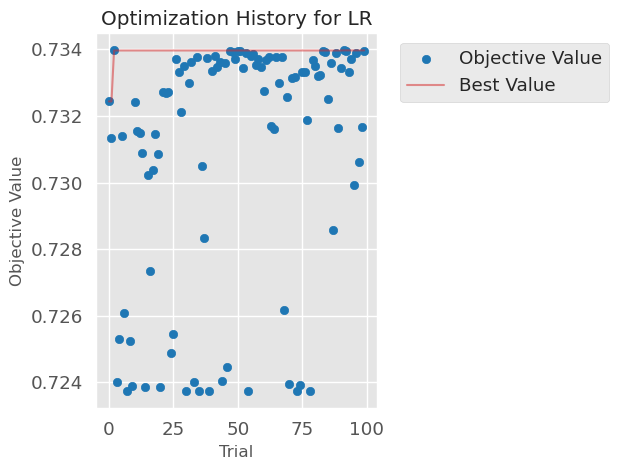

/tmp/ipykernel_996770/1106290231.py:472: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  vis.matplotlib.plot_param_importances(study)


Error plotting Optuna visualizations: 

Model: LR on unbinned data

Train Set Metrics:
  Accuracy:  0.6980
  AUC:       0.7418
  Gini:      0.4837
  Precision: 0.7111
  Recall:    0.8536
  F1 Score:  0.7758

Val Set Metrics:
  Accuracy:  0.6936
  AUC:       0.7456
  Gini:      0.4911
  Precision: 0.7066
  Recall:    0.8541
  F1 Score:  0.7734

Test Set Metrics:
  Accuracy:  0.6793
  AUC:       0.7130
  Gini:      0.4260
  Precision: 0.7001
  Recall:    0.8328
  F1 Score:  0.7607


/home/quanghung20gg/anaconda3/lib/python3.12/site-packages/optuna/importance/_fanova/_tree.py:137: RuntimeWarning: invalid value encountered in divide
  weights = weights / active_features_cardinalities


<Figure size 1200x700 with 0 Axes>

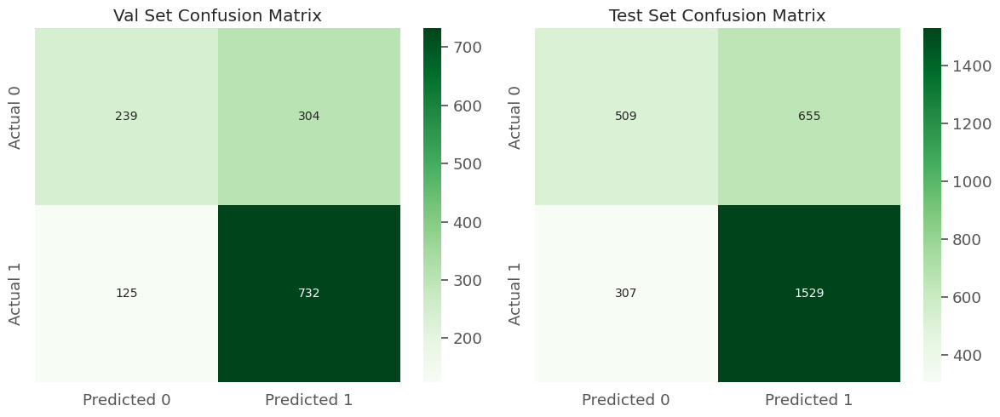

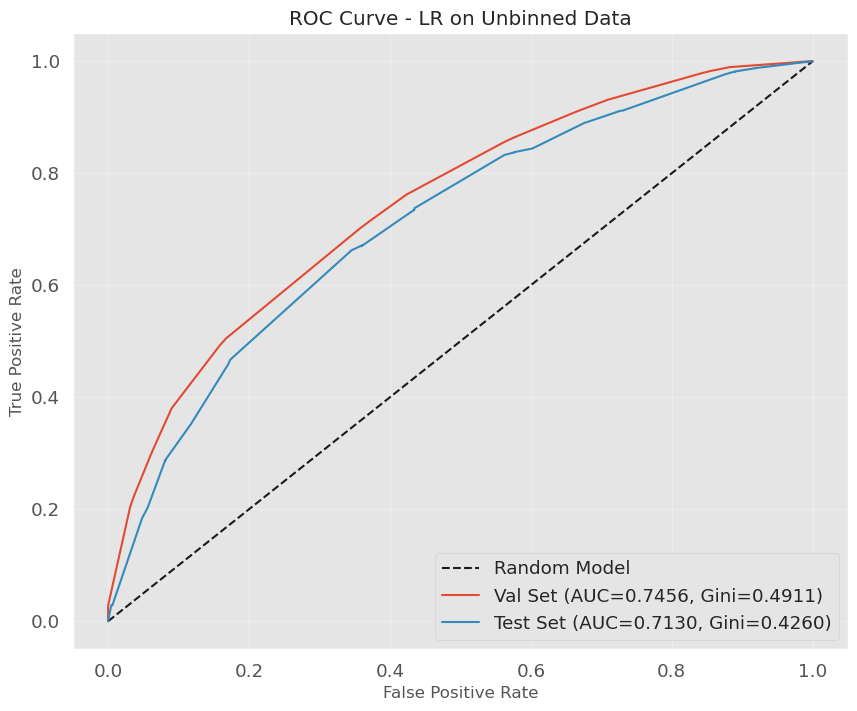

Model saved to lr_unbinned_model.pkl


In [104]:
lr_unbinned = CreditRiskModel(model_type='lr', use_binned=False)
lr_unbinned.train(X_train_unbinned_scaled, y_train_unbinned, X_val_unbinned_scaled, y_val_unbinned)
lr_unbinned.evaluate(X_train_unbinned_scaled, y_train_unbinned, X_val_unbinned_scaled, y_val_unbinned, X_test_unbinned_scaled, y_test_unbinned)
lr_unbinned.plot_results()
lr_unbinned.save('lr_unbinned_model.pkl')

/home/quanghung20gg/anaconda3/lib/python3.12/site-packages/optuna/_experimental.py:31: ExperimentalWarning: Argument ``multivariate`` is an experimental feature. The interface can change in the future.
  warnings.warn(
[I 2025-04-14 20:35:28,397] A new study created in memory with name: credit_risk_lr


Optimizing hyperparameters for LR model with Optuna (100 trials)...


Hyperparameter Search:   7%|██▊                                     | 7/100 [00:21<05:59,  3.87s/it]/home/quanghung20gg/anaconda3/lib/python3.12/site-packages/daal4py/sklearn/linear_model/logistic_path.py:627: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[I 2025-04-14 20:35:58,533] Trial 7 finished with value: 0.7408023577558411 and parameters: {'penalty_type': 'none', 'max_iter': 7296, 'tol': 7.411299781083242e-05, 'weight_option': 'none'}. Best is trial 1 with value: 0.8093323712089472.
Hyperparameter Search:  15%|█████▊                                 | 15/100 [00:53<04:51,  3.43s/it][W 2025-04-14 20:36


Best optimization score: 0.8396
Best parameters: {'penalty': 'elasticnet', 'C': 0.1973538040422678, 'solver': 'saga', 'max_iter': 1196, 'tol': 2.039785702995164e-06, 'class_weight': None, 'random_state': 42, 'n_jobs': -1, 'l1_ratio': 0.7655247728814005}

Training final model with best parameters...


Training Final Model: 100%|███████████████████████████████████████| 100/100 [00:02<00:00, 35.46it/s]

Applying isotonic probability calibration...
Probability calibration applied.
Best parameters: {'penalty': 'elasticnet', 'C': 0.1973538040422678, 'solver': 'saga', 'max_iter': 1196, 'tol': 2.039785702995164e-06, 'class_weight': None, 'random_state': 42, 'n_jobs': -1, 'l1_ratio': 0.7655247728814005}
Training completed in 406.05 seconds

Model: LR on binned data

Train Set Metrics:
  Accuracy:  0.7130
  AUC:       0.7618
  Gini:      0.5235
  Precision: 0.7452
  Recall:    0.8072
  F1 Score:  0.7750

Val Set Metrics:
  Accuracy:  0.7057
  AUC:       0.7599
  Gini:      0.5197
  Precision: 0.7330
  Recall:    0.8168
  F1 Score:  0.7726



/tmp/ipykernel_996770/1106290231.py:464: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  vis.matplotlib.plot_optimization_history(study)


<Figure size 1200x600 with 0 Axes>

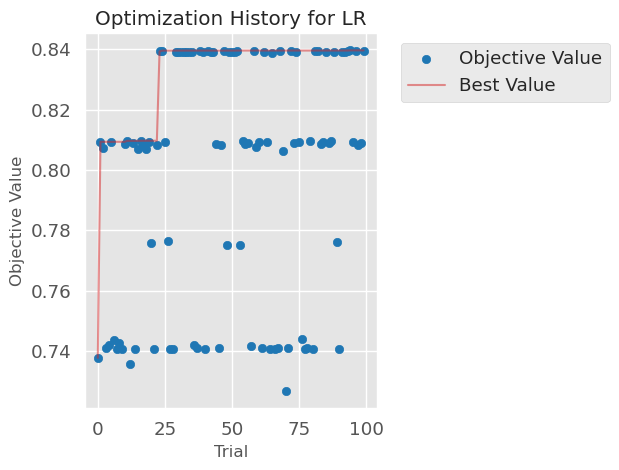

/tmp/ipykernel_996770/1106290231.py:472: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  vis.matplotlib.plot_param_importances(study)


Error plotting Optuna visualizations: 

Model: LR on binned data

Train Set Metrics:
  Accuracy:  0.7130
  AUC:       0.7618
  Gini:      0.5235
  Precision: 0.7452
  Recall:    0.8072
  F1 Score:  0.7750

Val Set Metrics:
  Accuracy:  0.7057
  AUC:       0.7599
  Gini:      0.5197
  Precision: 0.7330
  Recall:    0.8168
  F1 Score:  0.7726

Test Set Metrics:
  Accuracy:  0.6973
  AUC:       0.7406
  Gini:      0.4812
  Precision: 0.7315
  Recall:    0.7985
  F1 Score:  0.7635


/home/quanghung20gg/anaconda3/lib/python3.12/site-packages/optuna/importance/_fanova/_tree.py:137: RuntimeWarning: invalid value encountered in divide
  weights = weights / active_features_cardinalities


<Figure size 1200x700 with 0 Axes>

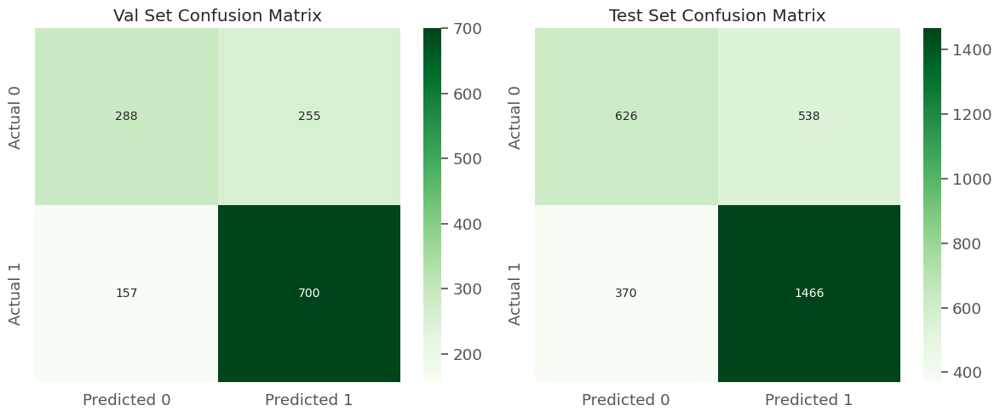

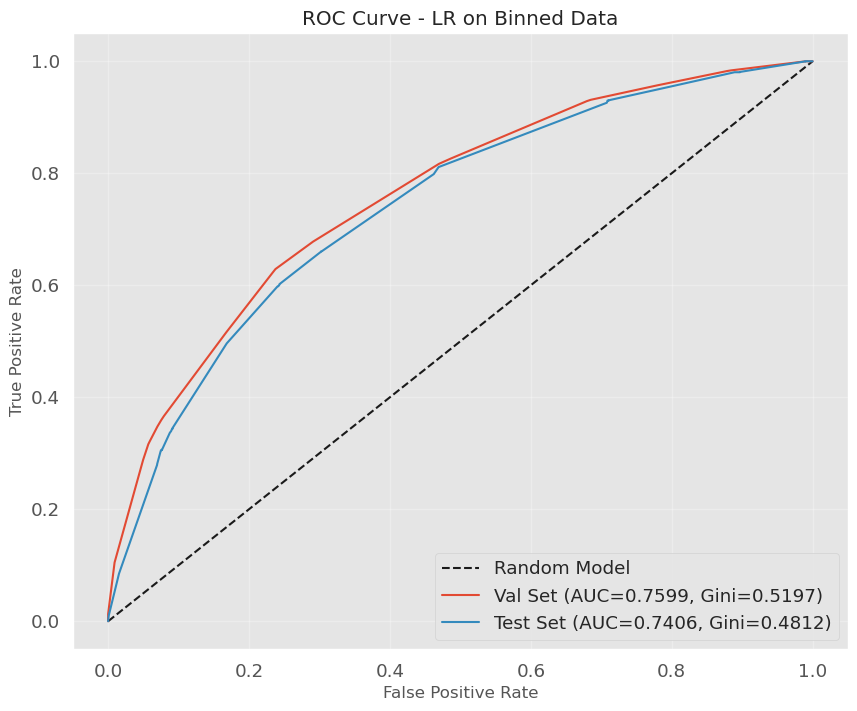

Model saved to lr_binned_model.pkl


In [105]:
lr_binned = CreditRiskModel(model_type='lr', use_binned=True)
lr_binned.train(X_train_binned_encoded, y_train_binned, X_val_binned_encoded, y_val_binned, binning_objects=binning_objects, iv_compare=iv_compare_all)
lr_binned.evaluate(X_train_binned_encoded, y_train_binned, X_val_binned_encoded, y_val_binned, X_test_binned_encoded, y_test_binned)
lr_binned.plot_results()
lr_binned.save('lr_binned_model.pkl')

/home/quanghung20gg/anaconda3/lib/python3.12/site-packages/optuna/_experimental.py:31: ExperimentalWarning: Argument ``multivariate`` is an experimental feature. The interface can change in the future.
  warnings.warn(
[I 2025-04-14 20:42:15,159] A new study created in memory with name: credit_risk_lr


Optimizing hyperparameters for LR model with Optuna (100 trials)...


Hyperparameter Search:  15%|█████▊                                 | 15/100 [00:30<03:17,  2.33s/it][W 2025-04-14 20:42:45,878] The parameter 'C' in trial#15 is sampled independently instead of being sampled by multivariate TPE sampler. (optimization performance may be degraded). You can suppress this warning by setting `warn_independent_sampling` to `False` in the constructor of `TPESampler`, if this independent sampling is intended behavior.
[W 2025-04-14 20:42:45,880] The parameter 'l1_ratio' in trial#15 is sampled independently instead of being sampled by multivariate TPE sampler. (optimization performance may be degraded). You can suppress this warning by setting `warn_independent_sampling` to `False` in the constructor of `TPESampler`, if this independent sampling is intended behavior.
[I 2025-04-14 20:42:46,488] Trial 15 finished with value: 0.8095023199126785 and parameters: {'penalty_type': 'elasticnet', 'C': 0.4008992939953313, 'l1_ratio': 0.1022319875516964, 'max_iter': 1915


Best optimization score: 0.8427
Best parameters: {'penalty': 'l1', 'C': 0.21179986105326515, 'solver': 'saga', 'max_iter': 3997, 'tol': 0.00023720299469211426, 'class_weight': None, 'random_state': 42, 'n_jobs': -1}

Training final model with best parameters...


Training Final Model: 100%|█████████████████████████████████████| 100/100 [00:00<00:00, 1542.38it/s]

Applying isotonic probability calibration...
Probability calibration applied.
Best parameters: {'penalty': 'l1', 'C': 0.21179986105326515, 'solver': 'saga', 'max_iter': 3997, 'tol': 0.00023720299469211426, 'class_weight': None, 'random_state': 42, 'n_jobs': -1}
Training completed in 137.00 seconds

Model: LR on binned data

Train Set Metrics:
  Accuracy:  0.7096
  AUC:       0.7563
  Gini:      0.5126
  Precision: 0.7275
  Recall:    0.8404
  F1 Score:  0.7799

Val Set Metrics:
  Accuracy:  0.7007
  AUC:       0.7607
  Gini:      0.5214
  Precision: 0.7212
  Recall:    0.8331
  F1 Score:  0.7731



/tmp/ipykernel_996770/1106290231.py:464: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  vis.matplotlib.plot_optimization_history(study)


<Figure size 1200x600 with 0 Axes>

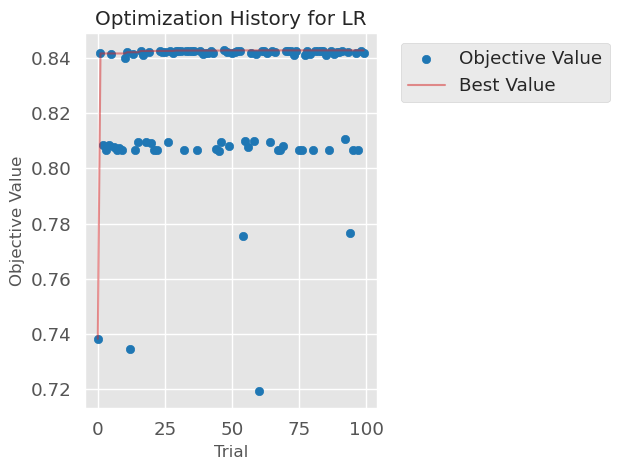

/tmp/ipykernel_996770/1106290231.py:472: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  vis.matplotlib.plot_param_importances(study)
/home/quanghung20gg/anaconda3/lib/python3.12/site-packages/optuna/importance/_fanova/_tree.py:137: RuntimeWarning: invalid value encountered in divide
  weights = weights / active_features_cardinalities


Error plotting Optuna visualizations: 

Model: LR on binned data

Train Set Metrics:
  Accuracy:  0.7096
  AUC:       0.7563
  Gini:      0.5126
  Precision: 0.7275
  Recall:    0.8404
  F1 Score:  0.7799

Val Set Metrics:
  Accuracy:  0.7007
  AUC:       0.7607
  Gini:      0.5214
  Precision: 0.7212
  Recall:    0.8331
  F1 Score:  0.7731

Test Set Metrics:
  Accuracy:  0.6853
  AUC:       0.7263
  Gini:      0.4526
  Precision: 0.7155
  Recall:    0.8066
  F1 Score:  0.7583


<Figure size 1200x700 with 0 Axes>

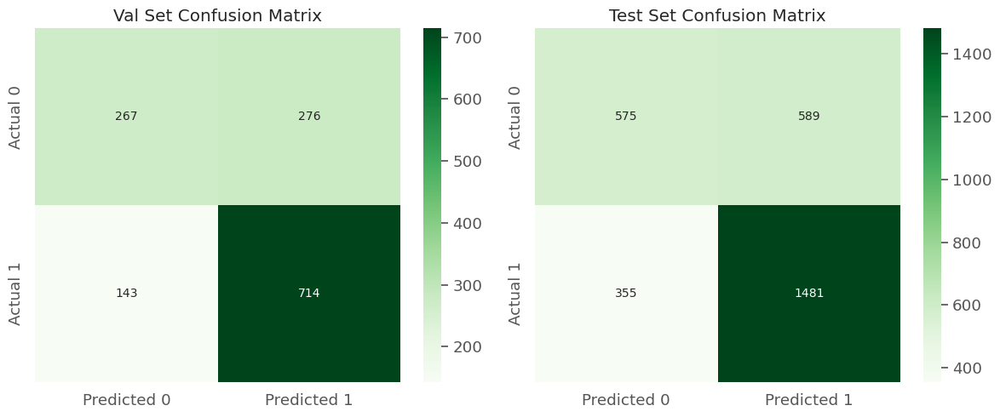

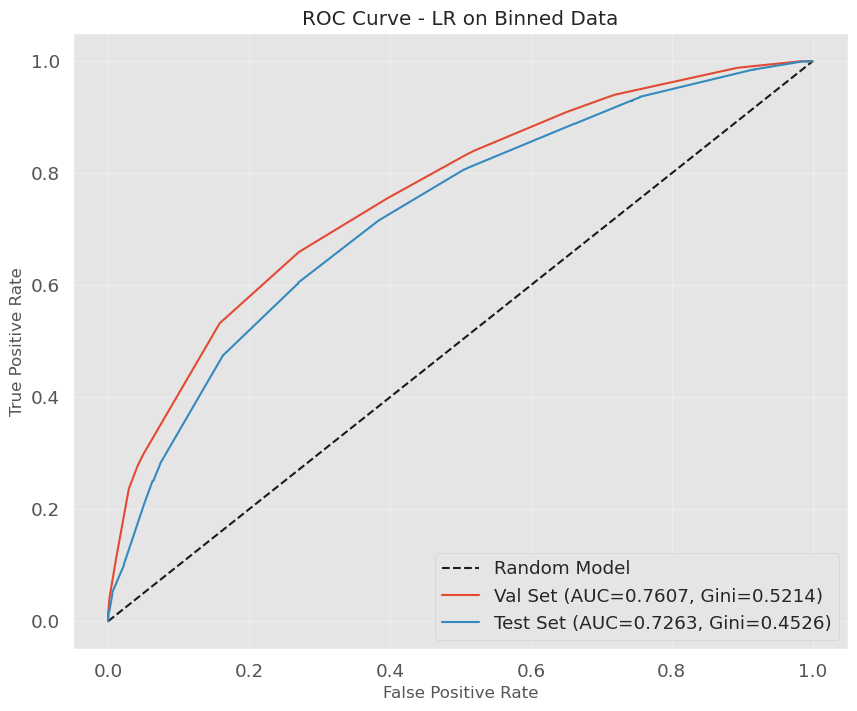

Model saved to lr_opt_model.pkl


In [106]:
lr_opt = CreditRiskModel(model_type='lr', use_binned=True)
lr_opt.train(optbinned_train, y_train_binned, optbinned_val, y_val_binned, binning_objects=optbinning_objects)
lr_opt.evaluate(optbinned_train, y_train_binned, optbinned_val, y_val_binned, optbinning_test_binned, y_test_binned)
lr_opt.plot_results()
lr_opt.save('lr_opt_model.pkl')

In [107]:
lr_comparison = pd.DataFrame({
    'Model': ['Logistic Regression (Unbinned)', 'Logistic Regression (Binned)', 'Logistic Regression (OptBinned)'],
    'AUC': [lr_unbinned.results['test_auc'], lr_binned.results['test_auc'], lr_opt.results['test_auc']],
    'Accuracy': [lr_unbinned.results['test_accuracy'], lr_binned.results['test_accuracy'], lr_opt.results['test_accuracy']],
    'Precision': [lr_unbinned.results['test_precision'], lr_binned.results['test_precision'], lr_opt.results['test_precision']],
    'Recall': [lr_unbinned.results['test_recall'], lr_binned.results['test_recall'], lr_opt.results['test_recall']],
    'F1 Score': [lr_unbinned.results['test_f1'], lr_binned.results['test_f1'], lr_opt.results['test_f1']],
    'Confusion Matrix': [lr_unbinned.results['test_confusion_matrix'], lr_binned.results['test_confusion_matrix'], lr_opt.results['test_confusion_matrix']],
    'Gini': [lr_unbinned.results['test_gini'], lr_binned.results['test_gini'], lr_opt.results['test_gini']],
    'Training Time (s)': [lr_unbinned.training_time, lr_binned.training_time, lr_opt.training_time],
})
lr_comparison

,Model,AUC,Accuracy,Precision,Recall,F1 Score,Confusion Matrix,Gini,Training Time (s)
0,Logistic Regression (Unbinned),0.712982,0.679333,0.700092,0.832789,0.760697,"[[509, 655], [307, 1529]]",0.425964,701.462649
1,Logistic Regression (Binned),0.740611,0.697333,0.731537,0.798475,0.763542,"[[626, 538], [370, 1466]]",0.481221,406.054587
2,Logistic Regression (OptBinned),0.726299,0.685333,0.715459,0.806645,0.758321,"[[575, 589], [355, 1481]]",0.452598,136.997060


# Random Forest 

/home/quanghung20gg/anaconda3/lib/python3.12/site-packages/optuna/_experimental.py:31: ExperimentalWarning: Argument ``multivariate`` is an experimental feature. The interface can change in the future.
  warnings.warn(
[I 2025-04-14 20:44:32,758] A new study created in memory with name: credit_risk_rf


Optimizing hyperparameters for RF model with Optuna (60 trials)...


Hyperparameter Search:  25%|██████████                              | 15/60 [00:49<02:04,  2.76s/it][W 2025-04-14 20:45:22,015] The parameter 'max_depth' in trial#15 is sampled independently instead of being sampled by multivariate TPE sampler. (optimization performance may be degraded). You can suppress this warning by setting `warn_independent_sampling` to `False` in the constructor of `TPESampler`, if this independent sampling is intended behavior.
[I 2025-04-14 20:45:24,524] Trial 15 finished with value: 0.7296185584127343 and parameters: {'n_estimators': 402, 'min_samples_split': 15, 'min_samples_leaf': 5, 'max_features': 'sqrt', 'use_max_depth': True, 'max_depth': 23}. Best is trial 0 with value: 0.7307755947834477.
Hyperparameter Search:  27%|██████████▋                             | 16/60 [00:51<01:58,  2.69s/it][W 2025-04-14 20:45:24,532] The parameter 'max_depth' in trial#16 is sampled independently instead of being sampled by multivariate TPE sampler. (optimization performan


Best optimization score: 0.7309
Best parameters: {'n_estimators': 312, 'min_samples_split': 20, 'min_samples_leaf': 8, 'max_features': 'sqrt', 'random_state': 42, 'n_jobs': -1, 'max_depth': None}

Training final model with best parameters...


Training Final Model: 100%|██████████████████████████████████████| 100/100 [00:00<00:00, 254.10it/s]


Applying isotonic probability calibration...
Probability calibration applied.
Best parameters: {'n_estimators': 312, 'min_samples_split': 20, 'min_samples_leaf': 8, 'max_features': 'sqrt', 'random_state': 42, 'n_jobs': -1, 'max_depth': None}
Training completed in 216.86 seconds

Model: RF on unbinned data

Train Set Metrics:
  Accuracy:  0.8448
  AUC:       0.9310
  Gini:      0.8620
  Precision: 0.8461
  Recall:    0.9125
  F1 Score:  0.8780

Val Set Metrics:
  Accuracy:  0.7050
  AUC:       0.7478
  Gini:      0.4955
  Precision: 0.7317
  Recall:    0.8180
  F1 Score:  0.7725


/tmp/ipykernel_996770/1106290231.py:464: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  vis.matplotlib.plot_optimization_history(study)


<Figure size 1200x600 with 0 Axes>

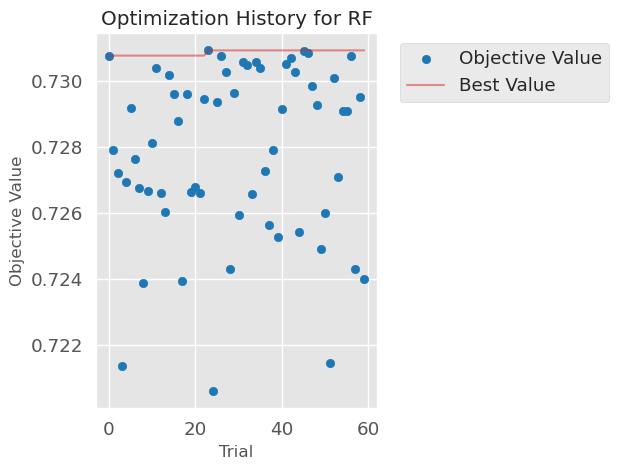

Error plotting Optuna visualizations: 


/tmp/ipykernel_996770/1106290231.py:472: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  vis.matplotlib.plot_param_importances(study)
/home/quanghung20gg/anaconda3/lib/python3.12/site-packages/optuna/importance/_fanova/_tree.py:137: RuntimeWarning: invalid value encountered in divide
  weights = weights / active_features_cardinalities



Model: RF on unbinned data

Train Set Metrics:
  Accuracy:  0.8448
  AUC:       0.9310
  Gini:      0.8620
  Precision: 0.8461
  Recall:    0.9125
  F1 Score:  0.8780

Val Set Metrics:
  Accuracy:  0.7057
  AUC:       0.7478
  Gini:      0.4955
  Precision: 0.7325
  Recall:    0.8180
  F1 Score:  0.7729

Test Set Metrics:
  Accuracy:  0.6813
  AUC:       0.7204
  Gini:      0.4408
  Precision: 0.7207
  Recall:    0.7827
  F1 Score:  0.7504


<Figure size 1200x700 with 0 Axes>

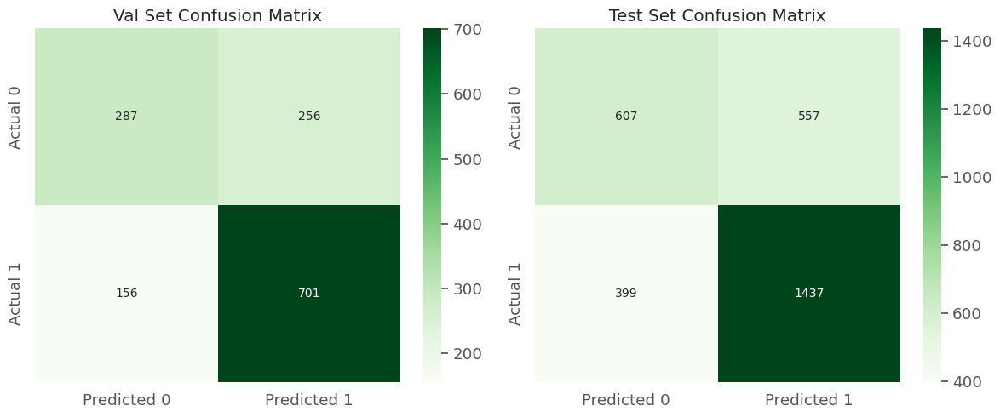

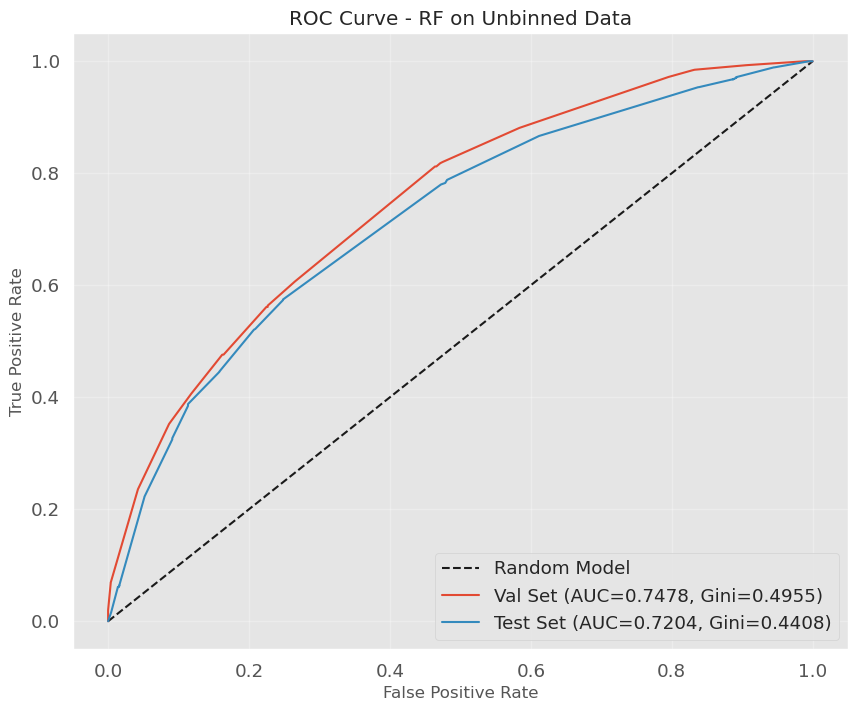

Model saved to rf_unbinned_model.pkl


In [108]:
rf_unbinned = CreditRiskModel(model_type='rf', use_binned=False)
rf_unbinned.train(X_train_unbinned_scaled, y_train_unbinned, X_val_unbinned_scaled, y_val_unbinned)
rf_unbinned.evaluate(X_train_unbinned_scaled, y_train_unbinned, X_val_unbinned_scaled, y_val_unbinned, X_test_unbinned_scaled, y_test_unbinned)
rf_unbinned.plot_results()
rf_unbinned.save('rf_unbinned_model.pkl')

/home/quanghung20gg/anaconda3/lib/python3.12/site-packages/optuna/_experimental.py:31: ExperimentalWarning: Argument ``multivariate`` is an experimental feature. The interface can change in the future.
  warnings.warn(
[I 2025-04-14 20:48:10,497] A new study created in memory with name: credit_risk_rf


Optimizing hyperparameters for RF model with Optuna (60 trials)...


Hyperparameter Search:  27%|██████████▋                             | 16/60 [00:36<01:43,  2.36s/it][W 2025-04-14 20:48:47,155] The parameter 'max_depth' in trial#16 is sampled independently instead of being sampled by multivariate TPE sampler. (optimization performance may be degraded). You can suppress this warning by setting `warn_independent_sampling` to `False` in the constructor of `TPESampler`, if this independent sampling is intended behavior.
[I 2025-04-14 20:48:49,935] Trial 16 finished with value: 0.7336474841027589 and parameters: {'n_estimators': 286, 'min_samples_split': 11, 'min_samples_leaf': 7, 'max_features': None, 'use_max_depth': True, 'max_depth': 5}. Best is trial 7 with value: 0.7691143568949113.
Hyperparameter Search:  28%|███████████▎                            | 17/60 [00:39<01:47,  2.49s/it][W 2025-04-14 20:48:49,942] The parameter 'max_depth' in trial#17 is sampled independently instead of being sampled by multivariate TPE sampler. (optimization performance 


Best optimization score: 0.7694
Best parameters: {'n_estimators': 267, 'min_samples_split': 3, 'min_samples_leaf': 9, 'max_features': None, 'random_state': 42, 'n_jobs': -1, 'max_depth': None}

Training final model with best parameters...


Training Final Model: 100%|██████████████████████████████████████| 100/100 [00:00<00:00, 103.11it/s]
/tmp/ipykernel_996770/1106290231.py:464: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  vis.matplotlib.plot_optimization_history(study)


Applying isotonic probability calibration...
Probability calibration applied.
Best parameters: {'n_estimators': 267, 'min_samples_split': 3, 'min_samples_leaf': 9, 'max_features': None, 'random_state': 42, 'n_jobs': -1, 'max_depth': None}
Training completed in 182.09 seconds

Model: RF on binned data

Train Set Metrics:
  Accuracy:  0.8689
  AUC:       0.9466
  Gini:      0.8932
  Precision: 0.8805
  Recall:    0.9093
  F1 Score:  0.8947

Val Set Metrics:
  Accuracy:  0.7064
  AUC:       0.7567
  Gini:      0.5133
  Precision: 0.7461
  Recall:    0.7888
  F1 Score:  0.7669


<Figure size 1200x600 with 0 Axes>

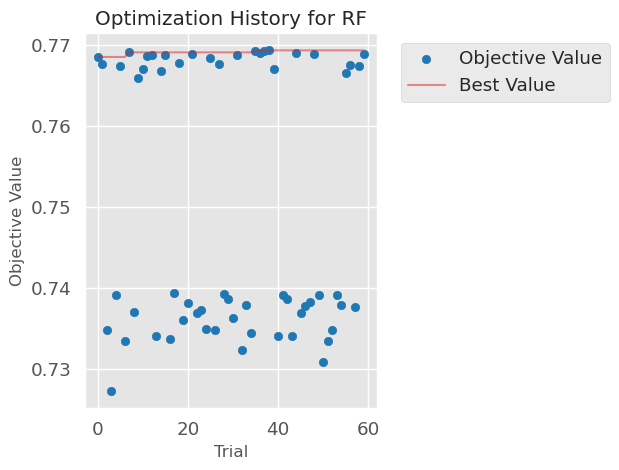

/tmp/ipykernel_996770/1106290231.py:472: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  vis.matplotlib.plot_param_importances(study)
/home/quanghung20gg/anaconda3/lib/python3.12/site-packages/optuna/importance/_fanova/_tree.py:137: RuntimeWarning: invalid value encountered in divide
  weights = weights / active_features_cardinalities


Error plotting Optuna visualizations: 

Model: RF on binned data

Train Set Metrics:
  Accuracy:  0.8689
  AUC:       0.9466
  Gini:      0.8932
  Precision: 0.8805
  Recall:    0.9093
  F1 Score:  0.8947

Val Set Metrics:
  Accuracy:  0.7064
  AUC:       0.7567
  Gini:      0.5134
  Precision: 0.7461
  Recall:    0.7888
  F1 Score:  0.7669

Test Set Metrics:
  Accuracy:  0.6913
  AUC:       0.7341
  Gini:      0.4683
  Precision: 0.7277
  Recall:    0.7919
  F1 Score:  0.7585


<Figure size 1200x700 with 0 Axes>

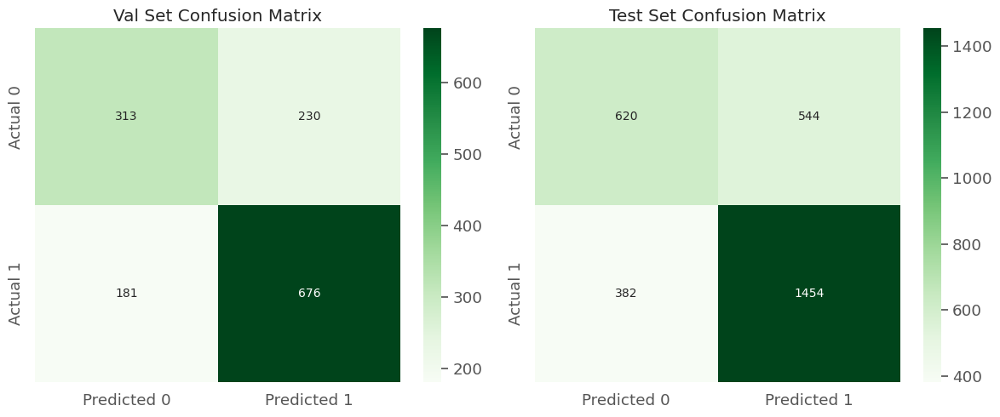

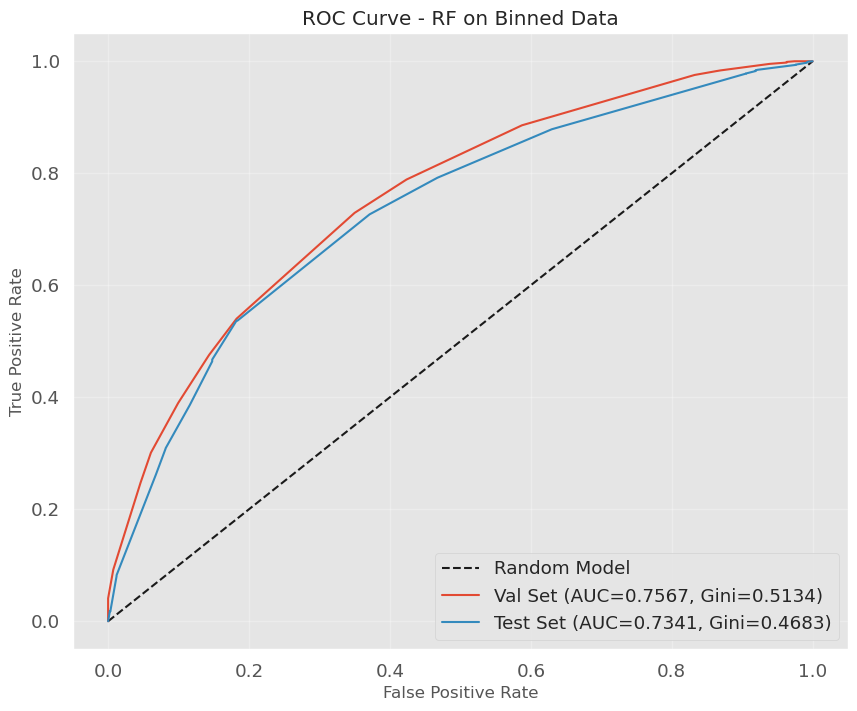

Model saved to rf_binned_model.pkl


In [109]:
rf_binned = CreditRiskModel(model_type='rf', use_binned=True)
rf_binned.train(X_train_binned_encoded, y_train_binned, X_val_binned_encoded, y_val_binned, binning_objects=binning_objects, iv_compare=iv_compare_all)
rf_binned.evaluate(X_train_binned_encoded, y_train_binned, X_val_binned_encoded, y_val_binned, X_test_binned_encoded, y_test_binned)
rf_binned.plot_results()
rf_binned.save('rf_binned_model.pkl')

/home/quanghung20gg/anaconda3/lib/python3.12/site-packages/optuna/_experimental.py:31: ExperimentalWarning: Argument ``multivariate`` is an experimental feature. The interface can change in the future.
  warnings.warn(
[I 2025-04-14 20:51:13,418] A new study created in memory with name: credit_risk_rf


Optimizing hyperparameters for RF model with Optuna (60 trials)...


Hyperparameter Search:  25%|██████████                              | 15/60 [00:05<00:14,  3.09it/s][W 2025-04-14 20:51:19,372] The parameter 'max_depth' in trial#15 is sampled independently instead of being sampled by multivariate TPE sampler. (optimization performance may be degraded). You can suppress this warning by setting `warn_independent_sampling` to `False` in the constructor of `TPESampler`, if this independent sampling is intended behavior.
[I 2025-04-14 20:51:19,714] Trial 15 finished with value: 0.77103481898623 and parameters: {'n_estimators': 450, 'min_samples_split': 19, 'min_samples_leaf': 4, 'max_features': 'sqrt', 'use_max_depth': True, 'max_depth': 23}. Best is trial 11 with value: 0.7715900129274411.
Hyperparameter Search:  27%|██████████▋                             | 16/60 [00:06<00:14,  3.02it/s][W 2025-04-14 20:51:19,722] The parameter 'max_depth' in trial#16 is sampled independently instead of being sampled by multivariate TPE sampler. (optimization performanc


Best optimization score: 0.7720
Best parameters: {'n_estimators': 373, 'min_samples_split': 2, 'min_samples_leaf': 8, 'max_features': 'sqrt', 'random_state': 42, 'n_jobs': -1, 'max_depth': 26}

Training final model with best parameters...


Training Final Model: 100%|█████████████████████████████████████| 100/100 [00:00<00:00, 1612.07it/s]

Applying isotonic probability calibration...
Probability calibration applied.
Best parameters: {'n_estimators': 373, 'min_samples_split': 2, 'min_samples_leaf': 8, 'max_features': 'sqrt', 'random_state': 42, 'n_jobs': -1, 'max_depth': 26}
Training completed in 23.72 seconds

Model: RF on binned data

Train Set Metrics:
  Accuracy:  0.8802
  AUC:       0.9640
  Gini:      0.9280
  Precision: 0.8563
  Recall:    0.9665
  F1 Score:  0.9080

Val Set Metrics:
  Accuracy:  0.7036
  AUC:       0.7560
  Gini:      0.5119
  Precision: 0.7175
  Recall:    0.8506
  F1 Score:  0.7784



/tmp/ipykernel_996770/1106290231.py:464: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  vis.matplotlib.plot_optimization_history(study)


<Figure size 1200x600 with 0 Axes>

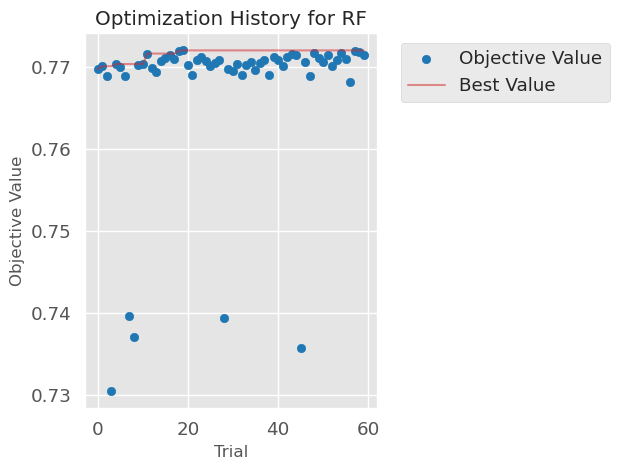

/tmp/ipykernel_996770/1106290231.py:472: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  vis.matplotlib.plot_param_importances(study)
/home/quanghung20gg/anaconda3/lib/python3.12/site-packages/optuna/importance/_fanova/_tree.py:137: RuntimeWarning: invalid value encountered in divide
  weights = weights / active_features_cardinalities


Error plotting Optuna visualizations: 

Model: RF on binned data

Train Set Metrics:
  Accuracy:  0.8802
  AUC:       0.9640
  Gini:      0.9280
  Precision: 0.8563
  Recall:    0.9665
  F1 Score:  0.9080

Val Set Metrics:
  Accuracy:  0.7036
  AUC:       0.7560
  Gini:      0.5119
  Precision: 0.7175
  Recall:    0.8506
  F1 Score:  0.7784

Test Set Metrics:
  Accuracy:  0.6880
  AUC:       0.7251
  Gini:      0.4502
  Precision: 0.7085
  Recall:    0.8328
  F1 Score:  0.7656


<Figure size 1200x700 with 0 Axes>

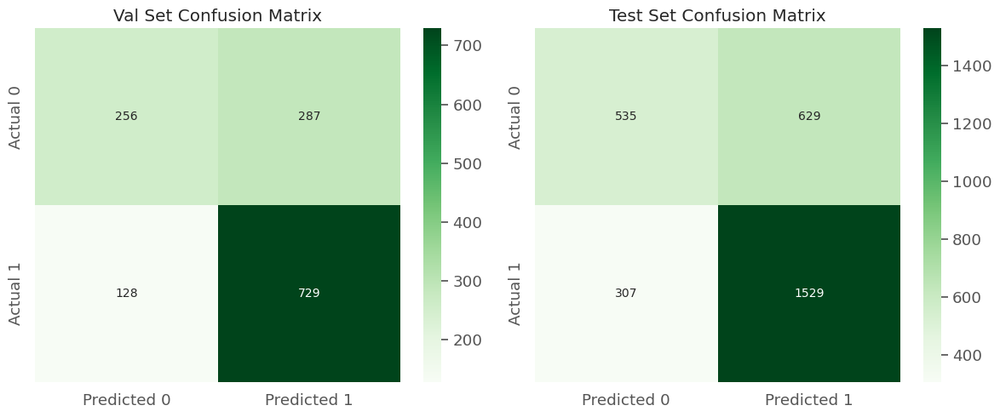

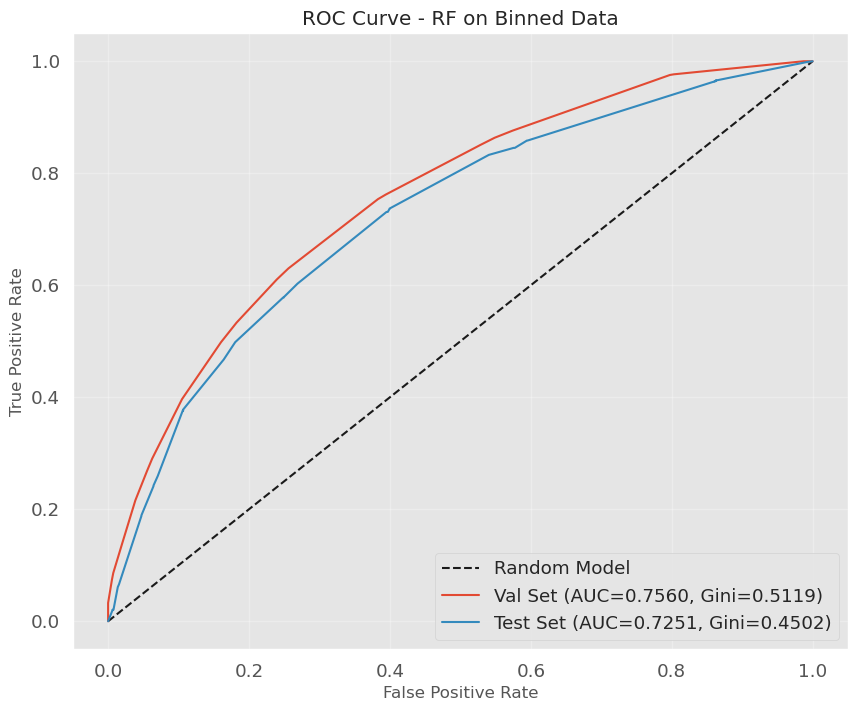

Model saved to rf_opt_model.pkl


In [110]:
rf_opt = CreditRiskModel(model_type='rf', use_binned=True)
rf_opt.train(optbinned_train, y_train_binned, optbinned_val, y_val_binned, binning_objects=optbinning_objects)
rf_opt.evaluate(optbinned_train, y_train_binned, optbinned_val, y_val_binned, optbinning_test_binned, y_test_binned)
rf_opt.plot_results()
rf_opt.save('rf_opt_model.pkl')

# LGB

In [ ]:
def clean_feature_names(X):
    renamed_features = {}
    
    for col in X.columns:
        new_col = re.sub(r'[^a-zA-Z0-9_]', '_', col)
        
        count = 1
        temp_col = new_col
        while temp_col in renamed_features.values():
            temp_col = f"{new_col}_{count}"
            count += 1
        
        new_col = temp_col
        renamed_features[col] = new_col
    
    X = X.rename(columns=renamed_features)
    
    feature_map = pd.DataFrame({
        'original': list(renamed_features.keys()),
        'cleaned': list(renamed_features.values())
    })
    
    return X, feature_map

In [115]:
X_train_unbinned_cleaned, feature_map = clean_feature_names(X_train_unbinned_scaled)
X_val_unbinned_cleaned, _ = clean_feature_names(X_val_unbinned_scaled) 
X_test_unbinned_cleaned, _ = clean_feature_names(X_test_unbinned_scaled)

/home/quanghung20gg/anaconda3/lib/python3.12/site-packages/optuna/_experimental.py:31: ExperimentalWarning: Argument ``multivariate`` is an experimental feature. The interface can change in the future.
  warnings.warn(
[I 2025-04-14 21:14:21,616] A new study created in memory with name: credit_risk_lgb


Optimizing hyperparameters for LGB model with Optuna (75 trials)...


Hyperparameter Search: 100%|████████████████████████████████████████| 75/75 [04:56<00:00,  3.96s/it]



Best optimization score: 0.7676
Best parameters: {'n_estimators': 427, 'learning_rate': 0.17941441476921335, 'max_depth': 3, 'num_leaves': 50, 'subsample': 0.8485935902883367, 'colsample_bytree': 0.528444204252041, 'min_child_samples': 8, 'reg_alpha': 2.7323618604884463, 'reg_lambda': 6.9028193254159955, 'objective': 'binary', 'metric': 'auc', 'random_state': 42, 'n_jobs': -1, 'verbose': -1, 'boosting_type': 'dart'}

Training final model with best parameters...


Training Final Model: 100%|██████████████████████████████████████| 100/100 [00:00<00:00, 133.03it/s]

Best parameters: {'n_estimators': 427, 'learning_rate': 0.17941441476921335, 'max_depth': 3, 'num_leaves': 50, 'subsample': 0.8485935902883367, 'colsample_bytree': 0.528444204252041, 'min_child_samples': 8, 'reg_alpha': 2.7323618604884463, 'reg_lambda': 6.9028193254159955, 'objective': 'binary', 'metric': 'auc', 'random_state': 42, 'n_jobs': -1, 'verbose': -1, 'boosting_type': 'dart'}
Training completed in 297.64 seconds

Model: LGB on unbinned data

Train Set Metrics:
  Accuracy:  0.7591
  AUC:       0.8329
  Gini:      0.6658
  Precision: 0.7662
  Recall:    0.8728
  F1 Score:  0.8160

Val Set Metrics:
  Accuracy:  0.7057
  AUC:       0.7481
  Gini:      0.4961
  Precision: 0.7287
  Recall:    0.8273
  F1 Score:  0.7749



/tmp/ipykernel_996770/1106290231.py:464: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  vis.matplotlib.plot_optimization_history(study)


<Figure size 1200x600 with 0 Axes>

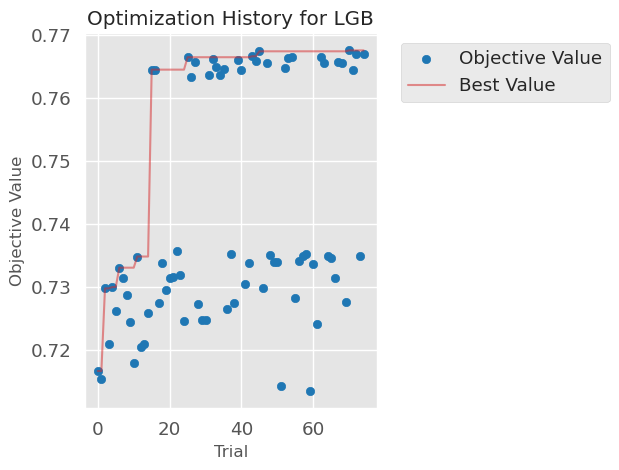

/tmp/ipykernel_996770/1106290231.py:472: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  vis.matplotlib.plot_param_importances(study)
/home/quanghung20gg/anaconda3/lib/python3.12/site-packages/optuna/importance/_fanova/_tree.py:137: RuntimeWarning: invalid value encountered in divide
  weights = weights / active_features_cardinalities


Error plotting Optuna visualizations: 

Model: LGB on unbinned data

Train Set Metrics:
  Accuracy:  0.7591
  AUC:       0.8329
  Gini:      0.6658
  Precision: 0.7662
  Recall:    0.8728
  F1 Score:  0.8160

Val Set Metrics:
  Accuracy:  0.7057
  AUC:       0.7481
  Gini:      0.4961
  Precision: 0.7287
  Recall:    0.8273
  F1 Score:  0.7749

Test Set Metrics:
  Accuracy:  0.6793
  AUC:       0.7193
  Gini:      0.4386
  Precision: 0.7038
  Recall:    0.8219
  F1 Score:  0.7583


<Figure size 1200x700 with 0 Axes>

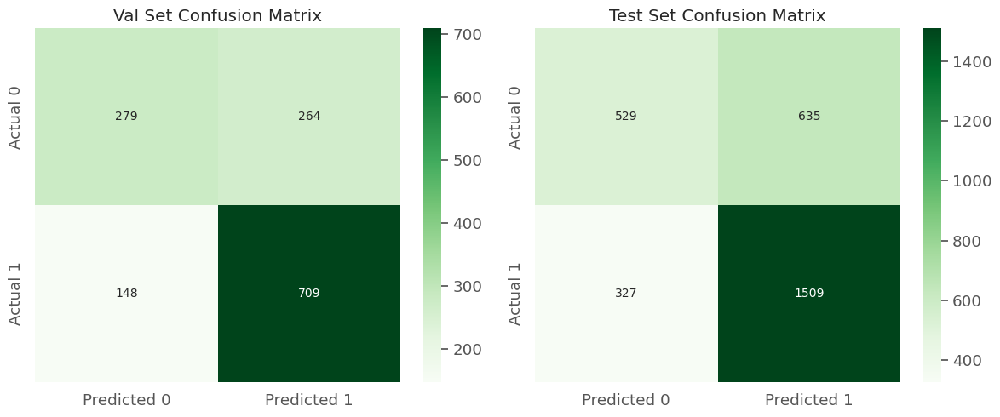

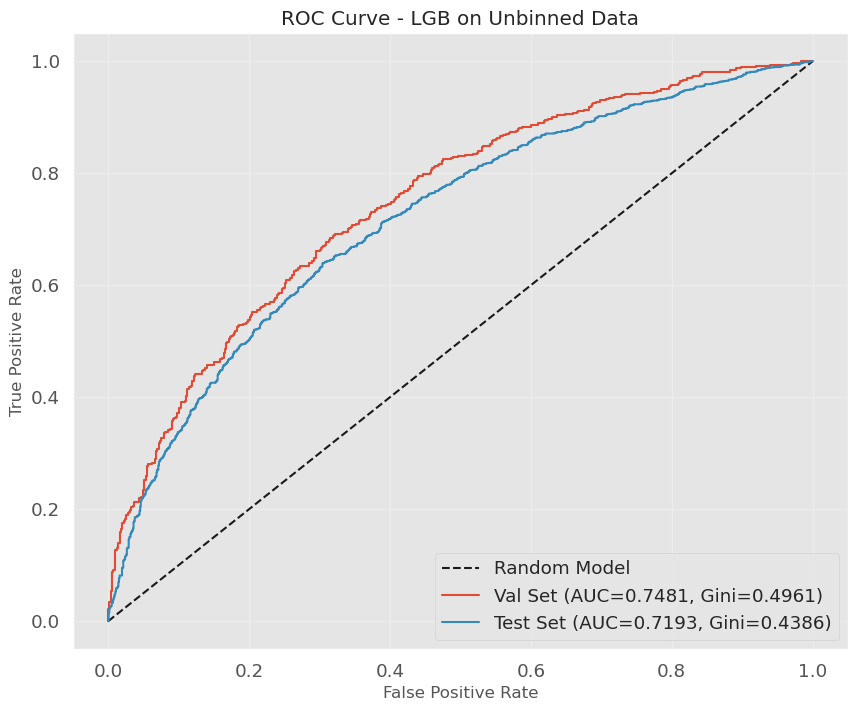

Model saved to lgb_unbinned_model.pkl


In [116]:
lgb_unbinned = CreditRiskModel(model_type='lgb', use_binned=False)
lgb_unbinned.train(X_train_unbinned_cleaned, y_train_unbinned, X_val_unbinned_cleaned, y_val_unbinned)
lgb_unbinned.evaluate(X_train_unbinned_cleaned, y_train_unbinned, X_val_unbinned_cleaned, y_val_unbinned, X_test_unbinned_cleaned, y_test_unbinned)
lgb_unbinned.plot_results()
lgb_unbinned.save('lgb_unbinned_model.pkl')

In [117]:
X_train_binned_encoded_cleaned, feature_map = clean_feature_names(X_train_binned_encoded)
X_val_binned_encoded_cleaned, _ = clean_feature_names(X_val_binned_encoded)
X_test_binned_encoded_cleaned, _ = clean_feature_names(X_test_binned_encoded)

/home/quanghung20gg/anaconda3/lib/python3.12/site-packages/optuna/_experimental.py:31: ExperimentalWarning: Argument ``multivariate`` is an experimental feature. The interface can change in the future.
  warnings.warn(
[I 2025-04-14 21:19:19,768] A new study created in memory with name: credit_risk_lgb


Optimizing hyperparameters for LGB model with Optuna (75 trials)...


Hyperparameter Search: 100%|████████████████████████████████████████| 75/75 [04:58<00:00,  3.98s/it]



Best optimization score: 0.8072
Best parameters: {'n_estimators': 309, 'learning_rate': 0.19949636221854317, 'max_depth': 3, 'num_leaves': 254, 'subsample': 0.9828313586999874, 'colsample_bytree': 0.7065492450244554, 'min_child_samples': 15, 'reg_alpha': 7.030340595213418, 'reg_lambda': 0.009799821130659327, 'objective': 'binary', 'metric': 'auc', 'random_state': 42, 'n_jobs': -1, 'verbose': -1, 'boosting_type': 'dart'}

Training final model with best parameters...


Training Final Model: 100%|██████████████████████████████████████| 100/100 [00:00<00:00, 225.48it/s]

Best parameters: {'n_estimators': 309, 'learning_rate': 0.19949636221854317, 'max_depth': 3, 'num_leaves': 254, 'subsample': 0.9828313586999874, 'colsample_bytree': 0.7065492450244554, 'min_child_samples': 15, 'reg_alpha': 7.030340595213418, 'reg_lambda': 0.009799821130659327, 'objective': 'binary', 'metric': 'auc', 'random_state': 42, 'n_jobs': -1, 'verbose': -1, 'boosting_type': 'dart'}
Training completed in 299.01 seconds

Model: LGB on binned data

Train Set Metrics:
  Accuracy:  0.7386
  AUC:       0.8079
  Gini:      0.6159
  Precision: 0.7523
  Recall:    0.8541
  F1 Score:  0.8000

Val Set Metrics:
  Accuracy:  0.7171
  AUC:       0.7541
  Gini:      0.5081
  Precision: 0.7340
  Recall:    0.8436
  F1 Score:  0.7850



/tmp/ipykernel_996770/1106290231.py:464: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  vis.matplotlib.plot_optimization_history(study)


<Figure size 1200x600 with 0 Axes>

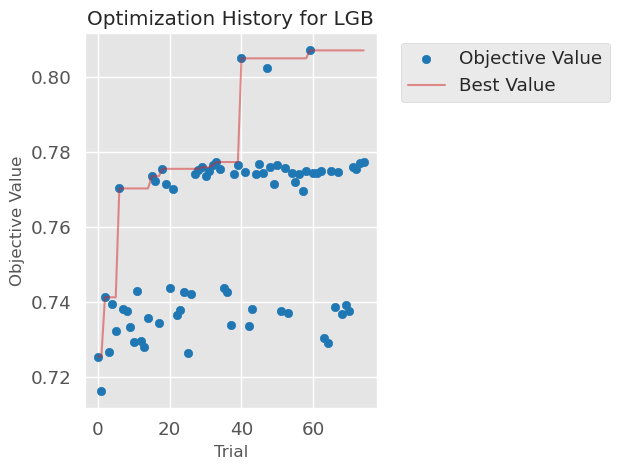

/tmp/ipykernel_996770/1106290231.py:472: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  vis.matplotlib.plot_param_importances(study)
/home/quanghung20gg/anaconda3/lib/python3.12/site-packages/optuna/importance/_fanova/_tree.py:137: RuntimeWarning: invalid value encountered in divide
  weights = weights / active_features_cardinalities


Error plotting Optuna visualizations: 

Model: LGB on binned data

Train Set Metrics:
  Accuracy:  0.7386
  AUC:       0.8079
  Gini:      0.6159
  Precision: 0.7523
  Recall:    0.8541
  F1 Score:  0.8000

Val Set Metrics:
  Accuracy:  0.7171
  AUC:       0.7541
  Gini:      0.5081
  Precision: 0.7340
  Recall:    0.8436
  F1 Score:  0.7850

Test Set Metrics:
  Accuracy:  0.6883
  AUC:       0.7359
  Gini:      0.4718
  Precision: 0.7161
  Recall:    0.8132
  F1 Score:  0.7615


<Figure size 1200x700 with 0 Axes>

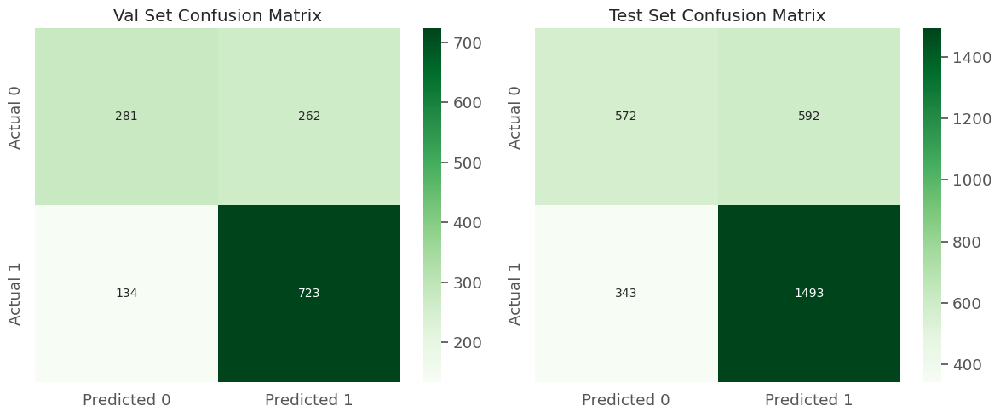

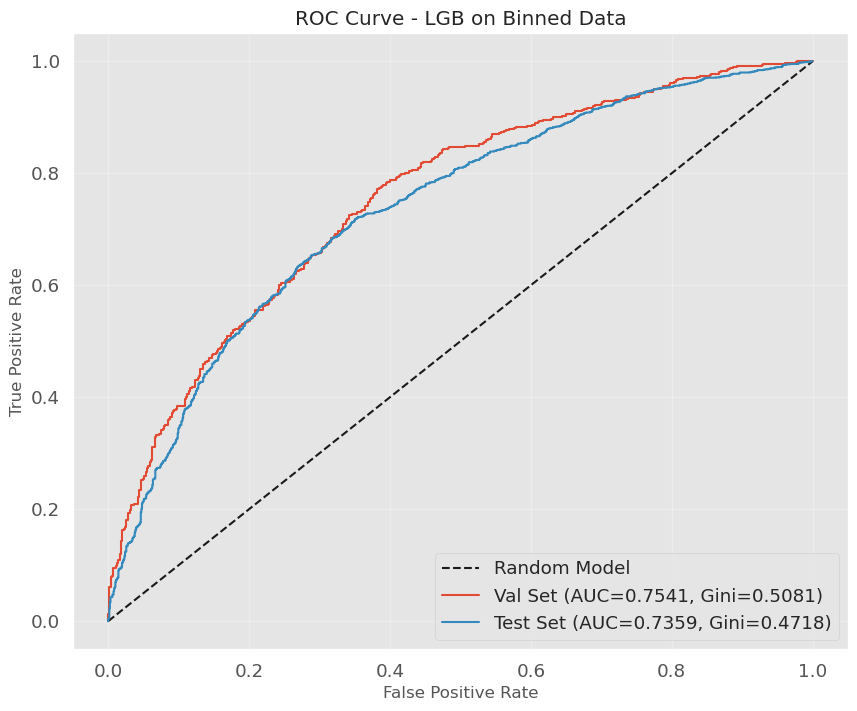

Model saved to lgb_binned_model.pkl


In [118]:
lgb_binned = CreditRiskModel(model_type='lgb', use_binned=True)
lgb_binned.train(X_train_binned_encoded_cleaned, y_train_binned, X_val_binned_encoded_cleaned, y_val_binned, binning_objects=binning_objects, iv_compare=iv_compare_all)
lgb_binned.evaluate(X_train_binned_encoded_cleaned, y_train_binned, X_val_binned_encoded_cleaned, y_val_binned, X_test_binned_encoded_cleaned, y_test_binned)
lgb_binned.plot_results()
lgb_binned.save('lgb_binned_model.pkl')

In [119]:
optbinned_train_cleaned, feature_map = clean_feature_names(optbinned_train)
optbinned_val_cleaned, _ = clean_feature_names(optbinned_val)
optbinned_test_cleaned, _ = clean_feature_names(optbinning_test_binned)

/home/quanghung20gg/anaconda3/lib/python3.12/site-packages/optuna/_experimental.py:31: ExperimentalWarning: Argument ``multivariate`` is an experimental feature. The interface can change in the future.
  warnings.warn(
[I 2025-04-14 21:24:19,423] A new study created in memory with name: credit_risk_lgb


Optimizing hyperparameters for LGB model with Optuna (75 trials)...


Hyperparameter Search: 100%|████████████████████████████████████████| 75/75 [04:47<00:00,  3.83s/it]



Best optimization score: 0.8400
Best parameters: {'n_estimators': 397, 'learning_rate': 0.12723480167936074, 'max_depth': 3, 'num_leaves': 17, 'subsample': 0.6474256077349174, 'colsample_bytree': 0.5084221362090786, 'min_child_samples': 5, 'reg_alpha': 0.019106155896504735, 'reg_lambda': 0.0013507672531718649, 'objective': 'binary', 'metric': 'auc', 'random_state': 42, 'n_jobs': -1, 'verbose': -1, 'boosting_type': 'dart'}

Training final model with best parameters...


Training Final Model: 100%|██████████████████████████████████████| 100/100 [00:00<00:00, 151.47it/s]

Best parameters: {'n_estimators': 397, 'learning_rate': 0.12723480167936074, 'max_depth': 3, 'num_leaves': 17, 'subsample': 0.6474256077349174, 'colsample_bytree': 0.5084221362090786, 'min_child_samples': 5, 'reg_alpha': 0.019106155896504735, 'reg_lambda': 0.0013507672531718649, 'objective': 'binary', 'metric': 'auc', 'random_state': 42, 'n_jobs': -1, 'verbose': -1, 'boosting_type': 'dart'}
Training completed in 287.69 seconds

Model: LGB on binned data

Train Set Metrics:
  Accuracy:  0.7493
  AUC:       0.8215
  Gini:      0.6430
  Precision: 0.7602
  Recall:    0.8626
  F1 Score:  0.8081

Val Set Metrics:
  Accuracy:  0.6964
  AUC:       0.7505
  Gini:      0.5011
  Precision: 0.7231
  Recall:    0.8168
  F1 Score:  0.7671



/tmp/ipykernel_996770/1106290231.py:464: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  vis.matplotlib.plot_optimization_history(study)


<Figure size 1200x600 with 0 Axes>

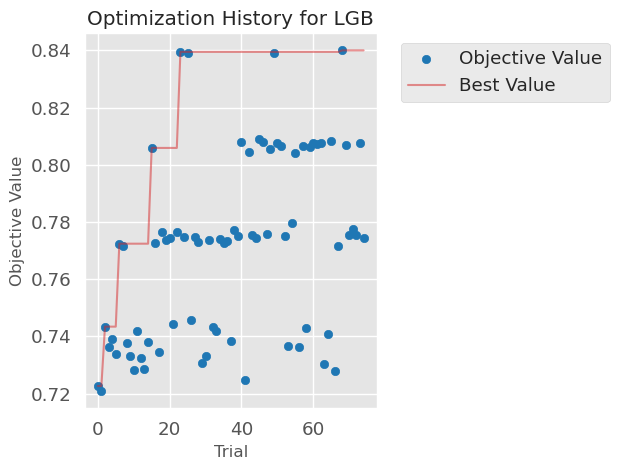

/tmp/ipykernel_996770/1106290231.py:472: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  vis.matplotlib.plot_param_importances(study)
/home/quanghung20gg/anaconda3/lib/python3.12/site-packages/optuna/importance/_fanova/_tree.py:137: RuntimeWarning: invalid value encountered in divide
  weights = weights / active_features_cardinalities


Error plotting Optuna visualizations: 

Model: LGB on binned data

Train Set Metrics:
  Accuracy:  0.7493
  AUC:       0.8215
  Gini:      0.6430
  Precision: 0.7602
  Recall:    0.8626
  F1 Score:  0.8081

Val Set Metrics:
  Accuracy:  0.6964
  AUC:       0.7505
  Gini:      0.5011
  Precision: 0.7231
  Recall:    0.8168
  F1 Score:  0.7671

Test Set Metrics:
  Accuracy:  0.6903
  AUC:       0.7257
  Gini:      0.4513
  Precision: 0.7229
  Recall:    0.8012
  F1 Score:  0.7600


<Figure size 1200x700 with 0 Axes>

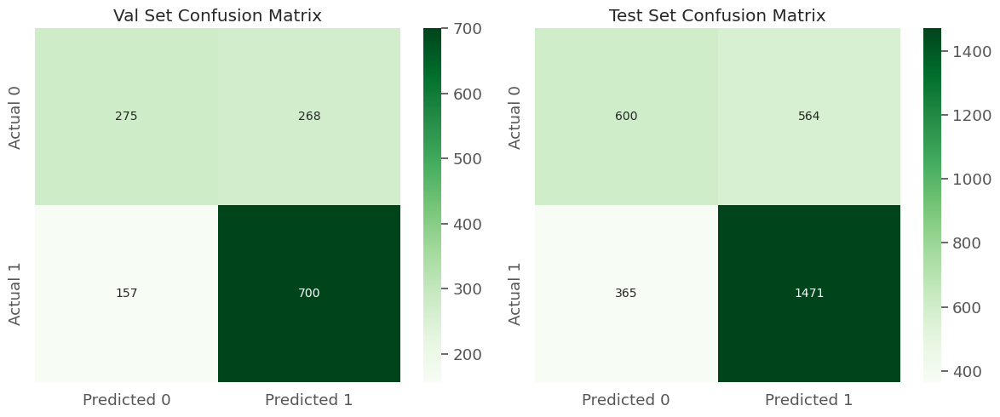

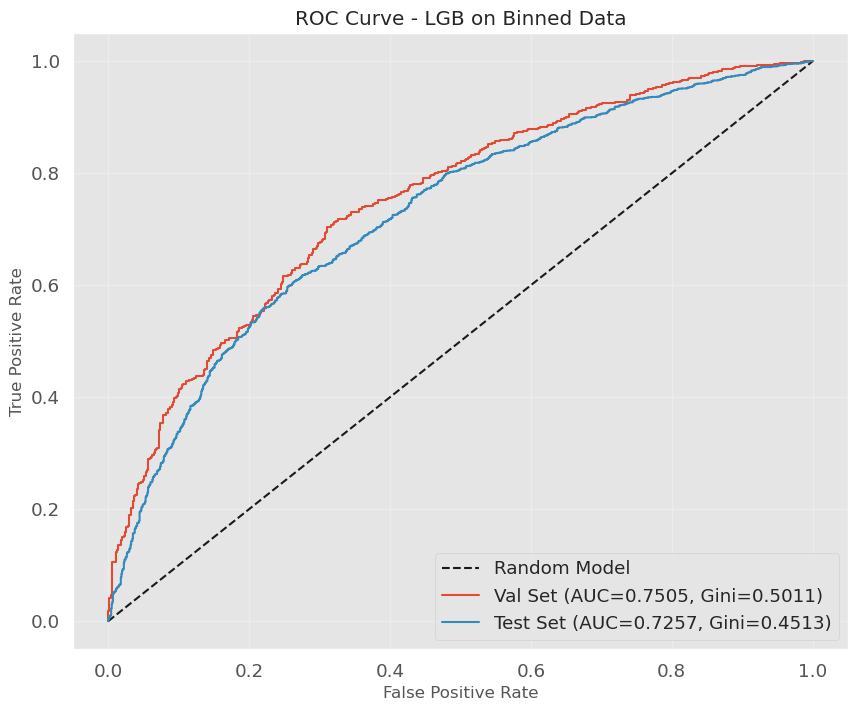

Model saved to lgb_opt_model.pkl


In [120]:
lgb_opt = CreditRiskModel(model_type='lgb', use_binned=True)
lgb_opt.train(optbinned_train_cleaned, y_train_binned, optbinned_val_cleaned, y_val_binned, binning_objects=optbinning_objects)
lgb_opt.evaluate(optbinned_train_cleaned, y_train_binned, optbinned_val_cleaned, y_val_binned, optbinned_test_cleaned, y_test_binned)
lgb_opt.plot_results()
lgb_opt.save('lgb_opt_model.pkl')

In [121]:
tree_comparison = pd.DataFrame({
    'Model': ['Random Forest (Unbinned)', 'Random Forest (Binned)', 'Random Forest (OptBinned)',
              'Gradient Boosting (Unbinned)', 'Gradient Boosting (Binned)', 'Gradient Boosting (OptBinned)',
              'LightGBM (Unbinned)', 'LightGBM (Binned)', 'LightGBM (OptBinned)'],
    'AUC': [rf_unbinned.results['test_auc'], rf_binned.results['test_auc'], rf_opt.results['test_auc'],
            gb_unbinned.results['test_auc'], gb_binned.results['test_auc'], gb_opt.results['test_auc'],
            lgb_unbinned.results['test_auc'], lgb_binned.results['test_auc'], lgb_opt.results['test_auc']],
    'Accuracy': [rf_unbinned.results['test_accuracy'], rf_binned.results['test_accuracy'], rf_opt.results['test_accuracy'],
                 gb_unbinned.results['test_accuracy'], gb_binned.results['test_accuracy'], gb_opt.results['test_accuracy'],
                 lgb_unbinned.results['test_accuracy'], lgb_binned.results['test_accuracy'], lgb_opt.results['test_accuracy']],
    'Precision': [rf_unbinned.results['test_precision'], rf_binned.results['test_precision'], rf_opt.results['test_precision'],
                  gb_unbinned.results['test_precision'], gb_binned.results['test_precision'], gb_opt.results['test_precision'],
                  lgb_unbinned.results['test_precision'], lgb_binned.results['test_precision'], lgb_opt.results['test_precision']],
    'Recall': [rf_unbinned.results['test_recall'], rf_binned.results['test_recall'], rf_opt.results['test_recall'],
             gb_unbinned.results['test_recall'], gb_binned.results['test_recall'], gb_opt.results['test_recall'],
             lgb_unbinned.results['test_recall'], lgb_binned.results['test_recall'], lgb_opt.results['test_recall']],
    'F1 Score': [rf_unbinned.results['test_f1'], rf_binned.results['test_f1'], rf_opt.results['test_f1'],
                 gb_unbinned.results['test_f1'], gb_binned.results['test_f1'], gb_opt.results['test_f1'],
                 lgb_unbinned.results['test_f1'], lgb_binned.results['test_f1'], lgb_opt.results['test_f1']],
    'Confusion Matrix': [rf_unbinned.results['test_confusion_matrix'], rf_binned.results['test_confusion_matrix'], rf_opt.results['test_confusion_matrix'],
                         gb_unbinned.results['test_confusion_matrix'], gb_binned.results['test_confusion_matrix'], gb_opt.results['test_confusion_matrix'],
                         lgb_unbinned.results['test_confusion_matrix'], lgb_binned.results['test_confusion_matrix'], lgb_opt.results['test_confusion_matrix']],
    'Gini': [rf_unbinned.results['test_gini'], rf_binned.results['test_gini'], rf_opt.results['test_gini'],
            gb_unbinned.results['test_gini'], gb_binned.results['test_gini'], gb_opt.results['test_gini'],
            lgb_unbinned.results['test_gini'], lgb_binned.results['test_gini'], lgb_opt.results['test_gini']],
    'Training Time (s)': [rf_unbinned.training_time, rf_binned.training_time, rf_opt.training_time,
                          gb_unbinned.training_time, gb_binned.training_time, gb_opt.training_time,
                          lgb_unbinned.training_time, lgb_binned.training_time, lgb_opt.training_time],
})

# KNN

/home/quanghung20gg/anaconda3/lib/python3.12/site-packages/optuna/_experimental.py:31: ExperimentalWarning: Argument ``multivariate`` is an experimental feature. The interface can change in the future.
  warnings.warn(
[I 2025-04-14 21:29:07,642] A new study created in memory with name: credit_risk_knn


Optimizing hyperparameters for KNN model with Optuna (40 trials)...


Hyperparameter Search:  20%|████████▏                                | 8/40 [00:06<00:23,  1.35it/s][I 2025-04-14 21:29:14,049] Trial 8 finished with value: 0.42668725366094795 and parameters: {'n_neighbors': 3, 'weights': 'uniform', 'p': 2, 'leaf_size': 13, 'algorithm': 'auto'}. Best is trial 1 with value: 0.6789258898504478.
[I 2025-04-14 21:29:14,895] Trial 9 finished with value: 0.6723512652151202 and parameters: {'n_neighbors': 14, 'weights': 'uniform', 'p': 2, 'leaf_size': 39, 'algorithm': 'kd_tree'}. Best is trial 1 with value: 0.6789258898504478.
Hyperparameter Search:  28%|███████████                             | 11/40 [00:08<00:18,  1.53it/s][I 2025-04-14 21:29:15,765] Trial 11 finished with value: 0.44298942751421244 and parameters: {'n_neighbors': 5, 'weights': 'distance', 'p': 2, 'leaf_size': 47, 'algorithm': 'auto'}. Best is trial 1 with value: 0.6789258898504478.
[I 2025-04-14 21:29:16,597] Trial 12 finished with value: 0.5705458684954035 and parameters: {'n_neighbors':


Best optimization score: 0.6857
Best parameters: {'n_neighbors': 21, 'weights': 'uniform', 'p': 1, 'leaf_size': 31, 'algorithm': 'kd_tree', 'n_jobs': -1}

Training final model with best parameters...


Training Final Model: 100%|█████████████████████████████████████| 100/100 [00:00<00:00, 2262.13it/s]


Best parameters: {'n_neighbors': 21, 'weights': 'uniform', 'p': 1, 'leaf_size': 31, 'algorithm': 'kd_tree', 'n_jobs': -1}
Training completed in 27.60 seconds

Model: KNN on unbinned data

Train Set Metrics:
  Accuracy:  0.6957
  AUC:       0.7477
  Gini:      0.4953
  Precision: 0.7055
  Recall:    0.8632
  F1 Score:  0.7764

Val Set Metrics:
  Accuracy:  0.6786
  AUC:       0.6918
  Gini:      0.3837
  Precision: 0.6955
  Recall:    0.8448
  F1 Score:  0.7629


/tmp/ipykernel_996770/1106290231.py:464: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  vis.matplotlib.plot_optimization_history(study)


<Figure size 1200x600 with 0 Axes>

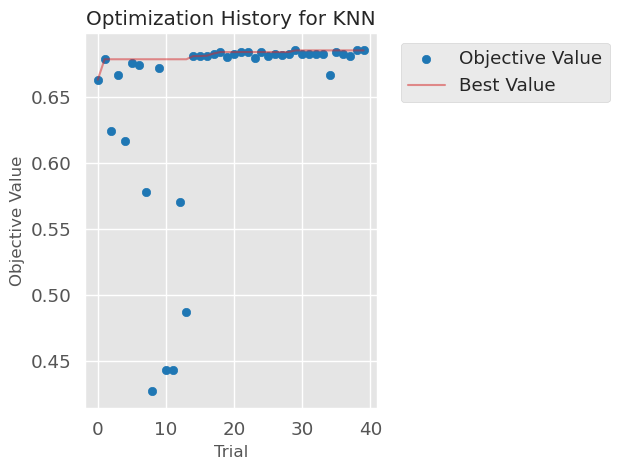

Error plotting Optuna visualizations: 


/tmp/ipykernel_996770/1106290231.py:472: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  vis.matplotlib.plot_param_importances(study)
/home/quanghung20gg/anaconda3/lib/python3.12/site-packages/optuna/importance/_fanova/_tree.py:137: RuntimeWarning: invalid value encountered in divide
  weights = weights / active_features_cardinalities



Model: KNN on unbinned data

Train Set Metrics:
  Accuracy:  0.6957
  AUC:       0.7477
  Gini:      0.4953
  Precision: 0.7055
  Recall:    0.8632
  F1 Score:  0.7764

Val Set Metrics:
  Accuracy:  0.6786
  AUC:       0.6918
  Gini:      0.3837
  Precision: 0.6955
  Recall:    0.8448
  F1 Score:  0.7629

Test Set Metrics:
  Accuracy:  0.6543
  AUC:       0.6743
  Gini:      0.3487
  Precision: 0.6776
  Recall:    0.8301
  F1 Score:  0.7461


<Figure size 1200x700 with 0 Axes>

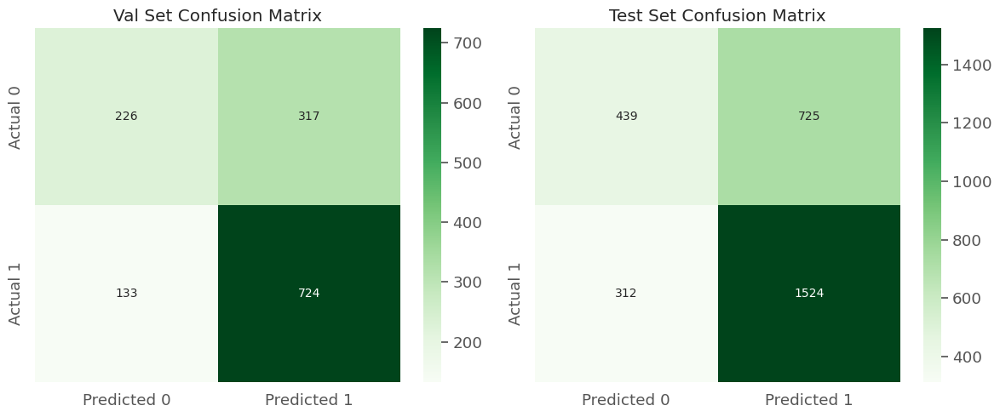

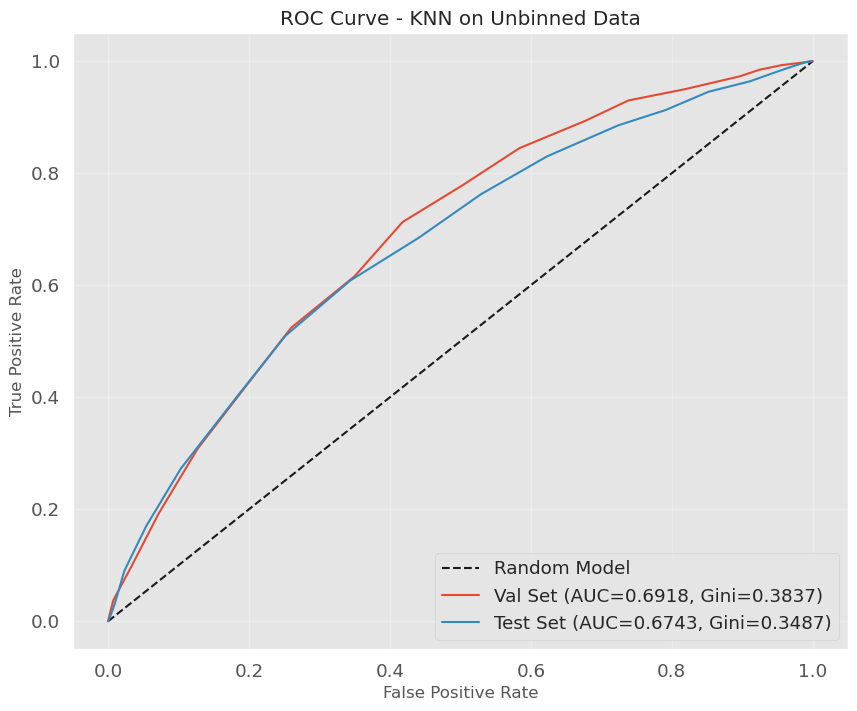

Model saved to knn_unbinned_model.pkl


In [122]:
knn_unbinned = CreditRiskModel(model_type='knn', use_binned=False)
knn_unbinned.train(X_train_unbinned_scaled, y_train_unbinned, X_val_unbinned_scaled, y_val_unbinned)
knn_unbinned.evaluate(X_train_unbinned_scaled, y_train_unbinned, X_val_unbinned_scaled, y_val_unbinned, X_test_unbinned_scaled, y_test_unbinned)
knn_unbinned.plot_results()
knn_unbinned.save('knn_unbinned_model.pkl')

/home/quanghung20gg/anaconda3/lib/python3.12/site-packages/optuna/_experimental.py:31: ExperimentalWarning: Argument ``multivariate`` is an experimental feature. The interface can change in the future.
  warnings.warn(
[I 2025-04-14 21:29:41,704] A new study created in memory with name: credit_risk_knn


Optimizing hyperparameters for KNN model with Optuna (40 trials)...


Hyperparameter Search:  20%|████████▏                                | 8/40 [00:05<00:22,  1.42it/s][I 2025-04-14 21:29:47,773] Trial 8 finished with value: 0.4258987947770622 and parameters: {'n_neighbors': 3, 'weights': 'uniform', 'p': 2, 'leaf_size': 13, 'algorithm': 'auto'}. Best is trial 1 with value: 0.6916995666997752.
[I 2025-04-14 21:29:48,546] Trial 9 finished with value: 0.6770485992885866 and parameters: {'n_neighbors': 14, 'weights': 'uniform', 'p': 2, 'leaf_size': 39, 'algorithm': 'kd_tree'}. Best is trial 1 with value: 0.6916995666997752.
Hyperparameter Search:  28%|███████████                             | 11/40 [00:07<00:18,  1.59it/s][I 2025-04-14 21:29:49,438] Trial 11 finished with value: 0.48418709935934584 and parameters: {'n_neighbors': 5, 'weights': 'distance', 'p': 2, 'leaf_size': 47, 'algorithm': 'auto'}. Best is trial 1 with value: 0.6916995666997752.
[I 2025-04-14 21:29:50,355] Trial 12 finished with value: 0.534441631995174 and parameters: {'n_neighbors': 7


Best optimization score: 0.6991
Best parameters: {'n_neighbors': 21, 'weights': 'distance', 'p': 1, 'leaf_size': 25, 'algorithm': 'kd_tree', 'n_jobs': -1}

Training final model with best parameters...


Training Final Model: 100%|█████████████████████████████████████| 100/100 [00:00<00:00, 3007.10it/s]


Best parameters: {'n_neighbors': 21, 'weights': 'distance', 'p': 1, 'leaf_size': 25, 'algorithm': 'kd_tree', 'n_jobs': -1}
Training completed in 28.47 seconds

Model: KNN on binned data

Train Set Metrics:
  Accuracy:  1.0000
  AUC:       1.0000
  Gini:      1.0000
  Precision: 1.0000
  Recall:    1.0000
  F1 Score:  1.0000

Val Set Metrics:
  Accuracy:  0.6700
  AUC:       0.6998
  Gini:      0.3996
  Precision: 0.6912
  Recall:    0.8331
  F1 Score:  0.7556


/tmp/ipykernel_996770/1106290231.py:464: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  vis.matplotlib.plot_optimization_history(study)


<Figure size 1200x600 with 0 Axes>

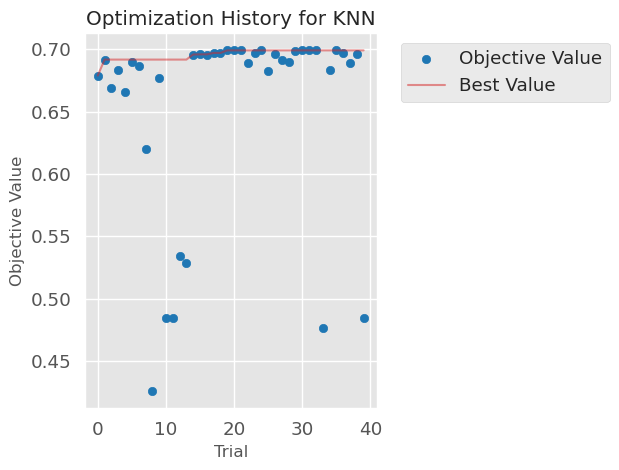

Error plotting Optuna visualizations: 


/tmp/ipykernel_996770/1106290231.py:472: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  vis.matplotlib.plot_param_importances(study)
/home/quanghung20gg/anaconda3/lib/python3.12/site-packages/optuna/importance/_fanova/_tree.py:137: RuntimeWarning: invalid value encountered in divide
  weights = weights / active_features_cardinalities



Model: KNN on binned data

Train Set Metrics:
  Accuracy:  1.0000
  AUC:       1.0000
  Gini:      1.0000
  Precision: 1.0000
  Recall:    1.0000
  F1 Score:  1.0000

Val Set Metrics:
  Accuracy:  0.6700
  AUC:       0.6998
  Gini:      0.3996
  Precision: 0.6912
  Recall:    0.8331
  F1 Score:  0.7556

Test Set Metrics:
  Accuracy:  0.6640
  AUC:       0.6950
  Gini:      0.3900
  Precision: 0.6910
  Recall:    0.8159
  F1 Score:  0.7483


<Figure size 1200x700 with 0 Axes>

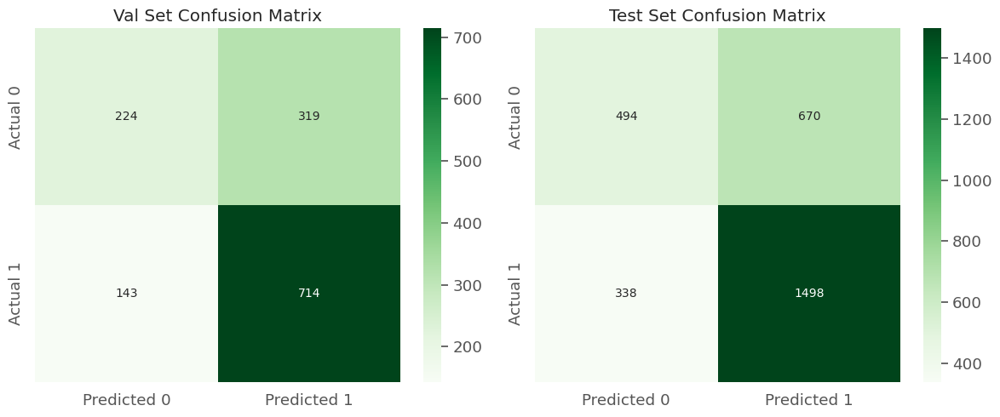

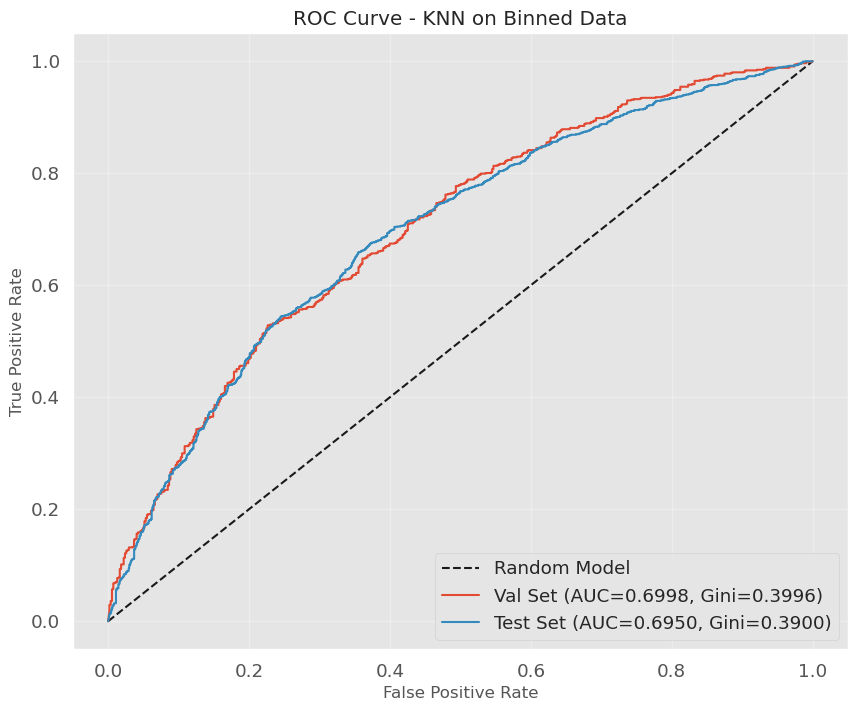

Model saved to knn_binned_model.pkl


In [123]:
knn_binned = CreditRiskModel(model_type='knn', use_binned=True)
knn_binned.train(X_train_binned_encoded, y_train_binned, X_val_binned_encoded, y_val_binned, binning_objects=binning_objects, iv_compare=iv_compare_all)
knn_binned.evaluate(X_train_binned_encoded, y_train_binned, X_val_binned_encoded, y_val_binned, X_test_binned_encoded, y_test_binned)
knn_binned.plot_results()
knn_binned.save('knn_binned_model.pkl')

/home/quanghung20gg/anaconda3/lib/python3.12/site-packages/optuna/_experimental.py:31: ExperimentalWarning: Argument ``multivariate`` is an experimental feature. The interface can change in the future.
  warnings.warn(
[I 2025-04-14 21:30:16,205] A new study created in memory with name: credit_risk_knn


Optimizing hyperparameters for KNN model with Optuna (40 trials)...


Hyperparameter Search:  20%|████████▏                                | 8/40 [00:04<00:17,  1.85it/s][I 2025-04-14 21:30:20,675] Trial 8 finished with value: 0.6289197754534952 and parameters: {'n_neighbors': 3, 'weights': 'uniform', 'p': 2, 'leaf_size': 13, 'algorithm': 'auto'}. Best is trial 1 with value: 0.7153497137991005.
[I 2025-04-14 21:30:21,211] Trial 9 finished with value: 0.7154521848774725 and parameters: {'n_neighbors': 14, 'weights': 'uniform', 'p': 2, 'leaf_size': 39, 'algorithm': 'kd_tree'}. Best is trial 9 with value: 0.7154521848774725.
Hyperparameter Search:  28%|███████████                             | 11/40 [00:05<00:13,  2.09it/s][I 2025-04-14 21:30:21,905] Trial 11 finished with value: 0.6872381260673948 and parameters: {'n_neighbors': 5, 'weights': 'distance', 'p': 2, 'leaf_size': 47, 'algorithm': 'auto'}. Best is trial 9 with value: 0.7154521848774725.
[I 2025-04-14 21:30:22,453] Trial 12 finished with value: 0.7049321967744032 and parameters: {'n_neighbors': 7


Best optimization score: 0.7244
Best parameters: {'n_neighbors': 21, 'weights': 'distance', 'p': 2, 'leaf_size': 32, 'algorithm': 'auto', 'n_jobs': -1}

Training final model with best parameters...


Training Final Model: 100%|████████████████████████████████████| 100/100 [00:00<00:00, 61419.01it/s]

Best parameters: {'n_neighbors': 21, 'weights': 'distance', 'p': 2, 'leaf_size': 32, 'algorithm': 'auto', 'n_jobs': -1}
Training completed in 14.28 seconds

Model: KNN on binned data

Train Set Metrics:
  Accuracy:  1.0000
  AUC:       1.0000
  Gini:      1.0000
  Precision: 1.0000
  Recall:    1.0000
  F1 Score:  1.0000

Val Set Metrics:
  Accuracy:  0.6800
  AUC:       0.7208
  Gini:      0.4417
  Precision: 0.7080
  Recall:    0.8121
  F1 Score:  0.7565



/tmp/ipykernel_996770/1106290231.py:464: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  vis.matplotlib.plot_optimization_history(study)


<Figure size 1200x600 with 0 Axes>

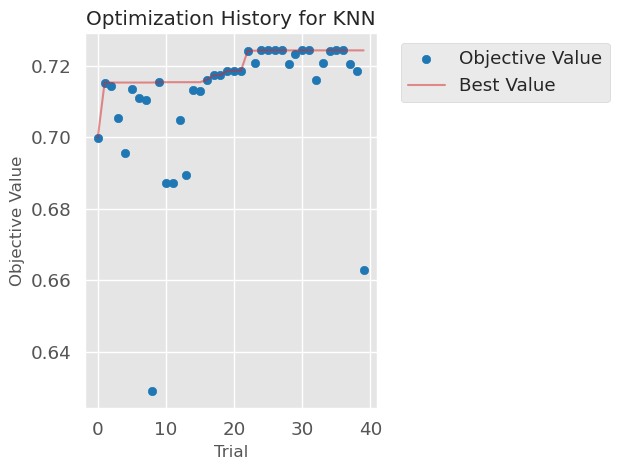

/tmp/ipykernel_996770/1106290231.py:472: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  vis.matplotlib.plot_param_importances(study)
/home/quanghung20gg/anaconda3/lib/python3.12/site-packages/optuna/importance/_fanova/_tree.py:137: RuntimeWarning: invalid value encountered in divide
  weights = weights / active_features_cardinalities


Error plotting Optuna visualizations: 

Model: KNN on binned data

Train Set Metrics:
  Accuracy:  1.0000
  AUC:       1.0000
  Gini:      1.0000
  Precision: 1.0000
  Recall:    1.0000
  F1 Score:  1.0000

Val Set Metrics:
  Accuracy:  0.6800
  AUC:       0.7208
  Gini:      0.4417
  Precision: 0.7080
  Recall:    0.8121
  F1 Score:  0.7565

Test Set Metrics:
  Accuracy:  0.6697
  AUC:       0.6986
  Gini:      0.3971
  Precision: 0.7009
  Recall:    0.8028
  F1 Score:  0.7484


<Figure size 1200x700 with 0 Axes>

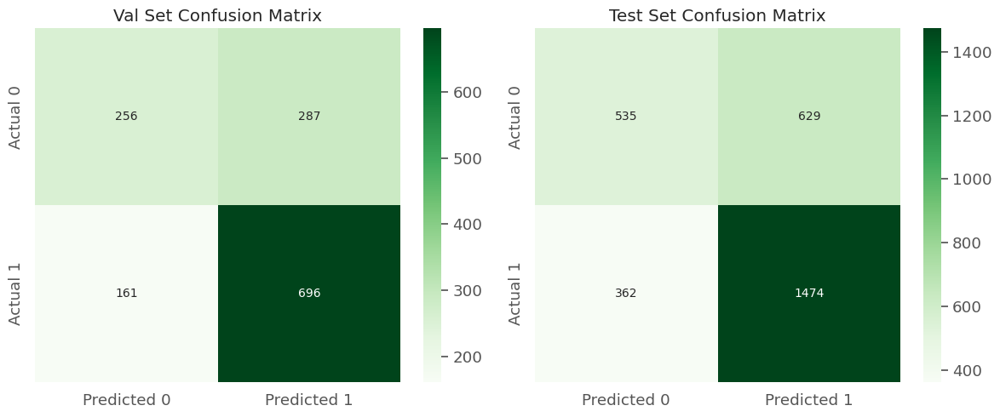

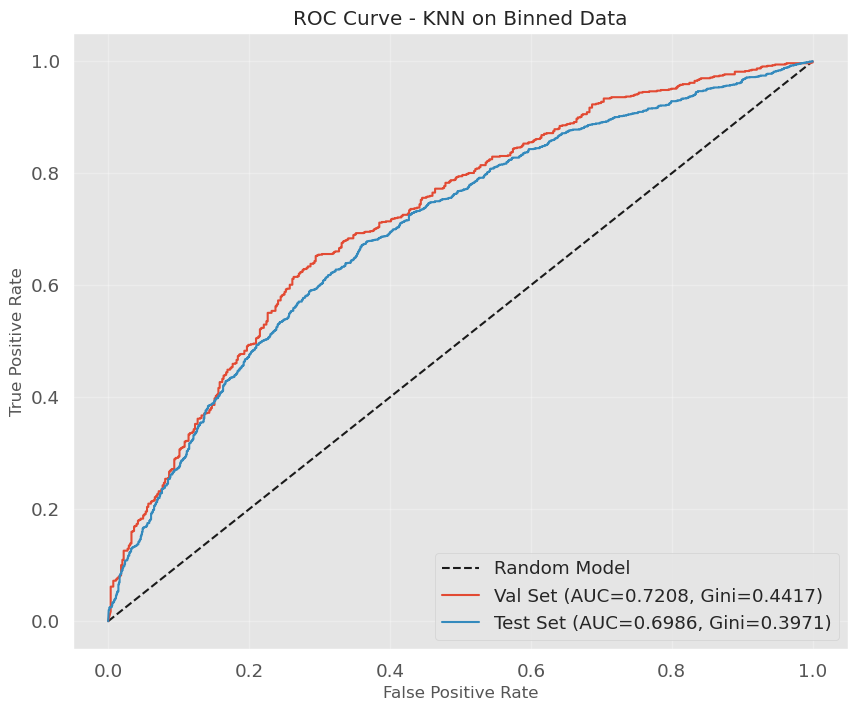

Model saved to knn_opt_model.pkl


In [124]:
knn_opt = CreditRiskModel(model_type='knn', use_binned=True)
knn_opt.train(optbinned_train, y_train_binned, optbinned_val, y_val_binned, binning_objects=optbinning_objects)
knn_opt.evaluate(optbinned_train, y_train_binned, optbinned_val, y_val_binned, optbinning_test_binned, y_test_binned)
knn_opt.plot_results()
knn_opt.save('knn_opt_model.pkl')

In [125]:
knn_comparison = pd.DataFrame({
    'Model': ['KNN (Unbinned)', 'KNN (Binned)', 'KNN (OptBinned)'],
    'AUC': [knn_unbinned.results['test_auc'], knn_binned.results['test_auc'], knn_opt.results['test_auc']],
    'Accuracy': [knn_unbinned.results['test_accuracy'], knn_binned.results['test_accuracy'], knn_opt.results['test_accuracy']],
    'Precision': [knn_unbinned.results['test_precision'], knn_binned.results['test_precision'], knn_opt.results['test_precision']],
    'Recall': [knn_unbinned.results['test_recall'], knn_binned.results['test_recall'], knn_opt.results['test_recall']],
    'F1 Score': [knn_unbinned.results['test_f1'], knn_binned.results['test_f1'], knn_opt.results['test_f1']],
    'Gini': [knn_unbinned.results['test_gini'], knn_binned.results['test_gini'], knn_opt.results['test_gini']],
    'Training Time (s)': [knn_unbinned.training_time, knn_binned.training_time, knn_opt.training_time],
})
knn_comparison

,Model,AUC,Accuracy,Precision,Recall,F1 Score,Gini,Training Time (s)
0,KNN (Unbinned),0.674346,0.654333,0.677635,0.830065,0.746144,0.348692,27.597322
1,KNN (Binned),0.695008,0.664000,0.690959,0.815904,0.748252,0.390016,28.471946
2,KNN (OptBinned),0.698575,0.669667,0.700903,0.802832,0.748413,0.397149,14.276623


# Gradient  Boosting

/home/quanghung20gg/anaconda3/lib/python3.12/site-packages/optuna/_experimental.py:31: ExperimentalWarning: Argument ``multivariate`` is an experimental feature. The interface can change in the future.
  warnings.warn(
[I 2025-04-14 21:30:31,248] A new study created in memory with name: credit_risk_gb


Optimizing hyperparameters for GB model with Optuna (50 trials)...


Hyperparameter Search: 100%|████████████████████████████████████████| 50/50 [09:38<00:00, 11.57s/it]



Best optimization score: 0.7651
Best parameters: {'n_estimators': 246, 'learning_rate': 0.01926685100834125, 'max_depth': 4, 'subsample': 0.7079567626696657, 'min_samples_split': 9, 'min_samples_leaf': 2, 'max_features': None, 'random_state': 42}

Training final model with best parameters...


Training Final Model: 100%|███████████████████████████████████████| 100/100 [00:08<00:00, 11.67it/s]

Applying isotonic probability calibration...
Probability calibration applied.
Best parameters: {'n_estimators': 246, 'learning_rate': 0.01926685100834125, 'max_depth': 4, 'subsample': 0.7079567626696657, 'min_samples_split': 9, 'min_samples_leaf': 2, 'max_features': None, 'random_state': 42}
Training completed in 587.28 seconds

Model: GB on unbinned data

Train Set Metrics:
  Accuracy:  0.7548
  AUC:       0.8296
  Gini:      0.6592
  Precision: 0.7682
  Recall:    0.8585
  F1 Score:  0.8109

Val Set Metrics:
  Accuracy:  0.7014
  AUC:       0.7504
  Gini:      0.5007
  Precision: 0.7270
  Recall:    0.8203
  F1 Score:  0.7708



/tmp/ipykernel_996770/1106290231.py:464: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  vis.matplotlib.plot_optimization_history(study)


<Figure size 1200x600 with 0 Axes>

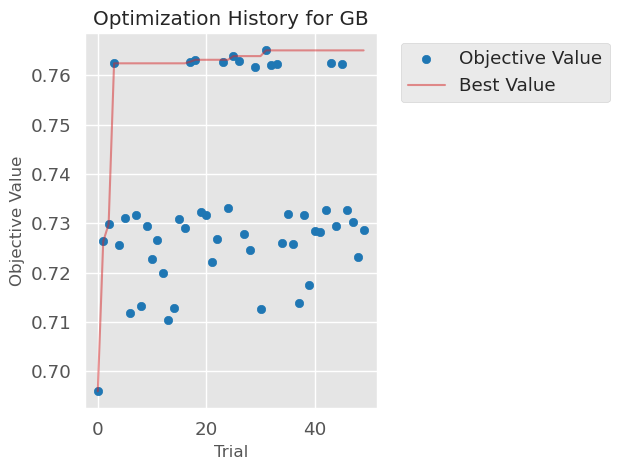

/tmp/ipykernel_996770/1106290231.py:472: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  vis.matplotlib.plot_param_importances(study)
/home/quanghung20gg/anaconda3/lib/python3.12/site-packages/optuna/importance/_fanova/_tree.py:137: RuntimeWarning: invalid value encountered in divide
  weights = weights / active_features_cardinalities


Error plotting Optuna visualizations: 

Model: GB on unbinned data

Train Set Metrics:
  Accuracy:  0.7548
  AUC:       0.8296
  Gini:      0.6592
  Precision: 0.7682
  Recall:    0.8585
  F1 Score:  0.8109

Val Set Metrics:
  Accuracy:  0.7014
  AUC:       0.7504
  Gini:      0.5007
  Precision: 0.7270
  Recall:    0.8203
  F1 Score:  0.7708

Test Set Metrics:
  Accuracy:  0.6877
  AUC:       0.7277
  Gini:      0.4553
  Precision: 0.7196
  Recall:    0.8023
  F1 Score:  0.7587


<Figure size 1200x700 with 0 Axes>

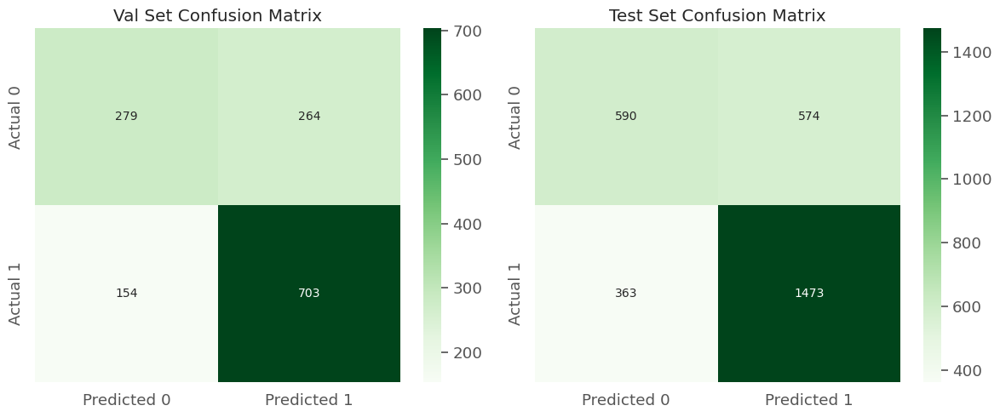

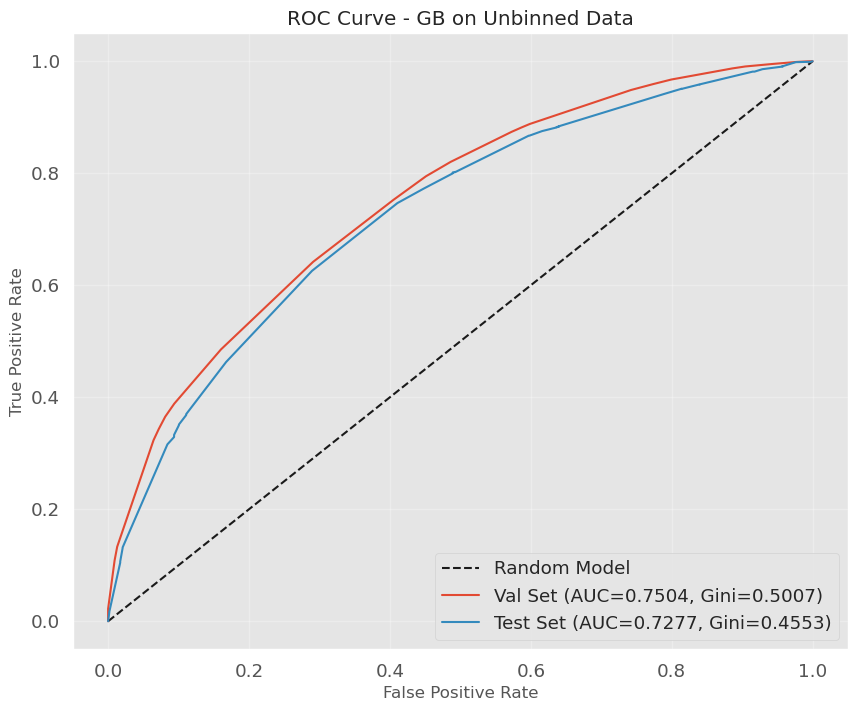

Model saved to gb_unbinned_model.pkl


In [126]:
gb_unbinned = CreditRiskModel(model_type='gb', use_binned=False)
gb_unbinned.train(X_train_unbinned_scaled, y_train_unbinned, X_val_unbinned_scaled, y_val_unbinned)
gb_unbinned.evaluate(X_train_unbinned_scaled, y_train_unbinned, X_val_unbinned_scaled, y_val_unbinned, X_test_unbinned_scaled, y_test_unbinned)
gb_unbinned.plot_results()
gb_unbinned.save('gb_unbinned_model.pkl')

/home/quanghung20gg/anaconda3/lib/python3.12/site-packages/optuna/_experimental.py:31: ExperimentalWarning: Argument ``multivariate`` is an experimental feature. The interface can change in the future.
  warnings.warn(
[I 2025-04-14 21:40:19,131] A new study created in memory with name: credit_risk_gb


Optimizing hyperparameters for GB model with Optuna (50 trials)...


Hyperparameter Search: 100%|████████████████████████████████████████| 50/50 [06:51<00:00,  8.23s/it]



Best optimization score: 0.7744
Best parameters: {'n_estimators': 283, 'learning_rate': 0.02100664993259108, 'max_depth': 5, 'subsample': 0.8631029691590342, 'min_samples_split': 2, 'min_samples_leaf': 6, 'max_features': 'sqrt', 'random_state': 42}

Training final model with best parameters...


Training Final Model: 100%|██████████████████████████████████████| 100/100 [00:00<00:00, 116.60it/s]

Applying isotonic probability calibration...
Probability calibration applied.
Best parameters: {'n_estimators': 283, 'learning_rate': 0.02100664993259108, 'max_depth': 5, 'subsample': 0.8631029691590342, 'min_samples_split': 2, 'min_samples_leaf': 6, 'max_features': 'sqrt', 'random_state': 42}
Training completed in 412.14 seconds

Model: GB on binned data

Train Set Metrics:
  Accuracy:  0.7729
  AUC:       0.8482
  Gini:      0.6965
  Precision: 0.8037
  Recall:    0.8323
  F1 Score:  0.8177

Val Set Metrics:
  Accuracy:  0.7086
  AUC:       0.7618
  Gini:      0.5237
  Precision: 0.7470
  Recall:    0.7923
  F1 Score:  0.7690



/tmp/ipykernel_996770/1106290231.py:464: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  vis.matplotlib.plot_optimization_history(study)


<Figure size 1200x600 with 0 Axes>

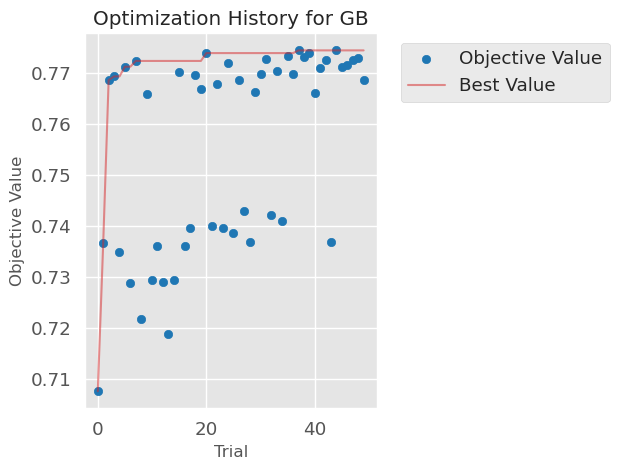

/tmp/ipykernel_996770/1106290231.py:472: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  vis.matplotlib.plot_param_importances(study)
/home/quanghung20gg/anaconda3/lib/python3.12/site-packages/optuna/importance/_fanova/_tree.py:137: RuntimeWarning: invalid value encountered in divide
  weights = weights / active_features_cardinalities


Error plotting Optuna visualizations: 

Model: GB on binned data

Train Set Metrics:
  Accuracy:  0.7729
  AUC:       0.8482
  Gini:      0.6965
  Precision: 0.8037
  Recall:    0.8323
  F1 Score:  0.8177

Val Set Metrics:
  Accuracy:  0.7086
  AUC:       0.7618
  Gini:      0.5237
  Precision: 0.7470
  Recall:    0.7923
  F1 Score:  0.7690

Test Set Metrics:
  Accuracy:  0.6977
  AUC:       0.7404
  Gini:      0.4807
  Precision: 0.7357
  Recall:    0.7898
  F1 Score:  0.7618


<Figure size 1200x700 with 0 Axes>

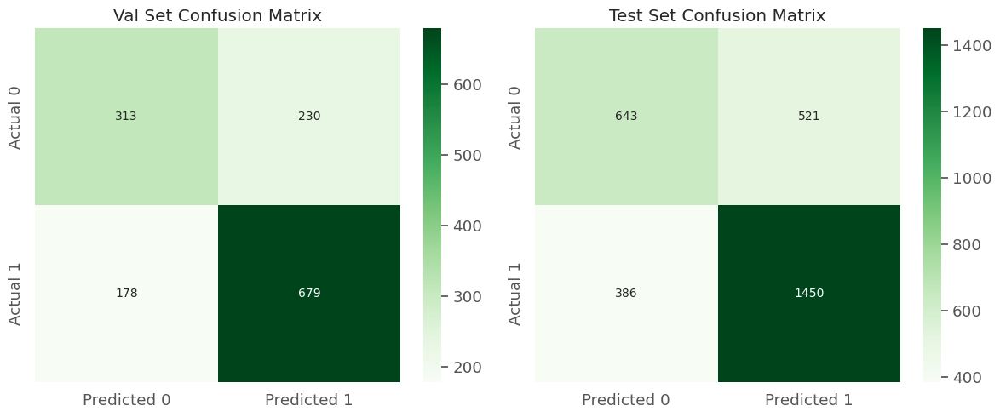

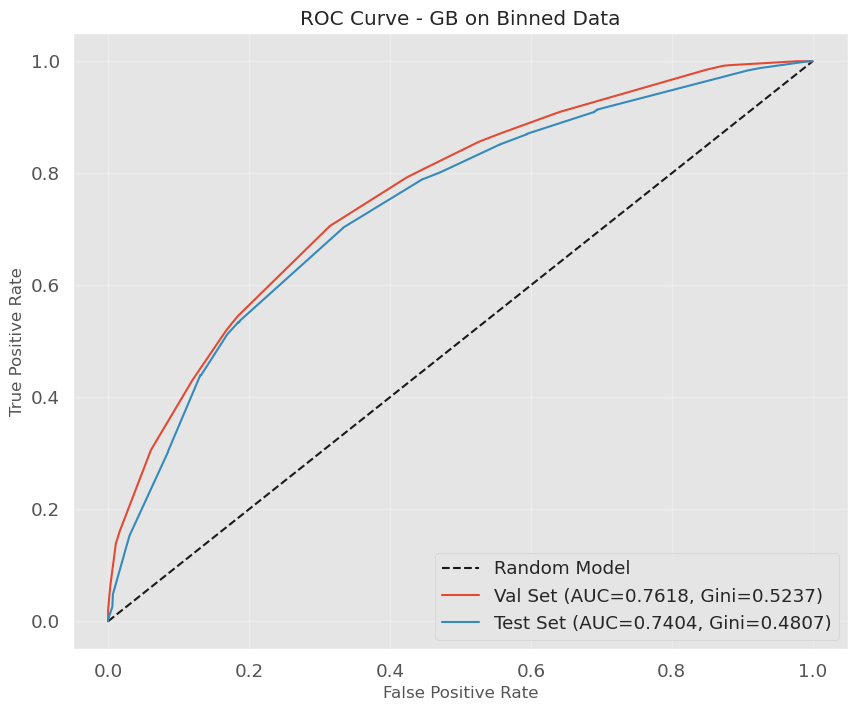

Model saved to gb_binned_model.pkl


In [127]:
gb_binned = CreditRiskModel(model_type='gb', use_binned=True)
gb_binned.train(X_train_binned_encoded, y_train_binned, X_val_binned_encoded, y_val_binned, binning_objects=binning_objects, iv_compare=iv_compare_all)
gb_binned.evaluate(X_train_binned_encoded, y_train_binned, X_val_binned_encoded, y_val_binned, X_test_binned_encoded, y_test_binned)
gb_binned.plot_results()
gb_binned.save('gb_binned_model.pkl')

/home/quanghung20gg/anaconda3/lib/python3.12/site-packages/optuna/_experimental.py:31: ExperimentalWarning: Argument ``multivariate`` is an experimental feature. The interface can change in the future.
  warnings.warn(
[I 2025-04-14 21:47:11,929] A new study created in memory with name: credit_risk_gb


Optimizing hyperparameters for GB model with Optuna (50 trials)...


Hyperparameter Search: 100%|████████████████████████████████████████| 50/50 [05:57<00:00,  7.15s/it]



Best optimization score: 0.8374
Best parameters: {'n_estimators': 200, 'learning_rate': 0.0372182039959237, 'max_depth': 5, 'subsample': 0.7840809791988914, 'min_samples_split': 11, 'min_samples_leaf': 1, 'max_features': None, 'random_state': 42}

Training final model with best parameters...


Training Final Model: 100%|███████████████████████████████████████| 100/100 [00:03<00:00, 29.95it/s]

Applying isotonic probability calibration...
Probability calibration applied.
Best parameters: {'n_estimators': 200, 'learning_rate': 0.0372182039959237, 'max_depth': 5, 'subsample': 0.7840809791988914, 'min_samples_split': 11, 'min_samples_leaf': 1, 'max_features': None, 'random_state': 42}
Training completed in 361.07 seconds

Model: GB on binned data

Train Set Metrics:
  Accuracy:  0.8387
  AUC:       0.9166
  Gini:      0.8332
  Precision: 0.8411
  Recall:    0.9081
  F1 Score:  0.8733

Val Set Metrics:
  Accuracy:  0.7064
  AUC:       0.7622
  Gini:      0.5243
  Precision: 0.7419
  Recall:    0.7981
  F1 Score:  0.7690



/tmp/ipykernel_996770/1106290231.py:464: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  vis.matplotlib.plot_optimization_history(study)


<Figure size 1200x600 with 0 Axes>

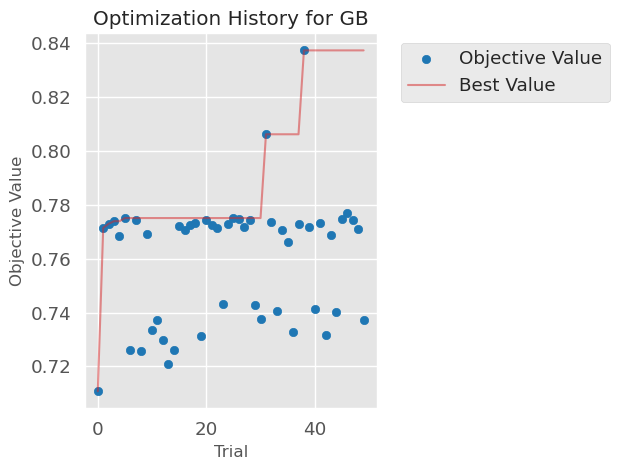

/tmp/ipykernel_996770/1106290231.py:472: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  vis.matplotlib.plot_param_importances(study)
/home/quanghung20gg/anaconda3/lib/python3.12/site-packages/optuna/importance/_fanova/_tree.py:137: RuntimeWarning: invalid value encountered in divide
  weights = weights / active_features_cardinalities


Error plotting Optuna visualizations: 

Model: GB on binned data

Train Set Metrics:
  Accuracy:  0.8387
  AUC:       0.9166
  Gini:      0.8332
  Precision: 0.8411
  Recall:    0.9081
  F1 Score:  0.8733

Val Set Metrics:
  Accuracy:  0.7064
  AUC:       0.7622
  Gini:      0.5243
  Precision: 0.7419
  Recall:    0.7981
  F1 Score:  0.7690

Test Set Metrics:
  Accuracy:  0.6783
  AUC:       0.7189
  Gini:      0.4378
  Precision: 0.7223
  Recall:    0.7707
  F1 Score:  0.7457


<Figure size 1200x700 with 0 Axes>

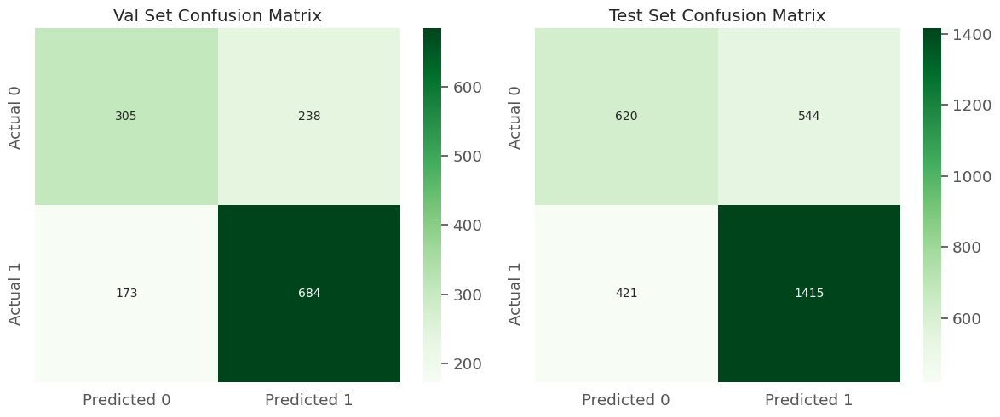

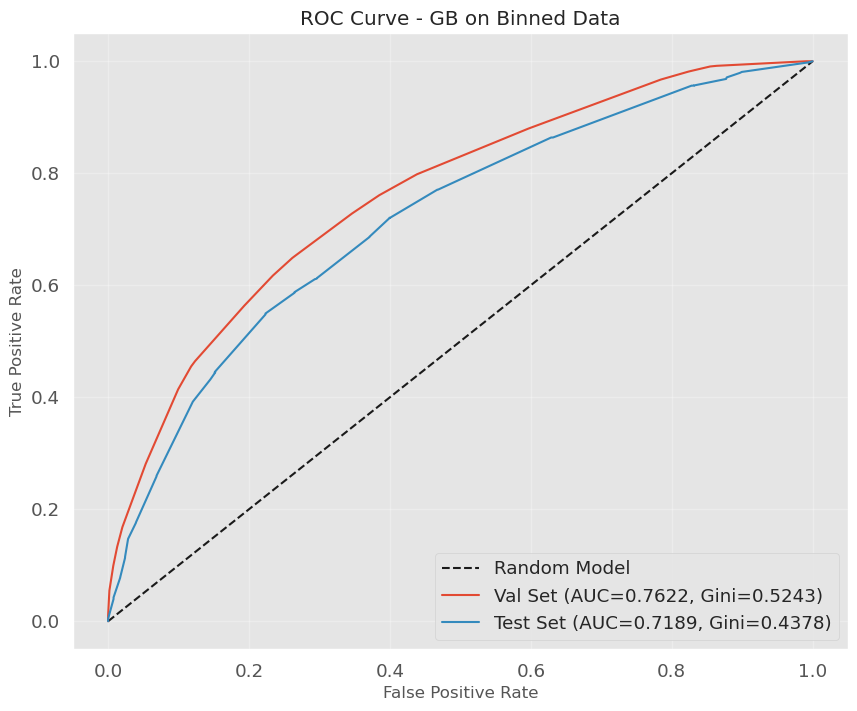

Model saved to gb_opt_model.pkl


In [128]:
gb_opt = CreditRiskModel(model_type='gb', use_binned=True)
gb_opt.train(optbinned_train, y_train_binned, optbinned_val, y_val_binned, binning_objects=optbinning_objects)
gb_opt.evaluate(optbinned_train, y_train_binned, optbinned_val, y_val_binned, optbinning_test_binned, y_test_binned)
gb_opt.plot_results()
gb_opt.save('gb_opt_model.pkl')


In [129]:
gb_comparison = pd.DataFrame({
    'Model': ['Gradient Boosting (Unbinned)', 'Gradient Boosting (Binned)', 'Gradient Boosting (OptBinned)'],
    'AUC': [gb_unbinned.results['test_auc'], gb_binned.results['test_auc'], gb_opt.results['test_auc']],
    'Accuracy': [gb_unbinned.results['test_accuracy'], gb_binned.results['test_accuracy'], gb_opt.results['test_accuracy']],
    'Precision': [gb_unbinned.results['test_precision'], gb_binned.results['test_precision'], gb_opt.results['test_precision']],
    'Recall': [gb_unbinned.results['test_recall'], gb_binned.results['test_recall'], gb_opt.results['test_recall']],
    'F1 Score': [gb_unbinned.results['test_f1'], gb_binned.results['test_f1'], gb_opt.results['test_f1']],
    'Gini': [gb_unbinned.results['test_gini'], gb_binned.results['test_gini'], gb_opt.results['test_gini']],
    'Training Time (s)': [gb_unbinned.training_time, gb_binned.training_time, gb_opt.training_time],
})
gb_comparison

,Model,AUC,Accuracy,Precision,Recall,F1 Score,Gini,Training Time (s)
0,Gradient Boosting (Unbinned),0.727651,0.687667,0.719590,0.802288,0.758692,0.455302,587.278292
1,Gradient Boosting (Binned),0.740373,0.697667,0.735667,0.789760,0.761755,0.480747,412.141871
2,Gradient Boosting (OptBinned),0.718884,0.678333,0.722307,0.770697,0.745718,0.437767,361.067463


# XGBoost

/home/quanghung20gg/anaconda3/lib/python3.12/site-packages/optuna/_experimental.py:31: ExperimentalWarning: Argument ``multivariate`` is an experimental feature. The interface can change in the future.
  warnings.warn(
[I 2025-04-14 21:53:13,606] A new study created in memory with name: credit_risk_xgb


Optimizing hyperparameters for XGB model with Optuna (75 trials)...


Hyperparameter Search:   0%|                                                 | 0/75 [00:00<?, ?it/s]/home/quanghung20gg/anaconda3/lib/python3.12/site-packages/xgboost/training.py:183: UserWarning: [21:53:13] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/quanghung20gg/anaconda3/lib/python3.12/site-packages/xgboost/training.py:183: UserWarning: [21:53:14] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/quanghung20gg/anaconda3/lib/python3.12/site-packages/xgboost/training.py:183: UserWarning: [21:53:14] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/quanghung20gg/anaconda3/lib/python3.12/site-packages/xgboost/training.py:183: UserWarning: [21:53:15] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_


Best optimization score: 0.7696
Best parameters: {'n_estimators': 378, 'learning_rate': 0.027891570261292867, 'max_depth': 3, 'subsample': 0.7114576843471331, 'colsample_bytree': 0.713944575949853, 'min_child_weight': 10, 'gamma': 0.0006034530679791495, 'reg_alpha': 0.00037637431208199936, 'reg_lambda': 0.00306315473760666, 'tree_method': 'hist', 'eval_metric': 'auc', 'use_label_encoder': False, 'random_state': 42, 'n_jobs': -1}

Training final model with best parameters...


Training Final Model:   0%|                                                 | 0/100 [00:00<?, ?it/s]/home/quanghung20gg/anaconda3/lib/python3.12/site-packages/xgboost/training.py:183: UserWarning: [21:55:37] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
Training Final Model: 100%|██████████████████████████████████████| 100/100 [00:00<00:00, 309.97it/s]

Best parameters: {'n_estimators': 378, 'learning_rate': 0.027891570261292867, 'max_depth': 3, 'subsample': 0.7114576843471331, 'colsample_bytree': 0.713944575949853, 'min_child_weight': 10, 'gamma': 0.0006034530679791495, 'reg_alpha': 0.00037637431208199936, 'reg_lambda': 0.00306315473760666, 'tree_method': 'hist', 'eval_metric': 'auc', 'use_label_encoder': False, 'random_state': 42, 'n_jobs': -1}
Training completed in 144.54 seconds

Model: XGB on unbinned data

Train Set Metrics:
  Accuracy:  0.7452
  AUC:       0.8140
  Gini:      0.6280
  Precision: 0.7573
  Recall:    0.8591
  F1 Score:  0.8050

Val Set Metrics:
  Accuracy:  0.7057
  AUC:       0.7503
  Gini:      0.5007
  Precision: 0.7277
  Recall:    0.8296
  F1 Score:  0.7754



/tmp/ipykernel_996770/1106290231.py:464: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  vis.matplotlib.plot_optimization_history(study)


<Figure size 1200x600 with 0 Axes>

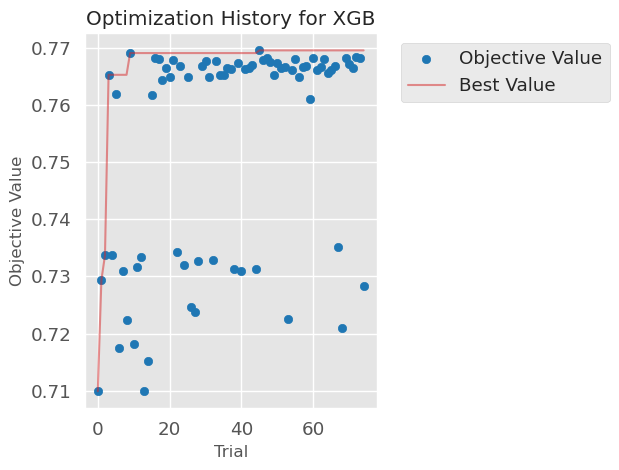

/tmp/ipykernel_996770/1106290231.py:472: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  vis.matplotlib.plot_param_importances(study)
/home/quanghung20gg/anaconda3/lib/python3.12/site-packages/optuna/importance/_fanova/_tree.py:137: RuntimeWarning: invalid value encountered in divide
  weights = weights / active_features_cardinalities


Error plotting Optuna visualizations: 

Model: XGB on unbinned data

Train Set Metrics:
  Accuracy:  0.7452
  AUC:       0.8140
  Gini:      0.6280
  Precision: 0.7573
  Recall:    0.8591
  F1 Score:  0.8050

Val Set Metrics:
  Accuracy:  0.7057
  AUC:       0.7503
  Gini:      0.5007
  Precision: 0.7277
  Recall:    0.8296
  F1 Score:  0.7754

Test Set Metrics:
  Accuracy:  0.6773
  AUC:       0.7225
  Gini:      0.4450
  Precision: 0.7026
  Recall:    0.8197
  F1 Score:  0.7567


<Figure size 1200x700 with 0 Axes>

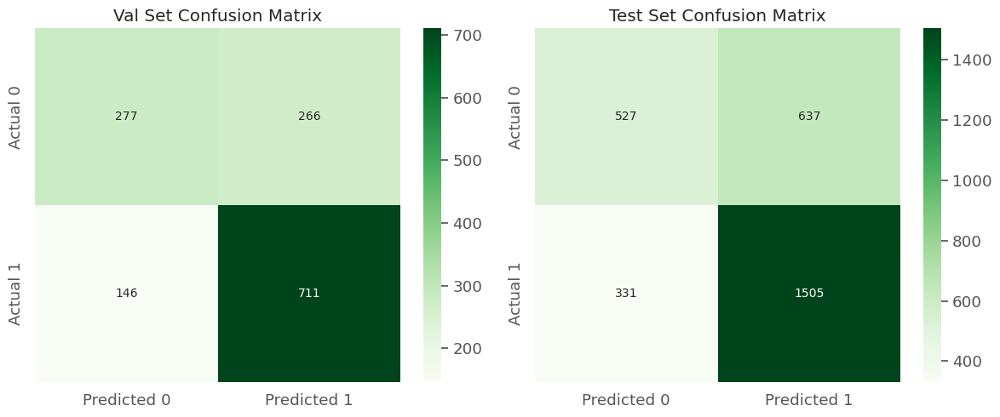

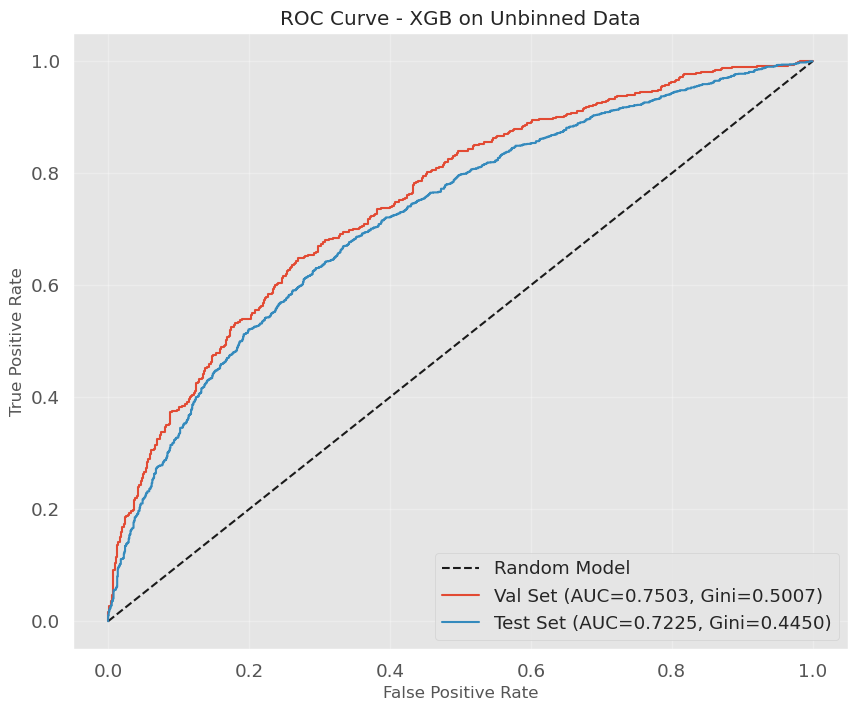

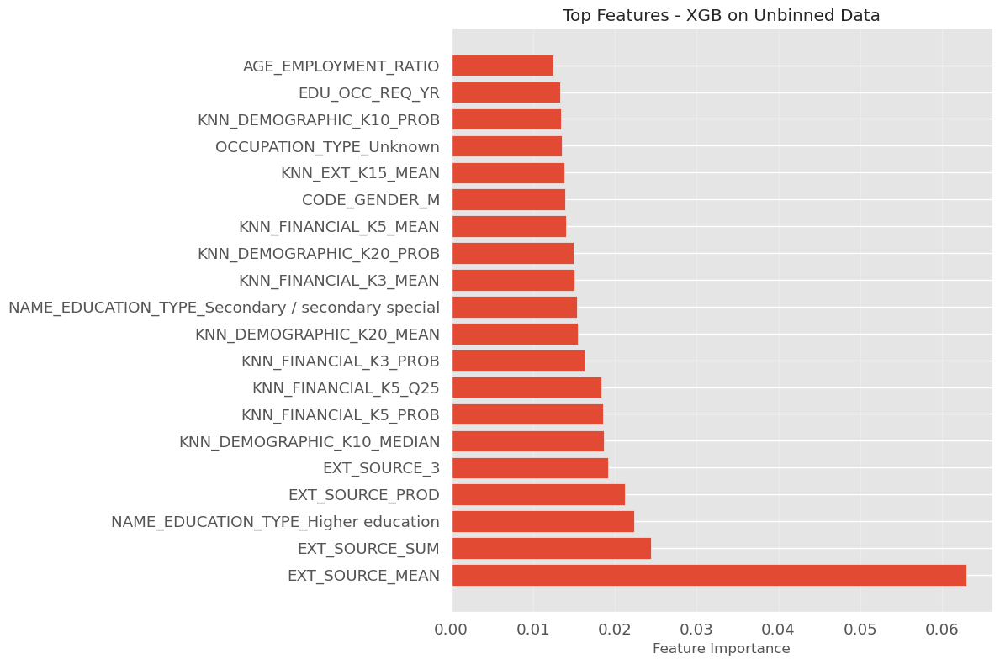

Model saved to xgb_unbinned_model.pkl


In [130]:
xgb_unbinned = CreditRiskModel(model_type='xgb', use_binned=False)
xgb_unbinned.train(X_train_unbinned_scaled, y_train_unbinned, X_val_unbinned_scaled, y_val_unbinned)
xgb_unbinned.evaluate(X_train_unbinned_scaled, y_train_unbinned, X_val_unbinned_scaled, y_val_unbinned, X_test_unbinned_scaled, y_test_unbinned)
xgb_unbinned.plot_results()
xgb_unbinned.save('xgb_unbinned_model.pkl')

/home/quanghung20gg/anaconda3/lib/python3.12/site-packages/optuna/_experimental.py:31: ExperimentalWarning: Argument ``multivariate`` is an experimental feature. The interface can change in the future.
  warnings.warn(
[I 2025-04-14 21:55:38,994] A new study created in memory with name: credit_risk_xgb


Optimizing hyperparameters for XGB model with Optuna (75 trials)...


Hyperparameter Search:   0%|                                                 | 0/75 [00:00<?, ?it/s]/home/quanghung20gg/anaconda3/lib/python3.12/site-packages/xgboost/training.py:183: UserWarning: [21:55:39] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/quanghung20gg/anaconda3/lib/python3.12/site-packages/xgboost/training.py:183: UserWarning: [21:55:39] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/quanghung20gg/anaconda3/lib/python3.12/site-packages/xgboost/training.py:183: UserWarning: [21:55:39] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/quanghung20gg/anaconda3/lib/python3.12/site-packages/xgboost/training.py:183: UserWarning: [21:55:40] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_


Best optimization score: 0.8085
Best parameters: {'n_estimators': 161, 'learning_rate': 0.07484030300197954, 'max_depth': 3, 'subsample': 0.8301241871865114, 'colsample_bytree': 0.7691823471017387, 'min_child_weight': 2, 'gamma': 0.2524935135005653, 'reg_alpha': 0.06264906925553342, 'reg_lambda': 0.5484027347245609, 'tree_method': 'hist', 'eval_metric': 'auc', 'use_label_encoder': False, 'random_state': 42, 'n_jobs': -1}

Training final model with best parameters...


Training Final Model:   0%|                                                 | 0/100 [00:00<?, ?it/s]/home/quanghung20gg/anaconda3/lib/python3.12/site-packages/xgboost/training.py:183: UserWarning: [21:57:31] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
Training Final Model: 100%|██████████████████████████████████████| 100/100 [00:00<00:00, 741.12it/s]
/tmp/ipykernel_996770/1106290231.py:464: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  vis.matplotlib.plot_optimization_history(study)


Best parameters: {'n_estimators': 161, 'learning_rate': 0.07484030300197954, 'max_depth': 3, 'subsample': 0.8301241871865114, 'colsample_bytree': 0.7691823471017387, 'min_child_weight': 2, 'gamma': 0.2524935135005653, 'reg_alpha': 0.06264906925553342, 'reg_lambda': 0.5484027347245609, 'tree_method': 'hist', 'eval_metric': 'auc', 'use_label_encoder': False, 'random_state': 42, 'n_jobs': -1}
Training completed in 112.63 seconds

Model: XGB on binned data

Train Set Metrics:
  Accuracy:  0.7450
  AUC:       0.8195
  Gini:      0.6389
  Precision: 0.7621
  Recall:    0.8483
  F1 Score:  0.8029

Val Set Metrics:
  Accuracy:  0.7164
  AUC:       0.7595
  Gini:      0.5189
  Precision: 0.7371
  Recall:    0.8343
  F1 Score:  0.7827


<Figure size 1200x600 with 0 Axes>

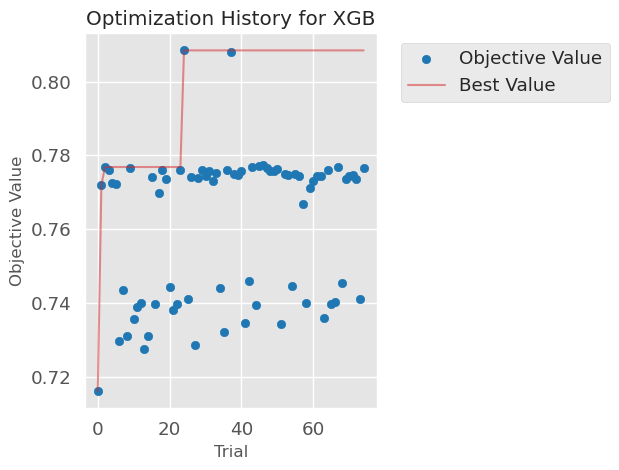

/tmp/ipykernel_996770/1106290231.py:472: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  vis.matplotlib.plot_param_importances(study)
/home/quanghung20gg/anaconda3/lib/python3.12/site-packages/optuna/importance/_fanova/_tree.py:137: RuntimeWarning: invalid value encountered in divide
  weights = weights / active_features_cardinalities


Error plotting Optuna visualizations: 

Model: XGB on binned data

Train Set Metrics:
  Accuracy:  0.7450
  AUC:       0.8195
  Gini:      0.6389
  Precision: 0.7621
  Recall:    0.8483
  F1 Score:  0.8029

Val Set Metrics:
  Accuracy:  0.7164
  AUC:       0.7595
  Gini:      0.5189
  Precision: 0.7371
  Recall:    0.8343
  F1 Score:  0.7827

Test Set Metrics:
  Accuracy:  0.6727
  AUC:       0.7425
  Gini:      0.4851
  Precision: 0.6684
  Recall:    0.9232
  F1 Score:  0.7754


<Figure size 1200x700 with 0 Axes>

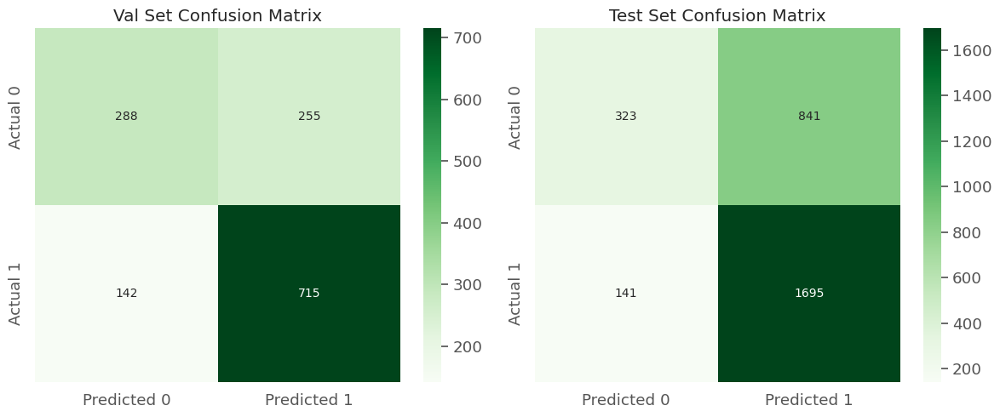

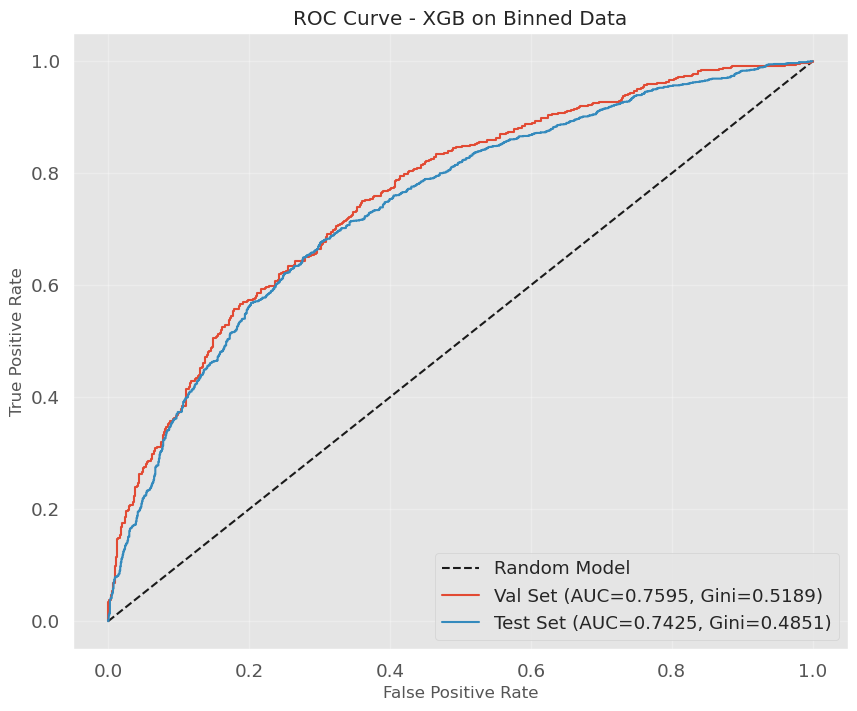

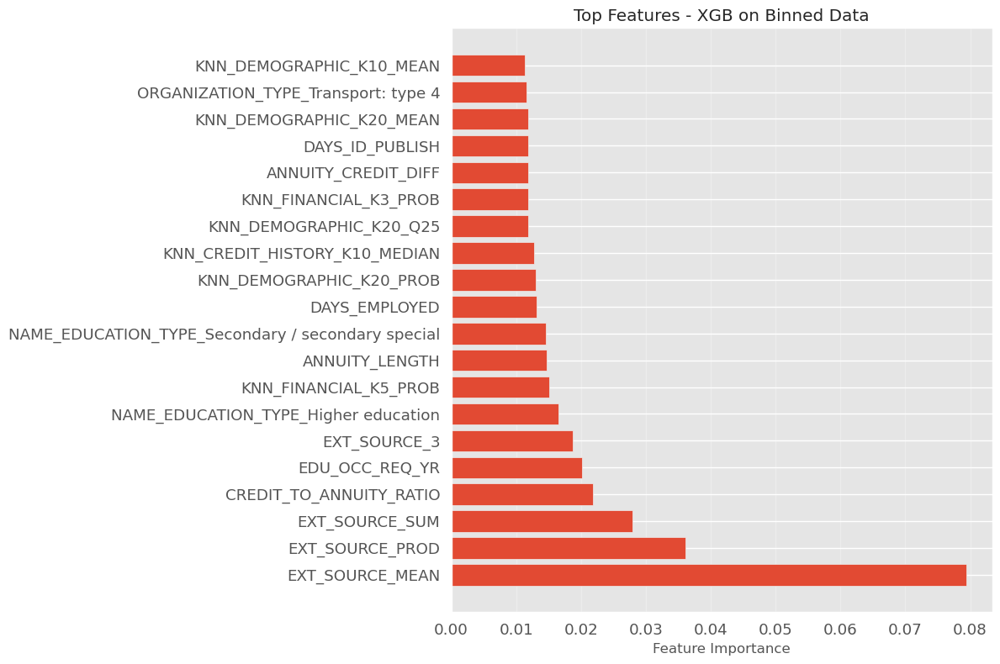

Model saved to xgb_binned_model.pkl


In [131]:
xgb_binned = CreditRiskModel(model_type='xgb', use_binned=True)
xgb_binned.train(X_train_binned_encoded, y_train_binned, X_val_binned_encoded, y_val_binned, binning_objects=binning_objects, iv_compare=iv_compare_all)
xgb_binned.evaluate(X_train_binned_encoded, y_train_binned, X_val_binned_encoded, y_val_binned, X_test_binned_encoded, y_test_binned)
xgb_binned.plot_results()
xgb_binned.save('xgb_binned_model.pkl')

/home/quanghung20gg/anaconda3/lib/python3.12/site-packages/optuna/_experimental.py:31: ExperimentalWarning: Argument ``multivariate`` is an experimental feature. The interface can change in the future.
  warnings.warn(
[I 2025-04-14 21:57:32,358] A new study created in memory with name: credit_risk_xgb


Optimizing hyperparameters for XGB model with Optuna (75 trials)...


Hyperparameter Search:   0%|                                                 | 0/75 [00:00<?, ?it/s]/home/quanghung20gg/anaconda3/lib/python3.12/site-packages/xgboost/training.py:183: UserWarning: [21:57:32] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/quanghung20gg/anaconda3/lib/python3.12/site-packages/xgboost/training.py:183: UserWarning: [21:57:32] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/quanghung20gg/anaconda3/lib/python3.12/site-packages/xgboost/training.py:183: UserWarning: [21:57:33] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/quanghung20gg/anaconda3/lib/python3.12/site-packages/xgboost/training.py:183: UserWarning: [21:57:33] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_


Best optimization score: 0.8390
Best parameters: {'n_estimators': 439, 'learning_rate': 0.01146053501174885, 'max_depth': 6, 'subsample': 0.7996310155044513, 'colsample_bytree': 0.675055294710598, 'min_child_weight': 1, 'gamma': 1.628845005052399e-06, 'reg_alpha': 1.324025991924356e-08, 'reg_lambda': 1.928879543018633e-06, 'tree_method': 'hist', 'eval_metric': 'auc', 'use_label_encoder': False, 'random_state': 42, 'n_jobs': -1}

Training final model with best parameters...


Training Final Model:   0%|                                                 | 0/100 [00:00<?, ?it/s]/home/quanghung20gg/anaconda3/lib/python3.12/site-packages/xgboost/training.py:183: UserWarning: [22:00:01] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
Training Final Model: 100%|██████████████████████████████████████| 100/100 [00:00<00:00, 185.58it/s]

Best parameters: {'n_estimators': 439, 'learning_rate': 0.01146053501174885, 'max_depth': 6, 'subsample': 0.7996310155044513, 'colsample_bytree': 0.675055294710598, 'min_child_weight': 1, 'gamma': 1.628845005052399e-06, 'reg_alpha': 1.324025991924356e-08, 'reg_lambda': 1.928879543018633e-06, 'tree_method': 'hist', 'eval_metric': 'auc', 'use_label_encoder': False, 'random_state': 42, 'n_jobs': -1}
Training completed in 149.85 seconds

Model: XGB on binned data

Train Set Metrics:
  Accuracy:  0.8462
  AUC:       0.9359
  Gini:      0.8718
  Precision: 0.8411
  Recall:    0.9233
  F1 Score:  0.8803

Val Set Metrics:
  Accuracy:  0.6979
  AUC:       0.7562
  Gini:      0.5125
  Precision: 0.7275
  Recall:    0.8098
  F1 Score:  0.7664



/tmp/ipykernel_996770/1106290231.py:464: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  vis.matplotlib.plot_optimization_history(study)


<Figure size 1200x600 with 0 Axes>

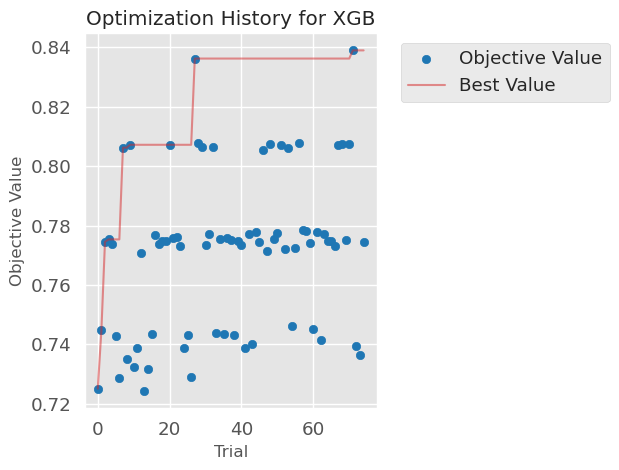

/tmp/ipykernel_996770/1106290231.py:472: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  vis.matplotlib.plot_param_importances(study)
/home/quanghung20gg/anaconda3/lib/python3.12/site-packages/optuna/importance/_fanova/_tree.py:137: RuntimeWarning: invalid value encountered in divide
  weights = weights / active_features_cardinalities


Error plotting Optuna visualizations: 

Model: XGB on binned data

Train Set Metrics:
  Accuracy:  0.8462
  AUC:       0.9359
  Gini:      0.8718
  Precision: 0.8411
  Recall:    0.9233
  F1 Score:  0.8803

Val Set Metrics:
  Accuracy:  0.6979
  AUC:       0.7562
  Gini:      0.5125
  Precision: 0.7275
  Recall:    0.8098
  F1 Score:  0.7664

Test Set Metrics:
  Accuracy:  0.6823
  AUC:       0.7241
  Gini:      0.4483
  Precision: 0.7185
  Recall:    0.7908
  F1 Score:  0.7529


<Figure size 1200x700 with 0 Axes>

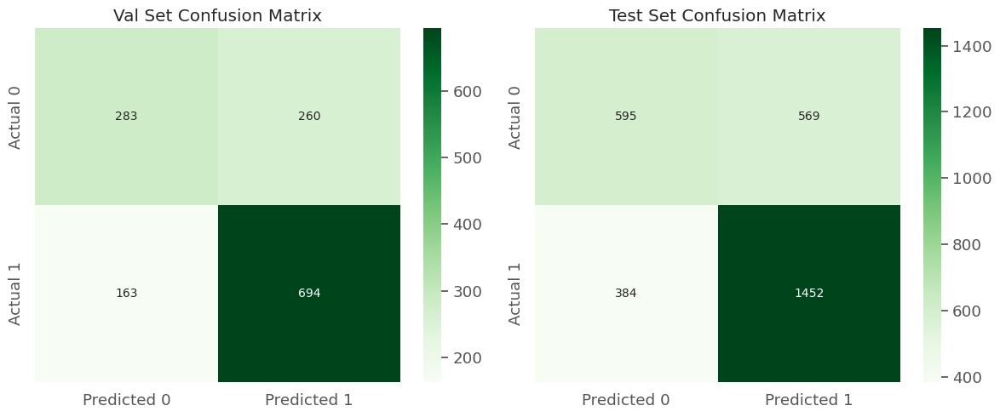

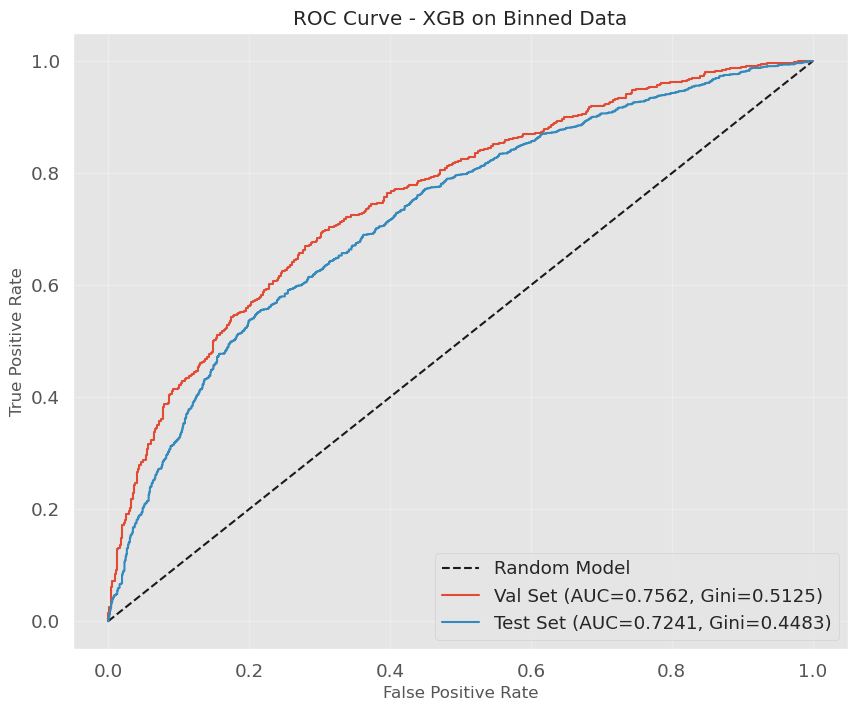

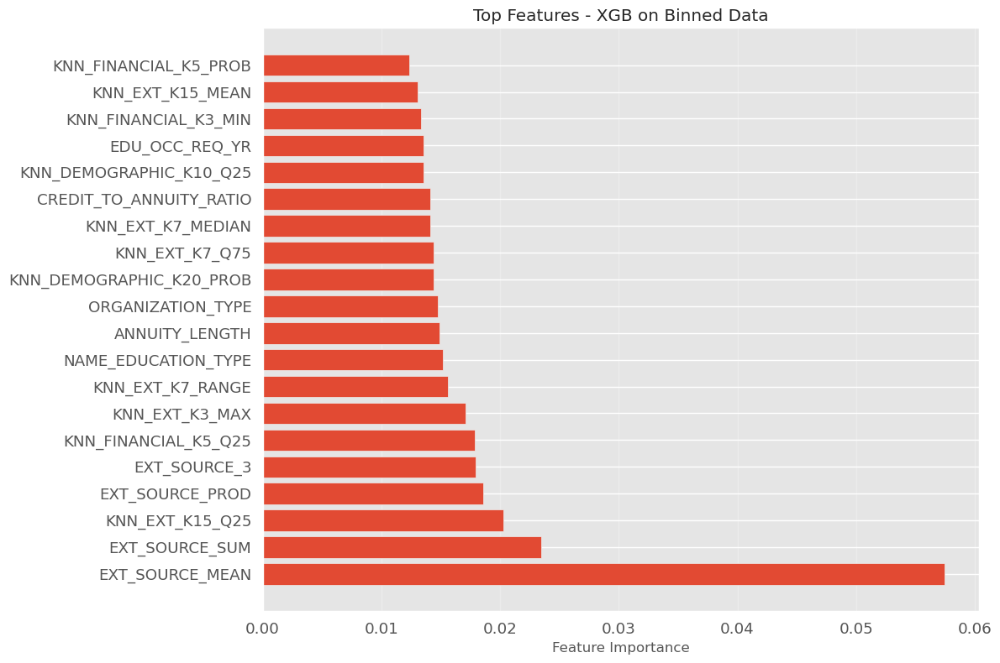

Model saved to xgb_opt_model.pkl


In [132]:
xgb_opt = CreditRiskModel(model_type='xgb', use_binned=True)
xgb_opt.train(optbinned_train, y_train_binned, optbinned_val, y_val_binned, binning_objects=optbinning_objects)
xgb_opt.evaluate(optbinned_train, y_train_binned, optbinned_val, y_val_binned, optbinning_test_binned, y_test_binned)
xgb_opt.plot_results()
xgb_opt.save('xgb_opt_model.pkl')

In [133]:
xgb_comparison = pd.DataFrame({
    'Model': ['XGBoost (Unbinned)', 'XGBoost (Binned)', 'XGBoost (OptBinned)'],
    'AUC': [xgb_unbinned.results['test_auc'], xgb_binned.results['test_auc'], xgb_opt.results['test_auc']],
    'Accuracy': [xgb_unbinned.results['test_accuracy'], xgb_binned.results['test_accuracy'], xgb_opt.results['test_accuracy']],
    'Precision': [xgb_unbinned.results['test_precision'], xgb_binned.results['test_precision'], xgb_opt.results['test_precision']],
    'Recall': [xgb_unbinned.results['test_recall'], xgb_binned.results['test_recall'], xgb_opt.results['test_recall']],
    'F1 Score': [xgb_unbinned.results['test_f1'], xgb_binned.results['test_f1'], xgb_opt.results['test_f1']],
    'Gini': [xgb_unbinned.results['test_gini'], xgb_binned.results['test_gini'], xgb_opt.results['test_gini']],
    'Training Time (s)': [xgb_unbinned.training_time, xgb_binned.training_time, xgb_opt.training_time],
})
xgb_comparison

,Model,AUC,Accuracy,Precision,Recall,F1 Score,Gini,Training Time (s)
0,XGBoost (Unbinned),0.722481,0.677333,0.702614,0.819717,0.756662,0.444962,144.535624
1,XGBoost (Binned),0.742531,0.672667,0.668375,0.923203,0.775389,0.485063,112.629656
2,XGBoost (OptBinned),0.724139,0.682333,0.718456,0.790850,0.752917,0.448278,149.847671


# SVM

/home/quanghung20gg/anaconda3/lib/python3.12/site-packages/optuna/_experimental.py:31: ExperimentalWarning: Argument ``multivariate`` is an experimental feature. The interface can change in the future.
  warnings.warn(
[I 2025-04-14 22:00:02,943] A new study created in memory with name: credit_risk_svm


Optimizing hyperparameters for SVM model with Optuna (50 trials)...


Hyperparameter Search:   0%|                                                 | 0/50 [00:00<?, ?it/s]/home/quanghung20gg/anaconda3/lib/python3.12/site-packages/sklearnex/svm/_common.py:262: RuntimeWarning: random_state does not influence oneDAL SVM results
  warnings.warn(
/home/quanghung20gg/anaconda3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but SVC was fitted without feature names
  warnings.warn(
/home/quanghung20gg/anaconda3/lib/python3.12/site-packages/sklearnex/svm/_common.py:262: RuntimeWarning: random_state does not influence oneDAL SVM results
  warnings.warn(
/home/quanghung20gg/anaconda3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but SVC was fitted without feature names
  warnings.warn(
/home/quanghung20gg/anaconda3/lib/python3.12/site-packages/sklearnex/svm/_common.py:262: RuntimeWarning: random_state does not influence oneDAL SVM results
  warnings.warn(
/home/quanghung20gg/anaconda3/lib/pyt


Best optimization score: 0.7292
Best parameters: {'C': 0.010012082239375851, 'kernel': 'linear', 'probability': True, 'random_state': 42, 'gamma': 0.16340771763447917}

Training final model with best parameters...


Training Final Model:   0%|                                                 | 0/100 [00:00<?, ?it/s]/home/quanghung20gg/anaconda3/lib/python3.12/site-packages/sklearnex/svm/_common.py:262: RuntimeWarning: random_state does not influence oneDAL SVM results
  warnings.warn(
Training Final Model: 100%|██████████████████████████████████████| 100/100 [00:00<00:00, 335.63it/s]


Applying isotonic probability calibration...
Probability calibration applied.
Best parameters: {'C': 0.010012082239375851, 'kernel': 'linear', 'probability': True, 'random_state': 42, 'gamma': 0.16340771763447917}
Training completed in 1834.83 seconds

Model: SVM on unbinned data

Train Set Metrics:
  Accuracy:  0.7004
  AUC:       0.7413
  Gini:      0.4825
  Precision: 0.7373
  Recall:    0.7932
  F1 Score:  0.7642

Val Set Metrics:
  Accuracy:  0.6907
  AUC:       0.7422
  Gini:      0.4845
  Precision: 0.7241
  Recall:    0.7993
  F1 Score:  0.7598


/tmp/ipykernel_996770/1106290231.py:464: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  vis.matplotlib.plot_optimization_history(study)


<Figure size 1200x600 with 0 Axes>

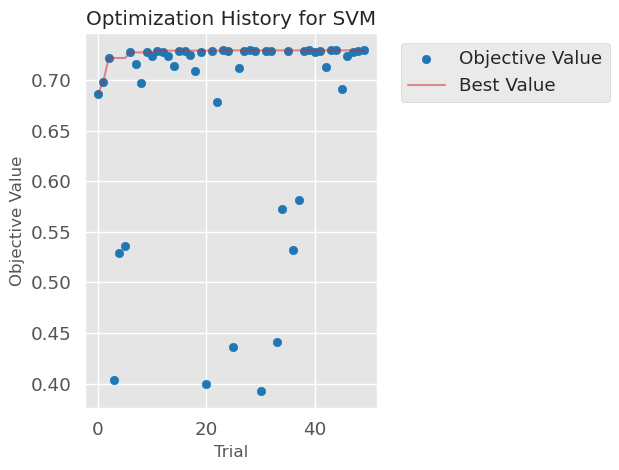

/tmp/ipykernel_996770/1106290231.py:472: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  vis.matplotlib.plot_param_importances(study)
/home/quanghung20gg/anaconda3/lib/python3.12/site-packages/optuna/importance/_fanova/_tree.py:137: RuntimeWarning: invalid value encountered in divide
  weights = weights / active_features_cardinalities


Error plotting Optuna visualizations: 

Model: SVM on unbinned data

Train Set Metrics:
  Accuracy:  0.7004
  AUC:       0.7413
  Gini:      0.4825
  Precision: 0.7373
  Recall:    0.7932
  F1 Score:  0.7642

Val Set Metrics:
  Accuracy:  0.6907
  AUC:       0.7422
  Gini:      0.4845
  Precision: 0.7241
  Recall:    0.7993
  F1 Score:  0.7598

Test Set Metrics:
  Accuracy:  0.6810
  AUC:       0.7148
  Gini:      0.4297
  Precision: 0.7267
  Recall:    0.7674
  F1 Score:  0.7465


<Figure size 1200x700 with 0 Axes>

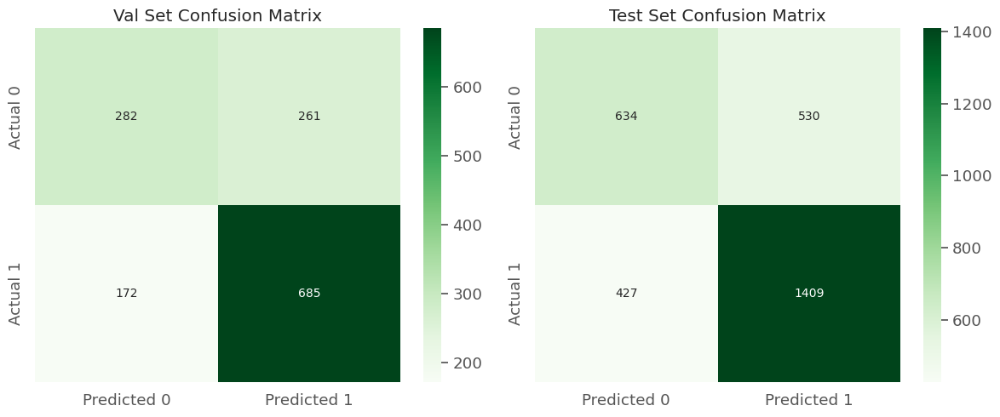

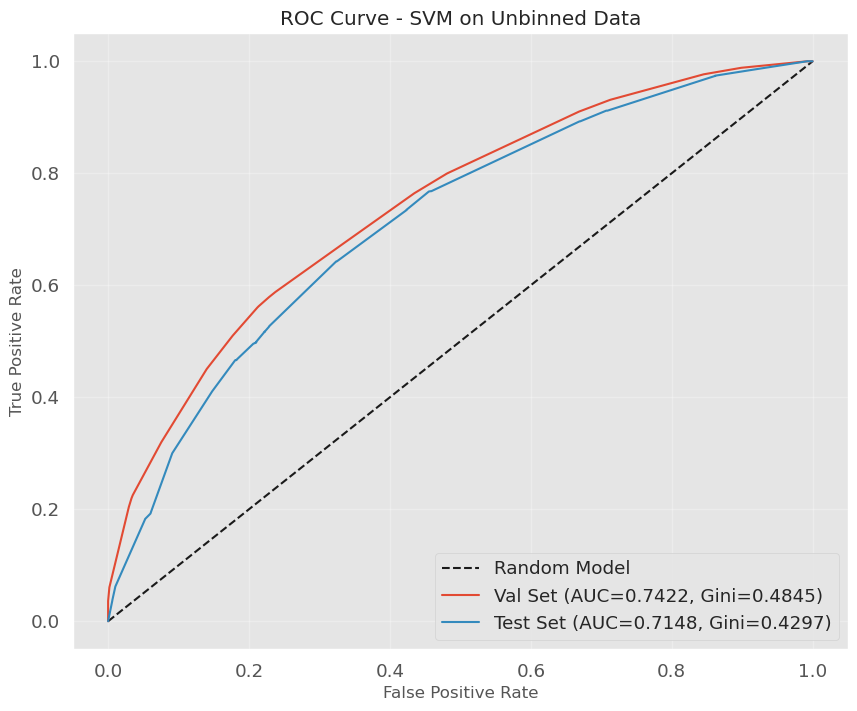

Model saved to svm_unbinned_model.pkl


In [134]:
svm_unbinned = CreditRiskModel(model_type='svm', use_binned=False)
svm_unbinned.train(X_train_unbinned_scaled, y_train_unbinned, X_val_unbinned_scaled, y_val_unbinned)
svm_unbinned.evaluate(X_train_unbinned_scaled, y_train_unbinned, X_val_unbinned_scaled, y_val_unbinned, X_test_unbinned_scaled, y_test_unbinned)
svm_unbinned.plot_results()
svm_unbinned.save('svm_unbinned_model.pkl')

/home/quanghung20gg/anaconda3/lib/python3.12/site-packages/optuna/_experimental.py:31: ExperimentalWarning: Argument ``multivariate`` is an experimental feature. The interface can change in the future.
  warnings.warn(
[I 2025-04-14 22:30:38,434] A new study created in memory with name: credit_risk_svm


Optimizing hyperparameters for SVM model with Optuna (50 trials)...


Hyperparameter Search:   0%|                                                 | 0/50 [00:00<?, ?it/s]/home/quanghung20gg/anaconda3/lib/python3.12/site-packages/sklearnex/svm/_common.py:262: RuntimeWarning: random_state does not influence oneDAL SVM results
  warnings.warn(
/home/quanghung20gg/anaconda3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but SVC was fitted without feature names
  warnings.warn(
/home/quanghung20gg/anaconda3/lib/python3.12/site-packages/sklearnex/svm/_common.py:262: RuntimeWarning: random_state does not influence oneDAL SVM results
  warnings.warn(
/home/quanghung20gg/anaconda3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but SVC was fitted without feature names
  warnings.warn(
/home/quanghung20gg/anaconda3/lib/python3.12/site-packages/sklearnex/svm/_common.py:262: RuntimeWarning: random_state does not influence oneDAL SVM results
  warnings.warn(
/home/quanghung20gg/anaconda3/lib/pyt


Best optimization score: 0.8073
Best parameters: {'C': 0.049949649059430265, 'kernel': 'linear', 'probability': True, 'random_state': 42, 'gamma': 'auto'}

Training final model with best parameters...


Training Final Model:   0%|                                                 | 0/100 [00:00<?, ?it/s]/home/quanghung20gg/anaconda3/lib/python3.12/site-packages/sklearnex/svm/_common.py:262: RuntimeWarning: random_state does not influence oneDAL SVM results
  warnings.warn(
Training Final Model: 100%|██████████████████████████████████████| 100/100 [00:00<00:00, 313.50it/s]


Applying isotonic probability calibration...
Probability calibration applied.
Best parameters: {'C': 0.049949649059430265, 'kernel': 'linear', 'probability': True, 'random_state': 42, 'gamma': 'auto'}
Training completed in 644.57 seconds

Model: SVM on binned data

Train Set Metrics:
  Accuracy:  0.7118
  AUC:       0.7635
  Gini:      0.5270
  Precision: 0.7535
  Recall:    0.7865
  F1 Score:  0.7696

Val Set Metrics:
  Accuracy:  0.7043
  AUC:       0.7578
  Gini:      0.5155
  Precision: 0.7410
  Recall:    0.7946
  F1 Score:  0.7669


/tmp/ipykernel_996770/1106290231.py:464: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  vis.matplotlib.plot_optimization_history(study)


<Figure size 1200x600 with 0 Axes>

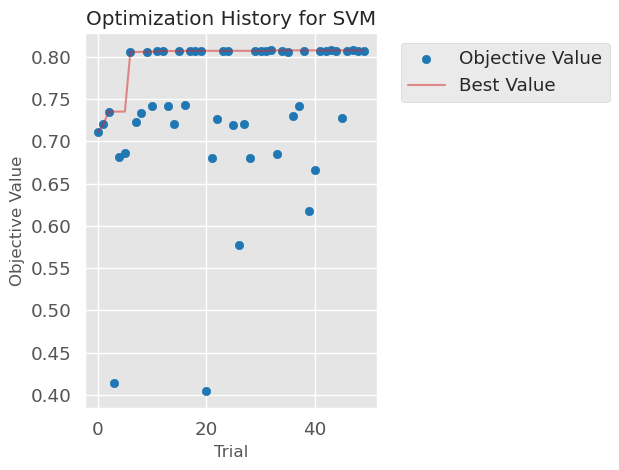

/tmp/ipykernel_996770/1106290231.py:472: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  vis.matplotlib.plot_param_importances(study)
/home/quanghung20gg/anaconda3/lib/python3.12/site-packages/optuna/importance/_fanova/_tree.py:137: RuntimeWarning: invalid value encountered in divide
  weights = weights / active_features_cardinalities


Error plotting Optuna visualizations: 

Model: SVM on binned data

Train Set Metrics:
  Accuracy:  0.7118
  AUC:       0.7635
  Gini:      0.5270
  Precision: 0.7535
  Recall:    0.7865
  F1 Score:  0.7696

Val Set Metrics:
  Accuracy:  0.7043
  AUC:       0.7578
  Gini:      0.5155
  Precision: 0.7410
  Recall:    0.7946
  F1 Score:  0.7669

Test Set Metrics:
  Accuracy:  0.6923
  AUC:       0.7397
  Gini:      0.4793
  Precision: 0.7371
  Recall:    0.7729
  F1 Score:  0.7546


<Figure size 1200x700 with 0 Axes>

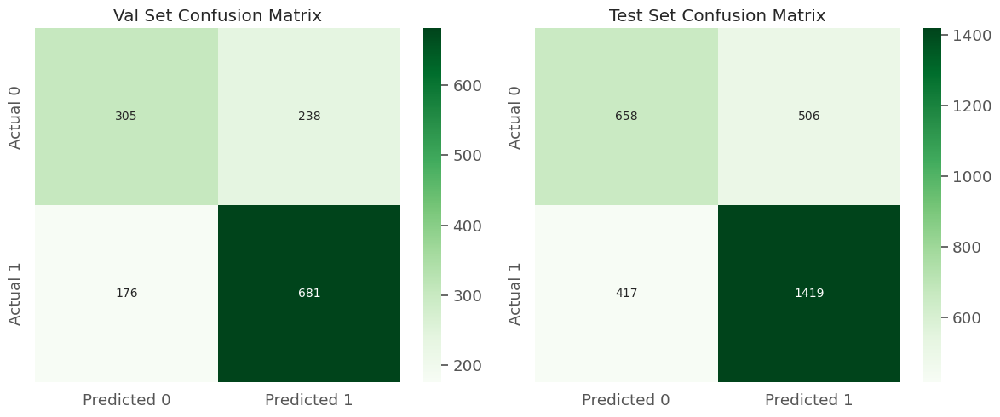

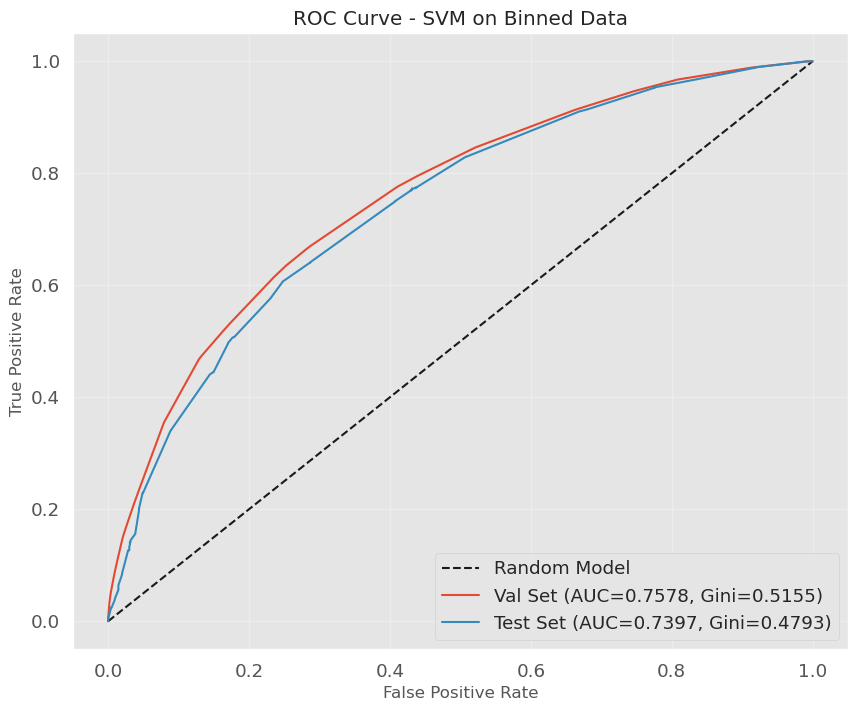

Model saved to svm_binned_model.pkl


In [135]:
svm_binned = CreditRiskModel(model_type='svm', use_binned=True)
svm_binned.train(X_train_binned_encoded, y_train_binned, X_val_binned_encoded, y_val_binned, binning_objects=binning_objects, iv_compare=iv_compare_all)
svm_binned.evaluate(X_train_binned_encoded, y_train_binned, X_val_binned_encoded, y_val_binned, X_test_binned_encoded, y_test_binned)
svm_binned.plot_results()
svm_binned.save('svm_binned_model.pkl')

/home/quanghung20gg/anaconda3/lib/python3.12/site-packages/optuna/_experimental.py:31: ExperimentalWarning: Argument ``multivariate`` is an experimental feature. The interface can change in the future.
  warnings.warn(
[I 2025-04-14 22:41:23,644] A new study created in memory with name: credit_risk_svm


Optimizing hyperparameters for SVM model with Optuna (50 trials)...


Hyperparameter Search:   0%|                                                 | 0/50 [00:00<?, ?it/s]/home/quanghung20gg/anaconda3/lib/python3.12/site-packages/sklearnex/svm/_common.py:262: RuntimeWarning: random_state does not influence oneDAL SVM results
  warnings.warn(
/home/quanghung20gg/anaconda3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but SVC was fitted without feature names
  warnings.warn(
/home/quanghung20gg/anaconda3/lib/python3.12/site-packages/sklearnex/svm/_common.py:262: RuntimeWarning: random_state does not influence oneDAL SVM results
  warnings.warn(
/home/quanghung20gg/anaconda3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but SVC was fitted without feature names
  warnings.warn(
/home/quanghung20gg/anaconda3/lib/python3.12/site-packages/sklearnex/svm/_common.py:262: RuntimeWarning: random_state does not influence oneDAL SVM results
  warnings.warn(
/home/quanghung20gg/anaconda3/lib/pyt


Best optimization score: 0.8088
Best parameters: {'C': 2.281128757547199, 'kernel': 'sigmoid', 'probability': True, 'random_state': 42, 'gamma': 'auto'}

Training final model with best parameters...


Training Final Model:   0%|                                                 | 0/100 [00:00<?, ?it/s]/home/quanghung20gg/anaconda3/lib/python3.12/site-packages/sklearnex/svm/_common.py:262: RuntimeWarning: random_state does not influence oneDAL SVM results
  warnings.warn(
Training Final Model: 100%|██████████████████████████████████████| 100/100 [00:00<00:00, 374.07it/s]
/tmp/ipykernel_996770/1106290231.py:464: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  vis.matplotlib.plot_optimization_history(study)


Applying isotonic probability calibration...
Probability calibration applied.
Best parameters: {'C': 2.281128757547199, 'kernel': 'sigmoid', 'probability': True, 'random_state': 42, 'gamma': 'auto'}
Training completed in 262.88 seconds

Model: SVM on binned data

Train Set Metrics:
  Accuracy:  0.7048
  AUC:       0.7540
  Gini:      0.5080
  Precision: 0.7466
  Recall:    0.7838
  F1 Score:  0.7648

Val Set Metrics:
  Accuracy:  0.7014
  AUC:       0.7592
  Gini:      0.5183
  Precision: 0.7399
  Recall:    0.7900
  F1 Score:  0.7641


<Figure size 1200x600 with 0 Axes>

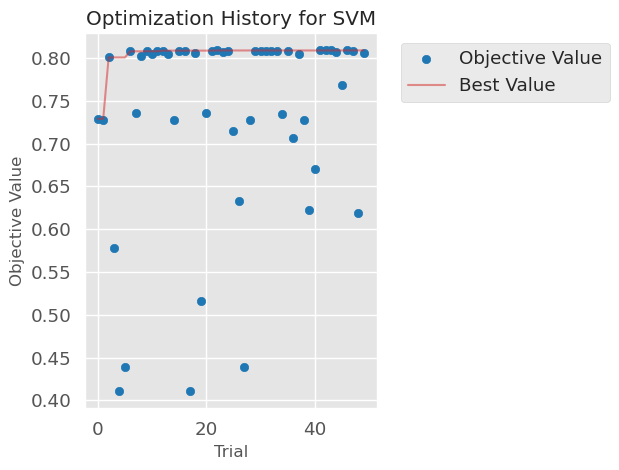

/tmp/ipykernel_996770/1106290231.py:472: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  vis.matplotlib.plot_param_importances(study)
/home/quanghung20gg/anaconda3/lib/python3.12/site-packages/optuna/importance/_fanova/_tree.py:137: RuntimeWarning: invalid value encountered in divide
  weights = weights / active_features_cardinalities


Error plotting Optuna visualizations: 

Model: SVM on binned data

Train Set Metrics:
  Accuracy:  0.7048
  AUC:       0.7540
  Gini:      0.5080
  Precision: 0.7466
  Recall:    0.7838
  F1 Score:  0.7648

Val Set Metrics:
  Accuracy:  0.7014
  AUC:       0.7592
  Gini:      0.5183
  Precision: 0.7399
  Recall:    0.7900
  F1 Score:  0.7641

Test Set Metrics:
  Accuracy:  0.6877
  AUC:       0.7286
  Gini:      0.4571
  Precision: 0.7397
  Recall:    0.7554
  F1 Score:  0.7475


<Figure size 1200x700 with 0 Axes>

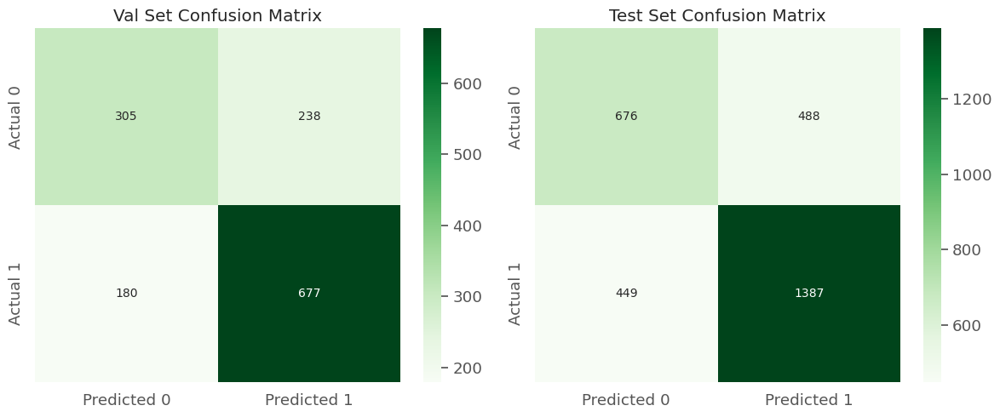

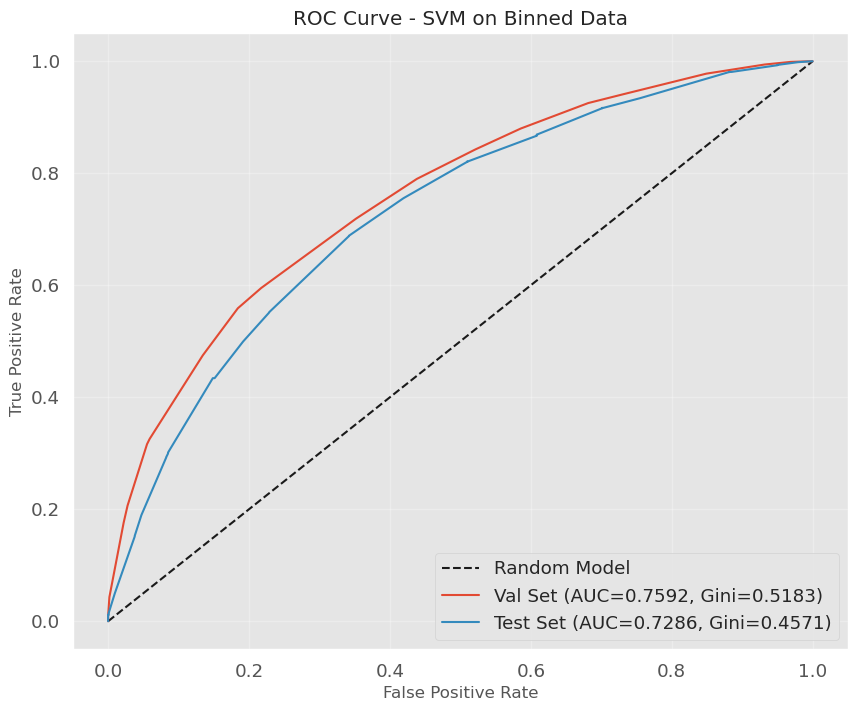

Model saved to svm_opt_model.pkl


In [136]:
svm_opt = CreditRiskModel(model_type='svm', use_binned=True)
svm_opt.train(optbinned_train, y_train_binned, optbinned_val, y_val_binned, binning_objects=optbinning_objects)
svm_opt.evaluate(optbinned_train, y_train_binned, optbinned_val, y_val_binned, optbinning_test_binned, y_test_binned)
svm_opt.plot_results()
svm_opt.save('svm_opt_model.pkl')

In [137]:
svm_comparison = pd.DataFrame({
    'Model': ['SVM (Unbinned)', 'SVM (Binned)', 'SVM (OptBinned)'],
    'AUC': [svm_unbinned.results['test_auc'], svm_binned.results['test_auc'], svm_opt.results['test_auc']],
    'Accuracy': [svm_unbinned.results['test_accuracy'], svm_binned.results['test_accuracy'], svm_opt.results['test_accuracy']],
    'Precision': [svm_unbinned.results['test_precision'], svm_binned.results['test_precision'], svm_opt.results['test_precision']],
    'Recall': [svm_unbinned.results['test_recall'], svm_binned.results['test_recall'], svm_opt.results['test_recall']],
    'F1 Score': [svm_unbinned.results['test_f1'], svm_binned.results['test_f1'], svm_opt.results['test_f1']],
    'Gini': [svm_unbinned.results['test_gini'], svm_binned.results['test_gini'], svm_opt.results['test_gini']],
    'Training Time (s)': [svm_unbinned.training_time, svm_binned.training_time, svm_opt.training_time],
})
svm_comparison

,Model,AUC,Accuracy,Precision,Recall,F1 Score,Gini,Training Time (s)
0,SVM (Unbinned),0.714846,0.681000,0.726663,0.767429,0.746490,0.429692,1834.830291
1,SVM (Binned),0.739670,0.692333,0.737143,0.772876,0.754587,0.479341,644.573488
2,SVM (OptBinned),0.728573,0.687667,0.739733,0.755447,0.747507,0.457146,262.882590


# Comparision

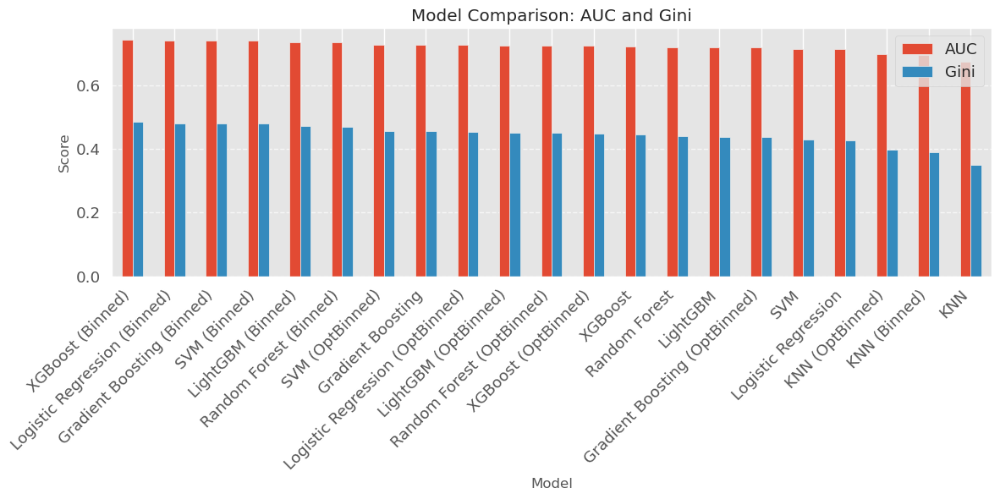

In [138]:
models = {
    'Logistic Regression': lr_unbinned,
    'Logistic Regression (Binned)': lr_binned,
    'Logistic Regression (OptBinned)': lr_opt,
    'Random Forest': rf_unbinned,
    'Random Forest (Binned)': rf_binned,
    'Random Forest (OptBinned)': rf_opt,
    'Gradient Boosting': gb_unbinned,
    'Gradient Boosting (Binned)': gb_binned,
    'Gradient Boosting (OptBinned)': gb_opt,
    'LightGBM': lgb_unbinned,
    'LightGBM (Binned)': lgb_binned,
    'LightGBM (OptBinned)': lgb_opt,
    'XGBoost': xgb_unbinned,
    'XGBoost (Binned)': xgb_binned,
    'XGBoost (OptBinned)': xgb_opt,
    'KNN': knn_unbinned,
    'KNN (Binned)': knn_binned,
    'KNN (OptBinned)': knn_opt,
    'SVM': svm_unbinned,
    'SVM (Binned)': svm_binned,
    'SVM (OptBinned)': svm_opt,
}

comparison_df = pd.DataFrame({
    'Model': [],
    'Accuracy':[],
    'Precision': [],
    'Recall': [],
    'F1 Score': [],
    'AUC': [],
    'Gini': [],
    'Training Time (s)': []
})

for model_name, model in models.items():
    if model.results:
        new_row = pd.DataFrame({
            'Model': [model_name],
            'Accuracy': [model.results.get('test_accuracy', None)],
            'Precision': [model.results.get('test_precision', None)],
            'Recall': [model.results.get('test_recall', None)],
            'F1 Score': [model.results.get('test_f1', None)],
            'AUC': [model.results.get('test_auc', None)],
            'Gini': [model.results.get('test_gini', None)],
            'Training Time (s)': [model.training_time]
        })
        comparison_df = pd.concat([comparison_df, new_row], ignore_index=True)
comparison_df = comparison_df.sort_values(by='AUC', ascending=False)
comparison_df.reset_index(drop=True, inplace=True)

comparison_df
comparison_df.plot(
    x='Model', 
    y=['AUC', 'Gini'], 
    kind='bar', 
    figsize=(12, 6), 
    title='Model Comparison: AUC and Gini'
)
plt.ylabel('Score')
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

In [ ]:
best_model_name = comparison_df.loc['AUC'].idxmax()
best_model = models[best_model_name]

print(f"\nBest model: {best_model_name} with AUC = {comparison_df.loc['AUC', best_model_name]:.4f}")